DATA PREPROCESSING 

In [202]:
!pip install yfinance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [203]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
from datetime import datetime
import datetime
import math
# extract data from various Internet sources into a pandas DataFrame
import pandas_datareader as web

In [204]:
import yfinance as yf
import datetime

start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

ticker = 'NOW'
df_now = yf.download(ticker, start=start, end=end)

# Reset the index to make 'Date' a column in the DataFrame
df_now = df_now.reset_index()

print(df_now.head())

df_now.to_csv('now_1.csv')

[*********************100%***********************]  1 of 1 completed
        Date        Open        High         Low       Close   Adj Close  \
0 2018-01-02  131.000000  132.350006  130.139999  131.729996  131.729996   
1 2018-01-03  132.000000  133.250000  131.740005  132.910004  132.910004   
2 2018-01-04  133.880005  135.089996  133.779999  133.850006  133.850006   
3 2018-01-05  134.949997  135.130005  133.899994  135.009995  135.009995   
4 2018-01-08  135.050003  136.089996  134.869995  135.300003  135.300003   

    Volume  
0  1282700  
1  1580900  
2  1361900  
3  1183000  
4  1337200  


In [205]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200
...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500


In [206]:
df_now[df_now["Close"] == max(df_now["Close"])] 

,Date,Open,High,Low,Close,Adj Close,Volume
968,2021-11-04,690.0,707.599976,689.140015,701.72998,701.72998,833500


In [207]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as ss
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_error

In [208]:
df_fama3=pd.read_csv("F-F_Research_Data_Factors_daily.CSV",skiprows=4)
df_fama3 = df_fama3.dropna()

In [209]:
df_fama3.tail()

,Unnamed: 0,Mkt-RF,SMB,HML,RF
25414,20230125,0.00,-0.04,0.65,0.017
25415,20230126,1.08,-0.58,0.01,0.017
25416,20230127,0.36,0.62,-1.16,0.017
25417,20230130,-1.38,-0.10,0.72,0.017
25418,20230131,1.57,0.99,-0.06,0.017


In [210]:
df_fama3.reset_index(drop = True, inplace= True)

In [211]:
print(df_fama3.columns)

Index(['Unnamed: 0', 'Mkt-RF', 'SMB', 'HML', 'RF'], dtype='object')


In [212]:
df_fama3 = df_fama3.rename(columns={"Unnamed: 0":"Date"})

In [213]:
import pandas as pd

df_fama3['Date'] = pd.to_datetime(df_fama3['Date'], format='%Y%m%d')


In [214]:
start_date = datetime.datetime(2018, 1, 1)
end_date = datetime.datetime(2023, 3, 31)

df_fama3 = df_fama3[(df_fama3.Date > start_date) & (df_fama3.Date < end_date)]


In [215]:
df_fama3

,Date,Mkt-RF,SMB,HML,RF
24140,2018-01-02,0.85,0.35,-0.21,0.006
24141,2018-01-03,0.59,-0.39,-0.19,0.006
24142,2018-01-04,0.42,-0.26,0.25,0.006
24143,2018-01-05,0.66,-0.35,-0.25,0.006
24144,2018-01-08,0.19,-0.15,0.04,0.006
...,...,...,...,...,...
25414,2023-01-25,0.00,-0.04,0.65,0.017
25415,2023-01-26,1.08,-0.58,0.01,0.017
25416,2023-01-27,0.36,0.62,-1.16,0.017
25417,2023-01-30,-1.38,-0.10,0.72,0.017


In [216]:
df_fama3.shape

(1279, 5)

In [217]:
df_fama3.index = range(0, 1279, 1)

In [218]:
df_fama3

,Date,Mkt-RF,SMB,HML,RF
0,2018-01-02,0.85,0.35,-0.21,0.006
1,2018-01-03,0.59,-0.39,-0.19,0.006
2,2018-01-04,0.42,-0.26,0.25,0.006
3,2018-01-05,0.66,-0.35,-0.25,0.006
4,2018-01-08,0.19,-0.15,0.04,0.006
...,...,...,...,...,...
1274,2023-01-25,0.00,-0.04,0.65,0.017
1275,2023-01-26,1.08,-0.58,0.01,0.017
1276,2023-01-27,0.36,0.62,-1.16,0.017
1277,2023-01-30,-1.38,-0.10,0.72,0.017


In [219]:
df_now = pd.read_csv('now_1.csv')

In [220]:
df_now.head()

,Unnamed: 0,Date,Open,High,Low,Close,Adj Close,Volume
0,0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700
1,1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900
2,2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900
3,3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000
4,4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200


In [221]:
df_now.shape

(1259, 8)

In [222]:
df_now['MktRF'] = df_fama3['Mkt-RF']
df_now['SMB'] = df_fama3['SMB']
df_now['HML'] = df_fama3['HML']
df_now['RF'] = df_fama3['RF']

In [223]:
df_now = df_now.drop('Unnamed: 0', axis = 1)


In [224]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,0.85,0.35,-0.21,0.006
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006
...,...,...,...,...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,0.51,-0.60,1.15,0.016
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,-0.51,-0.73,1.43,0.016
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,-1.23,-0.24,-0.29,0.016
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,1.87,1.26,-1.07,0.016


In [225]:
df_now['Yest_Close']  = df_now['Adj Close'].shift(1)

#Yesterday's Close Price

In [226]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,0.85,0.35,-0.21,0.006,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995
...,...,...,...,...,...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,0.51,-0.60,1.15,0.016,379.940002
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,-0.51,-0.73,1.43,0.016,381.859985
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,-1.23,-0.24,-0.29,0.016,380.640015
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,1.87,1.26,-1.07,0.016,376.049988


In [227]:
df_now['stock_return'] = (df_now['Adj Close']-df_now['Yest_Close'])/(df_now['Yest_Close'])

In [228]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,0.85,0.35,-0.21,0.006,NaN,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,0.51,-0.60,1.15,0.016,379.940002,0.005053
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,-0.51,-0.73,1.43,0.016,381.859985,-0.003195
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,-1.23,-0.24,-0.29,0.016,380.640015,-0.012059
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,1.87,1.26,-1.07,0.016,376.049988,0.036697


In [229]:
temp = df_now.drop(df_now.index[[0,1]])

In [230]:
temp.head()

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148
5,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109
6,2018-01-10,134.960007,136.410004,134.360001,136.229996,136.229996,1903700,-0.07,0.06,0.56,0.006,135.449997,0.005759


In [231]:
df_now.reset_index(drop = True, inplace= True)

In [232]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,0.85,0.35,-0.21,0.006,NaN,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,0.51,-0.60,1.15,0.016,379.940002,0.005053
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,-0.51,-0.73,1.43,0.016,381.859985,-0.003195
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,-1.23,-0.24,-0.29,0.016,380.640015,-0.012059
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,1.87,1.26,-1.07,0.016,376.049988,0.036697


In [233]:
df_now = df_now[df_now['Yest_Close'].notna()]
df_now = df_now[df_now['MktRF'].notna()]
df_now = df_now[df_now['SMB'].notna()]
df_now = df_now[df_now['HML'].notna()]
df_now = df_now[df_now['RF'].notna()]

In [234]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148
5,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,0.51,-0.60,1.15,0.016,379.940002,0.005053
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,-0.51,-0.73,1.43,0.016,381.859985,-0.003195
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,-1.23,-0.24,-0.29,0.016,380.640015,-0.012059
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,1.87,1.26,-1.07,0.016,376.049988,0.036697


In [235]:
df_now.to_csv("now_fama3_new_latest(2018-2022).csv", index=False)

<ipython-input-236-7c856b38edeb>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrmat = df_now.corr()


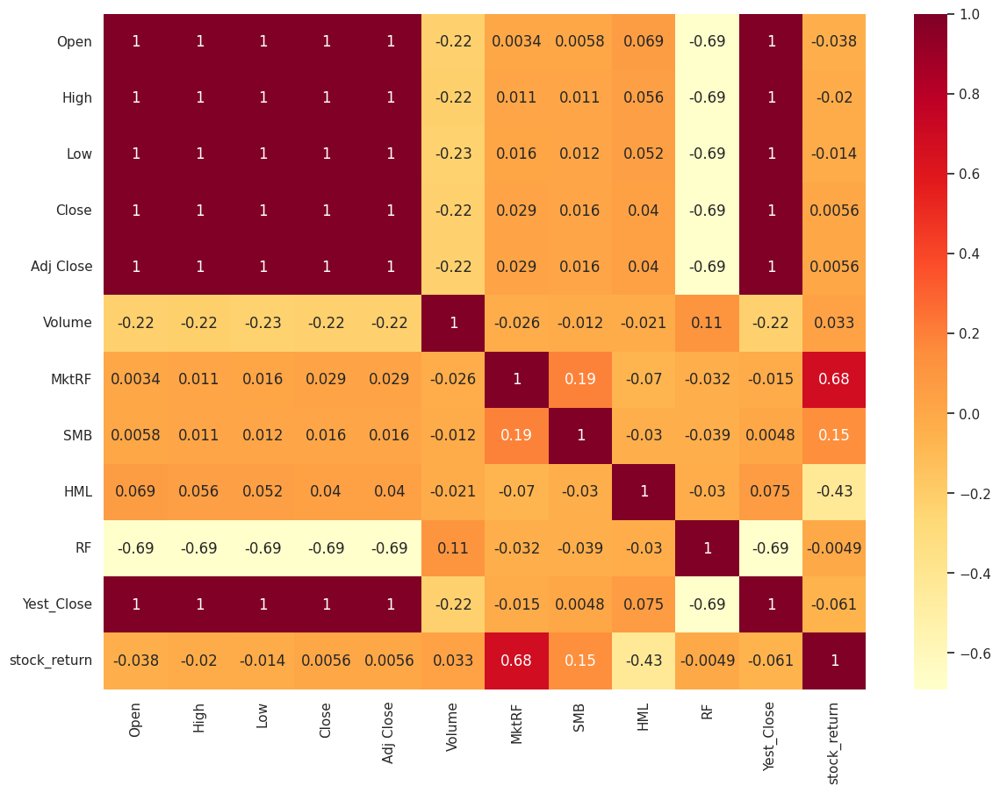

In [236]:
x = df_now.iloc[1:, 1:]
y = df_now.iloc[:, -2]
corrmat = df_now.corr()
top_corr_features = corrmat.index
plt.figure(figsize = (14,10))
hm = sns.heatmap(df_now[top_corr_features].corr(), annot = True, cmap = "YlOrRd")

EXPLORATORY DATA ANALYSIS

In [237]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
#sns.set_style('whitegrid')
%matplotlib inline

from pandas_datareader.data import DataReader
from datetime import datetime

In [238]:
import yfinance as yf
import datetime

start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)
tech_list = ['VMW', 'ADSK', 'SHOP', 'NOW']

# For loop for getting the stock data
for stock in tech_list:
    globals()[stock] = yf.download(stock, start=start, end=end)


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [239]:
company_list = [VMW, ADSK, SHOP, NOW]
company_name = ["VMWare", "Autodesk", "Shopify", "Service Now"]

for company, com_name in zip(company_list, company_name):
    company["company_name"] = com_name
    
df = pd.concat(company_list, axis=0)
df.sample(10)

,Open,High,Low,Close,Adj Close,Volume,company_name
Date,,,,,,,
2020-09-04,466.000000,470.000000,435.100006,450.350006,450.350006,2680000,Service Now
2019-01-24,150.960007,151.490005,146.899994,148.149994,121.522835,1090700,VMWare
2020-10-12,243.460007,246.119995,239.919998,242.119995,242.119995,1988000,Autodesk
2018-07-17,186.949997,191.669998,184.229996,191.199997,191.199997,1337300,Service Now
2022-10-04,109.970001,113.000000,109.970001,112.900002,112.900002,1311000,VMWare
2022-04-25,464.750000,477.380005,464.260010,472.269989,472.269989,1815100,Service Now
2019-08-29,40.224998,40.299999,39.171001,39.171001,39.171001,24074000,Shopify
2018-09-07,152.899994,154.190002,151.649994,151.929993,103.527641,904600,VMWare
2018-08-21,152.020004,152.970001,151.309998,151.679993,103.357292,1025600,VMWare


In [240]:
# Described NOW's stock data
NOW.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1.259000e+03
mean,376.542057,382.593511,370.023249,376.424940,376.424940,1.795765e+06
std,157.070780,159.227072,154.493080,156.851941,156.851941,1.403187e+06
min,131.000000,132.350006,130.139999,131.729996,131.729996,3.057000e+05
25%,242.284996,244.735001,239.000000,241.285004,241.285004,1.183400e+06
50%,383.970001,389.700012,375.679993,383.369995,383.369995,1.570500e+06
75%,508.940002,517.599976,500.660004,507.289993,507.289993,2.053800e+06
max,702.000000,707.599976,689.150024,701.729980,701.729980,3.780290e+07


In [241]:
# Information regarding NOW's stock
NOW.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1259 entries, 2018-01-02 to 2022-12-30
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          1259 non-null   float64
 1   High          1259 non-null   float64
 2   Low           1259 non-null   float64
 3   Close         1259 non-null   float64
 4   Adj Close     1259 non-null   float64
 5   Volume        1259 non-null   int64  
 6   company_name  1259 non-null   object 
dtypes: float64(5), int64(1), object(1)
memory usage: 78.7+ KB


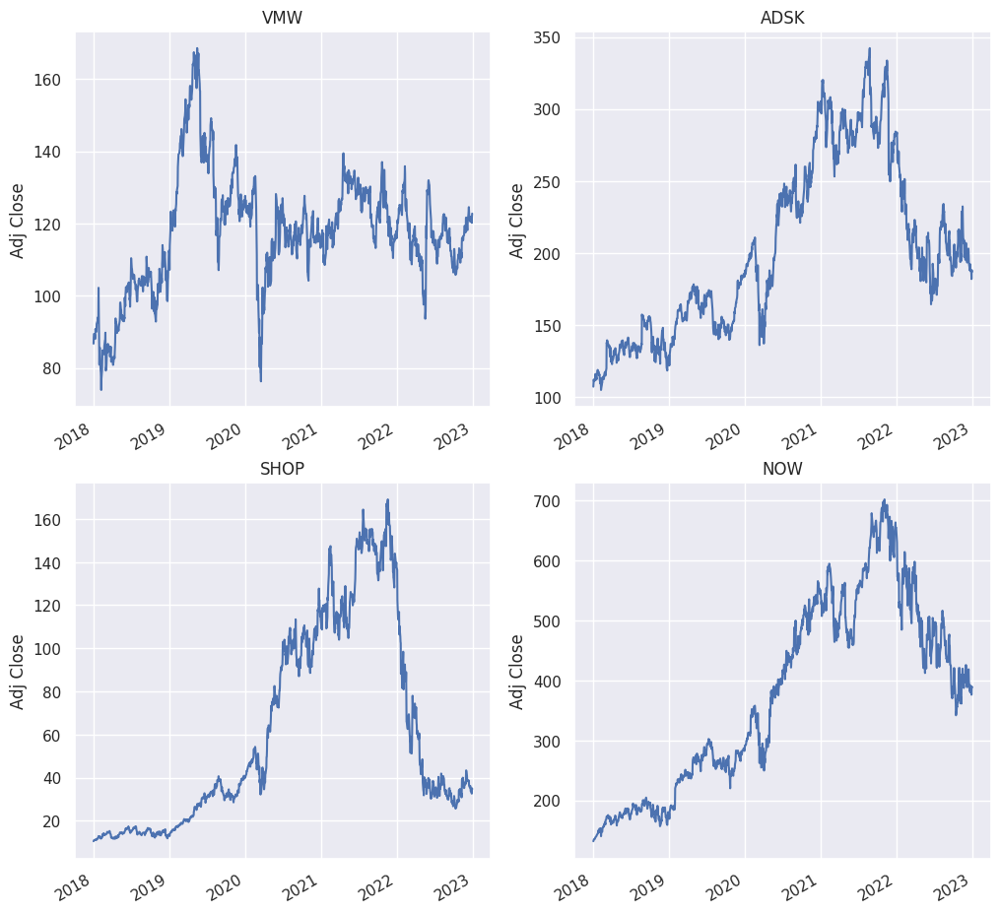

In [242]:
# To see a historical view of the closing price. For historical view we'll be using Adj. Closing price

plt.figure(figsize=(12, 8))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)
    company['Adj Close'].plot()
    plt.ylabel('Adj Close')
    plt.xlabel(None)
    plt.title(f"{tech_list[i - 1]}")

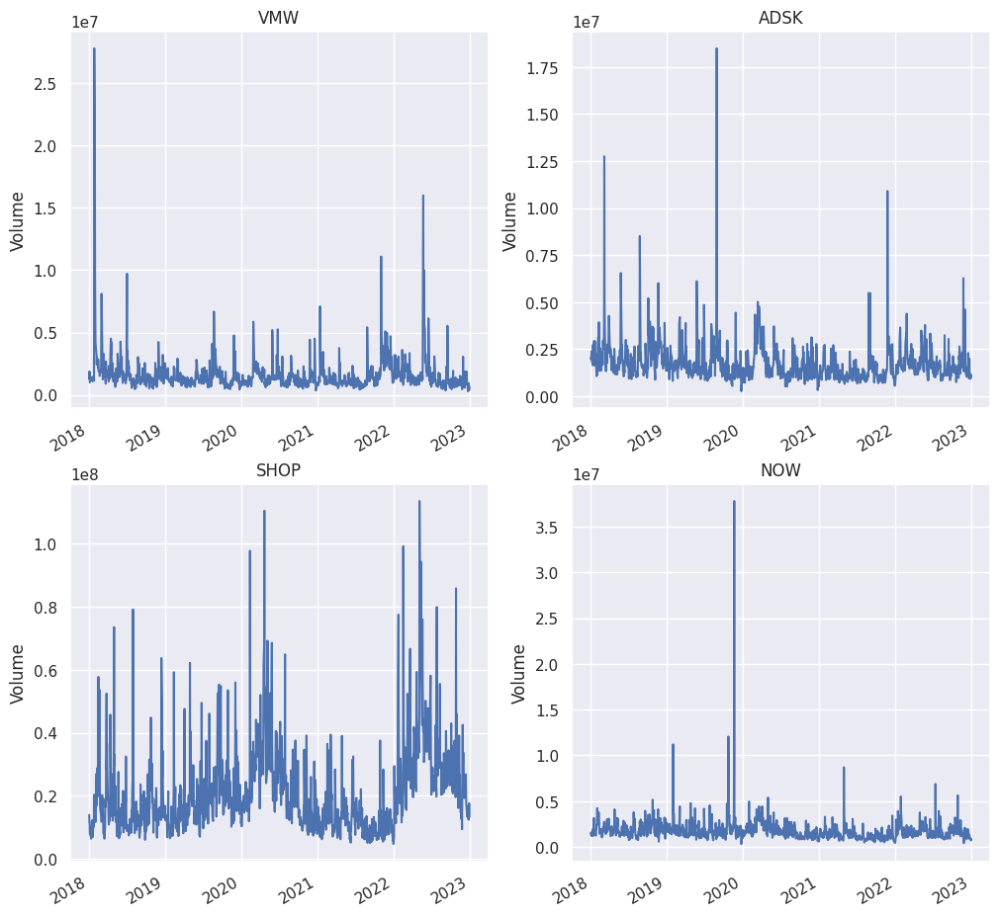

In [243]:
# For plotting the total volume of stock being traded each day
plt.figure(figsize=(12, 8))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)
    company['Volume'].plot()
    plt.ylabel('Volume')
    plt.xlabel(None)
    plt.title(f"{tech_list[i - 1]}")

In [244]:
#Moving Average
ma_day = [10, 20, 50]

for ma in ma_day:
    for company in company_list:
        column_name = f"MA for {ma} days"
        company[column_name] = company['Adj Close'].rolling(ma).mean()

In [245]:
print(NOW.columns)

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'company_name',
       'MA for 10 days', 'MA for 20 days', 'MA for 50 days'],
      dtype='object')


company_name
Autodesk       [[Axes(0.125,0.666111;0.336957x0.213889), Axes...
Service Now    [[Axes(0.125,0.666111;0.336957x0.213889), Axes...
Shopify        [[Axes(0.125,0.666111;0.336957x0.213889), Axes...
VMWare         [[Axes(0.125,0.666111;0.336957x0.213889), Axes...
dtype: object

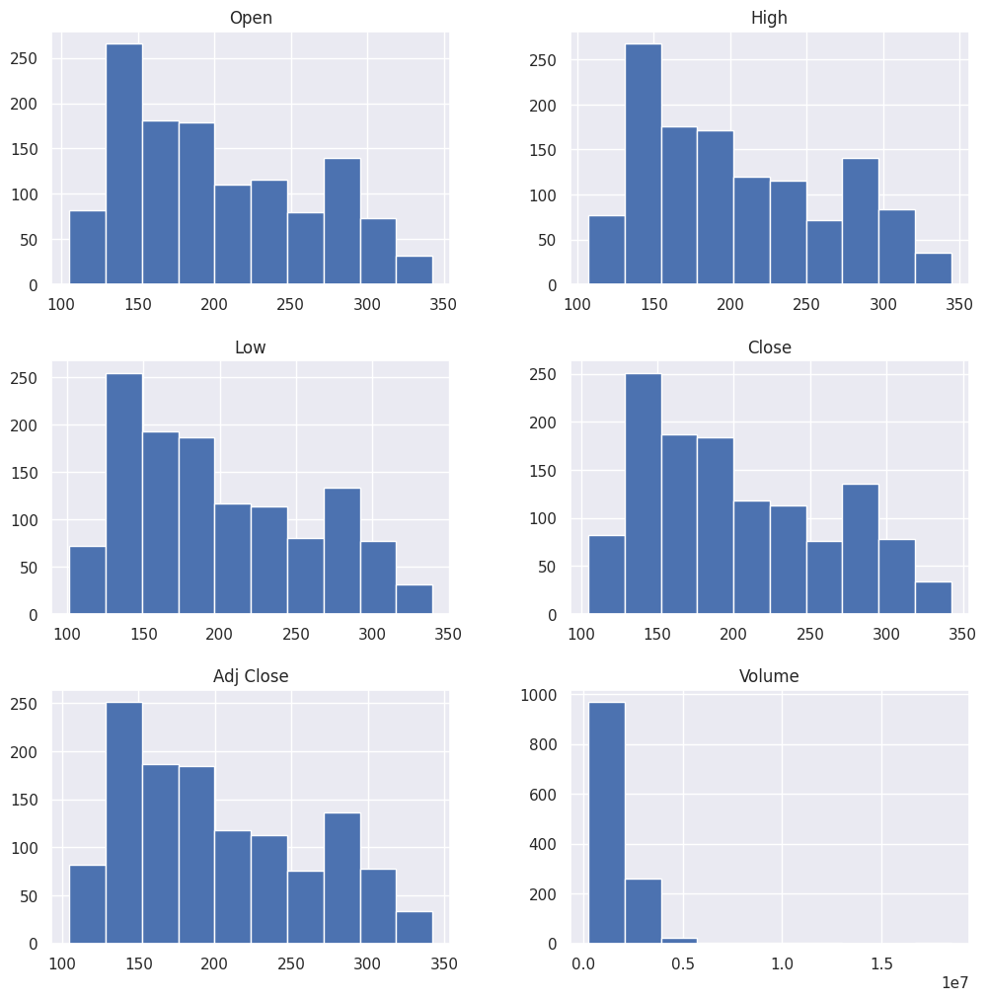

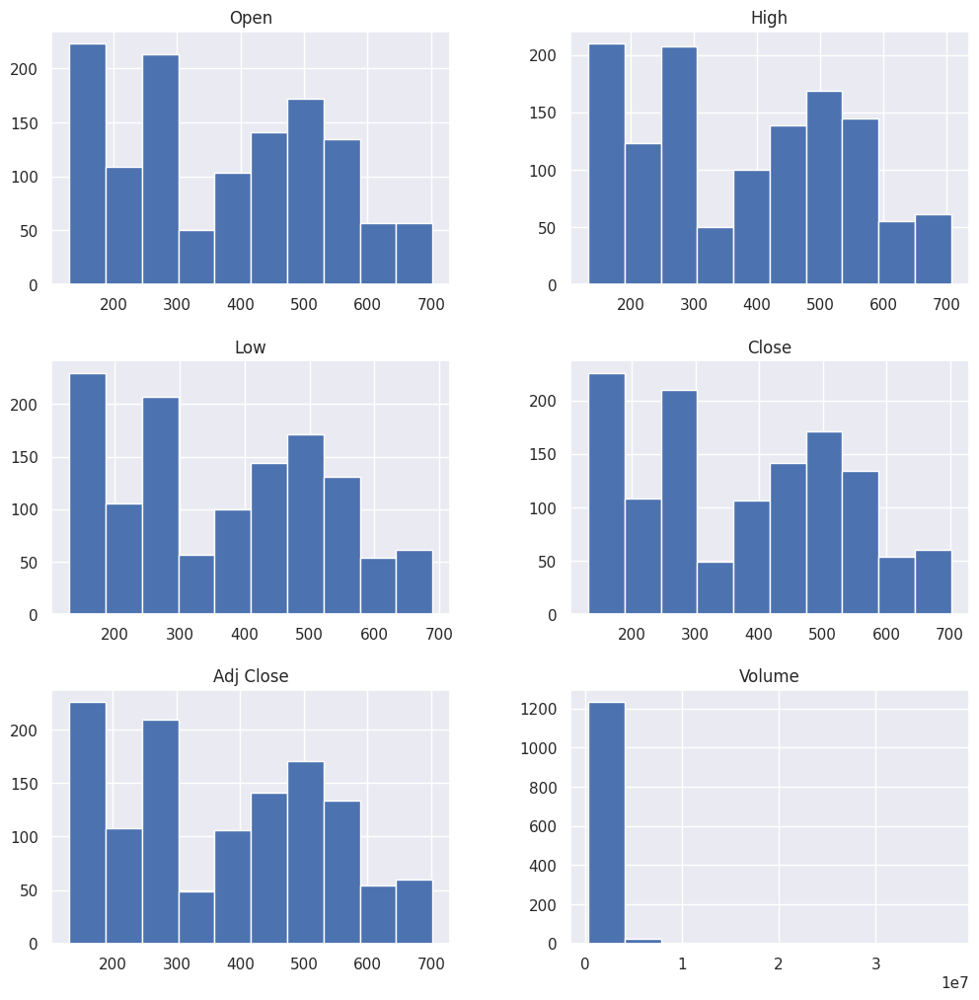

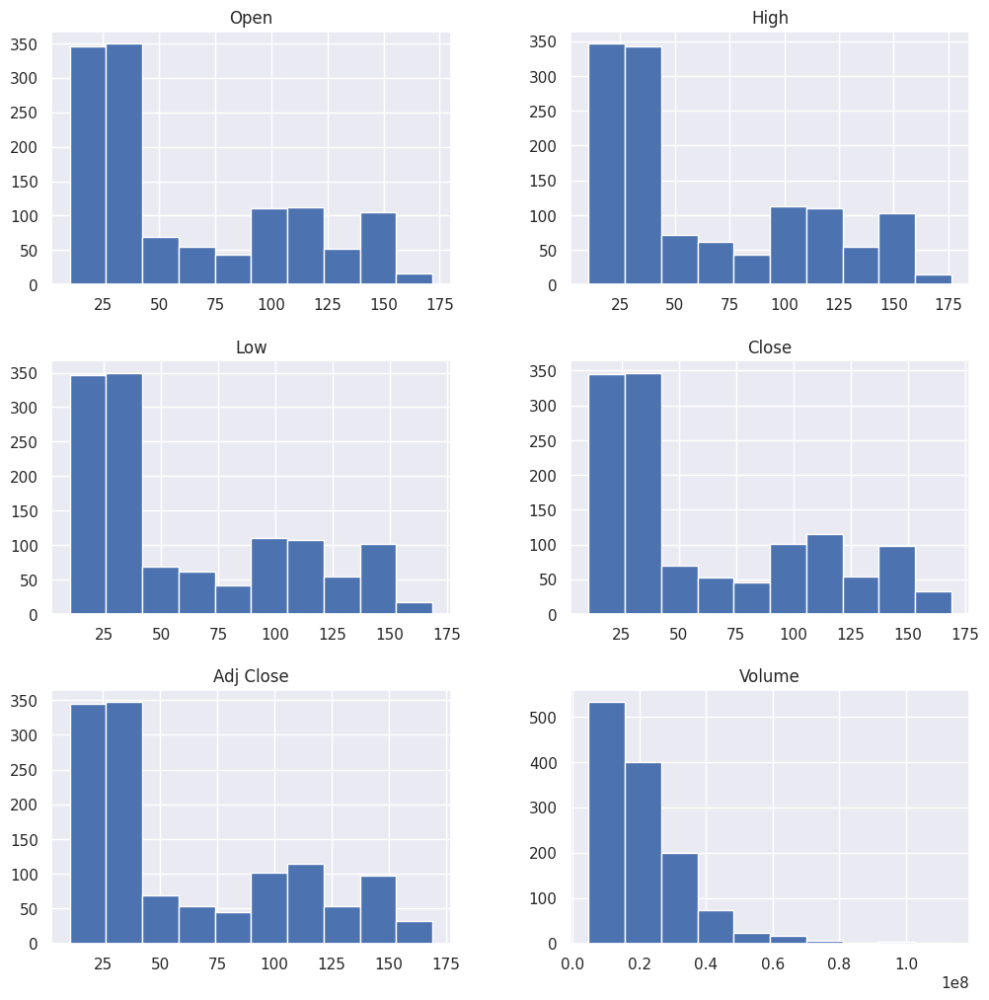

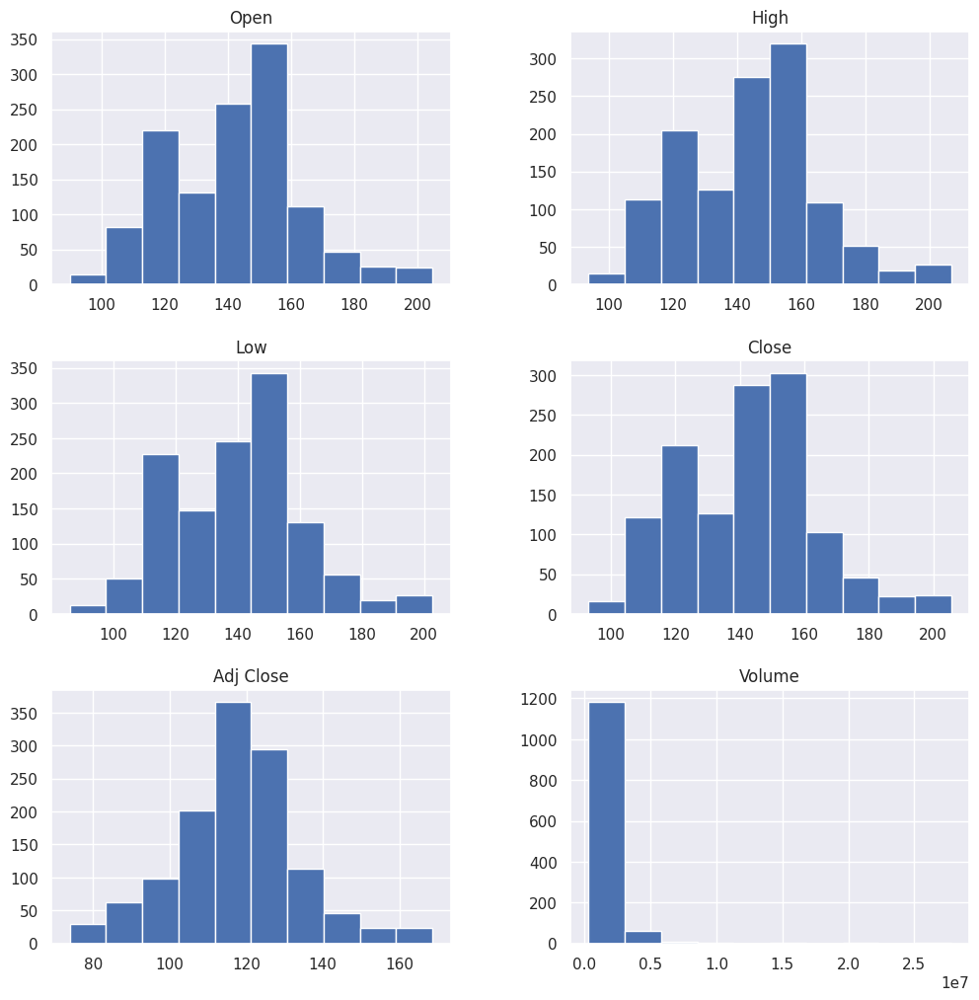

In [246]:
df.groupby("company_name").hist(figsize=(12, 12))

Below is subplots for NOW and its competitors


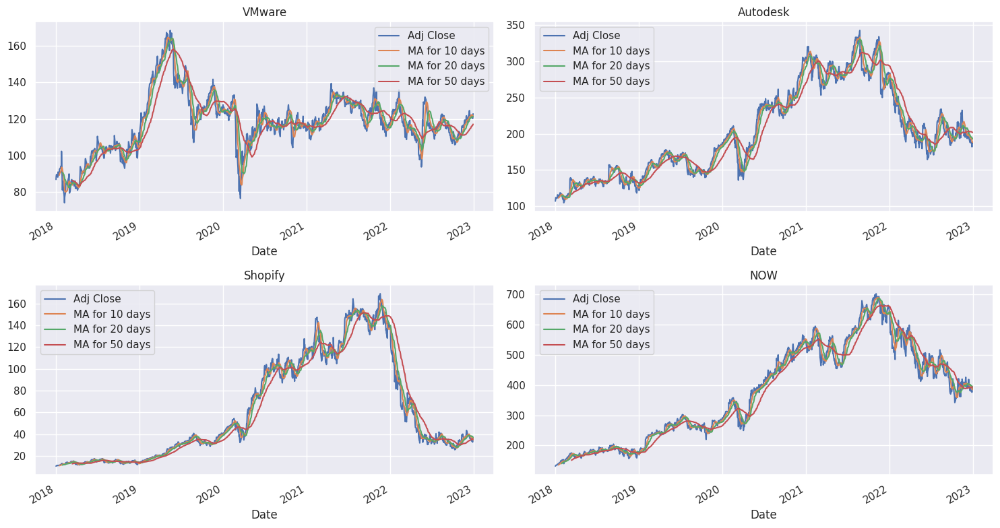

In [247]:
#Subplots for each company

fig, axes = plt.subplots(nrows=2, ncols=2)
fig.set_figheight(8)
fig.set_figwidth(15)

VMW[['Adj Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[0,0])
axes[0,0].set_title('VMware')

ADSK[['Adj Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[0,1])
axes[0,1].set_title('Autodesk')

SHOP[['Adj Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[1,0])
axes[1,0].set_title('Shopify')

NOW[['Adj Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot(ax=axes[1,1])
axes[1,1].set_title('NOW')

fig.tight_layout()

print("Below is subplots for NOW and its competitors")

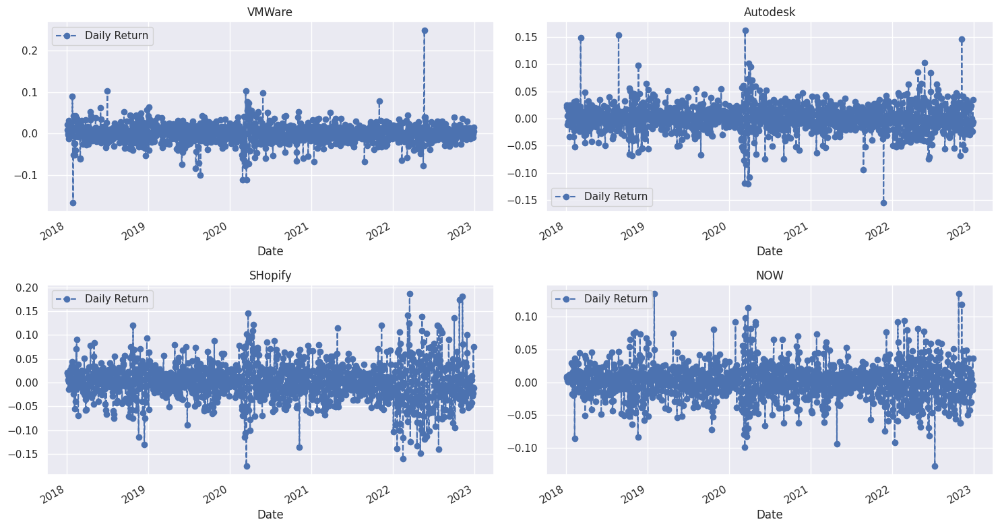

In [248]:
# We have used pct_change to find the percent change for each day
for company in company_list:
    company['Daily Return'] = company['Adj Close'].pct_change()

# To plot the daily return percentage
fig, axes = plt.subplots(nrows=2, ncols=2)
fig.set_figheight(8)
fig.set_figwidth(15)

VMW['Daily Return'].plot(ax=axes[0,0], legend=True, linestyle='--', marker='o')
axes[0,0].set_title('VMWare')

ADSK['Daily Return'].plot(ax=axes[0,1], legend=True, linestyle='--', marker='o')
axes[0,1].set_title('Autodesk')

SHOP['Daily Return'].plot(ax=axes[1,0], legend=True, linestyle='--', marker='o')
axes[1,0].set_title('SHopify')

NOW['Daily Return'].plot(ax=axes[1,1], legend=True, linestyle='--', marker='o')
axes[1,1].set_title('NOW')

fig.tight_layout()


In [249]:
company_name = np.unique(df['company_name']).tolist()

<ipython-input-250-a3902612a46c>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(company['Daily Return'].dropna(), bins=100, color='red')
<ipython-input-250-a3902612a46c>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(company['Daily Return'].dropna(), bins=100, color='red')


Here are the same percent change of daily returns but using distplot() from seaborn package to get a quick view at a univariate distibution of stocks
Here are the same percent change of daily returns but using distplot() from seaborn package to get a quick view at a univariate distibution of stocks


<ipython-input-250-a3902612a46c>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(company['Daily Return'].dropna(), bins=100, color='red')
<ipython-input-250-a3902612a46c>:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(company['Daily Return'].dropna(), bins=100, color='red')


Here are the same percent change of daily returns but using distplot() from seaborn package to get a quick view at a univariate distibution of stocks
Here are the same percent change of daily returns but using distplot() from seaborn package to get a quick view at a univariate distibution of stocks


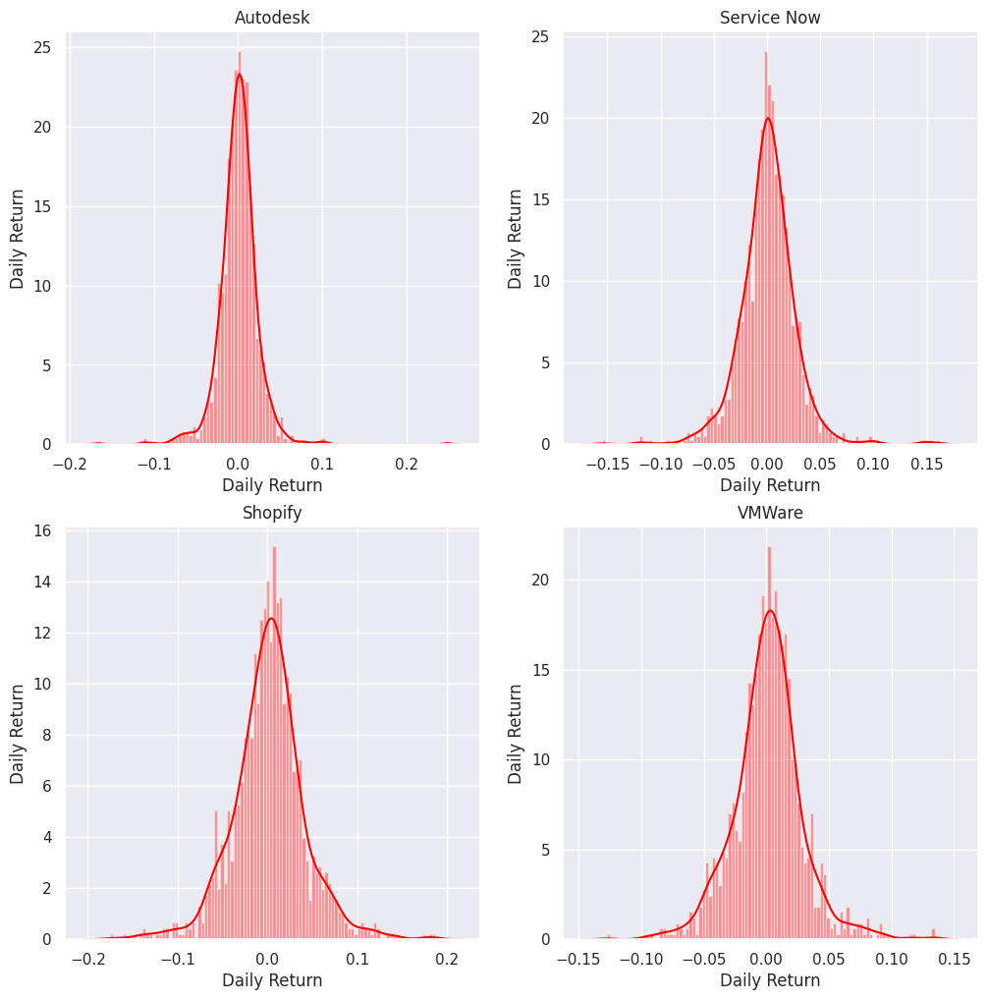

In [250]:
# To get a better view of above chart
plt.figure(figsize=(12, 12))

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)
    sns.distplot(company['Daily Return'].dropna(), bins=100, color='red')
    plt.ylabel('Daily Return')
    plt.title(f'{company_name[i - 1]}')

    print("Here are the same percent change of daily returns but using distplot() from seaborn package to get a quick view at a univariate distibution of stocks")

In [251]:
import yfinance as yf
import datetime
import pandas as pd

start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)
tech_list = ['VMW', 'ADSK', 'SHOP', 'NOW']

# Fetch the historical stock data
stock_data = {}
for stock in tech_list:
    stock_data[stock] = yf.download(stock, start=start, end=end)

# Create a new DataFrame for adjusted close prices
closing_df = pd.DataFrame({stock: data['Adj Close'] for stock, data in stock_data.items()})
closing_df.head()


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,VMW,ADSK,SHOP,NOW
Date,,,,
2018-01-02,86.737541,107.120003,10.549,131.729996
2018-01-03,88.604622,109.379997,10.775,132.910004
2018-01-04,89.429138,112.070000,10.995,133.850006
2018-01-05,89.442757,110.839996,11.058,135.009995
2018-01-08,89.197449,111.419998,11.235,135.300003


In [252]:
# Making a new DataFrame for returns
tech_rets = closing_df.pct_change()
tech_rets.head()

,VMW,ADSK,SHOP,NOW
Date,,,,
2018-01-02,NaN,NaN,NaN,NaN
2018-01-03,0.021526,0.021098,0.021424,0.008958
2018-01-04,0.009306,0.024593,0.020418,0.007072
2018-01-05,0.000152,-0.010975,0.005730,0.008666
2018-01-08,-0.002743,0.005233,0.016007,0.002148


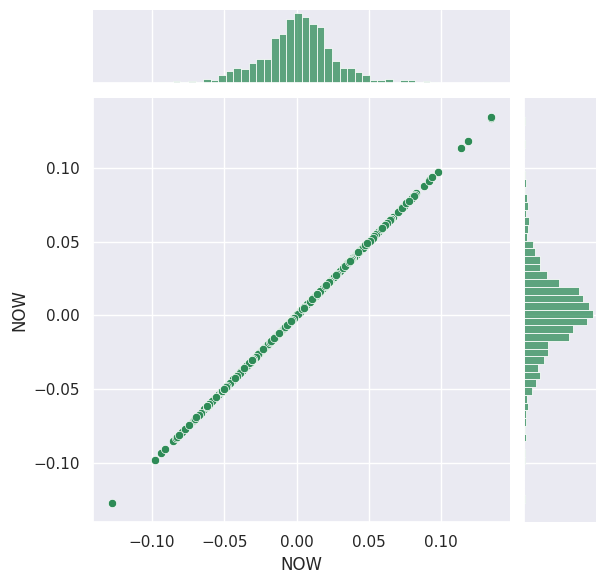

In [253]:
import seaborn as sns
# Comparing NOW to itself should show a perfectly linear relationship
# Assuming that 'tech_rets' is a DataFrame containing the data you want to plot
sns.jointplot(x='NOW', y='NOW', data=tech_rets, kind='scatter', color='seagreen')

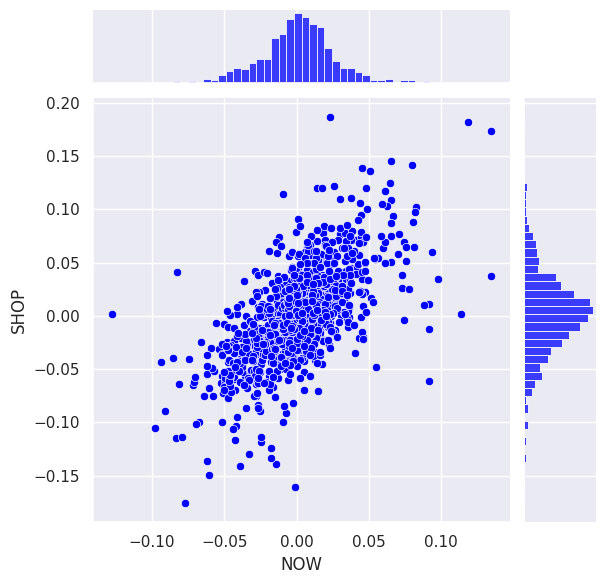

In [254]:
# To compare the daily returns of NOW and Shopify
sns.jointplot(x='NOW', y='SHOP', data=tech_rets, kind='scatter', color='BLUE')

Text(0.5, 1.05, "We used pairplot() for comparision between all 4 companies.It shows how each stock is related to each other.\n We can see that each company's stock prices are related to each other. \nChanges in stock prices of one company affects other comapany's stock prices")

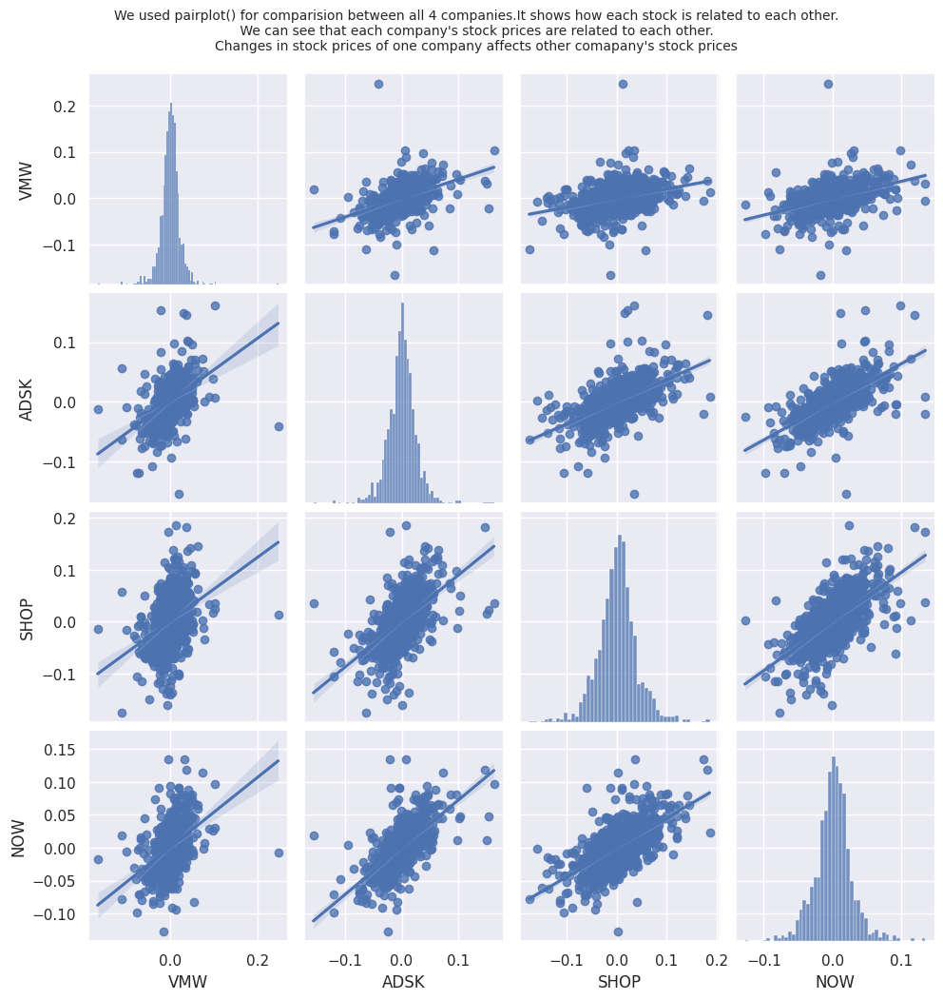

In [255]:
sns.pairplot(tech_rets, kind='reg')
plt.suptitle("We used pairplot() for comparision between all 4 companies.It shows how each stock is related to each other." + "\n " + "We can see that each company's stock prices are related to each other. " +"\n" + "Changes in stock prices of one company affects other comapany's stock prices", fontsize=10, y=1.05)

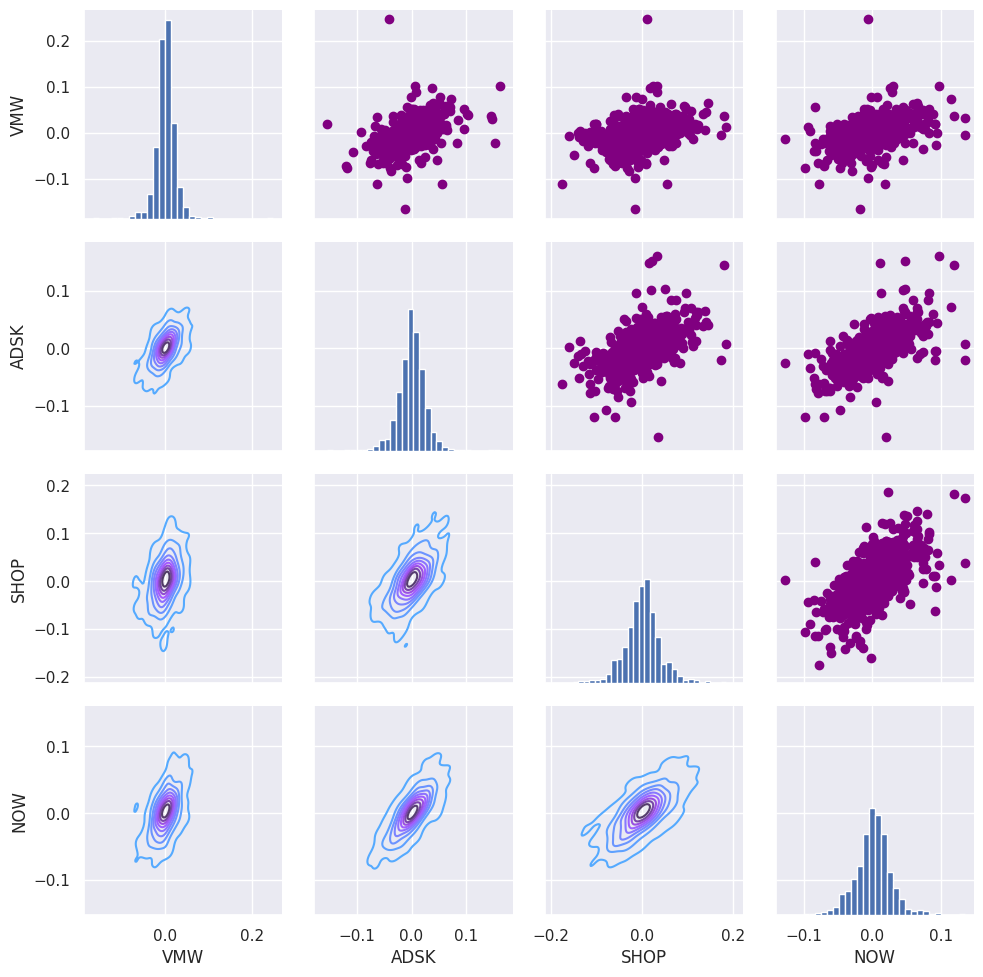

In [256]:
return_fig = sns.PairGrid(tech_rets.dropna())

return_fig.map_upper(plt.scatter, color='purple')

return_fig.map_lower(sns.kdeplot, cmap='cool_d')

return_fig.map_diag(plt.hist, bins=30)

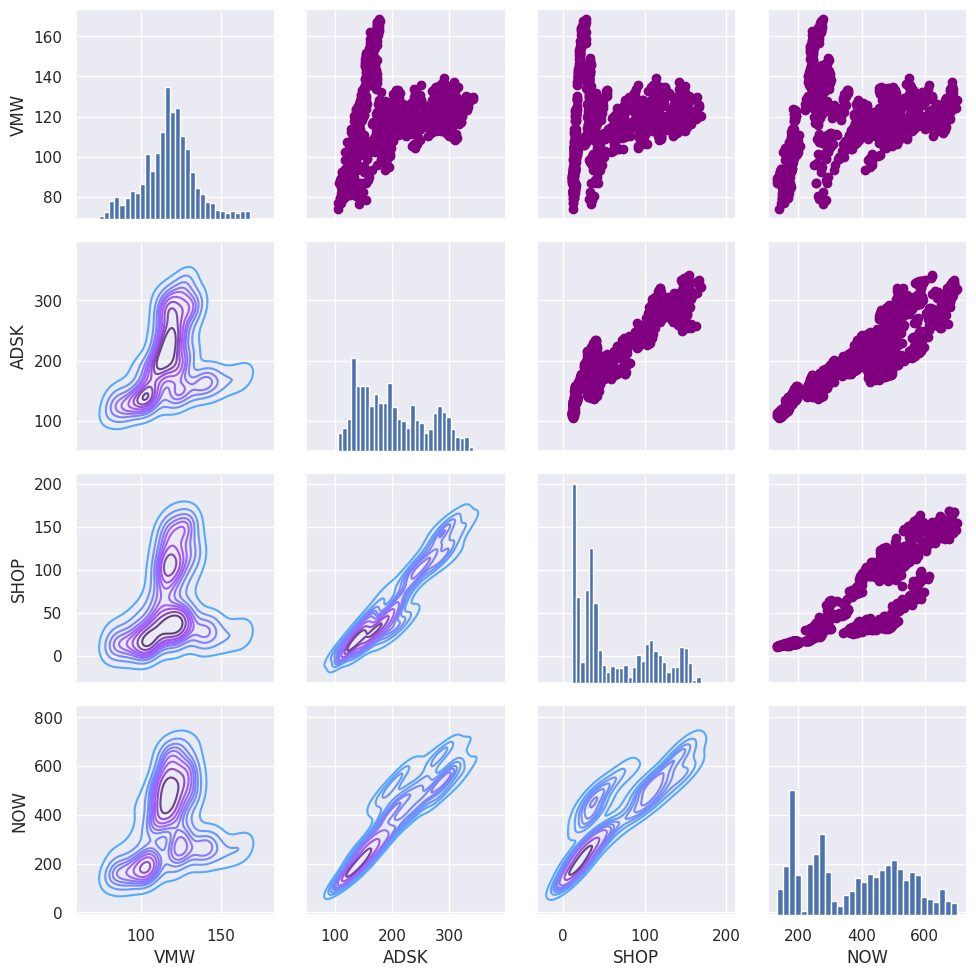

In [257]:
returns_fig = sns.PairGrid(closing_df)

returns_fig.map_upper(plt.scatter,color='purple')

returns_fig.map_lower(sns.kdeplot,cmap='cool_d')

returns_fig.map_diag(plt.hist,bins=30)

Text(0.5, 1.05, 'We use heatmap to see the corelation between daily returns of stocks from numerical point of view')

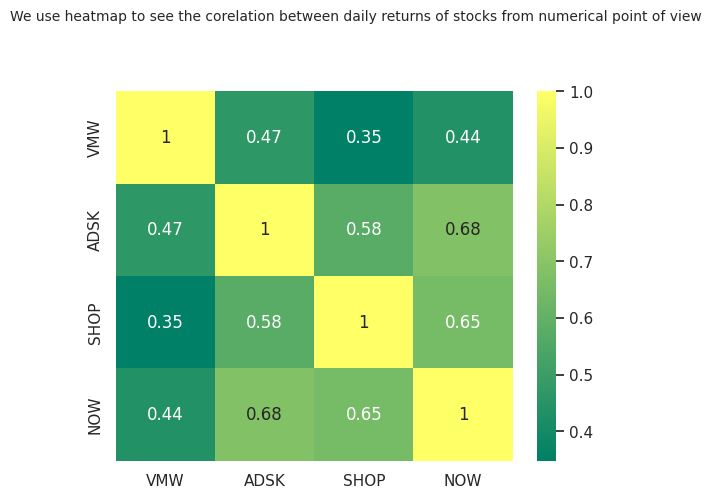

In [258]:
# Correlation plot for the daily returns
sns.heatmap(tech_rets.corr(), annot=True, cmap='summer')
plt.suptitle("We use heatmap to see the corelation between daily returns of stocks from numerical point of view", fontsize=10, y=1.05)

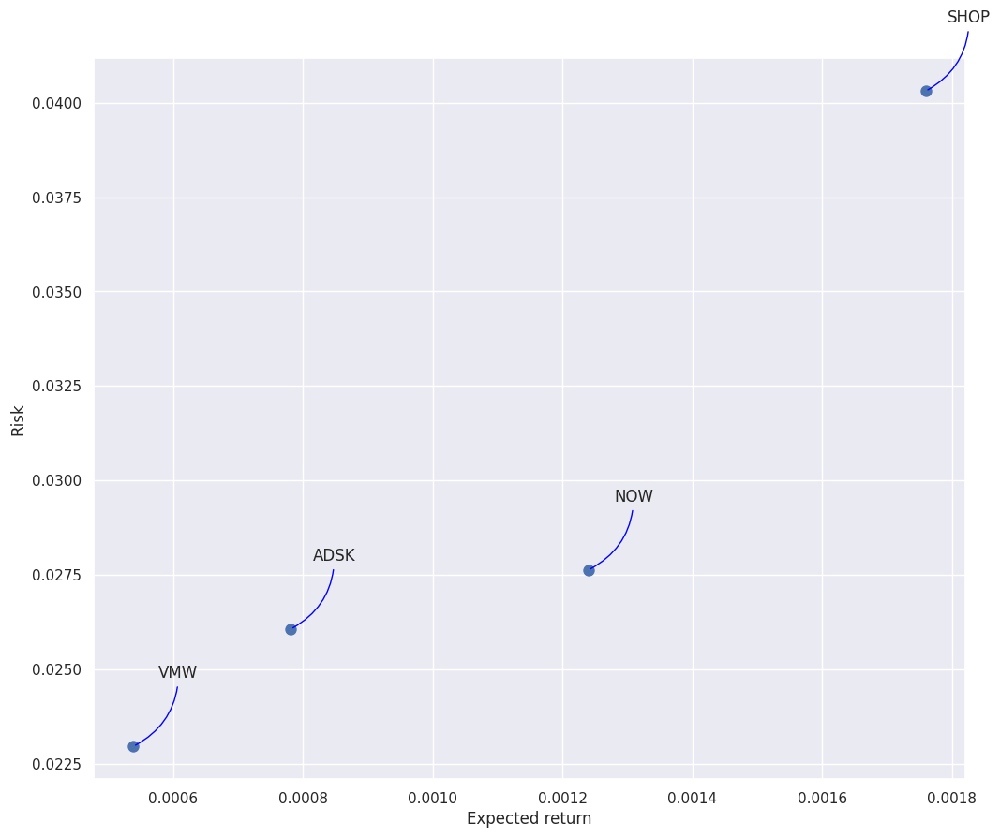

In [259]:
rets = tech_rets.dropna()

area = np.pi*20

plt.figure(figsize=(12, 10))
plt.scatter(rets.mean(), rets.std(), s=area)
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(rets.columns, rets.mean(), rets.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))

    

Closing Price Comparison of Stocks with Competitors

---




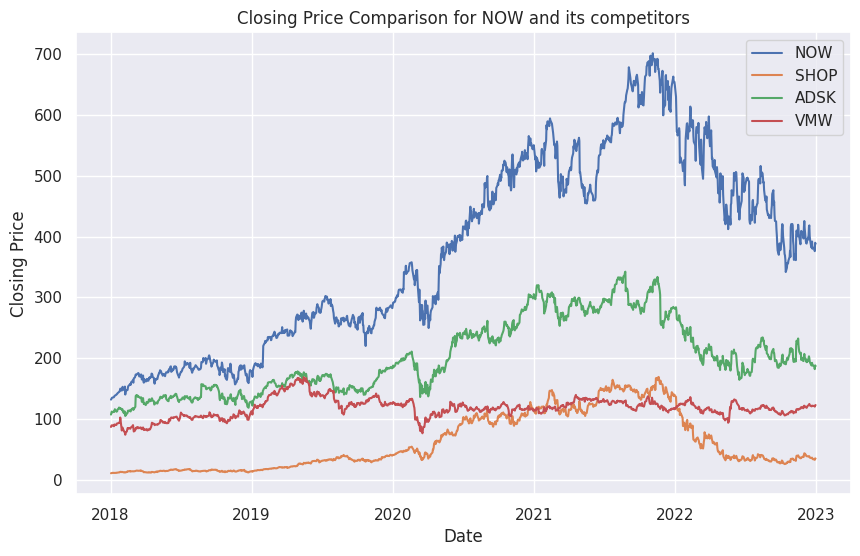

In [260]:
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt

# Define the ticker symbols for the four companies
symbols = ['NOW', 'SHOP', 'ADSK', 'VMW']

# Use yfinance to fetch the historical data for the past year for each stock
start_date = '2018-01-01'
end_date = '2022-12-31'
df_list = []
for symbol in symbols:
    ticker = yf.Ticker(symbol)
    df = ticker.history(start=start_date, end=end_date)
    df = df[['Close']]
    df.rename(columns={'Close': symbol}, inplace=True)
    df_list.append(df)

# Concatenate the dataframes and calculate the percentage change in closing prices
df = pd.concat(df_list, axis=1)
df_pct_change = df.pct_change()

# Plot the closing prices for each company
plt.figure(figsize=(10, 6))
for symbol in symbols:
    plt.plot(df[symbol], label=symbol)
plt.title('Closing Price Comparison for NOW and its competitors')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.legend()
plt.show()


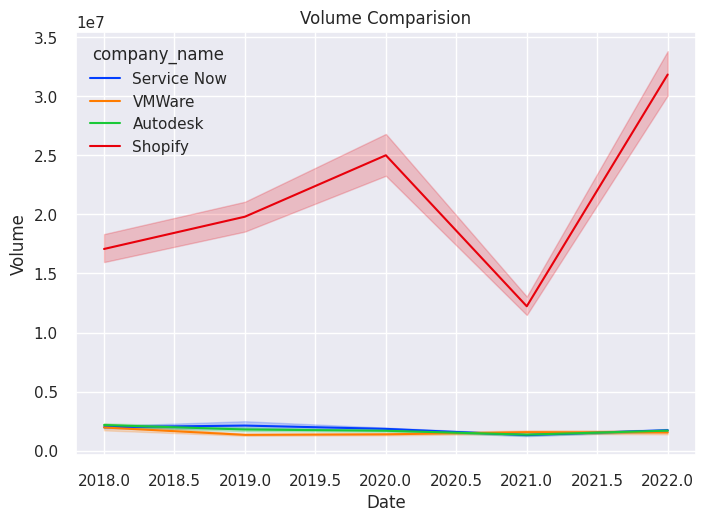

In [327]:
v1 = sns.lineplot(data = df, x = 'Date', y = 'Volume', hue = 'company_name', \
                 palette = 'bright').set_title('Volume Comparision')
plt.savefig("vline.png")

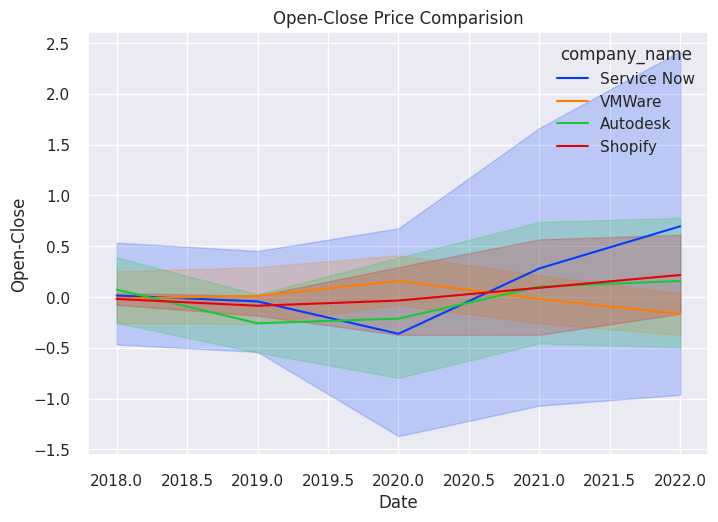

In [328]:
ocl = sns.lineplot(data = df, x = 'Date', y = 'Open-Close', hue = 'company_name', \
                 palette = 'bright').set_title('Open-Close Price Comparision')
plt.savefig("o-c line.png",)

COMPARISION - BOXPLOT

In [274]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

plt.rcParams['figure.figsize'] = 20, 15
plt.style.use('seaborn')


In [318]:
df_now = yf.Ticker("NOW")
df_shop = yf.Ticker("SHOP")
df_adsk = yf.Ticker("ADSK")
df_vmw = yf.Ticker("VMW")

In [319]:
df_now = df_now.history(start ='2018-01-01', end = '2022-12-31')
df_shop = df_shop.history(start ='2018-01-01', end = '2022-12-31')
df_adsk = df_adsk.history(start ='2018-01-01', end = '2022-12-31')
df_vmw = df_vmw.history(start ='2018-01-01', end = '2022-12-31')

In [320]:
date_list = [dt.strftime('%Y-%m-%d') for dt in df_now.index]
df_now['Date'] = date_list
date_list = [dt.strftime('%Y-%m-%d') for dt in df_shop.index]
df_shop['Date'] = date_list
date_list = [dt.strftime('%Y-%m-%d') for dt in df_adsk.index]
df_adsk['Date'] = date_list
date_list = [dt.strftime('%Y-%m-%d') for dt in df_vmw.index]
df_vmw['Date'] = date_list
df_now['company_name']="Service Now"
df_shop['company_name']="Shopify"
df_adsk['company_name']="Autodesk"
df_vmw['company_name']="VMWare"



In [321]:
df3 =df_now.append(df_vmw, ignore_index= True)
df2 = df3.append(df_adsk, ignore_index = True)
df=df2.append(df_shop,ignore_index = True)

df

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Date,company_name
0,131.000000,132.350006,130.139999,131.729996,1282700,0.0,0.0,2018-01-02,Service Now
1,132.000000,133.250000,131.740005,132.910004,1580900,0.0,0.0,2018-01-03,Service Now
2,133.880005,135.089996,133.779999,133.850006,1361900,0.0,0.0,2018-01-04,Service Now
3,134.949997,135.130005,133.899994,135.009995,1183000,0.0,0.0,2018-01-05,Service Now
4,135.050003,136.089996,134.869995,135.300003,1337200,0.0,0.0,2018-01-08,Service Now
...,...,...,...,...,...,...,...,...,...
5031,34.200001,34.549999,33.105000,33.709999,13112800,0.0,0.0,2022-12-23,Shopify
5032,33.060001,33.634998,32.349998,33.389999,12400900,0.0,0.0,2022-12-27,Shopify
5033,33.209999,33.700001,32.395000,32.639999,13332100,0.0,0.0,2022-12-28,Shopify
5034,33.180000,35.380001,32.930000,35.099998,17645700,0.0,0.0,2022-12-29,Shopify


In [322]:
df['Date'] = pd.to_datetime(df['Date'])
df['Date'] = pd.DatetimeIndex(df['Date']).year
df

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Date,company_name
0,131.000000,132.350006,130.139999,131.729996,1282700,0.0,0.0,2018,Service Now
1,132.000000,133.250000,131.740005,132.910004,1580900,0.0,0.0,2018,Service Now
2,133.880005,135.089996,133.779999,133.850006,1361900,0.0,0.0,2018,Service Now
3,134.949997,135.130005,133.899994,135.009995,1183000,0.0,0.0,2018,Service Now
4,135.050003,136.089996,134.869995,135.300003,1337200,0.0,0.0,2018,Service Now
...,...,...,...,...,...,...,...,...,...
5031,34.200001,34.549999,33.105000,33.709999,13112800,0.0,0.0,2022,Shopify
5032,33.060001,33.634998,32.349998,33.389999,12400900,0.0,0.0,2022,Shopify
5033,33.209999,33.700001,32.395000,32.639999,13332100,0.0,0.0,2022,Shopify
5034,33.180000,35.380001,32.930000,35.099998,17645700,0.0,0.0,2022,Shopify


In [323]:
df['Open-Close'] = df['Open'] - df['Close']
df

,Open,High,Low,Close,Volume,Dividends,Stock Splits,Date,company_name,Open-Close
0,131.000000,132.350006,130.139999,131.729996,1282700,0.0,0.0,2018,Service Now,-0.729996
1,132.000000,133.250000,131.740005,132.910004,1580900,0.0,0.0,2018,Service Now,-0.910004
2,133.880005,135.089996,133.779999,133.850006,1361900,0.0,0.0,2018,Service Now,0.029999
3,134.949997,135.130005,133.899994,135.009995,1183000,0.0,0.0,2018,Service Now,-0.059998
4,135.050003,136.089996,134.869995,135.300003,1337200,0.0,0.0,2018,Service Now,-0.250000
...,...,...,...,...,...,...,...,...,...,...
5031,34.200001,34.549999,33.105000,33.709999,13112800,0.0,0.0,2022,Shopify,0.490002
5032,33.060001,33.634998,32.349998,33.389999,12400900,0.0,0.0,2022,Shopify,-0.329998
5033,33.209999,33.700001,32.395000,32.639999,13332100,0.0,0.0,2022,Shopify,0.570000
5034,33.180000,35.380001,32.930000,35.099998,17645700,0.0,0.0,2022,Shopify,-1.919998


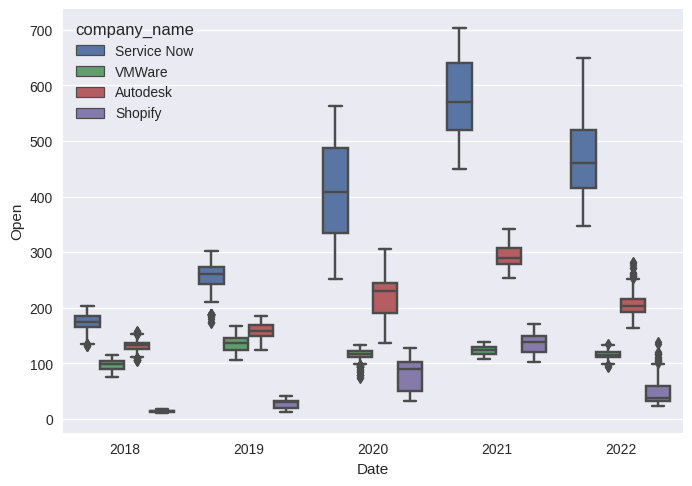

In [324]:
op = sns.boxplot(data = df, x = 'Date', y = 'Open', hue = 'company_name' )

In [187]:
df['Open-Close'] = df['Open'] - df['Close']

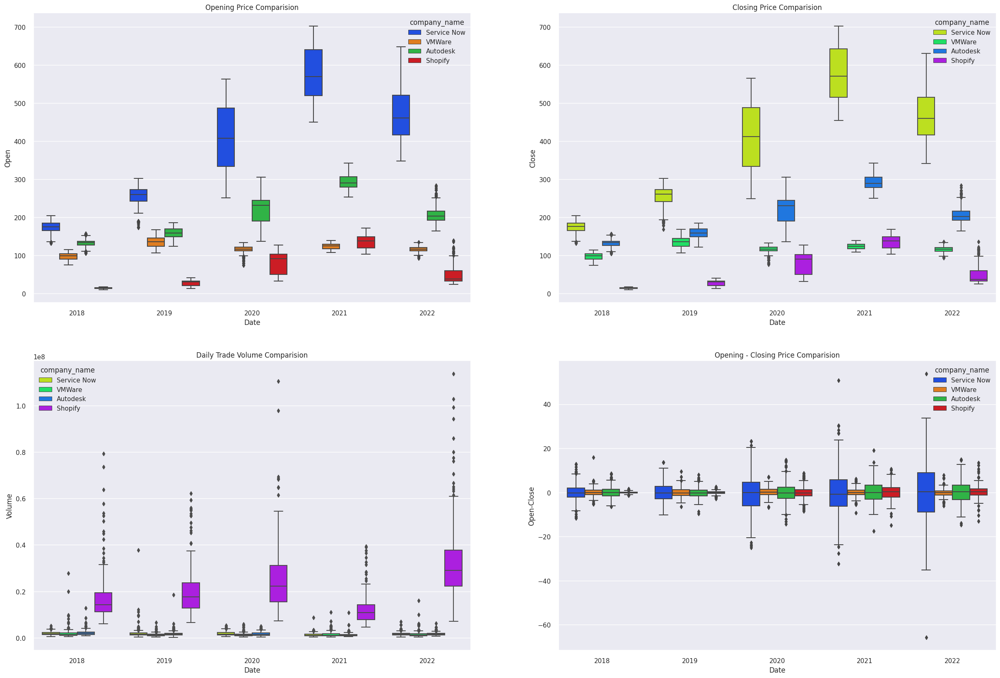

In [325]:
sns.set_style = ("darkgrid", {"axes.facecolor": "black", 'axes.grid': True})
sns.set(font_scale= 1)
f, axes = plt.subplots(2,2, figsize = (30,20))


#Plot [0,0]

p1 = sns.boxplot(data = df, x = 'Date', y = 'Open', hue = 'company_name', \
                 palette = 'bright', ax = axes[0,0] ).set_title('Opening Price Comparision')

p2 = sns.boxplot(data = df, x = 'Date', y = 'Close', hue = 'company_name', \
                  palette = 'hsv', ax = axes[0,1]).set_title('Closing Price Comparision')

p3 = sns.boxplot(data = df, x = 'Date', y = 'Volume', hue = 'company_name', \
                  palette = 'hsv', ax = axes[1,0]).set_title('Daily Trade Volume Comparision')

p4 = sns.boxplot(data = df, x = 'Date', y = 'Open-Close', hue = 'company_name', \
                  palette = 'bright', ax = axes[1,1]).set_title('Opening - Closing Price Comparision')

plt.savefig('boxplot.png')
plt.show()

BOLLINGER BANDS

In [329]:
# import needed libraries
import pandas as pd
import matplotlib.pyplot as plt
from pandas_datareader import data as web

In [330]:
import yfinance as yf
import datetime

start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

ticker = 'NOW'
df_now = yf.download(ticker, start=start, end=end)

[*********************100%***********************]  1 of 1 completed


In [331]:
df_now

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700
2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900
2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900
2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000
2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200
...,...,...,...,...,...,...
2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600
2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900
2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100


In [ ]:
# Calculate 30 Day Moving Average, Std Deviation, Upper Band and Lower Band
df_now['30 Day MA'] = df_now['Adj Close'].rolling(window=20).mean()
df_now['30 Day STD'] = df_now['Adj Close'].rolling(window=20).std()
df_now['Upper Band'] = df_now['30 Day MA'] + (df_now['30 Day STD'] * 2)
df_now['Lower Band'] = df_now['30 Day MA'] - (df_now['30 Day STD'] * 2)

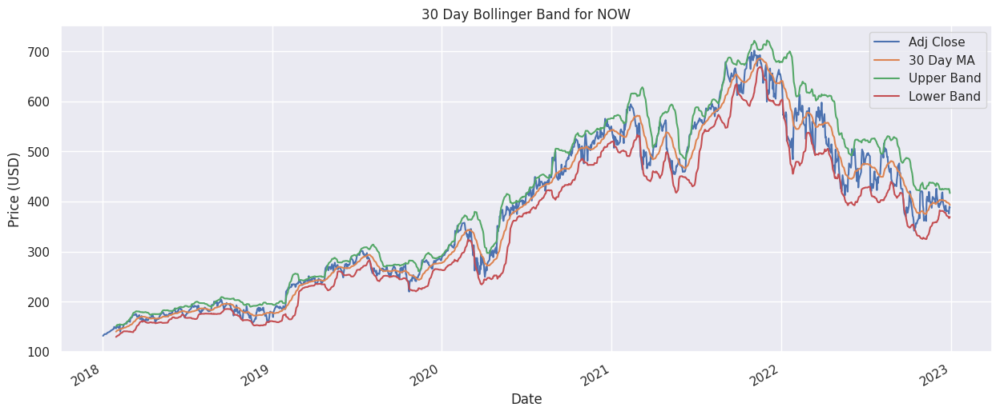

In [ ]:
# Simple 30 Day Bollinger Band for NOW (2018-2022)
df_now[['Adj Close', '30 Day MA', 'Upper Band', 'Lower Band']].plot(figsize=(15,6))
plt.title('30 Day Bollinger Band for NOW')
plt.ylabel('Price (USD)')
plt.show()

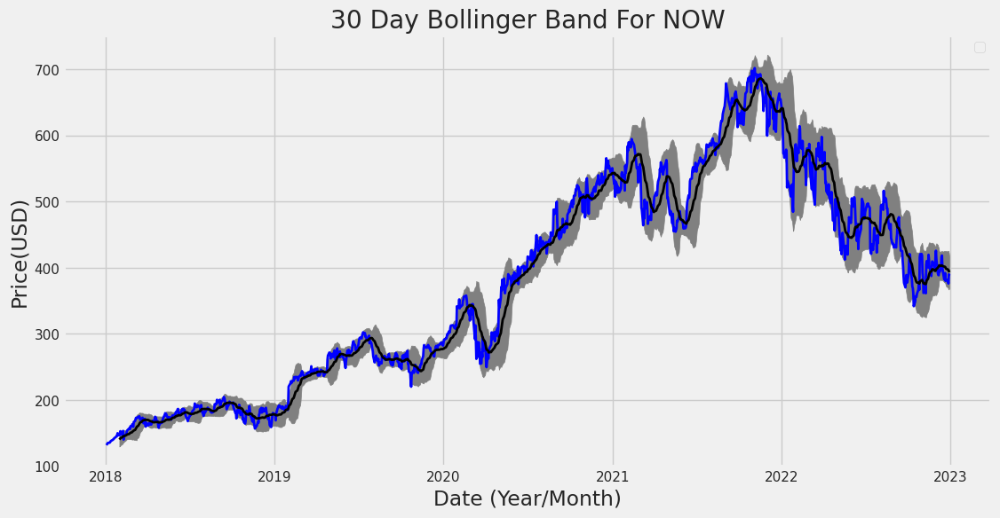

In [ ]:
# set style, empty figure and axes
plt.style.use('fivethirtyeight')
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)

# Get index values for the X axis for NOW DataFrame
x_axis = df_now.index.get_level_values(0)

# Plot shaded 21 Day Bollinger Band for NOW
ax.fill_between(x_axis, df_now['Upper Band'], df_now['Lower Band'], color='grey')

# Plot Adjust Closing Price and Moving Averages
ax.plot(x_axis, df_now['Adj Close'], color='blue', lw=2)
ax.plot(x_axis, df_now['30 Day MA'], color='black', lw=2)

# Set Title & Show the Image
ax.set_title('30 Day Bollinger Band For NOW')
ax.set_xlabel('Date (Year/Month)')
ax.set_ylabel('Price(USD)')
ax.legend()
plt.show()

MOVING AVERAGE CROSS OVER STRATEGY

Generating Trade Signals using Moving Average(MA) Crossover Strategy- SMA and EMA for NOW STOCK

Moving Averages are used to analyze the time-series data by calculating a series of averages of the different subsets of full dataset.

We have used 2 types of Moving Averages-Simple Moving Avergae and Exponential Moving Average(EMEA)

Simple Moving Average Forumla:
The simple moving average = (sum of the an asset price over the past n periods) / (number of periods)

Exponential Moving Average Forumla:
EMA [today] = (α x Price [today] ) + ((1 — α) x EMA [yesterday] )

Where:
α = 2/(N + 1)
N = the length of the window (moving average period)
EMA [today] = the current EMA value
Price [today] = the current closing price
EMA [yesterday] = the previous EMA value

In [ ]:
# import package
import pandas_datareader.data as web
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import datetime

In [ ]:
import yfinance as yf
import matplotlib.pyplot as plt
import datetime

# set the start and end dates for the data
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

# create a ticker object for 'NOW'
ticker = yf.Ticker('NOW')

# extract the closing price data
df_now = ticker.history(start=start, end=end)['Close']

df_now[0]


131.72999572753906

In [ ]:
df_now

Date
2018-01-02 00:00:00-05:00    131.729996
2018-01-03 00:00:00-05:00    132.910004
2018-01-04 00:00:00-05:00    133.850006
2018-01-05 00:00:00-05:00    135.009995
2018-01-08 00:00:00-05:00    135.300003
                                ...    
2022-12-23 00:00:00-05:00    381.859985
2022-12-27 00:00:00-05:00    380.640015
2022-12-28 00:00:00-05:00    376.049988
2022-12-29 00:00:00-05:00    389.850006
2022-12-30 00:00:00-05:00    388.269989
Name: Close, Length: 1259, dtype: float64

In [ ]:
df_now = df_now.to_frame()

In [ ]:
df_now.index = df_now.index.date
df_now.index = pd.to_datetime(df_now.index, format = "%Y-%m-%d" )


In [ ]:
df_now

,Close
2018-01-02,131.729996
2018-01-03,132.910004
2018-01-04,133.850006
2018-01-05,135.009995
2018-01-08,135.300003
...,...
2022-12-23,381.859985
2022-12-27,380.640015
2022-12-28,376.049988
2022-12-29,389.850006


In [ ]:
# create 20 days simple moving average column
df_now['20_SMA'] = df_now['Close'].rolling(window = 20, min_periods = 1).mean()
# create 50 days simple moving average column
df_now['50_SMA'] = df_now['Close'].rolling(window = 50, min_periods = 1).mean()
# display first few rows
df_now.head()

,Close,20_SMA,50_SMA
2018-01-02,131.729996,131.729996,131.729996
2018-01-03,132.910004,132.320000,132.320000
2018-01-04,133.850006,132.830002,132.830002
2018-01-05,135.009995,133.375000,133.375000
2018-01-08,135.300003,133.760001,133.760001


In [ ]:
df_now['Signal'] = 0.0
df_now['Signal'] = np.where(df_now['20_SMA'] > df_now['50_SMA'], 1.0, 0.0)

In [ ]:
df_now['Position'] = df_now['Signal'].diff()
# display first few rows
df_now.head()

,Close,20_SMA,50_SMA,Signal,Position
2018-01-02,131.729996,131.729996,131.729996,0.0,NaN
2018-01-03,132.910004,132.320000,132.320000,0.0,0.0
2018-01-04,133.850006,132.830002,132.830002,0.0,0.0
2018-01-05,135.009995,133.375000,133.375000,0.0,0.0
2018-01-08,135.300003,133.760001,133.760001,0.0,0.0


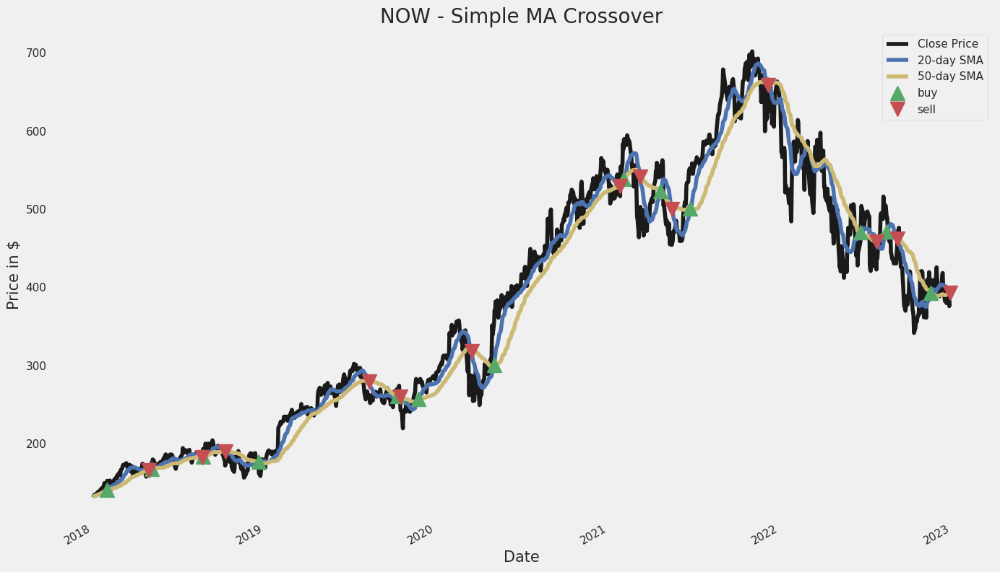

In [ ]:
plt.figure(figsize = (15,10))
# plot close price, short-term and long-term moving averages 
df_now['Close'].plot(color = 'k', label= 'Close Price') 
df_now['20_SMA'].plot(color = 'b',label = '20-day SMA') 
df_now['50_SMA'].plot(color = 'y',label = '50-day SMA')
# plot ‘buy’ signals
plt.plot(df_now[df_now['Position'] == 1].index, df_now['20_SMA'][df_now['Position'] == 1],  '^', markersize = 15, color = 'g', label = 'buy')
# plot ‘sell’ signals
plt.plot(df_now[df_now['Position'] == -1].index, df_now['20_SMA'][df_now['Position'] == -1], 'v', markersize = 15, color = 'r', label = 'sell')
plt.ylabel('Price in $', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('NOW - Simple MA Crossover', fontsize = 20)
plt.legend()
plt.grid()
plt.show()

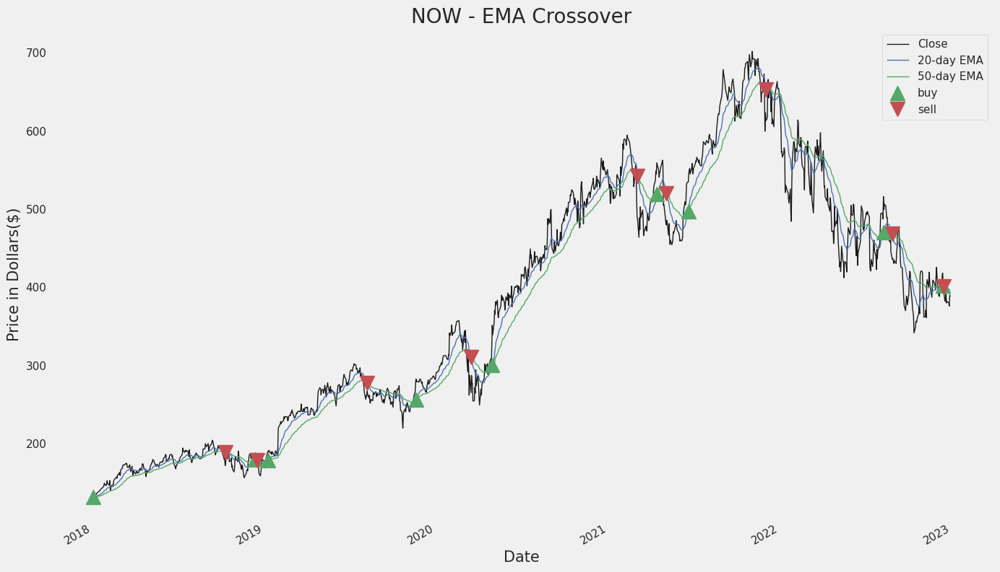

In [ ]:
# Create 20 days exponential moving average column
df_now['20_EMA'] = df_now['Close'].ewm(span = 20, adjust = False).mean()
# Create 50 days exponential moving average column
df_now['50_EMA'] = df_now['Close'].ewm(span = 50, adjust = False).mean()
# create a new column 'Signal' such that if 20-day EMA is greater   # than 50-day EMA then set Signal as 1 else 0
df_now['Signal'] = 0.0  
df_now['Signal'] = np.where(df_now['20_EMA'] > df_now['50_EMA'], 1.0, 0.0)
# create a new column 'Position' which is a day-to-day difference of # the 'Signal' column
df_now['Position'] = df_now['Signal'].diff()
plt.figure(figsize = (15,10))
# plot close price, short-term and long-term moving averages 
df_now['Close'].plot(color = 'k', lw = 1, label = 'Close')  
df_now['20_EMA'].plot(color = 'b', lw = 1, label = '20-day EMA') 
df_now['50_EMA'].plot(color = 'g', lw = 1, label = '50-day EMA')
# plot ‘buy’ and 'sell' signals
plt.plot(df_now[df_now['Position'] == 1].index, 
         df_now['20_EMA'][df_now['Position'] == 1], 
         '^', markersize = 15, color = 'g', label = 'buy')
plt.plot(df_now[df_now['Position'] == -1].index, 
         df_now['20_EMA'][df_now['Position'] == -1], 
         'v', markersize = 15, color = 'r', label = 'sell')
plt.ylabel('Price in Dollars($)', fontsize = 15 )
plt.xlabel('Date', fontsize = 15 )
plt.title('NOW - EMA Crossover', fontsize = 20)
plt.legend()
plt.grid()
plt.show()


CANDIDATE MODELS

1. KALMAN FILTER

In [ ]:
!pip install pandas_datareader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Importing all the requried libraries 

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
from datetime import datetime
import datetime
import math
import scipy.stats as ss
import seaborn as sns; sns.set(color_codes=True)
from scipy.optimize import minimize


# extract data from various Internet sources into a pandas DataFrame
import pandas_datareader as web

In [ ]:
import yfinance as yf
import datetime

start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

ticker = 'NOW'
df_now = yf.download(ticker, start=start, end=end)

# Reset the index to make 'Date' a column in the DataFrame
df_now = df_now.reset_index()

print(df_now.head())

df_now.to_csv('now_1.csv')

df_now

[*********************100%***********************]  1 of 1 completed
        Date        Open        High         Low       Close   Adj Close  \
0 2018-01-02  131.000000  132.350006  130.139999  131.729996  131.729996   
1 2018-01-03  132.000000  133.250000  131.740005  132.910004  132.910004   
2 2018-01-04  133.880005  135.089996  133.779999  133.850006  133.850006   
3 2018-01-05  134.949997  135.130005  133.899994  135.009995  135.009995   
4 2018-01-08  135.050003  136.089996  134.869995  135.300003  135.300003   

    Volume  
0  1282700  
1  1580900  
2  1361900  
3  1183000  
4  1337200  


,Date,Open,High,Low,Close,Adj Close,Volume
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200
...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500


In [ ]:
df_now.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [ ]:
df_now.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1.259000e+03
mean,376.542057,382.593511,370.023249,376.424940,376.424940,1.795765e+06
std,157.070780,159.227072,154.493080,156.851941,156.851941,1.403187e+06
min,131.000000,132.350006,130.139999,131.729996,131.729996,3.057000e+05
25%,242.284996,244.735001,239.000000,241.285004,241.285004,1.183400e+06
50%,383.970001,389.700012,375.679993,383.369995,383.369995,1.570500e+06
75%,508.940002,517.599976,500.660004,507.289993,507.289993,2.053800e+06
max,702.000000,707.599976,689.150024,701.729980,701.729980,3.780290e+07


In Stock trading, the **high**, **low** refers to the maximum and the minimum prices in a given time period. **Open** and **Close** are thhighLowOpenClosee prices at which a stock began and ended trading in the same period. **Volume** is the total amount of trading activity. Adjusted values factor in corporate actions such as dividends, stock splits, and new share issuance.


## Smoothing the curve with increase in Bandwith 
## adjusting Now.Close 

In [ ]:
def Kalman_Filter(Y):
    S = Y.shape[0]
    S = S + 1
    "Initialize Params:"
    Z = param0[0]
    T = param0[1]
    H = param0[2]
    Q = param0[3]
    # "Kalman Filter Starts:"
    u_predict = np.zeros(S)
    u_update = np.zeros(S)
    P_predict = np.zeros(S)
    P_update = np.zeros(S)
    v = np.zeros(S)
    F = np.zeros(S)
    KF_Dens = np.zeros(S)
    for s in range(1,S):
        if s == 1: 
            P_update[s] = 1000
            P_predict[s] =  T*P_update[1]*np.transpose(T)+Q    
        else: 
            F[s]= Z*P_predict[s-1]*np.transpose(Z)+H
            v[s] = Y[s-1] - Z*u_predict[s-1]
            u_update[s] = u_predict[s-1]+P_predict[s-1]*np.transpose(Z)*(1/F[s])*v[s]
            u_predict[s] = T*u_predict[s];
            P_update[s] = P_predict[s-1]-P_predict[s-1]*np.transpose(Z)*(1/F[s])*Z*P_predict[s-1]
            P_predict[s] = T*P_update[s]*np.transpose(T)+Q
            Likelihood = np.sum(KF_Dens[1:-1])  
            return Likelihood

In [ ]:
def Kalman_Smoother(params, Y):
    S = Y.shape[0]
    S = S + 1
    "Initialize Params:"
    Z = params[0]
    T = params[1]
    H = params[2]
    Q = params[3]
    "Kalman Filter Starts:"
    u_predict = np.zeros(S)
    u_update = np.zeros(S)
    P_predict = np.zeros(S)
    P_update = np.zeros(S)
    v = np.zeros(S)
    F = np.zeros(S)
    for s in range(1,S):
        if s == 1: 
            P_update[s] = 1000
            P_predict[s] =  T*P_update[1]*np.transpose(T)+Q    
        else: 
            # "Please fill this part."
            F[s]= Z*P_predict[s-1]*np.transpose(Z)+H
            v[s] = Y[s-1] - Z*u_predict[s-1]
            u_update[s] = u_predict[s-1]+P_predict[s-1]*np.transpose(Z)*(1/F[s])*v[s]
            u_predict[s] = T*u_predict[s];
            P_update[s] = P_predict[s-1]-P_predict[s-1]*np.transpose(Z)*(1/F[s])*Z*P_predict[s-1]
            P_predict[s] = T*P_update[s]*np.transpose(T)+Q
    
    
            u_smooth = np.zeros(S)
            P_smooth = np.zeros(S)
            u_smooth[S-1] = u_update[S-1]
            P_smooth[S-1] = P_update[S-1]    
    for  t in range(S-1,0,-1):
     
        u_smooth[t-1] = u_update[t] +P_update[t]*np.transpose(T)/P_predict[t]*(u_smooth[t]- T*u_update[t])
        P_smooth[t-1] = P_update[t] + (P_update[t]*np.transpose(T)/P_predict[t]*(P_smooth[t]-P_update[t])/P_update[t]*T*P_update[t])
    
    u_smooth = u_smooth[0:-1]
    return u_smooth

In [ ]:
df_now['Typical_Price'] = df_now[['High','Low','Close']].mean(axis=1)
df_now['lrets'] = (np.log(df_now.Close) - np.log(df_now.Close.shift(1))) * 100.
df_now.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575


Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 0
         Function evaluations: 5
         Gradient evaluations: 1


<ipython-input-133-815b03c78e7b>:7: OptimizeWarning: Unknown solver options: xtol
  param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})


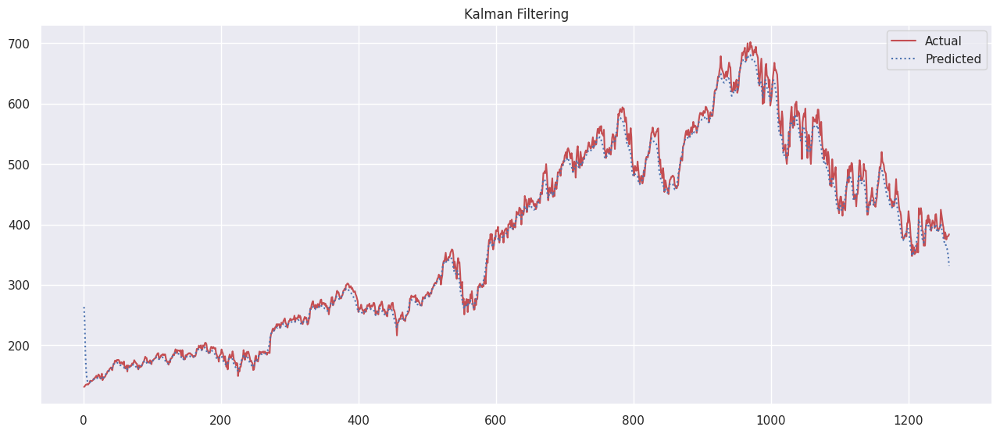

In [ ]:
Y = df_now['Open']
T = Y.shape[0]
mu = 1196;


param0 = np.array([0.3, 0.9, 0.8, 1.1])
param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})
u = Kalman_Smoother(param_star.x, Y)

timevec = np.linspace(1,T,T)


fig= plt.figure(figsize=(14,6))
plt.plot(timevec, Y,'r-', label='Actual')
plt.plot(timevec, u,'b:', label='Predicted')
plt.legend(loc='upper right')
plt.title("Kalman Filtering")
plt.show()

<ipython-input-134-0932249c6960>:7: OptimizeWarning: Unknown solver options: xtol
  param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})


Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 0
         Function evaluations: 5
         Gradient evaluations: 1


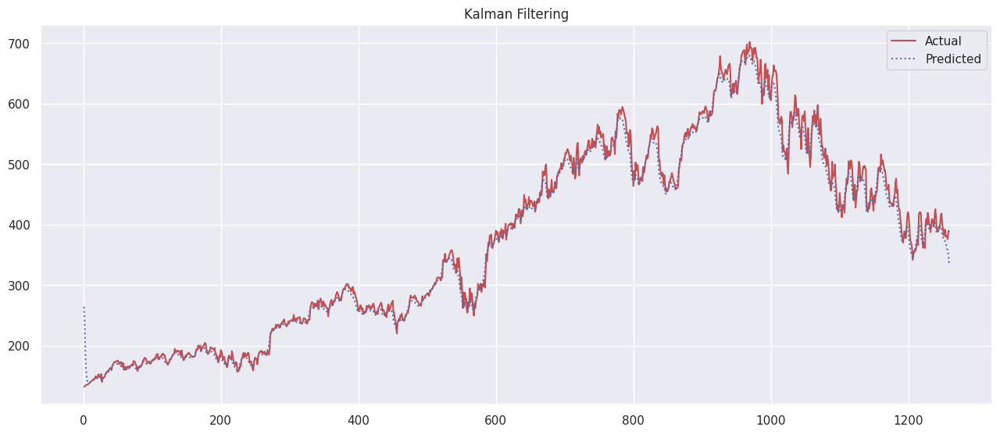

In [ ]:
Y = df_now['Close']
T = Y.shape[0]
mu = 1196;


param0 = np.array([0.3, 0.9, 0.8, 1.1])
param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})
u = Kalman_Smoother(param_star.x, Y)

timevec = np.linspace(1,T,T)


fig= plt.figure(figsize=(14,6))
plt.plot(timevec, Y,'r-', label='Actual')
plt.plot(timevec, u,'b:', label='Predicted')
plt.legend(loc='upper right')
plt.title("Kalman Filtering")
plt.show()

In [ ]:
results = pd.DataFrame({'Actual': list(Y),
                  'Predicted' : list(u),
                  'Date':df_now['Date'],
                  'Open':df_now['Open'],
                  'Close':df_now['Close']
                       })

In [ ]:
results.set_index('Date',inplace = True)
results.head(10)

,Actual,Predicted,Open,Close
Date,,,,
2018-01-02,131.729996,264.173870,131.000000,131.729996
2018-01-03,132.910004,238.079362,132.000000,132.910004
2018-01-04,133.850006,186.449008,133.880005,133.850006
2018-01-05,135.009995,159.809237,134.949997,135.009995
2018-01-08,135.300003,146.759360,135.050003,135.300003
2018-01-09,135.449997,140.904384,135.649994,135.449997
2018-01-10,136.229996,138.758572,134.960007,136.229996
2018-01-11,137.580002,138.349788,136.589996,137.580002
2018-01-12,138.190002,138.593252,137.639999,138.190002


In [ ]:
dif = pd.DataFrame({'Actual':list(Y),
                     'Predicted':list(u)})

In [ ]:
import math
from math import sqrt

rms = sqrt(mean_squared_error(dif['Actual'],dif['Predicted']))
rms

13.288542886296032

 LONG SHORT DAY TRADING STRATEGY

if predicted > yesterdays close, buy and sell at end of day

if predicted < yesterdays close, sell and buy at end of day

In [ ]:
results

,Actual,Predicted,Open,Close
Date,,,,
2018-01-02,131.729996,264.173870,131.000000,131.729996
2018-01-03,132.910004,238.079362,132.000000,132.910004
2018-01-04,133.850006,186.449008,133.880005,133.850006
2018-01-05,135.009995,159.809237,134.949997,135.009995
2018-01-08,135.300003,146.759360,135.050003,135.300003
...,...,...,...,...
2022-12-23,381.859985,365.999330,375.000000,381.859985
2022-12-27,380.640015,361.866203,380.149994,380.640015
2022-12-28,376.049988,356.362462,380.429993,376.049988


In [ ]:
amount = 10000
signal = 0
Amount = []
balance = 0
action = []
portfolio = 0
Portfolio = []
stocks = 0
Stocks = []

for i in range(len(results)):
    if results['Predicted'][i] > results['Actual'][i-1]:
        action.append('Buy at Open')
        stocks = int(amount/results['Open'][i])
        balance = int(amount%results['Close'][i])
        portfolio = stocks * results ['Open'][i]
        print(i,'Buy at Open',round(portfolio,2),stocks,round(balance,2))
        
        
        action.append('Sell at End')
        portfolio = stocks * results['Close'][i]
        signal = 0
        stocks = 0
        amount = balance + portfolio
        portfolio = 0
        balance = 0
        print(i,'Sell at Close',round(amount,2),balance)
        Amount.append(amount)
        
    else:
        action.append('Sell at Open')
        stocks = int(amount/results['Open'][i])
        balance = int(amount%results['Close'][i])
        portfolio = stocks * results ['Open'][i]
        print(i,'Sell at Open',round(portfolio,2),'-',stocks,round(balance,2))
        
        
        action.append('Buy at Close')
        portfolio = stocks * results['Close'][i]
        signal = 0
        stocks = 0
        amount = balance + portfolio
        portfolio = 0
        balance = 0
        print(i,'Buy Back at Close',round(amount,2),balance)
        Amount.append(amount)
    print('\n')
        

Streaming output truncated to the last 5000 lines.
9 Buy at Open 10457.68 74 52
9 Sell at Close 10396.46 0


10 Buy at Open 10280.59 73 118
10 Sell at Close 10395.67 0


11 Buy at Open 10274.75 73 93
11 Sell at Close 10395.49 0


12 Buy at Open 10309.79 73 9
12 Sell at Close 10394.71 0


13 Buy at Open 10390.09 73 33
13 Sell at Close 10537.7 0


14 Sell at Open 10410.48 - 72 138
14 Buy Back at Close 10536.96 0


15 Sell at Open 10398.24 - 72 65
15 Buy Back at Close 10536.68 0


16 Sell at Open 10429.19 - 71 57
16 Buy Back at Close 10390.34 0


17 Buy at Open 10301.2 70 58
17 Sell at Close 10539.8 0


18 Sell at Open 10471.3 - 70 96
18 Buy Back at Close 10392.3 0


19 Sell at Open 10370.97 - 71 131
19 Buy Back at Close 10538.89 0


20 Buy at Open 10407.6 70 117
20 Sell at Close 10537.9 0


21 Sell at Open 10471.44 - 69 146
21 Buy Back at Close 10689.89 0


22 Sell at Open 10686.21 - 71 56
22 Buy Back at Close 10688.96 0


23 Sell at Open 10604.88 - 72 76
23 Buy Back at Close 10688.08 0


In [ ]:
results['Amount'] = list(Amount)

In [ ]:
results['Returns'] = results['Amount'].pct_change()

In [ ]:
results.head()

,Actual,Predicted,Open,Close,Amount,Returns
Date,,,,,,
2018-01-02,131.729996,264.173870,131.000000,131.729996,10131.479675,NaN
2018-01-03,132.910004,238.079362,132.000000,132.910004,10131.160278,-3.152520e-05
2018-01-04,133.850006,186.449008,133.880005,133.850006,10130.750458,-4.045149e-05
2018-01-05,135.009995,159.809237,134.949997,135.009995,10130.749588,-8.585257e-08
2018-01-08,135.300003,146.759360,135.050003,135.300003,10265.500229,1.330115e-02


In [ ]:
results.tail()

,Actual,Predicted,Open,Close,Amount,Returns
Date,,,,,,
2022-12-23,381.859985,365.999330,375.000000,381.859985,9557.499634,-4.470270e-08
2022-12-27,380.640015,361.866203,380.149994,380.640015,9557.000366,-5.223830e-05
2022-12-28,376.049988,356.362462,380.429993,376.049988,9556.249695,-7.854676e-05
2022-12-29,389.850006,350.392771,380.950012,389.850006,9945.250153,4.070639e-02
2022-12-30,388.269989,335.310809,383.799988,388.269989,9944.749725,-5.031822e-05


Sharpe and is used to help investors understand the return of an investment compared to its risk. The ratio is the average return earned in excess of the risk-free rate per unit of volatility or total risk.

In [ ]:
mean_returns = results['Returns'].mean()
sd = results['Returns'].std()
print(mean_returns,sd)
Market_RF = 0.0464


Sharpe_Ratio = np.sqrt(878)*(mean_returns)/sd
Sharpe_Ratio

0.0003575111210803411 0.027277257171005542


0.38836145151658114

#### RMSE Value of NOW

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(results['Actual'], results['Predicted']))
rms

13.288542886296032

Comparision with Oracle stock

In [ ]:
!pip install pandas_datareader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
from datetime import datetime
import datetime
import math
import scipy.stats as ss
import seaborn as sns; sns.set(color_codes=True)
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_error
from math import sqrt

# extract data from various Internet sources into a pandas DataFrame
import pandas_datareader as web

In [ ]:
import yfinance as yf
import datetime

start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

ticker = 'ORCL'
df_oracle = yf.download(ticker, start=start, end=end)

# Reset the index to make 'Date' a column in the DataFrame
df_oracle = df_oracle.reset_index()

print(df_oracle.head())

df_oracle.to_csv('oracle_data.csv')
df_oracle

[*********************100%***********************]  1 of 1 completed
        Date       Open       High        Low      Close  Adj Close    Volume
0 2018-01-02  47.570000  47.799999  46.169998  46.630001  42.586098  25380000
1 2018-01-03  47.529999  48.070000  47.439999  47.709999  43.572441  24165000
2 2018-01-04  47.990002  48.189999  47.720001  48.180000  44.001675  19815100
3 2018-01-05  48.419998  48.630001  48.279999  48.470001  44.266529  14496400
4 2018-01-08  48.299999  49.070000  47.939999  48.980000  44.732300  15075000


,Date,Open,High,Low,Close,Adj Close,Volume
0,2018-01-02,47.570000,47.799999,46.169998,46.630001,42.586098,25380000
1,2018-01-03,47.529999,48.070000,47.439999,47.709999,43.572441,24165000
2,2018-01-04,47.990002,48.189999,47.720001,48.180000,44.001675,19815100
3,2018-01-05,48.419998,48.630001,48.279999,48.470001,44.266529,14496400
4,2018-01-08,48.299999,49.070000,47.939999,48.980000,44.732300,15075000
...,...,...,...,...,...,...,...
1254,2022-12-23,80.510002,80.900002,79.989998,80.849998,80.212074,4129100
1255,2022-12-27,80.879997,81.470001,80.610001,80.980003,80.341049,4290700
1256,2022-12-28,81.089996,81.639999,80.190002,80.330002,79.696182,3794000
1257,2022-12-29,80.970001,81.800003,80.699997,81.400002,80.757736,3867800


In [ ]:
df_oracle.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [ ]:
df_oracle.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1.259000e+03
mean,62.875147,63.560612,62.274543,62.902852,60.256547,1.283694e+07
std,14.633899,14.788031,14.467217,14.616476,15.226464,7.385913e+06
min,41.119999,43.400002,39.709999,39.799999,37.729900,2.754900e+06
25%,51.895000,52.465000,51.295000,51.795000,48.414017,7.914800e+06
50%,56.340000,56.830002,56.020000,56.310001,53.388134,1.106650e+07
75%,75.605000,76.639999,74.695000,75.870003,74.342079,1.547730e+07
max,104.290001,106.339996,102.279999,103.650002,101.078377,6.860100e+07


# Implementing Kalman model on Oracle dataset

In [ ]:
def Kalman_Filter(Y):
    S = Y.shape[0]
    S = S + 1
    "Initialize Params:"
    Z = param0[0]
    T = param0[1]
    H = param0[2]
    Q = param0[3]
    # "Kalman Filter Starts:"
    u_predict = np.zeros(S)
    u_update = np.zeros(S)
    P_predict = np.zeros(S)
    P_update = np.zeros(S)
    v = np.zeros(S)
    F = np.zeros(S)
    KF_Dens = np.zeros(S)
    for s in range(1,S):
        if s == 1: 
            P_update[s] = 1000
            P_predict[s] =  T*P_update[1]*np.transpose(T)+Q    
        else: 
            F[s]= Z*P_predict[s-1]*np.transpose(Z)+H
            v[s] = Y[s-1] - Z*u_predict[s-1]
            u_update[s] = u_predict[s-1]+P_predict[s-1]*np.transpose(Z)*(1/F[s])*v[s]
            u_predict[s] = T*u_predict[s];
            P_update[s] = P_predict[s-1]-P_predict[s-1]*np.transpose(Z)*(1/F[s])*Z*P_predict[s-1]
            P_predict[s] = T*P_update[s]*np.transpose(T)+Q
            Likelihood = np.sum(KF_Dens[1:-1])  
            return Likelihood

In [ ]:
def Kalman_Smoother(params, Y):
    S = Y.shape[0]
    S = S + 1
    "Initialize Params:"
    Z = params[0]
    T = params[1]
    H = params[2]
    Q = params[3]
    "Kalman Filter Starts:"
    u_predict = np.zeros(S)
    u_update = np.zeros(S)
    P_predict = np.zeros(S)
    P_update = np.zeros(S)
    v = np.zeros(S)
    F = np.zeros(S)
    for s in range(1,S):
        if s == 1: 
            P_update[s] = 1000
            P_predict[s] =  T*P_update[1]*np.transpose(T)+Q    
        else: 
            # "Please fill this part."
            F[s]= Z*P_predict[s-1]*np.transpose(Z)+H
            v[s] = Y[s-1] - Z*u_predict[s-1]
            u_update[s] = u_predict[s-1]+P_predict[s-1]*np.transpose(Z)*(1/F[s])*v[s]
            u_predict[s] = T*u_predict[s];
            P_update[s] = P_predict[s-1]-P_predict[s-1]*np.transpose(Z)*(1/F[s])*Z*P_predict[s-1]
            P_predict[s] = T*P_update[s]*np.transpose(T)+Q
    
    
            u_smooth = np.zeros(S)
            P_smooth = np.zeros(S)
            u_smooth[S-1] = u_update[S-1]
            P_smooth[S-1] = P_update[S-1]    
    for  t in range(S-1,0,-1):
     
        u_smooth[t-1] = u_update[t] +P_update[t]*np.transpose(T)/P_predict[t]*(u_smooth[t]- T*u_update[t])
        P_smooth[t-1] = P_update[t] + (P_update[t]*np.transpose(T)/P_predict[t]*(P_smooth[t]-P_update[t])/P_update[t]*T*P_update[t])
    
    u_smooth = u_smooth[0:-1]
    return u_smooth

In [ ]:
df_oracle['Typical_Price'] = df_oracle[['High','Low','Close']].mean(axis=1)
df_oracle['lrets'] = (np.log(df_oracle.Close) - np.log(df_oracle.Close.shift(1))) * 100.
df_oracle.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
0,2018-01-02,47.570000,47.799999,46.169998,46.630001,42.586098,25380000,46.866666,NaN
1,2018-01-03,47.529999,48.070000,47.439999,47.709999,43.572441,24165000,47.739999,2.289687
2,2018-01-04,47.990002,48.189999,47.720001,48.180000,44.001675,19815100,48.030000,0.980300
3,2018-01-05,48.419998,48.630001,48.279999,48.470001,44.266529,14496400,48.460000,0.600107
4,2018-01-08,48.299999,49.070000,47.939999,48.980000,44.732300,15075000,48.663333,1.046697


<ipython-input-155-87d8797b5599>:7: OptimizeWarning: Unknown solver options: xtol
  param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})


Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 0
         Function evaluations: 5
         Gradient evaluations: 1


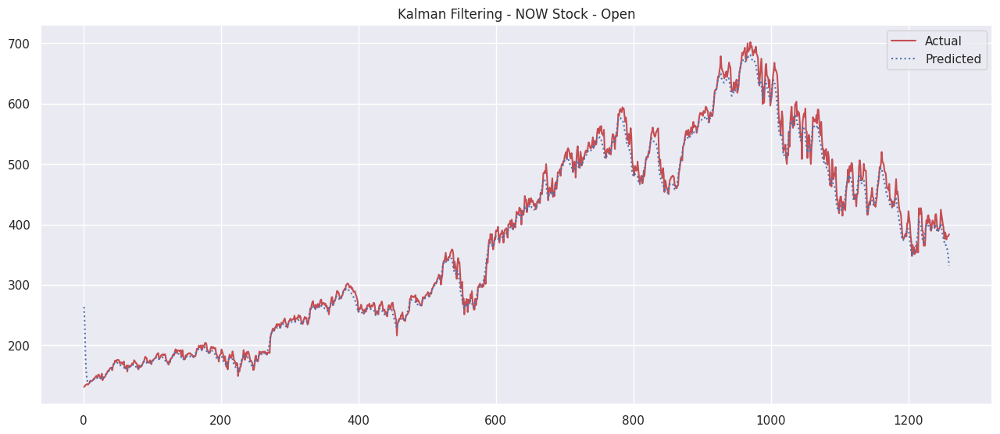

In [ ]:
Y = df_now['Open']
T = Y.shape[0]
mu = 1196;


param0 = np.array([0.3, 0.9, 0.8, 1.1])
param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})
u = Kalman_Smoother(param_star.x, Y)

timevec = np.linspace(1,T,T)


fig= plt.figure(figsize=(14,6))
plt.plot(timevec, Y,'r-', label='Actual')
plt.plot(timevec, u,'b:', label='Predicted')
plt.legend(loc='upper right')
plt.title("Kalman Filtering - NOW Stock - Open")
plt.show()

<ipython-input-156-8be1081bbcdd>:7: OptimizeWarning: Unknown solver options: xtol
  param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})


Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 0
         Function evaluations: 5
         Gradient evaluations: 1


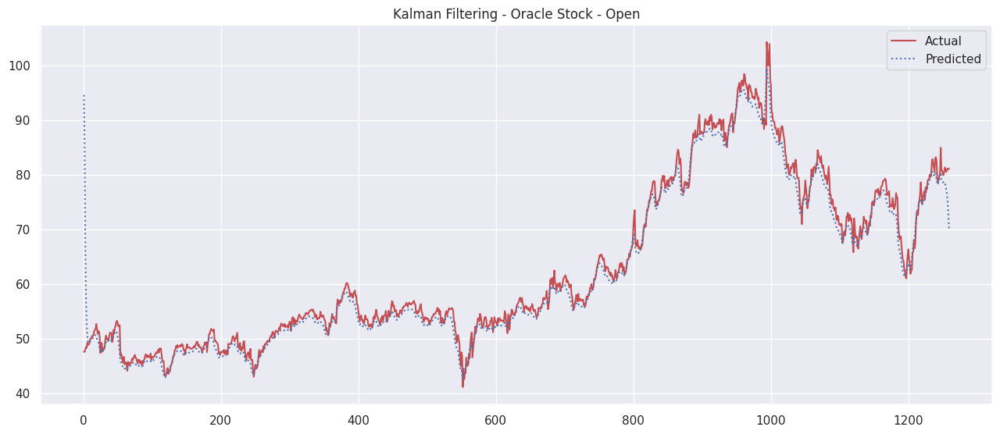

In [ ]:
Y = df_oracle['Open']
T = Y.shape[0]
mu = 1196;


param0 = np.array([0.3, 0.9, 0.8, 1.1])
param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})
u = Kalman_Smoother(param_star.x, Y)

timevec = np.linspace(1,T,T)


fig= plt.figure(figsize=(14,6))
plt.plot(timevec, Y,'r-', label='Actual')
plt.plot(timevec, u,'b:', label='Predicted')
plt.legend(loc='upper right')
plt.title("Kalman Filtering - Oracle Stock - Open")
plt.show()

<ipython-input-157-ba0de038d5ac>:7: OptimizeWarning: Unknown solver options: xtol
  param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})


Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 0
         Function evaluations: 5
         Gradient evaluations: 1


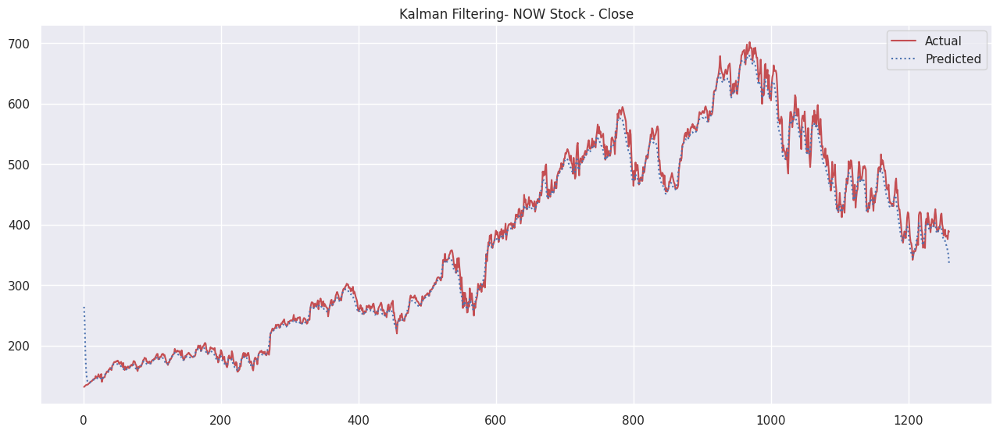

In [ ]:
Y = df_now['Close']
T = Y.shape[0]
mu = 1196;


param0 = np.array([0.3, 0.9, 0.8, 1.1])
param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})
u = Kalman_Smoother(param_star.x, Y)

timevec = np.linspace(1,T,T)


fig= plt.figure(figsize=(14,6))
plt.plot(timevec, Y,'r-', label='Actual')
plt.plot(timevec, u,'b:', label='Predicted')
plt.legend(loc='upper right')
plt.title("Kalman Filtering- NOW Stock - Close")
plt.show()

<ipython-input-158-8dc83af39257>:7: OptimizeWarning: Unknown solver options: xtol
  param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})


Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 0
         Function evaluations: 5
         Gradient evaluations: 1


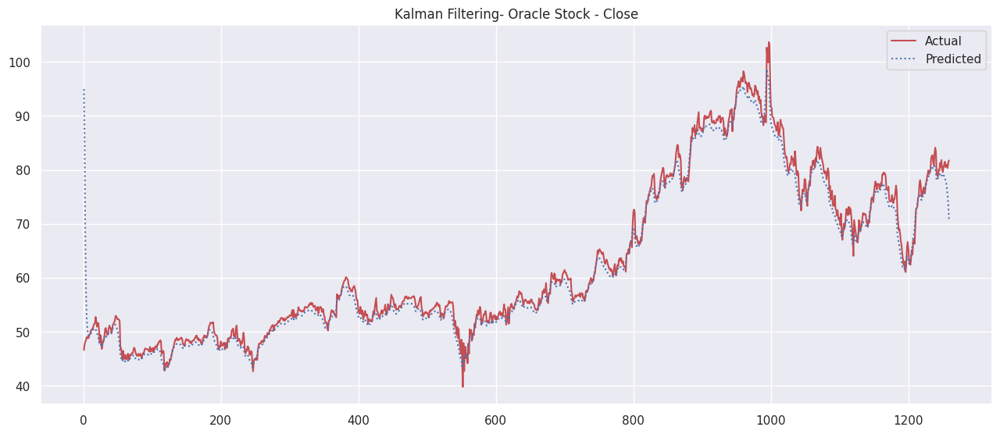

In [ ]:
Y = df_oracle['Close']
T = Y.shape[0]
mu = 1196;


param0 = np.array([0.3, 0.9, 0.8, 1.1])
param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})
u = Kalman_Smoother(param_star.x, Y)

timevec = np.linspace(1,T,T)


fig= plt.figure(figsize=(14,6))
plt.plot(timevec, Y,'r-', label='Actual')
plt.plot(timevec, u,'b:', label='Predicted')
plt.legend(loc='upper right')
plt.title("Kalman Filtering- Oracle Stock - Close")
plt.show()

In [ ]:
results = pd.DataFrame({'Actual': list(Y),
                  'Predicted' : list(u),
                  'Date':df_oracle['Date'],
                  'Open':df_oracle['Open'],
                  'Close':df_oracle['Close']
                       })

In [ ]:
results.set_index('Date',inplace = True)
results.head(10)

,Actual,Predicted,Open,Close
Date,,,,
2018-01-02,46.630001,94.936084,47.570000,46.630001
2018-01-03,47.709999,85.558508,47.529999,47.709999
2018-01-04,48.180000,67.028795,47.990002,48.180000
2018-01-05,48.470001,57.423944,48.419998,48.470001
2018-01-08,48.980000,52.754411,48.299999,48.980000
2018-01-09,49.060001,50.491739,49.250000,49.060001
2018-01-10,48.799999,49.483197,48.860001,48.799999
2018-01-11,48.950001,49.237260,48.869999,48.950001
2018-01-12,49.509998,49.330003,49.180000,49.509998


In [ ]:
dif = pd.DataFrame({'Actual':list(Y),
                     'Predicted':list(u)})

#### RMSE Value of Oracle

In [ ]:
rms = sqrt(mean_squared_error(dif['Actual'],dif['Predicted']))
rms

2.4283644221716076

Kalman filter model with bollinger bands and MACD

In [ ]:
def Kalman_Filter(Y):
    S = Y.shape[0]
    S = S + 1
    "Initialize Params:"
    Z = param0[0]
    T = param0[1]
    H = param0[2]
    Q = param0[3]
    # "Kalman Filter Starts:"
    u_predict = np.zeros(S)
    u_update = np.zeros(S)
    P_predict = np.zeros(S)
    P_update = np.zeros(S)
    v = np.zeros(S)
    F = np.zeros(S)
    KF_Dens = np.zeros(S)
    for s in range(1,S):
        if s == 1: 
            P_update[s] = 1000
            P_predict[s] =  T*P_update[1]*np.transpose(T)+Q    
        else: 
            F[s]= Z*P_predict[s-1]*np.transpose(Z)+H
            v[s] = Y[s-1] - Z*u_predict[s-1]
            u_update[s] = u_predict[s-1]+P_predict[s-1]*np.transpose(Z)*(1/F[s])*v[s]
            u_predict[s] = T*u_predict[s];
            P_update[s] = P_predict[s-1]-P_predict[s-1]*np.transpose(Z)*(1/F[s])*Z*P_predict[s-1]
            P_predict[s] = T*P_update[s]*np.transpose(T)+Q
            Likelihood = np.sum(KF_Dens[1:-1])  
            return Likelihood

In [ ]:
def Kalman_Smoother(params, Y):
    S = Y.shape[0]
    S = S + 1
    "Initialize Params:"
    Z = params[0]
    T = params[1]
    H = params[2]
    Q = params[3]
    "Kalman Filter Starts:"
    u_predict = np.zeros(S)
    u_update = np.zeros(S)
    P_predict = np.zeros(S)
    P_update = np.zeros(S)
    v = np.zeros(S)
    F = np.zeros(S)
    for s in range(1,S):
        if s == 1: 
            P_update[s] = 1000
            P_predict[s] =  T*P_update[1]*np.transpose(T)+Q    
        else: 
            # "Please fill this part."
            F[s]= Z*P_predict[s-1]*np.transpose(Z)+H
            v[s] = Y[s-1] - Z*u_predict[s-1]
            u_update[s] = u_predict[s-1]+P_predict[s-1]*np.transpose(Z)*(1/F[s])*v[s]
            u_predict[s] = T*u_predict[s];
            P_update[s] = P_predict[s-1]-P_predict[s-1]*np.transpose(Z)*(1/F[s])*Z*P_predict[s-1]
            P_predict[s] = T*P_update[s]*np.transpose(T)+Q
    
    
            u_smooth = np.zeros(S)
            P_smooth = np.zeros(S)
            u_smooth[S-1] = u_update[S-1]
            P_smooth[S-1] = P_update[S-1]    
    for  t in range(S-1,0,-1):
     
        u_smooth[t-1] = u_update[t] +P_update[t]*np.transpose(T)/P_predict[t]*(u_smooth[t]- T*u_update[t])
        P_smooth[t-1] = P_update[t] + (P_update[t]*np.transpose(T)/P_predict[t]*(P_smooth[t]-P_update[t])/P_update[t]*T*P_update[t])
    
    u_smooth = u_smooth[0:-1]
    return u_smooth

Implementing the Kalman Model

In [ ]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize
import matplotlib.pyplot as plt
from math import sqrt

import datetime
import pandas_datareader as web

In [ ]:
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

ticker = 'NOW'
df_now = yf.download(ticker, start=start, end=end)

# Convert the 'Close' column of the dictionary to a DataFrame

now= df_now
now=now.reset_index()
now['Date'] = pd.to_datetime(now['Date'])
now['Typical_Price'] = now[['High','Low','Close']].mean(axis=1)
now['lrets'] = (np.log(now.Close) - np.log(now.Close.shift(1))) * 100.
now.head()

[*********************100%***********************]  1 of 1 completed


,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575


Optimization terminated successfully.
         Current function value: 0.000000
         Iterations: 0
         Function evaluations: 5
         Gradient evaluations: 1


<ipython-input-167-bf67558187a4>:7: OptimizeWarning: Unknown solver options: xtol
  param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})


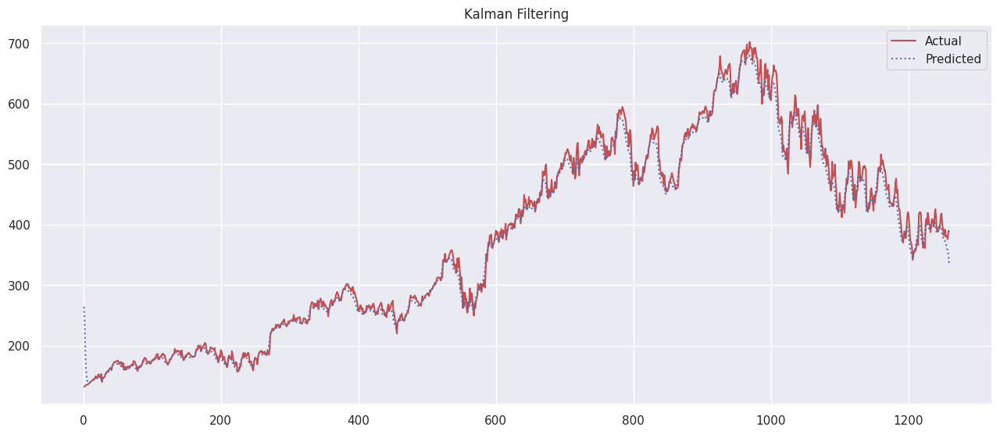

In [ ]:
Y = now['Close']
T = Y.shape[0]
mu = 1196;


param0 = np.array([0.3, 0.9, 0.8, 1.1])
param_star = minimize(Kalman_Filter, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})
y_pred = Kalman_Smoother(param_star.x, Y)

timevec = np.linspace(1,T,T)


fig= plt.figure(figsize=(14,6))
plt.plot(timevec, Y,'r-', label='Actual')
plt.plot(timevec, y_pred,'b:', label='Predicted')
plt.legend(loc='upper right')
plt.title("Kalman Filtering")
plt.show()

In [ ]:
results = pd.DataFrame({'Actual': list(Y),
                  'Predicted' : list(y_pred),
                  'Date':now['Date'],
                  'Open':now['Open'],
                  'Close':now['Close']
                       })


In [ ]:
results.set_index('Date',inplace = True)
results.head(10)

,Actual,Predicted,Open,Close
Date,,,,
2018-01-02,131.729996,264.173870,131.000000,131.729996
2018-01-03,132.910004,238.079362,132.000000,132.910004
2018-01-04,133.850006,186.449008,133.880005,133.850006
2018-01-05,135.009995,159.809237,134.949997,135.009995
2018-01-08,135.300003,146.759360,135.050003,135.300003
2018-01-09,135.449997,140.904384,135.649994,135.449997
2018-01-10,136.229996,138.758572,134.960007,136.229996
2018-01-11,137.580002,138.349788,136.589996,137.580002
2018-01-12,138.190002,138.593252,137.639999,138.190002


# 3.1 Long Short Day trading:
* if predicted > yesterdays close, buy and sell at end of day

* if predicted < yesterdays close, sell and buy at end of day

In [ ]:
amount = 10000
signal = 0
Amount = []
balance = 0
action = []
portfolio = 0
Portfolio = []
stocks = 0
Stocks = []

for i in range(len(results)-1):
    if results['Predicted'][i] > results['Actual'][i-1]:
        action.append('Buy at Open & Sell at Close')
        stocks = int(amount/results['Open'][i])
        balance = int(amount%results['Close'][i])
        portfolio = stocks * results ['Open'][i]
        print(i,'Buy at Open',round(portfolio,2),stocks,round(balance,2))
        
        
        # action.append('Sell at End')
        portfolio = stocks * results['Close'][i]
        signal = 0
        stocks = 0
        amount = balance + portfolio
        portfolio = 0
        balance = 0
        print(i,'Sell at Close',round(amount,2),balance)
        Amount.append(amount)
        # add by Hongbo
        Portfolio.append(round(portfolio,5))
        
    else:
        action.append('Sell at Open & Bull at Close')
        stocks = int(amount/results['Open'][i])
        balance = int(amount%results['Close'][i])
        portfolio = stocks * results ['Open'][i]
        print(i,'Sell at Open',round(portfolio,2),'-',stocks,round(balance,2))
        
        
        # action.append('Buy at Close')
        portfolio = stocks * results['Close'][i]
        signal = 0
        stocks = 0
        amount = balance + portfolio
        portfolio = 0
        balance = 0
        print(i,'Buy Back at Close',round(amount,2),balance)
        Amount.append(amount)
        # add by Hongbo
        Portfolio.append(round(portfolio,5))
    print('\n')
        

Streaming output truncated to the last 5000 lines.
8 Buy at Open 10460.64 76 34
8 Sell at Close 10536.44 0


9 Buy at Open 10457.68 74 52
9 Sell at Close 10396.46 0


10 Buy at Open 10280.59 73 118
10 Sell at Close 10395.67 0


11 Buy at Open 10274.75 73 93
11 Sell at Close 10395.49 0


12 Buy at Open 10309.79 73 9
12 Sell at Close 10394.71 0


13 Buy at Open 10390.09 73 33
13 Sell at Close 10537.7 0


14 Sell at Open 10410.48 - 72 138
14 Buy Back at Close 10536.96 0


15 Sell at Open 10398.24 - 72 65
15 Buy Back at Close 10536.68 0


16 Sell at Open 10429.19 - 71 57
16 Buy Back at Close 10390.34 0


17 Buy at Open 10301.2 70 58
17 Sell at Close 10539.8 0


18 Sell at Open 10471.3 - 70 96
18 Buy Back at Close 10392.3 0


19 Sell at Open 10370.97 - 71 131
19 Buy Back at Close 10538.89 0


20 Buy at Open 10407.6 70 117
20 Sell at Close 10537.9 0


21 Sell at Open 10471.44 - 69 146
21 Buy Back at Close 10689.89 0


22 Sell at Open 10686.21 - 71 56
22 Buy Back at Close 10688.96 0


23 Sell

In [ ]:
Strategy_Result = pd.DataFrame({'Actual_Close_Price':now.Close[1:],
                                 'Predicted_Close_Price':list(y_pred[1:]),
                                 'Date': now.Date[1:],
                                 'Action':  action,
                                 # 'Stocks': Stocks,
                                 'Portfolio($)': Portfolio,
                                 'Amount($)':Amount
                                    })

Strategy_Result.head()

,Actual_Close_Price,Predicted_Close_Price,Date,Action,Portfolio($),Amount($)
1,132.910004,238.079362,2018-01-03,Sell at Open & Bull at Close,0,10131.479675
2,133.850006,186.449008,2018-01-04,Buy at Open & Sell at Close,0,10131.160278
3,135.009995,159.809237,2018-01-05,Buy at Open & Sell at Close,0,10130.750458
4,135.300003,146.759360,2018-01-08,Buy at Open & Sell at Close,0,10130.749588
5,135.449997,140.904384,2018-01-09,Buy at Open & Sell at Close,0,10265.500229


<Axes: title={'center': 'Total Amount'}>

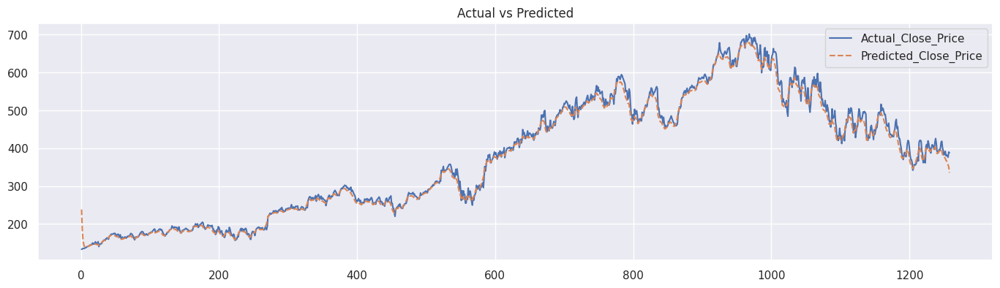

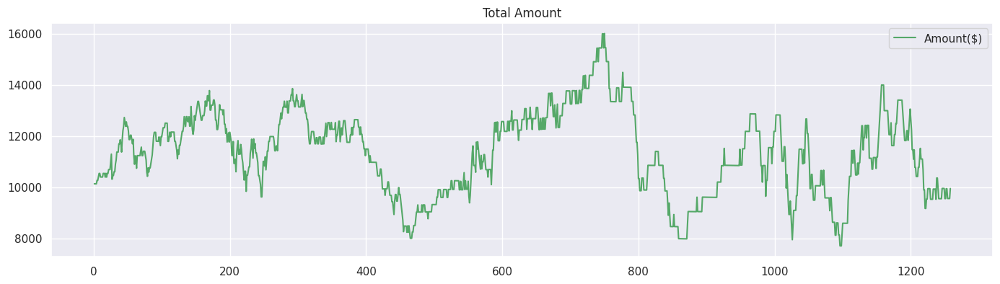

In [ ]:
Strategy_Result[['Actual_Close_Price','Predicted_Close_Price']].loc[0:].plot(figsize=(15,4), 
                                                                             style=['-','--'], 
                                                                             title = 'Actual vs Predicted')


Strategy_Result[['Amount($)']].loc[0:].plot(figsize=(15,4), 
                                            style=['-g'], 
                                            title = 'Total Amount')

In [ ]:
Profit = (Amount[-1])/10000
print('Initial_Investment : 10000$')
print('Final Amount:',Amount[-1],'$')      
print ('Profit_Percent:',Profit*100,'%')

Initial_Investment : 10000$
Final Amount: 9945.25015258789 $
Profit_Percent: 99.45250152587892 %


## Sharpe Ratio

In [ ]:
Strategy_Result['Returns'] = Strategy_Result['Amount($)'].pct_change()


In [ ]:
mean_returns = Strategy_Result['Returns'].mean()
sd = Strategy_Result['Returns'].std()
print(mean_returns,sd)
Market_RF = 0.0464


Sharpe_Ratio = np.sqrt(877)*(mean_returns)/sd
Sharpe_Ratio

0.000357835567649279 0.027288111362866848


0.38833794107964736

# 3.2 Buy & Hold Trading Strategy
 
# Buy if we have next days predicted_value greater than todays close value and hold if already bought 
# Sell if we have next days predicted_value lesser than todays close value and dont buy until rule 1

In [ ]:
signal = 0
amount = 10000
Amount = []
balance = 0
action = []
portfolio = 0
Portfolio = []
stocks = 0
Stocks = []


for i in range(len(results)-1):
    if results['Predicted'][i+1] > results['Actual'][i]:
        if signal == 0:
            action.append('Buy')
            stocks = int(amount / results['Actual'][i])
            balance = int(amount % results['Actual'][i])
            portfolio = stocks * results['Actual'][i]
            signal = 1
            amount = portfolio + balance
            print('Stock:',results['Actual'][i] ,'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Bought--Holding')
            portfolio = stocks * results['Actual'][i]
            amount = portfolio + balance
            print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
            
    elif results['Predicted'][i+1] < results['Actual'][i]:
        if signal == 1:
            action.append('Sell')
            portfolio = stocks * results['Actual'][i]
            
            signal = 0
            stocks = 0
            amount = balance + portfolio
            portfolio = 0
            balance = 0
            print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Price-Prediction-Already-Lower')
            print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
            
    print('\n')
    

Stock: 131.72999572753906 Action: Buy Portfolio: 9879.75 Stocks: 75 Balance_init: 120 total($) 9999.75


Stock: 132.91000366210938 Action: Bought--Holding Portfolio: 9968.25 Stocks: 75 Balance_init: 120 total($) 10088.25


Stock: 133.85000610351562 Action: Bought--Holding Portfolio: 10038.75 Stocks: 75 Balance_init: 120 total($) 10158.75


Stock: 135.00999450683594 Action: Bought--Holding Portfolio: 10125.75 Stocks: 75 Balance_init: 120 total($) 10245.75


Stock: 135.3000030517578 Action: Bought--Holding Portfolio: 10147.5 Stocks: 75 Balance_init: 120 total($) 10267.5


Stock: 135.4499969482422 Action: Bought--Holding Portfolio: 10158.75 Stocks: 75 Balance_init: 120 total($) 10278.75


Stock: 136.22999572753906 Action: Bought--Holding Portfolio: 10217.25 Stocks: 75 Balance_init: 120 total($) 10337.25


Stock: 137.5800018310547 Action: Bought--Holding Portfolio: 10318.5 Stocks: 75 Balance_init: 120 total($) 10438.5


Stock: 138.19000244140625 Action: Bought--Holding Portfolio: 10364.25 

In [ ]:
Strategy_Result = pd.DataFrame({'Actual_Close_Price':now.Close[1:],
                                 'Predicted_Close_Price':list(y_pred[1:]),
                                 'Date': now.Date[1:],
                                 'Action':  action,
                                 'Stocks': Stocks,
                                 'Portfolio($)': Portfolio,
                                 'Amount($)':Amount
                                    })

Strategy_Result.head()

,Actual_Close_Price,Predicted_Close_Price,Date,Action,Stocks,Portfolio($),Amount($)
1,132.910004,238.079362,2018-01-03,Buy,75,9879.74968,10000.0
2,133.850006,186.449008,2018-01-04,Bought--Holding,75,9968.25027,10088.0
3,135.009995,159.809237,2018-01-05,Bought--Holding,75,10038.75046,10159.0
4,135.300003,146.759360,2018-01-08,Bought--Holding,75,10125.74959,10246.0
5,135.449997,140.904384,2018-01-09,Bought--Holding,75,10147.50023,10268.0


<Axes: title={'center': 'Total Amount'}>

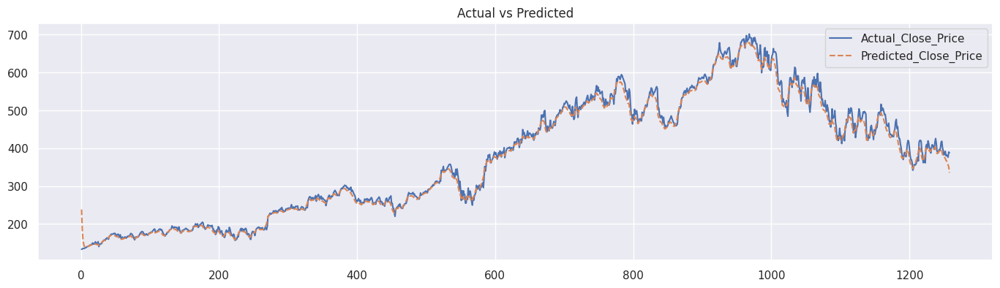

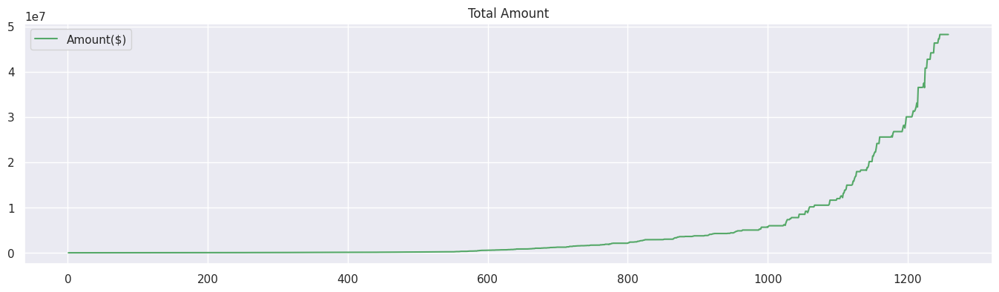

In [ ]:
Strategy_Result[['Actual_Close_Price','Predicted_Close_Price']].loc[0:].plot(figsize=(15,4), 
                                                                             style=['-','--'], 
                                                                             title = 'Actual vs Predicted')


Strategy_Result[['Amount($)']].loc[0:].plot(figsize=(15,4), 
                                            style=['-g'], 
                                            title = 'Total Amount')

In [ ]:
Profit = (Amount[-1])/10000
print('Initial_Investment : 10000$')
print('Final Amount:',Amount[-1],'$')      
print ('Profit_Percent:',Profit*100,'%')

Initial_Investment : 10000$
Final Amount: 48219848.0 $
Profit_Percent: 482198.48000000004 %


# Sharpe Ratio

In [ ]:
Strategy_Result['Returns'] = Strategy_Result['Amount($)'].pct_change()

In [ ]:
mean_returns = Strategy_Result['Returns'].mean()
sd = Strategy_Result['Returns'].std()
print(mean_returns,sd)
Market_RF = 0.0464


Sharpe_Ratio = np.sqrt(877)*(mean_returns)/sd
Sharpe_Ratio

0.006916859494521977 0.01750060391749545


11.70457677456381

# 3.3 Buy & Hold Trading Strategy with bolling bands

In [ ]:
long_MA = results['Actual'].rolling(window=20).mean()
results['Long_Moving_Avg'] = long_MA

In [ ]:
short_MA  = results['Actual'].rolling(window=5).mean()
results['Short_Moving_Avg'] = short_MA 

In [ ]:
long_std= results['Actual'].rolling(window=20).std()
results['Long_std'] = long_std

In [ ]:
long_upper_band = ((long_MA) + (long_std)*0.75)
results['Long_Upper_Band'] = long_upper_band

In [ ]:
long_lower_band = ((long_MA) - (long_std)*0.75)
results['Long_Lower_Band'] = long_lower_band

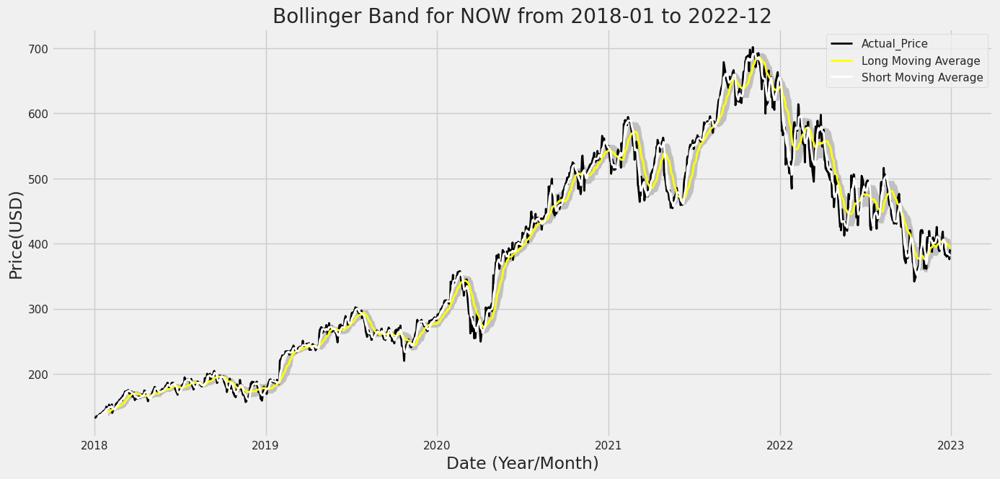

In [ ]:
plt.style.use('fivethirtyeight')
fig = plt.figure(figsize=(15,7))
ax = fig.add_subplot(111)
x_axis = results.index
ax.fill_between(x_axis, results['Long_Upper_Band'], results['Long_Lower_Band'], color='silver')
ax.plot(x_axis, results['Actual'], color='black', lw=2, label = 'Actual_Price')
ax.plot(x_axis, results['Long_Moving_Avg'], color='yellow', lw=2, label = 'Long Moving Average')
ax.plot(x_axis, results['Short_Moving_Avg'], color='white', lw=2, label = 'Short Moving Average')

ax.set_title('Bollinger Band for NOW from 2018-01 to 2022-12')
ax.set_xlabel('Date (Year/Month)')
ax.set_ylabel('Price(USD)')
ax.legend()
plt.show()

In [ ]:
signal = 0
amount = 10000
Amount = []
balance = 0
action = []
portfolio = 0
Portfolio = []
stocks = 0
Stocks = []


for i in range(len(results)-1):
    if results['Predicted'][i] > results['Long_Lower_Band'][i]:
        if signal == 0:
            
            action.append('Buy')
            stocks = int(amount / results['Actual'][i])
            balance = int(amount % results['Actual'][i])
            portfolio = stocks * results['Actual'][i]
            signal = 1
            amount = portfolio + balance
            print('Stock:',results['Actual'][i] ,'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Bought--Holding')
            portfolio = stocks * results['Actual'][i]
            amount = portfolio + balance
            print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
            
    elif results['Predicted'][i] < results['Long_Moving_Avg'][i]:
        if signal == 1:
            action.append('Sell')
            portfolio = stocks * results['Actual'][i]
            
            signal = 0
            stocks = 0
            amount = balance + portfolio
            portfolio = 0
            balance = 0
            print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Price-Prediction-Already-Lower')
            print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
    else:
        action.append('Do nothing')
        print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
        Portfolio.append(round(portfolio,5))
        Amount.append(round(amount,0))
        Stocks.append(stocks)

            
    print('\n')
    

Stock: 131.72999572753906 Action: Do nothing Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 132.91000366210938 Action: Do nothing Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 133.85000610351562 Action: Do nothing Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 135.00999450683594 Action: Do nothing Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 135.3000030517578 Action: Do nothing Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 135.4499969482422 Action: Do nothing Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 136.22999572753906 Action: Do nothing Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 137.5800018310547 Action: Do nothing Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 138.19000244140625 Action: Do nothing Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 139.7899932861328 Action: Do nothing Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10

In [ ]:
Strategy_Result = pd.DataFrame({'Actual_Close_Price':now.Close[1:],
                                 'Predicted_Close_Price':list(y_pred[1:]),
                                 'Date': now.Date[1:],
                                 'Action':  action,
                                 'Stocks': Stocks,
                                 'Portfolio($)': Portfolio,
                                 'Amount($)':Amount
                                    })

Strategy_Result.head()

,Actual_Close_Price,Predicted_Close_Price,Date,Action,Stocks,Portfolio($),Amount($)
1,132.910004,238.079362,2018-01-03,Do nothing,0,0.0,10000.0
2,133.850006,186.449008,2018-01-04,Do nothing,0,0.0,10000.0
3,135.009995,159.809237,2018-01-05,Do nothing,0,0.0,10000.0
4,135.300003,146.759360,2018-01-08,Do nothing,0,0.0,10000.0
5,135.449997,140.904384,2018-01-09,Do nothing,0,0.0,10000.0


<Axes: title={'center': 'Total Amount'}>

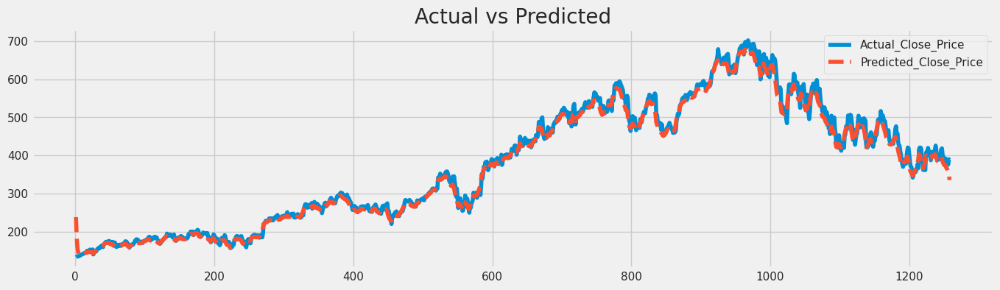

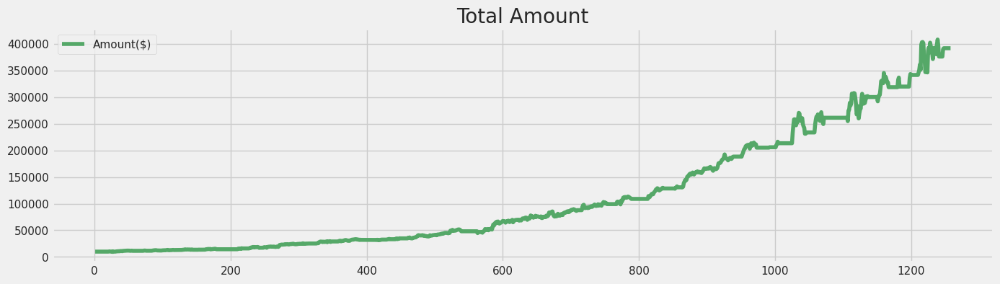

In [ ]:
Strategy_Result[['Actual_Close_Price','Predicted_Close_Price']].loc[0:].plot(figsize=(15,4), 
                                                                             style=['-','--'], 
                                                                             title = 'Actual vs Predicted')


Strategy_Result[['Amount($)']].loc[0:].plot(figsize=(15,4), 
                                            style=['-g'], 
                                            title = 'Total Amount')

In [ ]:
Profit = (Amount[-1])/10000
print('Initial_Investment : 10000$')
print('Final Amount:',Amount[-1],'$')      
print ('Profit_Percent:',Profit*100,'%')

Initial_Investment : 10000$
Final Amount: 391501.0 $
Profit_Percent: 3915.01 %


# Sharpe Ratio

In [ ]:
Strategy_Result['Returns'] = Strategy_Result['Amount($)'].pct_change()


In [ ]:
mean_returns = Strategy_Result['Returns'].mean()
sd = Strategy_Result['Returns'].std()
print(mean_returns,sd)
Market_RF = 0.0464


Sharpe_Ratio = np.sqrt(877)*(mean_returns)/sd
Sharpe_Ratio

0.0031149426508022687 0.01979058901921427


4.661129100111642

# 3.4 Buy & Hold Trading Strategy with Macd

In [ ]:
import numpy as np
import pandas as pd
def calculateEMA(period, closeArray, emaArray=[]):
    length = len(closeArray)
    nanCounter = np.count_nonzero(np.isnan(closeArray))
    if not emaArray:
        emaArray.extend(np.tile([np.nan],(nanCounter + period - 1)))
        firstema = np.mean(closeArray[nanCounter:nanCounter + period - 1])    
        emaArray.append(firstema)    
        for i in range(nanCounter+period,length):
            ema=(2*closeArray[i]+(period-1)*emaArray[-1])/(period+1)
            emaArray.append(ema)        
    return np.array(emaArray)
    
def calculateMACD(closeArray,shortPeriod = 12 ,longPeriod = 26 ,signalPeriod =9):
    ema12 = calculateEMA(shortPeriod ,closeArray,[])
    print(ema12)
    ema26 = calculateEMA(longPeriod ,closeArray,[])
    print(ema26)
    diff = ema12-ema26
    
    dea= calculateEMA(signalPeriod ,diff,[])
    macd = 2*(diff-dea)
    return macd,diff,dea

In [ ]:
macd, diff, dea=calculateMACD(results['Actual'])

[         nan          nan          nan ... 388.09596151 388.36581452
 388.35107214]
[         nan          nan          nan ... 392.87344715 392.64948855
 392.32508118]


In [ ]:
results['Macd'] = macd

In [ ]:
# for i in range(1, len(signals)):
#     # If the MACD crosses the signal line upward
#    if signals.long_mavg[i] > df['Y_hat_Kalman'][i] and signals.long_mavg[i - 1] <= df['Y_hat_Kalman'][i - 1]:
#        listLongShort.append("BUY")
#     # The other way around
#    elif signals.short_mavg[i] < df['Y_hat_Kalman'][i] and signals.short_mavg[i - 1] >= df['Y_hat_Kalman'][i - 1]:
#        listLongShort.append("SELL")
#     # Do nothing if not crossed
#    else:
#        listLongShort.append("HOLD")

signal = 0
amount = 10000
Amount = []
balance = 0
action = []
portfolio = 0
Portfolio = []
stocks = 0
Stocks = []


for i in range(len(results)-1):
    if results['Macd'][i] > 0:
        if signal == 0:
            
            action.append('Buy')
            stocks = int(amount / results['Actual'][i])
            balance = int(amount % results['Actual'][i])
            portfolio = stocks * results['Actual'][i]
            signal = 1
            amount = portfolio + balance
            print('Stock:',results['Actual'][i] ,'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Hold')
            portfolio = stocks * results['Actual'][i]
            amount = portfolio + balance
            print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
            
    elif results['Macd'][i] < 0:
        if signal == 1:
            action.append('Sell')
            portfolio = stocks * results['Actual'][i]
            
            signal = 0
            stocks = 0
            amount = balance + portfolio
            portfolio = 0
            balance = 0
            print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Hold')
            print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
    else:
        action.append('Hold')
        print('Stock:',results['Actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
        Portfolio.append(round(portfolio,5))
        Amount.append(round(amount,0))
        Stocks.append(stocks)

            
    print('\n')

Stock: 131.72999572753906 Action: Hold Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 132.91000366210938 Action: Hold Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 133.85000610351562 Action: Hold Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 135.00999450683594 Action: Hold Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 135.3000030517578 Action: Hold Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 135.4499969482422 Action: Hold Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 136.22999572753906 Action: Hold Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 137.5800018310547 Action: Hold Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 138.19000244140625 Action: Hold Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 139.7899932861328 Action: Hold Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10000


Stock: 140.7899932861328 Action: Hold Portfolio: 0 Sto

In [ ]:
Strategy_Result = pd.DataFrame({'Actual_Close_Price':now.Close[1:],
                                 'Predicted_Close_Price':list(y_pred[1:]),
                                 'Date': now.Date[1:],
                                 'Action':  action,
                                 'Stocks': Stocks,
                                 'Portfolio($)': Portfolio,
                                 'Amount($)':Amount
                                    })

Strategy_Result.head()

,Actual_Close_Price,Predicted_Close_Price,Date,Action,Stocks,Portfolio($),Amount($)
1,132.910004,238.079362,2018-01-03,Hold,0,0.0,10000.0
2,133.850006,186.449008,2018-01-04,Hold,0,0.0,10000.0
3,135.009995,159.809237,2018-01-05,Hold,0,0.0,10000.0
4,135.300003,146.759360,2018-01-08,Hold,0,0.0,10000.0
5,135.449997,140.904384,2018-01-09,Hold,0,0.0,10000.0


<Axes: title={'center': 'Total Amount'}>

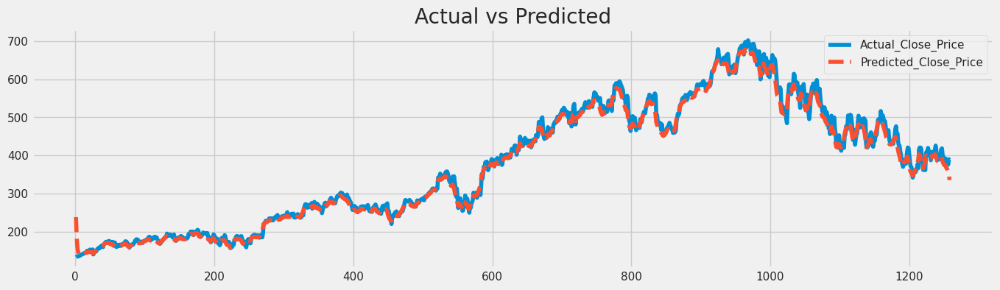

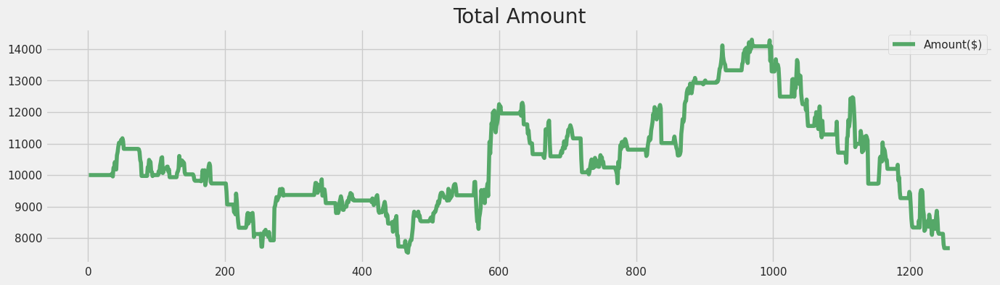

In [ ]:
Strategy_Result[['Actual_Close_Price','Predicted_Close_Price']].loc[0:].plot(figsize=(15,4), 
                                                                             style=['-','--'], 
                                                                             title = 'Actual vs Predicted')


Strategy_Result[['Amount($)']].loc[0:].plot(figsize=(15,4), 
                                            style=['-g'], 
                                            title = 'Total Amount')

In [ ]:
Profit = (Amount[-1])/10000
print('Initial_Investment : 10000$')
print('Final Amount:',Amount[-1],'$')      
print ('Profit_Percent:',Profit*100,'%')

Initial_Investment : 10000$
Final Amount: 7678.0 $
Profit_Percent: 76.78 %


In [ ]:
Strategy_Result['Returns'] = Strategy_Result['Amount($)'].pct_change()


# Sharpe Ratio

In [ ]:
mean_returns = Strategy_Result['Returns'].mean()
sd = Strategy_Result['Returns'].std()
print(mean_returns,sd)
Market_RF = 0.0464


Sharpe_Ratio = np.sqrt(877)*(mean_returns)/sd
Sharpe_Ratio

-6.121519232191919e-05 0.017281868638263812


-0.10489826745779651

# 4. Model evaluaion

# RMSE Value

In [ ]:
from sklearn.metrics import mean_squared_error
rms = sqrt(mean_squared_error(Strategy_Result['Actual_Close_Price'], Strategy_Result['Predicted_Close_Price']))
sqrt(rms)

3.5719182786853514

# R-square

In [ ]:
from sklearn.metrics import r2_score

r2_score(Strategy_Result['Actual_Close_Price'], Strategy_Result['Predicted_Close_Price']) 

# Use Package and smaCross strategy to backTesting

In [ ]:
import pandas as pd


def SMA(values, n):
    """
    Return simple moving average of `values`, at
    each step taking into account `n` previous values.
    """
    return pd.Series(values).rolling(n).mean()

In [ ]:
!pip install Backtesting

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.5/175.5 kB 6.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for Backtesting: filename=Backtesting-0.3.3-py3-none-any.whl size=173817 sha256=33ccbacab6c5201866dd5cfdc10a82b084925f217d3101d3c5da07ef5581452b
  Stored in directory: /root/.cache/pip/wheels/3f/7c/24/f8816cdb5359accfe50ebbb023baf41e98592f11528ed26ce6
Successfully built Backtesting


In [ ]:
from backtesting.test import SMA


/usr/local/lib/python3.9/dist-packages/backtesting/_plotting.py:50: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support (e.g. PyCharm, Spyder IDE). Reset with `backtesting.set_bokeh_output(notebook=False)`.
  warnings.warn('Jupyter Notebook detected. '


In [ ]:
from backtesting import Strategy
from backtesting.lib import crossover


class SmaCross(Strategy):
    
    # Define the two MA lags as *class variables*
    # for later optimization
    n1 = 10
    n2 = 20
    
    def init(self):
        # Precompute two moving averages
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
    
    def next(self):
        # If sma1 crosses above sma2, buy the asset
        if crossover(self.sma1, self.sma2):
            self.buy()

        # Else, if sma1 crosses below sma2, sell it
        elif crossover(self.sma2, self.sma1):
            self.sell()

In [ ]:
from backtesting import Backtest

bt = Backtest(df_now, SmaCross, cash=10000, commission=.002)
bt.run()

Start                     2018-01-02 00:00:00
End                       2022-12-30 00:00:00
Duration                   1823 days 00:00:00
Exposure Time [%]                   36.775218
Equity Final [$]                          0.0
Equity Peak [$]                  10277.561788
Return [%]                             -100.0
Buy & Hold Return [%]              194.746832
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]             2189.710951
Sharpe Ratio                              0.0
Sortino Ratio                             0.0
Calmar Ratio                              0.0
Max. Drawdown [%]                      -100.0
Avg. Drawdown [%]                  -45.509245
Max. Drawdown Duration     1502 days 00:00:00
Avg. Drawdown Duration      579 days 00:00:00
# Trades                                    1
Win Rate [%]                              0.0
Best Trade [%]                    -111.822148
Worst Trade [%]                   -111.822148
Avg. Trade [%]                    

In [ ]:
bt.plot()

Row(id='1449', ...)

# ELASTIC NET

In [ ]:
import pandas_datareader as web
import datetime
import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import math
import seaborn as sns
import pandas_datareader.data as web


In [ ]:
# Define start and end dates
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

# Fetch the data for NOW stock from Yahoo Finance
ticker="NOW"
df_now = yf.download(ticker, start=start, end=end)

now= df_now
now

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700
2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900
2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900
2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000
2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200
...,...,...,...,...,...,...
2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600
2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900
2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100


In [ ]:
now.head()
now.count()

Open         1259
High         1259
Low          1259
Close        1259
Adj Close    1259
Volume       1259
dtype: int64

In [ ]:
now['lrets'] = (np.log(now.Close) - np.log(now.Close.shift(1))) * 100.
now.head()

,Open,High,Low,Close,Adj Close,Volume,lrets
Date,,,,,,,
2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,NaN
2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.891789
2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.704758
2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.862899
2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.214575


In [ ]:
now['Stock_Price'] = (2*now.High + now.Low + now.Close)/4

In [ ]:
now= now.round(2)
now.tail(100)

,Open,High,Low,Close,Adj Close,Volume,lrets,Stock_Price
Date,,,,,,,,
2022-08-10,501.96,516.62,500.98,516.20,516.20,1831900,5.73,512.61
2022-08-11,520.00,521.58,497.42,499.45,499.45,1481800,-3.30,510.01
2022-08-12,504.44,508.00,492.99,506.51,506.51,1662200,1.40,503.88
2022-08-15,502.00,511.00,498.56,504.07,504.07,992900,-0.48,506.16
2022-08-16,499.00,500.40,491.55,496.74,496.74,1432400,-1.46,497.27
...,...,...,...,...,...,...,...,...
2022-12-23,375.00,381.90,371.47,381.86,381.86,856600,0.50,379.28
2022-12-27,380.15,383.83,374.11,380.64,380.64,828900,-0.32,380.60
2022-12-28,380.43,385.62,372.74,376.05,376.05,772100,-1.21,380.01


In [ ]:
x=now.drop(['Close'],axis=1)
y=now['Close']
now= now.fillna(0)

###Splitting Data into training and testing Datasets

In [ ]:
x

,Open,High,Low,Adj Close,Volume,lrets,Stock_Price
Date,,,,,,,
2018-01-02,131.00,132.35,130.14,131.73,1282700,NaN,131.64
2018-01-03,132.00,133.25,131.74,132.91,1580900,0.89,132.79
2018-01-04,133.88,135.09,133.78,133.85,1361900,0.70,134.45
2018-01-05,134.95,135.13,133.90,135.01,1183000,0.86,134.79
2018-01-08,135.05,136.09,134.87,135.30,1337200,0.21,135.59
...,...,...,...,...,...,...,...
2022-12-23,375.00,381.90,371.47,381.86,856600,0.50,379.28
2022-12-27,380.15,383.83,374.11,380.64,828900,-0.32,380.60
2022-12-28,380.43,385.62,372.74,376.05,772100,-1.21,380.01


In [ ]:
x=x.dropna()
y=y[1:]

In [ ]:
xtrain= x[:999]
xtest = x[999:]
ytrain= y[:999]
ytest=  y[999:]

In [ ]:
xtrain = xtrain.dropna()

Alpha:0.0001, R2:1.00, MSE:9.66, RMSE:3.11
Alpha:0.0010, R2:1.00, MSE:9.66, RMSE:3.11
Alpha:0.0100, R2:1.00, MSE:9.64, RMSE:3.10
Alpha:0.1000, R2:1.00, MSE:9.44, RMSE:3.07
Alpha:0.3000, R2:1.00, MSE:9.01, RMSE:3.00
Alpha:0.5000, R2:1.00, MSE:8.62, RMSE:2.94
Alpha:0.7000, R2:1.00, MSE:8.27, RMSE:2.88
Alpha:1.0000, R2:1.00, MSE:7.79, RMSE:2.79
R2:0.993, MSE:38.61, RMSE:6.21


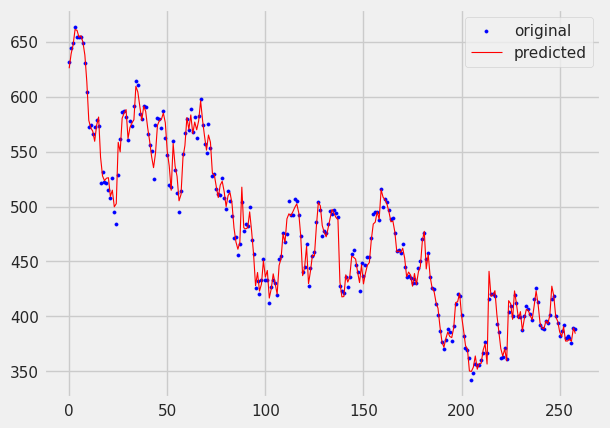

0.0001
0.023997543380687603
R2:0.993, MSE:38.66, RMSE:6.22


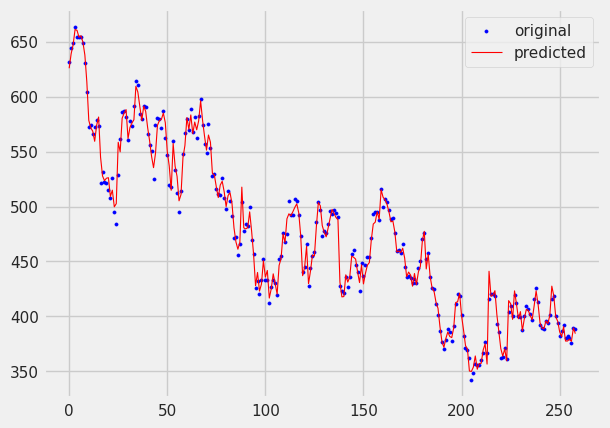

In [ ]:
from sklearn.linear_model import ElasticNet,ElasticNetCV
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


alphas = [0.0001, 0.001, 0.01, 0.1, 0.3, 0.5, 0.7, 1]

for a in alphas:
    model = ElasticNet(alpha=a).fit(x,y)   
    score = model.score(x, y)
    pred_y = model.predict(x)
    mse = mean_squared_error(y, pred_y)   
    print("Alpha:{0:.4f}, R2:{1:.2f}, MSE:{2:.2f}, RMSE:{3:.2f}"
       .format(a, score, mse, np.sqrt(mse)))

elastic=ElasticNet(alpha=0.01).fit(xtrain, ytrain)
ypred = elastic.predict(xtest)
score = elastic.score(xtest, ytest)
mse = mean_squared_error(ytest, ypred)
print("R2:{0:.3f}, MSE:{1:.2f}, RMSE:{2:.2f}"
      .format(score, mse, np.sqrt(mse)))

x_ax = range(len(xtest))
plt.scatter(x_ax, ytest, s=5, color="blue", label="original")
plt.plot(x_ax, ypred, lw=0.8, color="red", label="predicted")
plt.legend()
plt.show()


# --- ElasticNetCV ----
elastic_cv=ElasticNetCV(alphas=alphas, cv=5)
model = elastic_cv.fit(xtrain, ytrain)
print(model.alpha_)
print(model.intercept_)

ypred = model.predict(xtest)
score = model.score(xtest, ytest)
mse = mean_squared_error(ytest, ypred)
print("R2:{0:.3f}, MSE:{1:.2f}, RMSE:{2:.2f}"
      .format(score, mse, np.sqrt(mse)))

x_ax = range(len(xtest))
plt.scatter(x_ax, ytest, s=5, color="blue", label="original")
plt.plot(x_ax, ypred, lw=0.8, color="red", label="predicted")
plt.legend()
plt.show()


## Monte Carlo

#### We are using a Monte Carlo simulation to look at the potential evolution of NOW prices over time, assuming they are subject to daily returns that follow a normal distribution 

#### Monte Carlo simulations are used to model the probability of different outcomes in a process that cannot easily be predicted due to the intervention of random variables. It is a technique used to understand the impact of risk and uncertainty in prediction and forecasting models.

#### If we want to buy a NOW stock,  we may like to try to look into the future and attempt to predict what kind of returns we can expect with what kind of probability

#### just assuming past mean return and volatility levels will continue into the future#### 

In [ ]:
from math import sqrt
#calculate the compound annual growth rate (CAGR) which 
#will give us our mean return input (mu) 
days = (now.index[-1] - now.index[0]).days
cagr = ((((now['Adj Close'][-1]) / now['Adj Close'][1])) ** (365.0/days)) - 1
print ('CAGR(compound annual growth rate) =',str(round(cagr,4)*100)+"%")
mu = cagr

#create a series of percentage returns and calculate 
#the annual volatility of returns
now['Returns'] = now['Adj Close'].pct_change()
vol = now['Returns'].std()*sqrt(252)
print ("Annual Volatility =",str(round(vol,4)*100)+"%")

CAGR(compound annual growth rate) = 23.94%
Annual Volatility = 43.85%


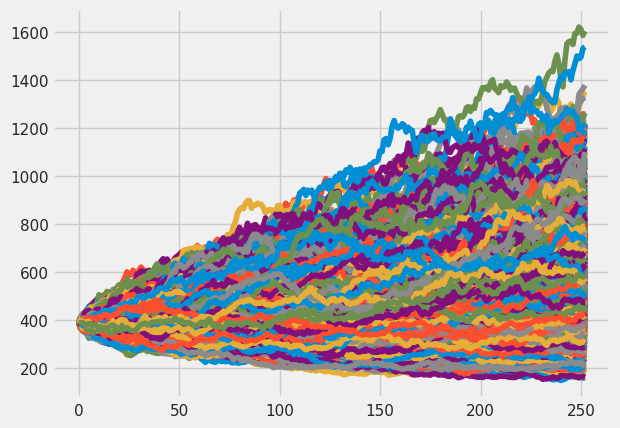

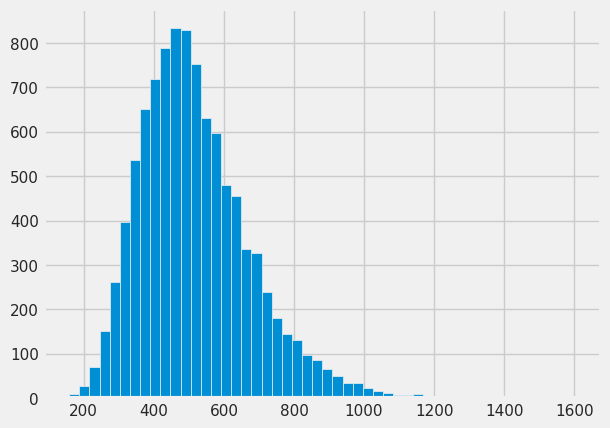

In [ ]:
#Define Variables
S = now['Adj Close'][-1] #starting stock price (i.e. last available real stock price)
T = 252 #Number of trading days
mu = 0.2926 #Return
vol = 0.2979 #Volatility
#set up empty list to hold our ending values for each simulated price series
result = []
#choose number of runs to simulate - I have chosen 10,000
for i in range(10000):
    #create list of daily returns using random normal distribution
    daily_returns=np.random.normal(mu/T,vol/math.sqrt(T),T)+1
    
    #set starting price and create price series generated by above random daily returns
    price_list = [S]
    
    for x in daily_returns:
        price_list.append(price_list[-1]*x)

    #plot data from each individual run which we will plot at the end
    plt.plot(price_list)
    
    #append the ending value of each simulated run to the empty list we created at the beginning
    result.append(price_list[-1])

#show the plot of multiple price series created above
plt.show()

#create histogram of ending stock values for our mutliple simulations
plt.hist(result,bins=50)
plt.show()


In [ ]:
#use numpy mean function to calculate the mean of the result
print(round(np.mean(result),2))

517.54


In [ ]:
print("5% quantile =",np.percentile(result,5))
print("95% quantile =",np.percentile(result,95))

5% quantile = 300.38460550933513
95% quantile = 810.1226017098345


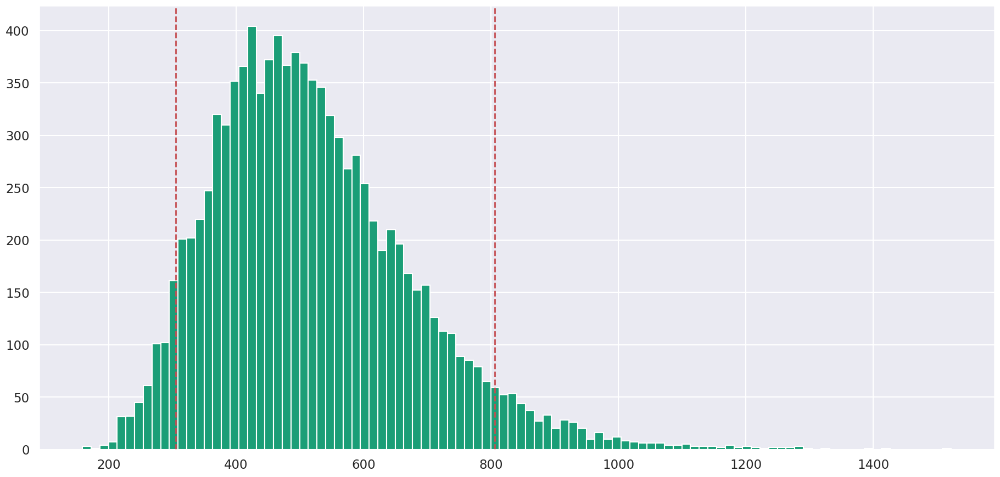

In [ ]:
plt.hist(result,bins=100)
plt.axvline(np.percentile(result,5), color='r', linestyle='dashed', linewidth=2)
plt.axvline(np.percentile(result,95), color='r', linestyle='dashed', linewidth=2)
plt.show()

GARCH MODEL

GARCH is a statistical model that can be used to analyze a number of different types of financial data, for instance,
macroeconomic data. Financial institutions typically use this model to estimate the volatility of returns for stocks, bonds, and
market indices.

The general process for a GARCH model involves three steps. 

The first is to estimate a best-fitting autoregressive
model. 

The second is to compute autocorrelations of the error term. 

The third step is to test for significance.


Model is used for the variance of a time series. 

rt = μ + σtεt
Where εt is the standard normal and is the σt variance.

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
from datetime import datetime
import datetime
import math
import scipy.stats as ss
import seaborn as sns; sns.set(color_codes=True)
from math import sqrt
from sklearn.metrics import mean_squared_error

import scipy.optimize as opt

# extract data from various Internet sources into a pandas DataFrame
import pandas_datareader as web

In [ ]:

start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

ticker = 'NOW'
df_now = yf.download(ticker, start=start, end=end)

ticker2= 'ORCL'
df_oracle = yf.download(ticker2, start=start, end=end)

oracle=df_oracle
now= df_now

now=now.reset_index()
now['Date'] = pd.to_datetime(now['Date'])

now 


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,Date,Open,High,Low,Close,Adj Close,Volume
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200
...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500


In [ ]:
now.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [ ]:
now.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1.259000e+03
mean,376.542057,382.593511,370.023249,376.424940,376.424940,1.795765e+06
std,157.070780,159.227072,154.493080,156.851941,156.851941,1.403187e+06
min,131.000000,132.350006,130.139999,131.729996,131.729996,3.057000e+05
25%,242.284996,244.735001,239.000000,241.285004,241.285004,1.183400e+06
50%,383.970001,389.700012,375.679993,383.369995,383.369995,1.570500e+06
75%,508.940002,517.599976,500.660004,507.289993,507.289993,2.053800e+06
max,702.000000,707.599976,689.150024,701.729980,701.729980,3.780290e+07


In [ ]:
oracle.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1.259000e+03
mean,62.875147,63.560612,62.274543,62.902852,60.256547,1.283694e+07
std,14.633899,14.788031,14.467217,14.616476,15.226464,7.385913e+06
min,41.119999,43.400002,39.709999,39.799999,37.729893,2.754900e+06
25%,51.895000,52.465000,51.295000,51.795000,48.414019,7.914800e+06
50%,56.340000,56.830002,56.020000,56.310001,53.388134,1.106650e+07
75%,75.605000,76.639999,74.695000,75.870003,74.342075,1.547730e+07
max,104.290001,106.339996,102.279999,103.650002,101.078369,6.860100e+07


In Stock trading, the **high**, **low** refers to the maximum and the minimum prices in a given time period. **Open** and **Close** are thhighLowOpenClosee prices at which a stock began and ended trading in the same period. **Volume** is the total amount of trading activity. Adjusted values factor in corporate actions such as dividends, stock splits, and new share issuance.

In [ ]:
now['Typical_Price'] = now[['High','Low','Close']].mean(axis=1)
now['lrets'] = (np.log(now.Close) - np.log(now.Close.shift(1))) * 100.
now.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575


In [ ]:
oracle['Typical_Price'] = oracle[['High','Low','Close']].mean(axis=1)
oracle['lrets'] = (np.log(oracle.Close) - np.log(oracle.Close.shift(1))) * 100.
oracle.head()

,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
Date,,,,,,,,
2018-01-02,47.570000,47.799999,46.169998,46.630001,42.586105,25380000,46.866666,NaN
2018-01-03,47.529999,48.070000,47.439999,47.709999,43.572437,24165000,47.739999,2.289687
2018-01-04,47.990002,48.189999,47.720001,48.180000,44.001671,19815100,48.030000,0.980300
2018-01-05,48.419998,48.630001,48.279999,48.470001,44.266529,14496400,48.460000,0.600107
2018-01-08,48.299999,49.070000,47.939999,48.980000,44.732296,15075000,48.663333,1.046697


<Axes: xlabel='lrets', ylabel='Density'>

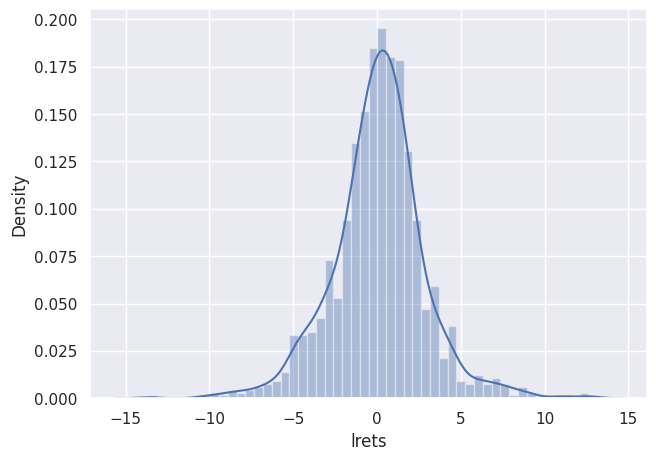

In [ ]:
sns.distplot(now['lrets'].dropna())

<Axes: xlabel='lrets', ylabel='Density'>

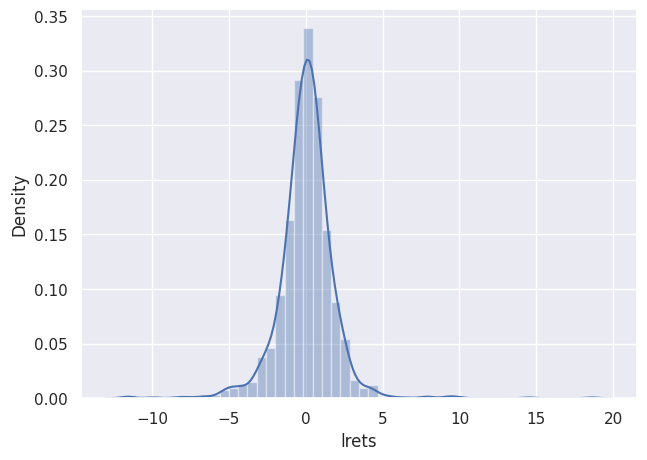

In [ ]:
sns.distplot(oracle['lrets'].dropna())

In [ ]:
def GARCH(Y):
    "Initialize Params:"
    mu = param0[0]
    omega = param0[1]
    alpha = param0[2]
    beta = param0[3]
    T = Y.shape[0]
    GARCH_Dens = np.zeros(T) 
    sigma2 = np.zeros(T)   
    F = np.zeros(T)   
    v = np.zeros(T)   
    for t in range(1,T):
        sigma2[t] = omega + alpha*((Y[t-1]-mu)**2)+beta*(sigma2[t-1]); 
        F[t] = Y[t] - mu-np.sqrt(sigma2[t])*np.random.normal(0,1,1)
        v[t] = sigma2[t]
        GARCH_Dens[t] = (1/2)*np.log(2*np.pi)+(1/2)*np.log(v[t])+(1/2)*(F[t]/v[t])     
        Likelihood = np.sum(GARCH_Dens[1:-1])  
    return Likelihood

In [ ]:
def GARCH_Prod(params, Y0, T):
    mu = params[0]
    omega = params[1]
    alpha = params[2]
    beta = params[3]
    Y = np.zeros(T)  
    sigma2 = np.zeros(T)
    Y[0] = Y0
    sigma2[0] = 0.0001
    for t in range(1,T):
        sigma2[t] = omega + alpha*((Y[t-1]-mu)**2)+beta*(sigma2[t-1]); 
        Y[t] = mu+np.sqrt(sigma2[t])*np.random.normal(0,1,1)    
    return Y

         Current function value: 2.948327
         Iterations: 0
         Function evaluations: 122
         Gradient evaluations: 22


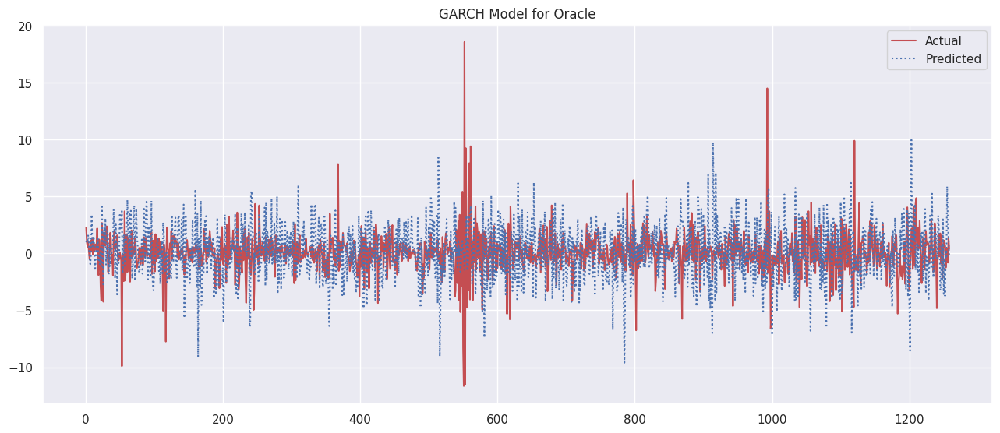

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Insert your GARCH and GARCH_Prod functions here

Y = oracle['lrets'].dropna()
T = len(Y)

param0 = np.array([0.124, 1.88, 0.2, 0.5])
param_star = minimize(GARCH, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})

Y_GARCH = GARCH_Prod(param_star.x, Y[1], T)
timevec = np.linspace(1, T, T)

fig = plt.figure(figsize=(14, 6))
plt.plot(timevec, Y, 'r-', label='Actual')
plt.plot(timevec, Y_GARCH, 'b:', label='Predicted')

plt.legend(loc='upper right')
plt.title("GARCH Model for Oracle")
plt.show()


In [ ]:
dif_oracle = pd.DataFrame({'Actual':list(Y),
                     'Predicted':list(Y_GARCH)})
dif_oracle

,Actual,Predicted
0,2.289687,0.980300
1,0.980300,1.133387
2,0.600107,1.024423
3,1.046697,1.642530
4,0.163202,0.702444
...,...,...
1253,0.446264,-0.414244
1254,0.160668,5.889372
1255,-0.805908,2.616256
1256,1.323212,1.345413


In [ ]:
rms_oracle = sqrt(mean_squared_error(dif['Actual'],dif['Predicted']))
rms_oracle

2.4283644221716076

         Current function value: 2.531892
         Iterations: 3
         Function evaluations: 136
         Gradient evaluations: 25


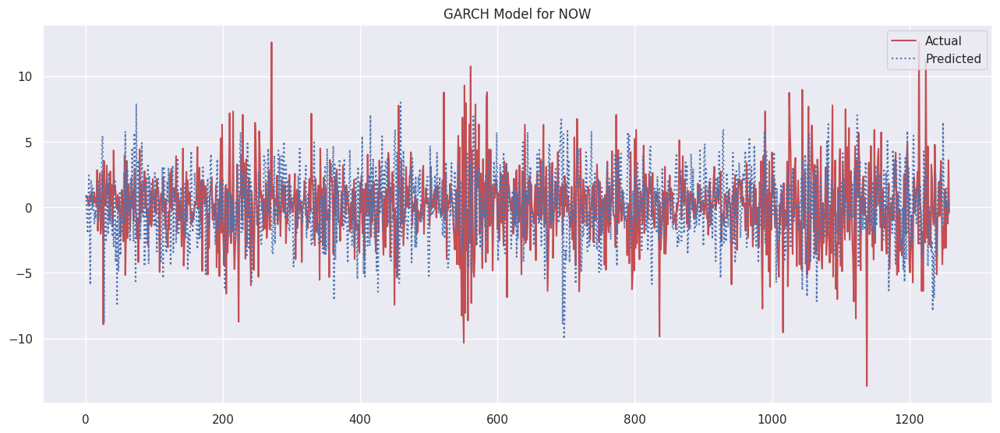

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# Insert your GARCH and GARCH_Prod functions here

Y = now['lrets'].dropna()
T = len(Y)

param0 = np.array([0.124, 1.88, 0.2, 0.5])
param_star = minimize(GARCH, param0, method='BFGS', options={'xtol': 1e-8, 'disp': True})

Y_GARCH = GARCH_Prod(param_star.x, Y[1], T)
timevec = np.linspace(1, T, T)

fig = plt.figure(figsize=(14, 6))
plt.plot(timevec, Y, 'r-', label='Actual')
plt.plot(timevec, Y_GARCH, 'b:', label='Predicted')

plt.legend(loc='upper right')
plt.title("GARCH Model for NOW")
plt.show()


In [ ]:
dif = pd.DataFrame({'Actual':list(Y),
                     'Predicted':list(Y_GARCH)})

In [ ]:
dif

,Actual,Predicted
0,0.891789,0.891789
1,0.704758,1.530545
2,0.862899,-0.504677
3,0.214575,1.398968
4,0.110799,-0.017710
...,...,...
1253,0.504066,-2.651097
1254,-0.319993,0.228627
1255,-1.213200,0.611898
1256,3.603998,2.112909


In [ ]:
dif.head()

,Actual,Predicted
0,0.891789,0.891789
1,0.704758,1.530545
2,0.862899,-0.504677
3,0.214575,1.398968
4,0.110799,-0.017710


In [ ]:
rms = sqrt(mean_squared_error(dif['Actual'],dif['Predicted']))
rms

3.784345913994592

In [ ]:
y_pred = [] * 1000

for i in range(len(dif)+1):
    if i == 0:
        y_pred.append(636.989990)
    else:
        y_pred.append(math.exp(dif['Predicted'][i-1]/100) * y_pred[i-1])

In [ ]:

Predicted = pd.DataFrame({'Actual_Close_Price':now.Close,
                     'Predicted_Close_Price':list(y_pred),
                         'Date': now.Date})
Predicted.set_index('Date')

,Actual_Close_Price,Predicted_Close_Price
Date,,
2018-01-02,131.729996,636.989990
2018-01-03,132.910004,642.696004
2018-01-04,133.850006,652.608417
2018-01-05,135.009995,649.323148
2018-01-08,135.300003,658.470810
...,...,...
2022-12-23,381.859985,1468.765000
2022-12-27,380.640015,1472.126831
2022-12-28,376.049988,1481.162361



# Checking Return Volatility with Actual and Predicted Values

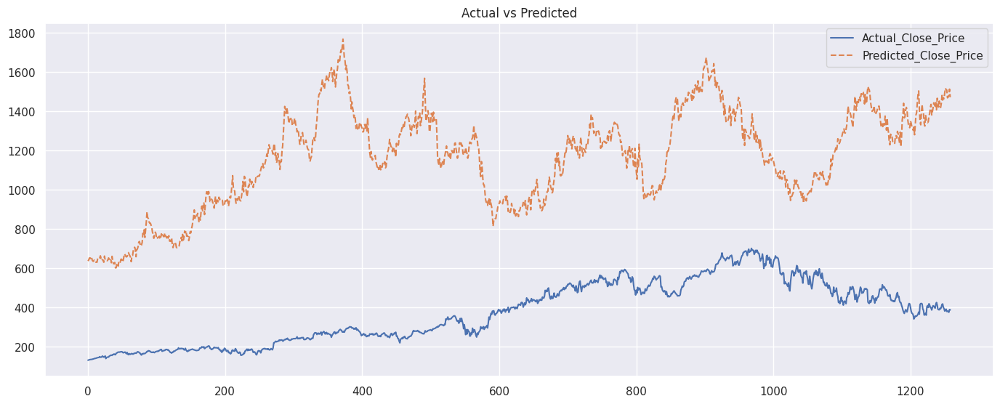

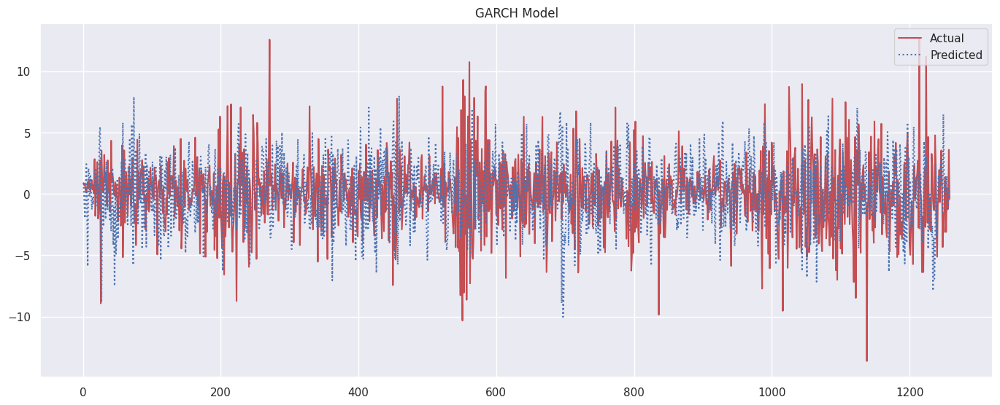

In [ ]:
Predicted[['Actual_Close_Price','Predicted_Close_Price']].loc[0:].plot(figsize=(15,6), style=['-','--'], 
                                                                    title = 'Actual vs Predicted')
fig= plt.figure(figsize=(15,6))
plt.plot(timevec, Y,'r-', label='Actual')
plt.plot(timevec, Y_GARCH,'b:', label='Predicted')
plt.legend(loc='upper right')
plt.title("GARCH Model")
plt.show()

In [ ]:
Predicted.head()


,Actual_Close_Price,Predicted_Close_Price,Date
0,131.729996,636.989990,2018-01-02
1,132.910004,642.696004,2018-01-03
2,133.850006,652.608417,2018-01-04
3,135.009995,649.323148,2018-01-05
4,135.300003,658.470810,2018-01-08


## Trading Strategy
#### 1.Buy if we have next days predicted_value greater than todays close value and hold if already bought
#### 2.Sell if we have next days predicted_value lesser than todays close value and dont buy until rule 1

In [ ]:
signal = 0
amount = 10000
Amount = []
balance = 0
action = []
portfolio = 0
Portfolio = []
stocks = 0
Stocks = []


for i in range(len(Predicted)-1):
    if Predicted['Predicted_Close_Price'][i+1] > Predicted['Actual_Close_Price'][i]:
        if signal == 0:
            action.append('Buy')
            stocks = int(amount / Predicted['Actual_Close_Price'][i])
            balance = int(amount % Predicted['Actual_Close_Price'][i])
            portfolio = stocks * Predicted['Actual_Close_Price'][i]
            signal = 1
            amount = portfolio + balance
            print('Stock:',Predicted['Actual_Close_Price'][i] ,'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Bought--Holding')
            portfolio = stocks * Predicted['Actual_Close_Price'][i]
            amount = portfolio + balance
            print('Stock:',Predicted['Actual_Close_Price'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
            
    elif Predicted['Predicted_Close_Price'][i+1] < Predicted['Actual_Close_Price'][i]:
        if signal == 1:
            action.append('Sell')
            portfolio = stocks * Predicted['Actual_Close_Price'][i]
            
            signal = 0
            stocks = 0
            amount = balance + portfolio
            portfolio = 0
            balance = 0
            print('Stock:',Predicted['Actual_Close_Price'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Price-Prediction-Already-Lower')
            print('Stock:',Predicted['Actual_Close_Price'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
            
    print('\n')

Stock: 131.72999572753906 Action: Buy Portfolio: 9879.75 Stocks: 75 Balance_init: 120 total($) 9999.75


Stock: 132.91000366210938 Action: Bought--Holding Portfolio: 9968.25 Stocks: 75 Balance_init: 120 total($) 10088.25


Stock: 133.85000610351562 Action: Bought--Holding Portfolio: 10038.75 Stocks: 75 Balance_init: 120 total($) 10158.75


Stock: 135.00999450683594 Action: Bought--Holding Portfolio: 10125.75 Stocks: 75 Balance_init: 120 total($) 10245.75


Stock: 135.3000030517578 Action: Bought--Holding Portfolio: 10147.5 Stocks: 75 Balance_init: 120 total($) 10267.5


Stock: 135.4499969482422 Action: Bought--Holding Portfolio: 10158.75 Stocks: 75 Balance_init: 120 total($) 10278.75


Stock: 136.22999572753906 Action: Bought--Holding Portfolio: 10217.25 Stocks: 75 Balance_init: 120 total($) 10337.25


Stock: 137.5800018310547 Action: Bought--Holding Portfolio: 10318.5 Stocks: 75 Balance_init: 120 total($) 10438.5


Stock: 138.19000244140625 Action: Bought--Holding Portfolio: 10364.25 

### Created a dataframe with all the information


In [ ]:
Strategy_Result = pd.DataFrame({'Actual_Close_Price':now.Close[1:],
                                 'Predicted_Close_Price':list(y_pred[1:]),
                                 'Date': now.Date[1:],
                                 'Action':  action,
                                 'Stocks': Stocks,
                                 'Portfolio($)': Portfolio,
                                 'Amount($)':Amount
                                    })

Strategy_Result.head()

,Actual_Close_Price,Predicted_Close_Price,Date,Action,Stocks,Portfolio($),Amount($)
1,132.910004,642.696004,2018-01-03,Buy,75,9879.74968,10000.0
2,133.850006,652.608417,2018-01-04,Bought--Holding,75,9968.25027,10088.0
3,135.009995,649.323148,2018-01-05,Bought--Holding,75,10038.75046,10159.0
4,135.300003,658.470810,2018-01-08,Bought--Holding,75,10125.74959,10246.0
5,135.449997,658.354202,2018-01-09,Bought--Holding,75,10147.50023,10268.0


### Profit Made with this Strategy


<Axes: title={'center': 'Total Amount'}>

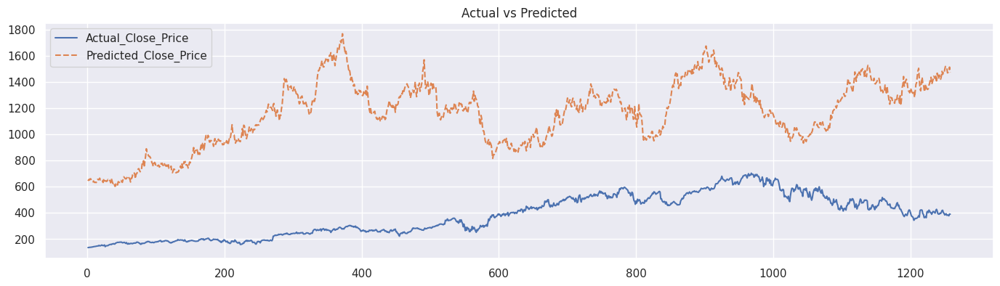

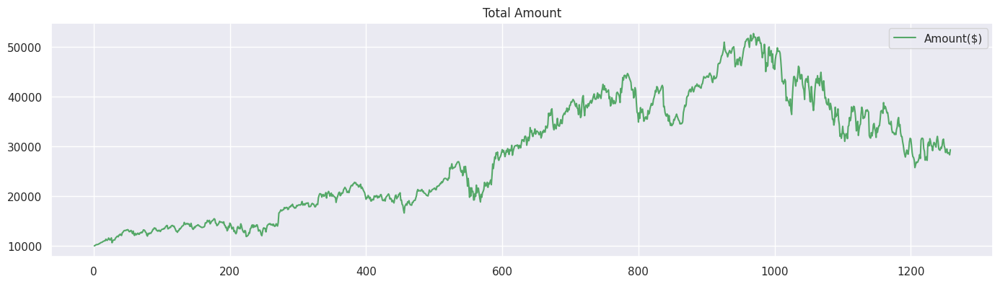

In [ ]:
Strategy_Result[['Actual_Close_Price','Predicted_Close_Price']].loc[0:].plot(figsize=(15,4), 
                                                                             style=['-','--'], 
                                                                             title = 'Actual vs Predicted')


Strategy_Result[['Amount($)']].loc[0:].plot(figsize=(15,4), 
                                            style=['-g'], 
                                            title = 'Total Amount')

In [ ]:
Profit = (Amount[-1])/10000
print('Initial_Investment : 10000$')
print('Final Amount:',Amount[-1],'$')      
print ('Profit_Percent:',Profit*100,'%')

Initial_Investment : 10000$
Final Amount: 29359.0 $
Profit_Percent: 293.59000000000003 %


In [ ]:
rms = sqrt(mean_squared_error(Strategy_Result['Actual_Close_Price'], Strategy_Result['Predicted_Close_Price']))
rms

816.6152034865595

### Sharp Ratio¶


In [ ]:

Strategy_Result['Returns'] = Strategy_Result['Amount($)'].pct_change()

In [ ]:
mean_returns = Strategy_Result['Returns'].mean()
sd = Strategy_Result['Returns'].std()
print(mean_returns,sd)
Market_RF = 0.0464


Sharpe_Ratio = np.sqrt(877)*(mean_returns)/sd
Sharpe_Ratio

0.0012337648618143593 0.02749478070064824


1.3288682763702158

In [ ]:
rms = sqrt(mean_squared_error(Strategy_Result['Actual_Close_Price'], Strategy_Result['Predicted_Close_Price']))


In [ ]:
sqrt(rms)


28.576479900200436

MIDAS

Mixed Data Sampling(MIDAS) for predicting quaterly Typical Price

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
from datetime import datetime
import datetime
import math
import scipy.stats as ss
import seaborn as sns; sns.set(color_codes=True)
from math import sqrt
from sklearn.metrics import mean_squared_error

# extract data from various Internet sources into a pandas DataFrame
import pandas_datareader as web

#from midas  import mix_freq, mix_freq2
#from midas import estimate, forecast, midas_adl, rmse, estimate2, forecast2, midas_adl2



In [3]:
!pip install yfinance


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import pandas as pd
import datetime
import pandas_datareader.data as web
import yfinance as yf


# Define start and end dates
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

# Fetch the data for NOW stock from Yahoo Finance
ticker="NOW"
df_now = yf.download(ticker, start=start, end=end)

ticker2='ORCL'
df_oracle = yf.download(ticker2, start=start, end=end)

oracle=df_oracle
now= df_now
now=now.reset_index()
now['Date'] = pd.to_datetime(now['Date'])
now

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


,Date,Open,High,Low,Close,Adj Close,Volume
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200
...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500


In [5]:
oracle

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-01-02,47.570000,47.799999,46.169998,46.630001,42.586098,25380000
2018-01-03,47.529999,48.070000,47.439999,47.709999,43.572433,24165000
2018-01-04,47.990002,48.189999,47.720001,48.180000,44.001678,19815100
2018-01-05,48.419998,48.630001,48.279999,48.470001,44.266529,14496400
2018-01-08,48.299999,49.070000,47.939999,48.980000,44.732296,15075000
...,...,...,...,...,...,...
2022-12-23,80.510002,80.900002,79.989998,80.849998,80.212074,4129100
2022-12-27,80.879997,81.470001,80.610001,80.980003,80.341049,4290700
2022-12-28,81.089996,81.639999,80.190002,80.330002,79.696182,3794000


In [6]:
now.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [7]:
oracle.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [8]:
now.describe()

,Open,High,Low,Close,Adj Close,Volume
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1.259000e+03
mean,376.542057,382.593511,370.023249,376.424940,376.424940,1.795765e+06
std,157.070780,159.227072,154.493080,156.851941,156.851941,1.403187e+06
min,131.000000,132.350006,130.139999,131.729996,131.729996,3.057000e+05
25%,242.284996,244.735001,239.000000,241.285004,241.285004,1.183400e+06
50%,383.970001,389.700012,375.679993,383.369995,383.369995,1.570500e+06
75%,508.940002,517.599976,500.660004,507.289993,507.289993,2.053800e+06
max,702.000000,707.599976,689.150024,701.729980,701.729980,3.780290e+07


In Stock trading, the **high**, **low** refers to the maximum and the minimum prices in a given time period. **Open** and **Close** are thhighLowOpenClosee prices at which a stock began and ended trading in the same period. **Volume** is the total amount of trading activity. Adjusted values factor in corporate actions such as dividends, stock splits, and new share issuance.

In [9]:
now['Typical_Price'] = now[['High','Low','Close']].mean(axis=1)
now['lrets'] = (np.log(now.Close) - np.log(now.Close.shift(1))) * 100.
now.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575


In [10]:
oracle['Typical_Price'] = oracle[['High','Low','Close']].mean(axis=1)
oracle['lrets'] = (np.log(oracle.Close) - np.log(oracle.Close.shift(1))) * 100.
oracle.head()

,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
Date,,,,,,,,
2018-01-02,47.570000,47.799999,46.169998,46.630001,42.586098,25380000,46.866666,NaN
2018-01-03,47.529999,48.070000,47.439999,47.709999,43.572433,24165000,47.739999,2.289687
2018-01-04,47.990002,48.189999,47.720001,48.180000,44.001678,19815100,48.030000,0.980300
2018-01-05,48.419998,48.630001,48.279999,48.470001,44.266529,14496400,48.460000,0.600107
2018-01-08,48.299999,49.070000,47.939999,48.980000,44.732296,15075000,48.663333,1.046697


In [11]:
now.tail()

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,378.409993,0.504066
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,379.526662,-0.319993
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,378.136658,-1.213200
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,386.993337,3.603998
1258,2022-12-30,383.799988,389.670013,382.290009,388.269989,388.269989,699300,386.743337,-0.406112


In [12]:
now.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259 entries, 0 to 1258
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           1259 non-null   datetime64[ns]
 1   Open           1259 non-null   float64       
 2   High           1259 non-null   float64       
 3   Low            1259 non-null   float64       
 4   Close          1259 non-null   float64       
 5   Adj Close      1259 non-null   float64       
 6   Volume         1259 non-null   int64         
 7   Typical_Price  1259 non-null   float64       
 8   lrets          1258 non-null   float64       
dtypes: datetime64[ns](1), float64(7), int64(1)
memory usage: 88.6 KB


In [13]:
now.size

11331

In [14]:
now.corr()

<ipython-input-14-a10697a83502>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  now.corr()


,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
Open,1.000000,0.999309,0.999122,0.998290,0.998290,-0.222493,0.999199,-0.038409
High,0.999309,1.000000,0.998966,0.999164,0.999164,-0.215838,0.999673,-0.020222
Low,0.999122,0.998966,1.000000,0.999251,0.999251,-0.229887,0.999692,-0.014225
Close,0.998290,0.999164,0.999251,1.000000,1.000000,-0.223207,0.999762,0.005509
Adj Close,0.998290,0.999164,0.999251,1.000000,1.000000,-0.223207,0.999762,0.005509
Volume,-0.222493,-0.215838,-0.229887,-0.223207,-0.223207,1.000000,-0.222972,0.021893
Typical_Price,0.999199,0.999673,0.999692,0.999762,0.999762,-0.222972,1.000000,-0.009679
lrets,-0.038409,-0.020222,-0.014225,0.005509,0.005509,0.021893,-0.009679,1.000000


In [15]:
oracle.corr()

,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
Open,1.000000,0.999092,0.999104,0.998107,0.997092,-0.357185,0.999111,-0.005121
High,0.999092,1.000000,0.998732,0.999042,0.998264,-0.346186,0.999605,0.014107
Low,0.999104,0.998732,1.000000,0.999143,0.997773,-0.366545,0.999630,0.014454
Close,0.998107,0.999042,0.999143,1.000000,0.998869,-0.357619,0.999737,0.038261
Adj Close,0.997092,0.998264,0.997773,0.998869,1.000000,-0.366735,0.998646,0.035201
Volume,-0.357185,-0.346186,-0.366545,-0.357619,-0.366735,1.000000,-0.356831,-0.013983
Typical_Price,0.999111,0.999605,0.999630,0.999737,0.998646,-0.356831,1.000000,0.022276
lrets,-0.005121,0.014107,0.014454,0.038261,0.035201,-0.013983,0.022276,1.000000


In [16]:
now['Typical_Price'] = now[['High','Low','Close']].mean(axis=1)
now.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575


## Calculating daily typical price of NOW that is mean of (High+Low+Close)


In [17]:
now['Typical_Price'] = now[['High','Low','Close']].mean(axis=1)
now.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575


In [18]:
now

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575
...,...,...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,378.409993,0.504066
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,379.526662,-0.319993
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,378.136658,-1.213200
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,386.993337,3.603998


In [19]:
fama=pd.read_csv("F-F_Research_Data_Factors_daily.CSV",skiprows=4)

In [20]:
fama.head()

,Unnamed: 0,Mkt-RF,SMB,HML,RF
0,19260701,0.10,-0.25,-0.27,0.009
1,19260702,0.45,-0.33,-0.06,0.009
2,19260706,0.17,0.30,-0.39,0.009
3,19260707,0.09,-0.58,0.02,0.009
4,19260708,0.21,-0.38,0.19,0.009


In [21]:
fama.tail()

,Unnamed: 0,Mkt-RF,SMB,HML,RF
25415,20230126,1.08,-0.58,0.01,0.017
25416,20230127,0.36,0.62,-1.16,0.017
25417,20230130,-1.38,-0.10,0.72,0.017
25418,20230131,1.57,0.99,-0.06,0.017
25419,Copyright 2023 Kenneth R. French,NaN,NaN,NaN,NaN


In [22]:
fama.size

127100

In [23]:
fama.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25420 entries, 0 to 25419
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  25420 non-null  object 
 1   Mkt-RF      25419 non-null  float64
 2   SMB         25419 non-null  float64
 3   HML         25419 non-null  float64
 4   RF          25419 non-null  float64
dtypes: float64(4), object(1)
memory usage: 993.1+ KB


In [24]:
fama = fama.rename(columns={"Unnamed: 0":"Date"})
fama

,Date,Mkt-RF,SMB,HML,RF
0,19260701,0.10,-0.25,-0.27,0.009
1,19260702,0.45,-0.33,-0.06,0.009
2,19260706,0.17,0.30,-0.39,0.009
3,19260707,0.09,-0.58,0.02,0.009
4,19260708,0.21,-0.38,0.19,0.009
...,...,...,...,...,...
25415,20230126,1.08,-0.58,0.01,0.017
25416,20230127,0.36,0.62,-1.16,0.017
25417,20230130,-1.38,-0.10,0.72,0.017
25418,20230131,1.57,0.99,-0.06,0.017


In [25]:
fama=fama[:-1]

In [26]:
fama

,Date,Mkt-RF,SMB,HML,RF
0,19260701,0.10,-0.25,-0.27,0.009
1,19260702,0.45,-0.33,-0.06,0.009
2,19260706,0.17,0.30,-0.39,0.009
3,19260707,0.09,-0.58,0.02,0.009
4,19260708,0.21,-0.38,0.19,0.009
...,...,...,...,...,...
25414,20230125,0.00,-0.04,0.65,0.017
25415,20230126,1.08,-0.58,0.01,0.017
25416,20230127,0.36,0.62,-1.16,0.017
25417,20230130,-1.38,-0.10,0.72,0.017


In [27]:
#'Date' is an object. Hence, we need to convert it to Date format.¶
fama['Date'] = pd.to_datetime(fama['Date'])

<ipython-input-27-dd10b174b248>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fama['Date'] = pd.to_datetime(fama['Date'])


In [28]:
fama['Date'].dtype

dtype('<M8[ns]')

## ADS index data 


In [33]:
import pandas as pd
ads = pd.read_csv("ADS_All_Vintages-zip.csv")
ads.head()

,Unnamed: 0,ADS_INDEX_120508,ADS_INDEX_121108,ADS_INDEX_121808,ADS_INDEX_122608,ADS_INDEX_123108,ADS_INDEX_010809,ADS_INDEX_010909,ADS_INDEX_011509,ADS_INDEX_011609,...,ADS_INDEX_020323,ADS_INDEX_020923,ADS_INDEX_021523,ADS_INDEX_021623,ADS_INDEX_022323,ADS_INDEX_022423,ADS_INDEX_030223,ADS_INDEX_030923,ADS_INDEX_031023,ADS_INDEX_031623
0,1960:03:01,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,...,-0.578687,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479
1,1960:03:02,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,...,-0.625808,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611
2,1960:03:03,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,...,-0.669969,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773
3,1960:03:04,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,...,-0.711184,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981
4,1960:03:05,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,...,-0.749464,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246


In [34]:
ads.tail()

,Unnamed: 0,ADS_INDEX_120508,ADS_INDEX_121108,ADS_INDEX_121808,ADS_INDEX_122608,ADS_INDEX_123108,ADS_INDEX_010809,ADS_INDEX_010909,ADS_INDEX_011509,ADS_INDEX_011609,...,ADS_INDEX_020323,ADS_INDEX_020923,ADS_INDEX_021523,ADS_INDEX_021623,ADS_INDEX_022323,ADS_INDEX_022423,ADS_INDEX_030223,ADS_INDEX_030923,ADS_INDEX_031023,ADS_INDEX_031623
23016,2023:03:07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.144814
23017,2023:03:08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146335
23018,2023:03:09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146844
23019,2023:03:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146341
23020,2023:03:11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.144825


In [35]:
ads = ads.rename(columns={"Unnamed: 0":"Date"})

In [36]:
ads.head()

,Date,ADS_INDEX_120508,ADS_INDEX_121108,ADS_INDEX_121808,ADS_INDEX_122608,ADS_INDEX_123108,ADS_INDEX_010809,ADS_INDEX_010909,ADS_INDEX_011509,ADS_INDEX_011609,...,ADS_INDEX_020323,ADS_INDEX_020923,ADS_INDEX_021523,ADS_INDEX_021623,ADS_INDEX_022323,ADS_INDEX_022423,ADS_INDEX_030223,ADS_INDEX_030923,ADS_INDEX_031023,ADS_INDEX_031623
0,1960:03:01,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,...,-0.578687,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479
1,1960:03:02,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,...,-0.625808,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611
2,1960:03:03,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,...,-0.669969,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773
3,1960:03:04,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,...,-0.711184,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981
4,1960:03:05,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,...,-0.749464,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246


In [37]:
ads.tail()

,Date,ADS_INDEX_120508,ADS_INDEX_121108,ADS_INDEX_121808,ADS_INDEX_122608,ADS_INDEX_123108,ADS_INDEX_010809,ADS_INDEX_010909,ADS_INDEX_011509,ADS_INDEX_011609,...,ADS_INDEX_020323,ADS_INDEX_020923,ADS_INDEX_021523,ADS_INDEX_021623,ADS_INDEX_022323,ADS_INDEX_022423,ADS_INDEX_030223,ADS_INDEX_030923,ADS_INDEX_031023,ADS_INDEX_031623
23016,2023:03:07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.144814
23017,2023:03:08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146335
23018,2023:03:09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146844
23019,2023:03:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146341
23020,2023:03:11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.144825


## Dropping unwanted columns from ADS data


In [38]:
ADS = ads.loc[:,['Date','ADS_INDEX_020323']]

In [39]:
ADS

,Date,ADS_INDEX_020323
0,1960:03:01,-0.578687
1,1960:03:02,-0.625808
2,1960:03:03,-0.669969
3,1960:03:04,-0.711184
4,1960:03:05,-0.749464
...,...,...
23016,2023:03:07,NaN
23017,2023:03:08,NaN
23018,2023:03:09,NaN
23019,2023:03:10,NaN


In [40]:
ADS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23021 entries, 0 to 23020
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              23021 non-null  object 
 1   ADS_INDEX_020323  22982 non-null  float64
dtypes: float64(1), object(1)
memory usage: 359.8+ KB


## Merging NOW data with FAMA AND ADS


In [41]:
now.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575


In [42]:
fama.head()

,Date,Mkt-RF,SMB,HML,RF
0,1926-07-01,0.10,-0.25,-0.27,0.009
1,1926-07-02,0.45,-0.33,-0.06,0.009
2,1926-07-06,0.17,0.30,-0.39,0.009
3,1926-07-07,0.09,-0.58,0.02,0.009
4,1926-07-08,0.21,-0.38,0.19,0.009


In [43]:
now_AF = pd.merge(now, fama, on='Date')
now_AF.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets,Mkt-RF,SMB,HML,RF
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN,0.85,0.35,-0.21,0.006
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789,0.59,-0.39,-0.19,0.006
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758,0.42,-0.26,0.25,0.006
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899,0.66,-0.35,-0.25,0.006
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575,0.19,-0.15,0.04,0.006


In [44]:
ADS['Date'] = pd.to_datetime(ADS['Date'], format='%Y:%m:%d').dt.strftime('%Y-%m-%d')


In [45]:
ADS

,Date,ADS_INDEX_020323
0,1960-03-01,-0.578687
1,1960-03-02,-0.625808
2,1960-03-03,-0.669969
3,1960-03-04,-0.711184
4,1960-03-05,-0.749464
...,...,...
23016,2023-03-07,NaN
23017,2023-03-08,NaN
23018,2023-03-09,NaN
23019,2023-03-10,NaN


In [46]:
now_AF['Date'] = pd.to_datetime(now_AF['Date'])
ADS['Date'] = pd.to_datetime(ADS['Date'])


In [47]:
now_AF = pd.merge(now_AF, ADS, on='Date')
now_AF.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets,Mkt-RF,SMB,HML,RF,ADS_INDEX_020323
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN,0.85,0.35,-0.21,0.006,-0.279358
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789,0.59,-0.39,-0.19,0.006,-0.298899
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758,0.42,-0.26,0.25,0.006,-0.316305
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899,0.66,-0.35,-0.25,0.006,-0.331583
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575,0.19,-0.15,0.04,0.006,-0.366127


In [48]:
now_AF.to_csv('merged.csv')

## Resampling daily data to MONTHLY aggregated data¶

In [49]:
now_AF

,Date,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets,Mkt-RF,SMB,HML,RF,ADS_INDEX_020323
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.406667,NaN,0.85,0.35,-0.21,0.006,-0.279358
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.633336,0.891789,0.59,-0.39,-0.19,0.006,-0.298899
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.240000,0.704758,0.42,-0.26,0.25,0.006,-0.316305
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.679998,0.862899,0.66,-0.35,-0.25,0.006,-0.331583
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.419998,0.214575,0.19,-0.15,0.04,0.006,-0.366127
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,378.409993,0.504066,0.51,-0.60,1.15,0.016,-0.335784
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,379.526662,-0.319993,-0.51,-0.73,1.43,0.016,-0.201599
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,378.136658,-1.213200,-1.23,-0.24,-0.29,0.016,-0.165707
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,386.993337,3.603998,1.87,1.26,-1.07,0.016,-0.128958


In [50]:
now_AF.set_index('Date', inplace=True)

In [51]:
month_agg = now_AF.resample('M').mean()
month_agg

,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets,Mkt-RF,SMB,HML,RF,ADS_INDEX_020323
Date,,,,,,,,,,,,,
2018-01-31,140.265714,141.380953,139.412857,140.563332,140.563332,1.668648e+06,140.452381,0.611595,0.260000,-0.143810,-0.060952,0.006,-0.353886
2018-02-28,152.033157,155.549474,150.084738,152.748421,152.748421,2.239200e+06,152.794211,0.412595,-0.182632,0.009474,-0.058947,0.006,0.002618
2018-03-31,169.863809,172.291429,166.969049,169.523810,169.523810,2.107229e+06,169.594763,0.129536,-0.106190,0.192857,-0.010952,0.005,0.145087
2018-04-30,166.780000,169.037620,163.419999,166.145714,166.145714,2.000538e+06,166.201111,0.019818,0.018571,0.052381,0.023810,0.007,0.209993
2018-05-31,173.197273,175.708637,171.361363,173.865909,173.865909,1.747686e+06,173.645303,0.303452,0.120909,0.229091,-0.137727,0.006,-0.206226
2018-06-30,180.237143,182.230953,177.318572,179.754286,179.754286,1.674033e+06,179.767937,-0.139842,0.024286,0.055714,-0.111905,0.006,-0.007825
2018-07-31,185.623332,188.400475,182.763335,185.878572,185.878572,1.894162e+06,185.680794,0.095397,0.152381,-0.101905,0.020000,0.008,0.040906
2018-08-31,185.968695,188.763478,184.245651,186.779566,186.779566,1.498270e+06,186.596232,0.476926,0.148261,0.046957,-0.168261,0.007,0.245884
2018-09-30,195.714211,198.297370,192.582105,195.521053,195.521053,2.011468e+06,195.466843,-0.019603,0.005263,-0.120000,-0.090526,0.008,-0.210528


In [52]:
month_agg.head()


,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets,Mkt-RF,SMB,HML,RF,ADS_INDEX_020323
Date,,,,,,,,,,,,,
2018-01-31,140.265714,141.380953,139.412857,140.563332,140.563332,1.668648e+06,140.452381,0.611595,0.260000,-0.143810,-0.060952,0.006,-0.353886
2018-02-28,152.033157,155.549474,150.084738,152.748421,152.748421,2.239200e+06,152.794211,0.412595,-0.182632,0.009474,-0.058947,0.006,0.002618
2018-03-31,169.863809,172.291429,166.969049,169.523810,169.523810,2.107229e+06,169.594763,0.129536,-0.106190,0.192857,-0.010952,0.005,0.145087
2018-04-30,166.780000,169.037620,163.419999,166.145714,166.145714,2.000538e+06,166.201111,0.019818,0.018571,0.052381,0.023810,0.007,0.209993
2018-05-31,173.197273,175.708637,171.361363,173.865909,173.865909,1.747686e+06,173.645303,0.303452,0.120909,0.229091,-0.137727,0.006,-0.206226


## Calculate log returns for TypicalPrice Month over Month

In [53]:
month_agg['Typical_Price_MOM'] = (np.log(month_agg.Typical_Price) - np.log(month_agg.Typical_Price.shift(1))) * 100.
month_agg['Volume_MOM'] = (np.log(month_agg.Volume) - np.log(month_agg.Volume.shift(1))) * 100.
month_agg

,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets,Mkt-RF,SMB,HML,RF,ADS_INDEX_020323,Typical_Price_MOM,Volume_MOM
Date,,,,,,,,,,,,,,,
2018-01-31,140.265714,141.380953,139.412857,140.563332,140.563332,1.668648e+06,140.452381,0.611595,0.260000,-0.143810,-0.060952,0.006,-0.353886,NaN,NaN
2018-02-28,152.033157,155.549474,150.084738,152.748421,152.748421,2.239200e+06,152.794211,0.412595,-0.182632,0.009474,-0.058947,0.006,0.002618,8.422349,29.410517
2018-03-31,169.863809,172.291429,166.969049,169.523810,169.523810,2.107229e+06,169.594763,0.129536,-0.106190,0.192857,-0.010952,0.005,0.145087,10.431985,-6.074505
2018-04-30,166.780000,169.037620,163.419999,166.145714,166.145714,2.000538e+06,166.201111,0.019818,0.018571,0.052381,0.023810,0.007,0.209993,-2.021327,-5.195742
2018-05-31,173.197273,175.708637,171.361363,173.865909,173.865909,1.747686e+06,173.645303,0.303452,0.120909,0.229091,-0.137727,0.006,-0.206226,4.381616,-13.512336
2018-06-30,180.237143,182.230953,177.318572,179.754286,179.754286,1.674033e+06,179.767937,-0.139842,0.024286,0.055714,-0.111905,0.006,-0.007825,3.465205,-4.305695
2018-07-31,185.623332,188.400475,182.763335,185.878572,185.878572,1.894162e+06,185.680794,0.095397,0.152381,-0.101905,0.020000,0.008,0.040906,3.236226,12.354059
2018-08-31,185.968695,188.763478,184.245651,186.779566,186.779566,1.498270e+06,186.596232,0.476926,0.148261,0.046957,-0.168261,0.007,0.245884,0.491806,-23.446566
2018-09-30,195.714211,198.297370,192.582105,195.521053,195.521053,2.011468e+06,195.466843,-0.019603,0.005263,-0.120000,-0.090526,0.008,-0.210528,4.644367,29.455419


In [54]:
month_agg.head()

,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets,Mkt-RF,SMB,HML,RF,ADS_INDEX_020323,Typical_Price_MOM,Volume_MOM
Date,,,,,,,,,,,,,,,
2018-01-31,140.265714,141.380953,139.412857,140.563332,140.563332,1.668648e+06,140.452381,0.611595,0.260000,-0.143810,-0.060952,0.006,-0.353886,NaN,NaN
2018-02-28,152.033157,155.549474,150.084738,152.748421,152.748421,2.239200e+06,152.794211,0.412595,-0.182632,0.009474,-0.058947,0.006,0.002618,8.422349,29.410517
2018-03-31,169.863809,172.291429,166.969049,169.523810,169.523810,2.107229e+06,169.594763,0.129536,-0.106190,0.192857,-0.010952,0.005,0.145087,10.431985,-6.074505
2018-04-30,166.780000,169.037620,163.419999,166.145714,166.145714,2.000538e+06,166.201111,0.019818,0.018571,0.052381,0.023810,0.007,0.209993,-2.021327,-5.195742
2018-05-31,173.197273,175.708637,171.361363,173.865909,173.865909,1.747686e+06,173.645303,0.303452,0.120909,0.229091,-0.137727,0.006,-0.206226,4.381616,-13.512336


In [55]:
month_agg.tail()


,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets,Mkt-RF,SMB,HML,RF,ADS_INDEX_020323,Typical_Price_MOM,Volume_MOM
Date,,,,,,,,,,,,,,,
2022-08-31,473.809565,481.920869,466.701741,474.899567,474.899567,1.357513e+06,474.507392,-0.118807,-0.160435,0.068696,0.004348,0.008,0.376623,4.546937,-41.572062
2022-09-30,420.200476,427.399525,413.468571,419.557619,419.557619,1.638257e+06,420.141905,-0.669572,-0.454762,-0.034762,-0.004286,0.009,0.178419,-12.168467,18.797858
2022-10-31,381.517616,390.262381,372.899523,381.598094,381.598094,2.279762e+06,381.586666,0.515015,0.373810,0.007619,0.341429,0.011,-0.175649,-9.625453,33.043805
2022-11-30,397.704760,404.350473,389.062859,396.166190,396.166190,1.545848e+06,396.526507,-0.050519,0.230000,-0.147619,0.049048,0.014,-0.566567,3.840490,-38.849863
2022-12-31,394.946189,402.054284,388.283809,394.605239,394.605239,1.224990e+06,394.981111,-0.331929,-0.306667,-0.030000,0.062381,0.016,-0.454821,-0.390495,-23.263931


## Line Charts to check ADS and Fama Factor Trends with NOW Typical Price

In [56]:
month_agg

,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets,Mkt-RF,SMB,HML,RF,ADS_INDEX_020323,Typical_Price_MOM,Volume_MOM
Date,,,,,,,,,,,,,,,
2018-01-31,140.265714,141.380953,139.412857,140.563332,140.563332,1.668648e+06,140.452381,0.611595,0.260000,-0.143810,-0.060952,0.006,-0.353886,NaN,NaN
2018-02-28,152.033157,155.549474,150.084738,152.748421,152.748421,2.239200e+06,152.794211,0.412595,-0.182632,0.009474,-0.058947,0.006,0.002618,8.422349,29.410517
2018-03-31,169.863809,172.291429,166.969049,169.523810,169.523810,2.107229e+06,169.594763,0.129536,-0.106190,0.192857,-0.010952,0.005,0.145087,10.431985,-6.074505
2018-04-30,166.780000,169.037620,163.419999,166.145714,166.145714,2.000538e+06,166.201111,0.019818,0.018571,0.052381,0.023810,0.007,0.209993,-2.021327,-5.195742
2018-05-31,173.197273,175.708637,171.361363,173.865909,173.865909,1.747686e+06,173.645303,0.303452,0.120909,0.229091,-0.137727,0.006,-0.206226,4.381616,-13.512336
2018-06-30,180.237143,182.230953,177.318572,179.754286,179.754286,1.674033e+06,179.767937,-0.139842,0.024286,0.055714,-0.111905,0.006,-0.007825,3.465205,-4.305695
2018-07-31,185.623332,188.400475,182.763335,185.878572,185.878572,1.894162e+06,185.680794,0.095397,0.152381,-0.101905,0.020000,0.008,0.040906,3.236226,12.354059
2018-08-31,185.968695,188.763478,184.245651,186.779566,186.779566,1.498270e+06,186.596232,0.476926,0.148261,0.046957,-0.168261,0.007,0.245884,0.491806,-23.446566
2018-09-30,195.714211,198.297370,192.582105,195.521053,195.521053,2.011468e+06,195.466843,-0.019603,0.005263,-0.120000,-0.090526,0.008,-0.210528,4.644367,29.455419


<Axes: title={'center': 'ADS vs SMB vs HML'}, xlabel='Date'>

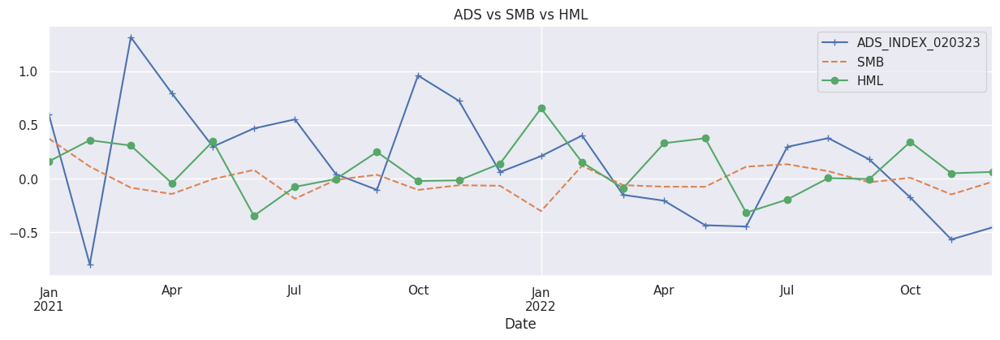

In [57]:
month_agg[['ADS_INDEX_020323','SMB','HML']].loc['2021-01-04':].plot(figsize=(15,4), style=['-+','--','-o'], 
                                                                    title = 'ADS vs SMB vs HML')

<Axes: title={'center': 'NOW Typical Price Returns'}, xlabel='Date'>

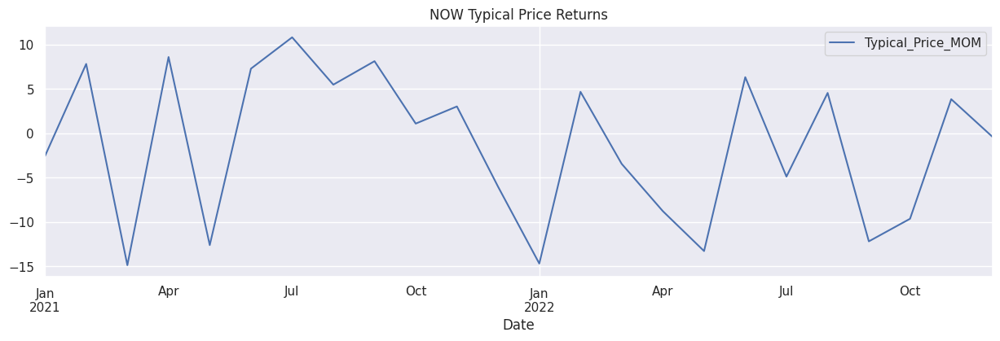

In [58]:
month_agg[['Typical_Price_MOM']].loc['2021-01-04':].plot(figsize=(15,4), style=['-','b'] , 
                                                        title = 'NOW Typical Price Returns')

#### We can see NOW trend is most similar to that of ADS index and SMB index, so we would use thes two as high frequency variables to predict NOW Quaterly returns


## Resampling daily data to Quaterly aggregated data¶



In [59]:
quaterly_agg = now_AF.resample('Q').mean()

In [60]:
quaterly_agg
quaterly_agg['Typical_Price_QOQ'] = (np.log(quaterly_agg.Typical_Price) - np.log(quaterly_agg.Typical_Price.shift(1))) * 100.
quaterly_agg.tail()

,Open,High,Low,Close,Adj Close,Volume,Typical_Price,lrets,Mkt-RF,SMB,HML,RF,ADS_INDEX_020323,Typical_Price_QOQ
Date,,,,,,,,,,,,,,
2021-12-31,657.032971,666.268123,646.868281,656.461561,656.461561,1.118675e+06,656.532655,0.065981,0.128594,-0.077969,0.034844,0.000000,0.573051,8.184462
2022-03-31,561.911941,575.230481,547.015641,560.271940,560.271940,1.846400e+06,560.839354,-0.247152,-0.082097,-0.083710,0.224194,0.000000,0.133971,-15.753793
2022-06-30,477.839195,488.918711,466.186291,476.590806,476.590806,1.712463e+06,477.231936,-0.254772,-0.290323,-0.012581,0.125968,0.001677,-0.364777,-16.143190
2022-09-30,449.611406,458.083751,441.881564,450.266718,450.266718,1.668303e+06,450.077344,-0.360230,-0.061719,0.055000,-0.060781,0.007078,0.286113,-5.858317
2022-12-31,391.389522,398.889046,383.415397,390.789841,390.789841,1.683533e+06,391.031428,0.044189,0.099048,-0.056667,0.150952,0.013667,-0.399012,-14.063151


## Model - 1 using Typical Price




In [62]:
!unzip midas.zip

Archive:  midas.zip
   creating: midas/
  inflating: __MACOSX/._midas        
  inflating: midas/fit.py            
  inflating: __MACOSX/midas/._fit.py  
 extracting: midas/__init__.py       
  inflating: __MACOSX/midas/.___init__.py  
  inflating: midas/adl.py            
  inflating: __MACOSX/midas/._adl.py  
   creating: midas/.ipynb_checkpoints/
  inflating: __MACOSX/midas/._.ipynb_checkpoints  
  inflating: midas/weights.py        
  inflating: __MACOSX/midas/._weights.py  
  inflating: midas/mix.py            
  inflating: __MACOSX/midas/._mix.py  
  inflating: midas/.ipynb_checkpoints/Use Monthly IP and LEI to Predict Quarterly GDP-checkpoint.ipynb  
  inflating: __MACOSX/midas/.ipynb_checkpoints/._Use Monthly IP and LEI to Predict Quarterly GDP-checkpoint.ipynb  


In [64]:
!pip install weights

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement weights (from versions: none)
ERROR: No matching distribution found for weights


In [74]:
from midas.mix import mix_freq, mix_freq2
from midas.adl import estimate, forecast, midas_adl, rmse, estimate2,forecast2, midas_adl2

In [75]:
AllModel_rmse = []

In [76]:
y, yl, x, yf, ylf, xf = mix_freq(quaterly_agg.Typical_Price_QOQ,month_agg.Typical_Price_MOM, "3m", 1, 3,
                                 start_date=datetime.datetime(2016,1,31),
                                 end_date=datetime.datetime(2018,6,30)) 

/content/midas/mix.py:54: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf = hf_data.index.get_loc(lfdate, method='bfill')  # @todo Find a more efficient way


In [77]:
res = estimate(y, yl, x, poly='beta')
res.x

/content/midas/adl.py:32: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  c = np.linalg.lstsq(np.concatenate([np.ones((len(xw), 1)), xw.reshape((len(xw), 1)), yl], axis=1), y)[0]


array([0., 0., 1., 5., 0.])

In [78]:
fc = forecast(xf, ylf, res, poly='beta')
forecast_df = fc.join(yf)
forecast_df['gap'] = forecast_df.Typical_Price_QOQ - forecast_df.yfh 
forecast_df

,yfh,Typical_Price_QOQ,gap
Date,,,
2018-09-30,0.0,8.705460,8.705460
2018-12-31,0.0,-6.244991,-6.244991
2019-03-31,0.0,21.238131,21.238131
2019-06-30,0.0,17.985468,17.985468
2019-09-30,0.0,3.371530,3.371530
2019-12-31,0.0,-3.204196,-3.204196
2020-03-31,0.0,17.041052,17.041052
2020-06-30,0.0,12.185457,12.185457
2020-09-30,0.0,23.471575,23.471575


<Axes: xlabel='Date'>

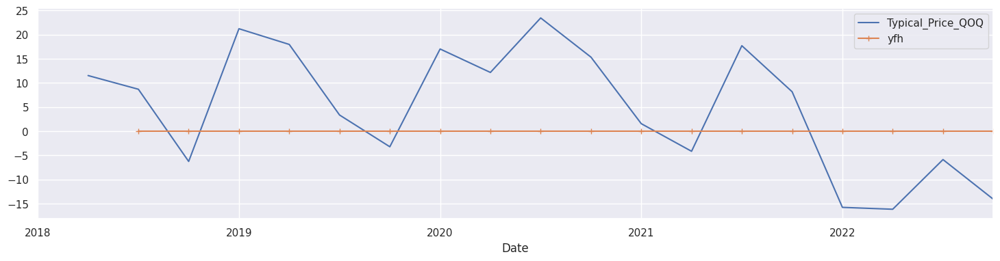

In [79]:
quaterly_agg.join(fc)[['Typical_Price_QOQ','yfh']].loc['2016-1-31':].plot(style=['-','-+'], figsize=(18, 4))


In [80]:
rmse = ((forecast_df.Typical_Price_QOQ - forecast_df.yfh) ** 2).mean() ** .5
rmse

13.494879334464764

In [81]:
AllModel_rmse.append(rmse)
AllModel_rmse

[13.494879334464764]

## Model 2 - considering typical price and change in volume MOM¶




In [82]:
y, yl, x1, x2, yf, ylf, x1f, x2f =mix_freq2(quaterly_agg.Typical_Price_QOQ,month_agg.Volume_MOM,month_agg.Typical_Price_MOM, "3m","3m", 1, 3,
                                 start_date = datetime.datetime(2016,1,31),
                                 end_date = datetime.datetime(2018,6,30))


/content/midas/mix.py:119: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf1 = hf_data1.index.get_loc(lfdate, method='bfill')  # @todo Find a more efficient way
/content/midas/mix.py:120: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf2 = hf_data2.index.get_loc(lfdate, method='bfill')


In [83]:
res = estimate2(y, yl, x1, x2, poly1='expalmon', poly2='expalmon')
res.x

/content/midas/adl.py:85: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  c = np.linalg.lstsq(np.concatenate([np.ones((len(xw1), 1)), xw1.reshape((len(xw1), 1)), xw2.reshape((len(xw2), 1)), yl], axis=1), y)[0]


array([ 0.,  0.,  0., -1.,  0., -1.,  0.,  0.])

In [84]:
fc = forecast2(x1f, x2f, ylf, res, poly1='expalmon',poly2='expalmon')
forecast_df = fc.join(yf)
forecast_df['gap'] = forecast_df.Typical_Price_QOQ - forecast_df.yfh  
forecast_df

,yfh,Typical_Price_QOQ,gap
Date,,,
2018-09-30,0.0,8.705460,8.705460
2018-12-31,0.0,-6.244991,-6.244991
2019-03-31,0.0,21.238131,21.238131
2019-06-30,0.0,17.985468,17.985468
2019-09-30,0.0,3.371530,3.371530
2019-12-31,0.0,-3.204196,-3.204196
2020-03-31,0.0,17.041052,17.041052
2020-06-30,0.0,12.185457,12.185457
2020-09-30,0.0,23.471575,23.471575


In [85]:
rmse = ((forecast_df.Typical_Price_QOQ - forecast_df.yfh) ** 2).mean() ** .5
rmse

13.494879334464764

<Axes: xlabel='Date'>

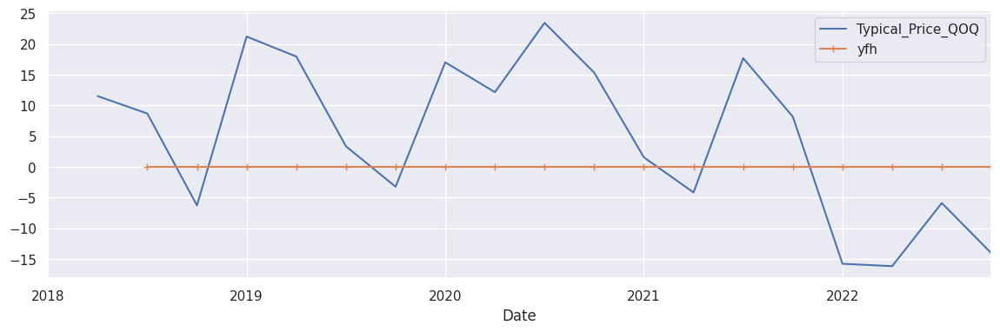

In [86]:
quaterly_agg.join(fc)[['Typical_Price_QOQ','yfh']].loc['2016-1-31':].plot(style=['-','-+'], figsize=(14, 4))


In [87]:
AllModel_rmse.append(rmse)
AllModel_rmse

[13.494879334464764, 13.494879334464764]

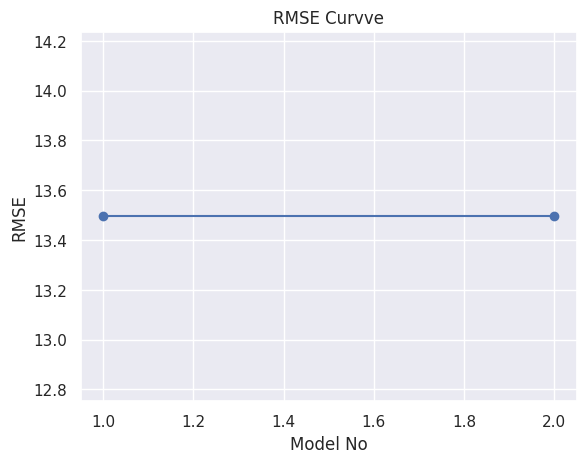

In [88]:
plt.scatter([1,2],list(AllModel_rmse) )
plt.plot([1,2],list(AllModel_rmse))
plt.xlabel('Model No')
plt.ylabel('RMSE')
plt.title('RMSE Curvve')
plt.show()

## Model - 3 - considering Typical Price and ADS index


In [90]:
y, yl, x1, x2, yf, ylf, x1f, x2f =mix_freq2(quaterly_agg.Typical_Price_QOQ,month_agg.Typical_Price_MOM,month_agg.ADS_INDEX_020323, "3m","3m", 1, 3,
                                 start_date = datetime.datetime(2016,1,31),
                                 end_date = datetime.datetime(2018,6,30))

/content/midas/mix.py:119: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf1 = hf_data1.index.get_loc(lfdate, method='bfill')  # @todo Find a more efficient way
/content/midas/mix.py:120: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf2 = hf_data2.index.get_loc(lfdate, method='bfill')


In [91]:
res = estimate2(y, yl, x1, x2, poly1='expalmon', poly2='expalmon')
res.x

/content/midas/adl.py:85: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  c = np.linalg.lstsq(np.concatenate([np.ones((len(xw1), 1)), xw1.reshape((len(xw1), 1)), xw2.reshape((len(xw2), 1)), yl], axis=1), y)[0]


array([ 0.,  0.,  0., -1.,  0., -1.,  0.,  0.])

In [92]:
fc = forecast2(x1f, x2f, ylf, res, poly1='expalmon',poly2='expalmon')
forecast_df = fc.join(yf)
forecast_df['gap'] = forecast_df.Typical_Price_QOQ - forecast_df.yfh  
forecast_df

,yfh,Typical_Price_QOQ,gap
Date,,,
2018-09-30,0.0,8.705460,8.705460
2018-12-31,0.0,-6.244991,-6.244991
2019-03-31,0.0,21.238131,21.238131
2019-06-30,0.0,17.985468,17.985468
2019-09-30,0.0,3.371530,3.371530
2019-12-31,0.0,-3.204196,-3.204196
2020-03-31,0.0,17.041052,17.041052
2020-06-30,0.0,12.185457,12.185457
2020-09-30,0.0,23.471575,23.471575


<Axes: xlabel='Date'>

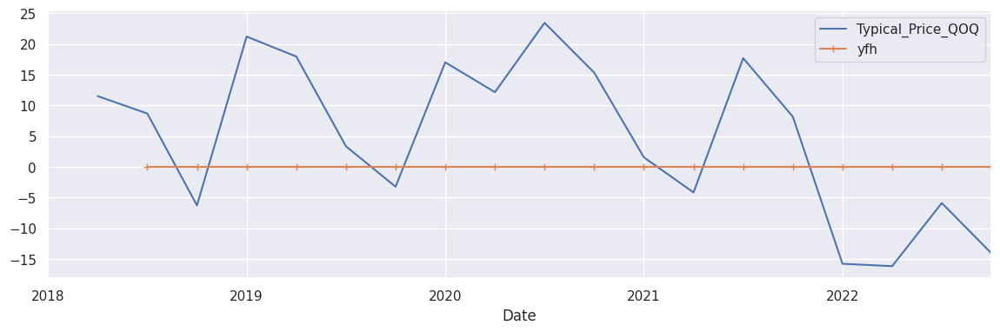

In [93]:
quaterly_agg.join(fc)[['Typical_Price_QOQ','yfh']].loc['2016-1-31':].plot(style=['-','-+'], figsize=(14, 4))

In [94]:
rmse = ((forecast_df.Typical_Price_QOQ - forecast_df.yfh) ** 2).mean() ** .5
rmse

13.494879334464764

In [95]:
AllModel_rmse.append(rmse)
AllModel_rmse

[13.494879334464764, 13.494879334464764, 13.494879334464764]

### Model 4 - using Typical Price and SMB¶


In [96]:
y, yl, x1, x2, yf, ylf, x1f, x2f =mix_freq2(quaterly_agg.Typical_Price_QOQ,month_agg.Typical_Price_MOM,month_agg.SMB, "3m","3m", 1, 3,
                                 start_date = datetime.datetime(2016,1,31),
                                 end_date = datetime.datetime(2018,6,30))

/content/midas/mix.py:119: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf1 = hf_data1.index.get_loc(lfdate, method='bfill')  # @todo Find a more efficient way
/content/midas/mix.py:120: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf2 = hf_data2.index.get_loc(lfdate, method='bfill')


In [97]:
res = estimate2(y, yl, x1, x2, poly1='expalmon', poly2='expalmon')
res.x

/content/midas/adl.py:85: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  c = np.linalg.lstsq(np.concatenate([np.ones((len(xw1), 1)), xw1.reshape((len(xw1), 1)), xw2.reshape((len(xw2), 1)), yl], axis=1), y)[0]


array([ 0.,  0.,  0., -1.,  0., -1.,  0.,  0.])

In [98]:

fc = forecast2(x1f, x2f, ylf, res, poly1='expalmon',poly2='expalmon')
forecast_df = fc.join(yf)
forecast_df['gap'] = forecast_df.Typical_Price_QOQ - forecast_df.yfh  
forecast_df

,yfh,Typical_Price_QOQ,gap
Date,,,
2018-09-30,0.0,8.705460,8.705460
2018-12-31,0.0,-6.244991,-6.244991
2019-03-31,0.0,21.238131,21.238131
2019-06-30,0.0,17.985468,17.985468
2019-09-30,0.0,3.371530,3.371530
2019-12-31,0.0,-3.204196,-3.204196
2020-03-31,0.0,17.041052,17.041052
2020-06-30,0.0,12.185457,12.185457
2020-09-30,0.0,23.471575,23.471575


<Axes: xlabel='Date'>

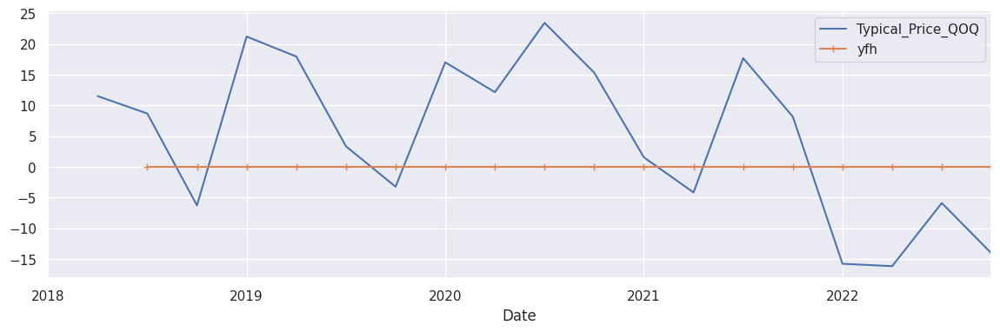

In [99]:
quaterly_agg.join(fc)[['Typical_Price_QOQ','yfh']].loc['2016-1-31':].plot(style=['-','-+'], figsize=(14, 4))

In [100]:
rmse = ((forecast_df.Typical_Price_QOQ - forecast_df.yfh) ** 2).mean() ** .5
rmse

13.494879334464764

In [101]:
AllModel_rmse.append(rmse)
AllModel_rmse

[13.494879334464764,
 13.494879334464764,
 13.494879334464764,
 13.494879334464764]

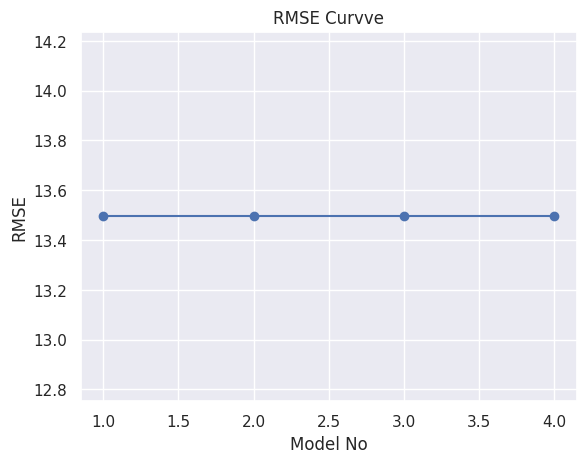

In [102]:
plt.scatter([1,2,3,4],list(AllModel_rmse) )
plt.plot([1,2,3,4],list(AllModel_rmse))
plt.xlabel('Model No')
plt.ylabel('RMSE')
plt.title('RMSE Curvve')
plt.show()

### Checking for Optimum horizons in model 2


In [105]:
y, yl, x1, x2, yf, ylf, x1f, x2f =mix_freq2(quaterly_agg.Typical_Price_QOQ,month_agg.Volume_MOM,month_agg.Typical_Price_MOM, "3m","3m", 1, 4,
                                 start_date = datetime.datetime(2016,1,31),
                                 end_date = datetime.datetime(2018,6,30))

/content/midas/mix.py:119: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf1 = hf_data1.index.get_loc(lfdate, method='bfill')  # @todo Find a more efficient way
/content/midas/mix.py:120: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf2 = hf_data2.index.get_loc(lfdate, method='bfill')


In [106]:
res = estimate2(y, yl, x1, x2, poly1='expalmon', poly2='expalmon')
res.x

/content/midas/adl.py:85: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  c = np.linalg.lstsq(np.concatenate([np.ones((len(xw1), 1)), xw1.reshape((len(xw1), 1)), xw2.reshape((len(xw2), 1)), yl], axis=1), y)[0]


array([ 0.,  0.,  0., -1.,  0., -1.,  0.,  0.])

In [107]:

fc = forecast2(x1f, x2f, ylf, res, poly1='expalmon',poly2='expalmon')
forecast_df = fc.join(yf)
forecast_df['gap'] = forecast_df.Typical_Price_QOQ - forecast_df.yfh  
forecast_df

,yfh,Typical_Price_QOQ,gap
Date,,,
2018-09-30,0.0,8.705460,8.705460
2018-12-31,0.0,-6.244991,-6.244991
2019-03-31,0.0,21.238131,21.238131
2019-06-30,0.0,17.985468,17.985468
2019-09-30,0.0,3.371530,3.371530
2019-12-31,0.0,-3.204196,-3.204196
2020-03-31,0.0,17.041052,17.041052
2020-06-30,0.0,12.185457,12.185457
2020-09-30,0.0,23.471575,23.471575


<Axes: xlabel='Date'>

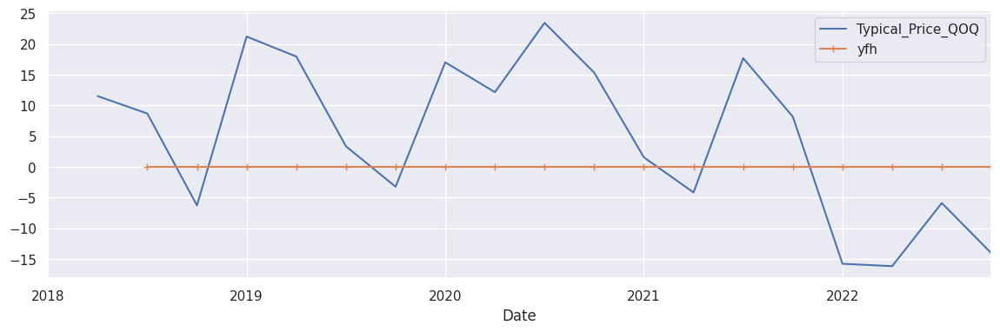

In [108]:
quaterly_agg.join(fc)[['Typical_Price_QOQ','yfh']].loc['2016-1-31':].plot(style=['-','-+'], figsize=(14, 4))

In [109]:
rmse = ((forecast_df.Typical_Price_QOQ - forecast_df.yfh) ** 2).mean() ** .5
rmse

13.494879334464764

### We can observe by increasing horizon, we do generalize the model around mean and it does not follow the predictive trend,we can chose 3 as optimal horizon¶


### Retaining it for 3 Horizon - Model 2

In [110]:
y, yl, x1, x2, yf, ylf, x1f, x2f =mix_freq2(quaterly_agg.Typical_Price_QOQ,month_agg.Volume_MOM,month_agg.Typical_Price_MOM, "3m","3m", 1, 3,
                                 start_date = datetime.datetime(2016,1,31),
                                 end_date = datetime.datetime(2018,3,31))

/content/midas/mix.py:119: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf1 = hf_data1.index.get_loc(lfdate, method='bfill')  # @todo Find a more efficient way
/content/midas/mix.py:120: FutureWarning: Passing method to DatetimeIndex.get_loc is deprecated and will raise in a future version. Use index.get_indexer([item], method=...) instead.
  start_hf2 = hf_data2.index.get_loc(lfdate, method='bfill')


In [111]:

res = estimate2(y, yl, x1, x2, poly1='expalmon', poly2='expalmon')
res.x

/content/midas/adl.py:85: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  c = np.linalg.lstsq(np.concatenate([np.ones((len(xw1), 1)), xw1.reshape((len(xw1), 1)), xw2.reshape((len(xw2), 1)), yl], axis=1), y)[0]


array([ 0.,  0.,  0., -1.,  0., -1.,  0.,  0.])

In [112]:
fc = forecast2(x1f, x2f, ylf, res, poly1='expalmon',poly2='expalmon')
forecast_df = fc.join(yf)
forecast_df['gap'] = forecast_df.Typical_Price_QOQ - forecast_df.yfh  
forecast_df

ValueError: ignored

<Axes: xlabel='Date'>

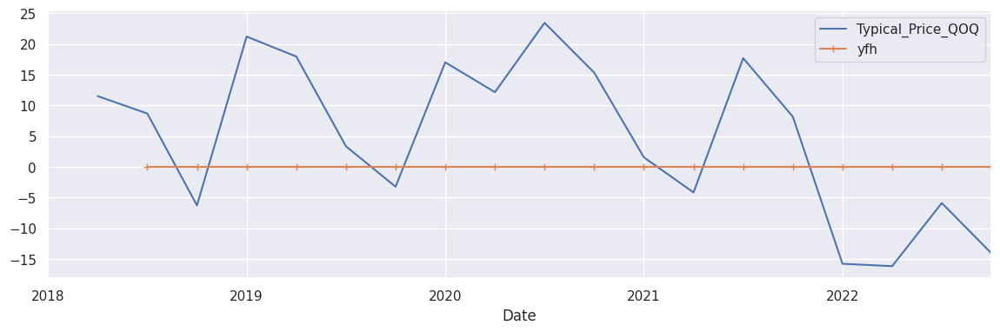

In [113]:
quaterly_agg.join(fc)[['Typical_Price_QOQ','yfh']].loc['2016-1-31':].plot(style=['-','-+'], figsize=(14, 4))

In [114]:
rmse = ((forecast_df.Typical_Price_QOQ - forecast_df.yfh) ** 2).mean() ** .5
rmse

13.494879334464764

In [115]:
forecast_df


,yfh,Typical_Price_QOQ,gap
Date,,,
2018-09-30,0.0,8.705460,8.705460
2018-12-31,0.0,-6.244991,-6.244991
2019-03-31,0.0,21.238131,21.238131
2019-06-30,0.0,17.985468,17.985468
2019-09-30,0.0,3.371530,3.371530
2019-12-31,0.0,-3.204196,-3.204196
2020-03-31,0.0,17.041052,17.041052
2020-06-30,0.0,12.185457,12.185457
2020-09-30,0.0,23.471575,23.471575


In [116]:
forecast_df.size

54

In [117]:
y_pred = [] * 10

for i in range(len(forecast_df)+1):
    if i == 0:
        y_pred.append(1587.068490)
    else:
        y_pred.append(math.exp(forecast_df['yfh'][i-1]/100) * y_pred[i-1])

In [118]:
y_pred[0:-1]

[1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849,
 1587.06849]

In [119]:
quaterly_agg.Typical_Price['2018-09-30':]

Date
2018-09-30    188.966349
2018-12-31    177.526349
2019-03-31    219.532514
2019-06-30    262.789946
2019-09-30    271.801041
2019-12-31    263.230052
2020-03-31    312.135968
2020-06-30    352.585609
2020-09-30    445.861875
2020-12-31    519.856979
2021-03-31    528.117596
2021-06-30    506.701799
2021-09-30    604.939114
2021-12-31    656.532655
2022-03-31    560.839354
2022-06-30    477.231936
2022-09-30    450.077344
2022-12-31    391.031428
Freq: Q-DEC, Name: Typical_Price, dtype: float64

In [127]:
Trading_df = pd.DataFrame({'Actual_Typical_Price':quaterly_agg.Typical_Price['2018-09-30':],
                           'Predicted_Typical_Price' : y_pred[0:-1]
                          })

In [128]:
Trading_df

,Actual_Typical_Price,Predicted_Typical_Price
Date,,
2018-09-30,188.966349,1587.06849
2018-12-31,177.526349,1587.06849
2019-03-31,219.532514,1587.06849
2019-06-30,262.789946,1587.06849
2019-09-30,271.801041,1587.06849
2019-12-31,263.230052,1587.06849
2020-03-31,312.135968,1587.06849
2020-06-30,352.585609,1587.06849
2020-09-30,445.861875,1587.06849


### Monthly Trading Strategy for MIDAS


In [129]:
amount = 10000
signal = 0
Amount = []
balance = 0
action = []
portfolio = 0
Portfolio = []
stocks = 0
Stocks = []

for i in range(len(Trading_df)-1):
    if Trading_df['Predicted_Typical_Price'][i+1] > Trading_df['Actual_Typical_Price'][i]:
        if signal == 0:
            action.append('Buy')
            stocks = int(amount / Trading_df['Actual_Typical_Price'][i])
            balance = int(amount % Trading_df['Actual_Typical_Price'][i])
            portfolio = stocks * Trading_df['Actual_Typical_Price'][i]
            signal = 1
            amount = portfolio + balance
            print('Stock:',Trading_df['Actual_Typical_Price'][i] ,'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Bought--Holding')
            portfolio = stocks * Trading_df['Actual_Typical_Price'][i]
            amount = portfolio + balance
            print('Stock:',Trading_df['Actual_Typical_Price'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
            
    elif Trading_df['Predicted_Typical_Price'][i+1] < Trading_df['Actual_Typical_Price'][i]:
        if signal == 1:
            action.append('Sell')
            portfolio = stocks * Trading_df['Actual_Typical_Price'][i]
            
            signal = 0
            stocks = 0
            amount = balance + portfolio
            portfolio = 0
            balance = 0
            print('Stock:',Trading_df['Actual_Typical_Price'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Price-Prediction-Already-Lower')
            print('Stock:',Trading_df['Actual_Typical_Price'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)

Stock: 188.96634944532283 Action: Buy Portfolio: 9826.25 Stocks: 52 Balance_init: 173 total($) 9999.25
Stock: 177.52634918374358 Action: Bought--Holding Portfolio: 9231.37 Stocks: 52 Balance_init: 173 total($) 9404.37
Stock: 219.53251406143272 Action: Bought--Holding Portfolio: 11415.69 Stocks: 52 Balance_init: 173 total($) 11588.69
Stock: 262.78994613728196 Action: Bought--Holding Portfolio: 13665.08 Stocks: 52 Balance_init: 173 total($) 13838.08
Stock: 271.8010410467784 Action: Bought--Holding Portfolio: 14133.65 Stocks: 52 Balance_init: 173 total($) 14306.65
Stock: 263.2300519148509 Action: Bought--Holding Portfolio: 13687.96 Stocks: 52 Balance_init: 173 total($) 13860.96
Stock: 312.1359680339854 Action: Bought--Holding Portfolio: 16231.07 Stocks: 52 Balance_init: 173 total($) 16404.07
Stock: 352.58560899199637 Action: Bought--Holding Portfolio: 18334.45 Stocks: 52 Balance_init: 173 total($) 18507.45
Stock: 445.86187505722046 Action: Bought--Holding Portfolio: 23184.82 Stocks: 52 Ba

In [130]:
Amount

[9999.0,
 9404.0,
 11589.0,
 13838.0,
 14307.0,
 13861.0,
 16404.0,
 18507.0,
 23358.0,
 27206.0,
 27635.0,
 26521.0,
 31630.0,
 34313.0,
 29337.0,
 24989.0,
 23577.0]

In [131]:
np.mean(Amount)

20969.117647058825

In [139]:
# Get the initial investment amount
initial_investment = 10000

# Get the final amount after executing the trading strategy
final_amount = Amount[-1]

# Calculate the return as a percentage
return_percentage = ((final_amount - initial_investment) / initial_investment) * 100

print(f"Return: {return_percentage:.2f}%")


Return: 135.77%


In [140]:
# Get the initial investment amount
initial_investment = 10000

# Get the final amount after executing the trading strategy
final_amount = Amount[-1]

# Calculate the return amount
return_amount = final_amount - initial_investment

print(f"Return Amount: ${return_amount:.2f}")


Return Amount: $13577.00


LSTM

An LSTM Network has its origin in a RNN. But it can solve the memory loss by changing the neuron architecture.

The new neuron has 3 gates, each with a different goal. The gates are:

1.Input Gate

2.Output Gate

3.Forget Gate

An LSTM Neuron still receives as input its previous state:

LSTM Neuron passing as parameter its previous state.

Following steps are done:
Clean up the data-Remove any NAs

Create a test, train and validate set

Create train for Close Price

Normalize data

Train, test data and check with validation set

Make a prediction

Based on this prediction find if the feature extraction method of LSTM works

In [ ]:
# Importing all the required packages and libraries

import math
from math import sqrt
import pandas_datareader as web
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from keras.layers import Dense, Activation

import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")

In [ ]:
import pandas as pd
import datetime
import pandas_datareader.data as web

# Define start and end dates
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

# Fetch the data for NOW stock from Yahoo Finance
ticker="NOW"
df_now = yf.download(ticker, start=start, end=end)

[*********************100%***********************]  1 of 1 completed


In [ ]:
print(df_now.shape)

(1259, 6)


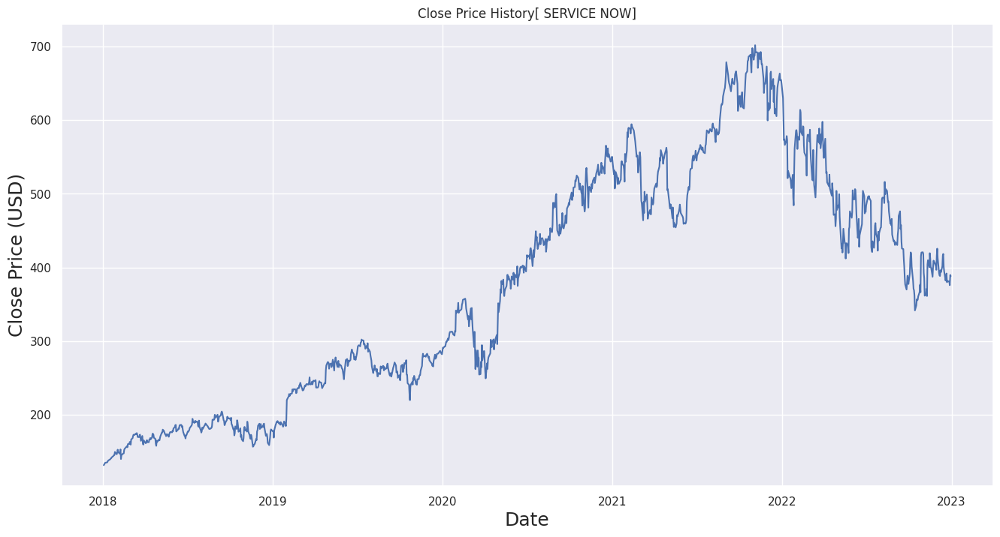

In [ ]:
# Visualize the closing price history for NOW stock

plt.figure(figsize=(16,8))
plt.title('Close Price History[ SERVICE NOW]')
plt.plot(df_now['Close'], color='b')
plt.xlabel('Date',fontsize=18)
plt.ylabel('Close Price (USD)',fontsize=18)
plt.show()

In [ ]:
# Create a new dataframe with only the 'Close' column.
data = df_now.filter(['Close'])

# Converting the dataframe to a numpy array.
dataset = data.values

# Compute the number of rows to train the model on.

training_data_len = math.ceil( len(dataset) *.8)

In [ ]:
# Min-Max Normalization.
scaler = MinMaxScaler(feature_range=(0, 1)) 
scaled_data = scaler.fit_transform(dataset)

In [ ]:
# Create the scaled training dataset.
train_data = scaled_data[0:training_data_len, :]

# Split the data into X_train and y_train data sets
X_train=[]
y_train = []

for i in range(60,len(train_data)):
    X_train.append(train_data[i-60:i,0])
    y_train.append(train_data[i,0])

In [ ]:
# Convert x_train and y_train to numpy arrays.
X_train, y_train = np.array(X_train), np.array(y_train)

In [ ]:
# Reshape the data into the shape accepted by the LSTM.
X_train = np.reshape(X_train, (X_train.shape[0],X_train.shape[1],1))

In [ ]:
# Build the LSTM network model.
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
model.add(LSTM(units=25, return_sequences=False))
model.add(Activation('linear'))
model.add(Dense(units=1))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 60, 50)            10400     
                                                                 
 lstm_1 (LSTM)               (None, 25)                7600      
                                                                 
 activation (Activation)     (None, 25)                0         
                                                                 
 dense (Dense)               (None, 1)                 26        
                                                                 
Total params: 18,026
Trainable params: 18,026
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Compile the model.
model.compile(optimizer='adam', loss='mean_squared_error')

In [ ]:
# Train the model.
model.fit(X_train, y_train, batch_size=1, epochs=10)

Epoch 1/10
948/948 [==============================] - 29s 27ms/step - loss: 0.0028
Epoch 2/10
948/948 [==============================] - 25s 27ms/step - loss: 0.0011
Epoch 3/10
948/948 [==============================] - 26s 28ms/step - loss: 9.3843e-04
Epoch 4/10
948/948 [==============================] - 25s 26ms/step - loss: 8.9526e-04
Epoch 5/10
948/948 [==============================] - 25s 27ms/step - loss: 7.2647e-04
Epoch 6/10
948/948 [==============================] - 26s 27ms/step - loss: 6.0325e-04
Epoch 7/10
948/948 [==============================] - 27s 29ms/step - loss: 5.5915e-04
Epoch 8/10
948/948 [==============================] - 25s 26ms/step - loss: 5.0529e-04
Epoch 9/10
948/948 [==============================] - 25s 26ms/step - loss: 5.7341e-04
Epoch 10/10
948/948 [==============================] - 25s 27ms/step - loss: 5.2887e-04


In [ ]:
# Test dataset.
test_data = scaled_data[training_data_len-60:, :]

# Create the x_test and y_test datasets.
X_test = []
y_test =  dataset[training_data_len:, :]
for i in range(60,len(test_data)):
    X_test.append(test_data[i-60:i, 0])

In [ ]:
# Convert x_test to a numpy array.
X_test = np.array(X_test)

In [ ]:
# Reshape the data into the shape accepted by the LSTM.
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

In [ ]:
# Getting the models predicted price values.
predictions = model.predict(X_test)
predictions = scaler.inverse_transform(predictions) #Undo scaling

8/8 [==============================] - 1s 14ms/step


In [ ]:
# Calculate/Get the value of RMSE.
rmse = np.sqrt(np.mean(((predictions- y_test)**2)))
mse = mean_squared_error(predictions,y_test)
rmse_new = sqrt(mse)
r = r2_score(predictions,y_test)

In [ ]:
#LSTM
print('RMSE = {}',rmse)
print('R-Squared Score = {}',r)

RMSE = {} 16.805562560629895
R-Squared Score = {} 0.9395330656356188


In [ ]:
# Plot/Create the data for the graph.
train = data[:training_data_len]
valid = data[training_data_len:]
valid['Predictions'] = predictions

<ipython-input-207-5a9b734347a7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid['Predictions'] = predictions


RMSE = {} 16.805562560629895
R-Squared Score = {} 0.9395330656356188


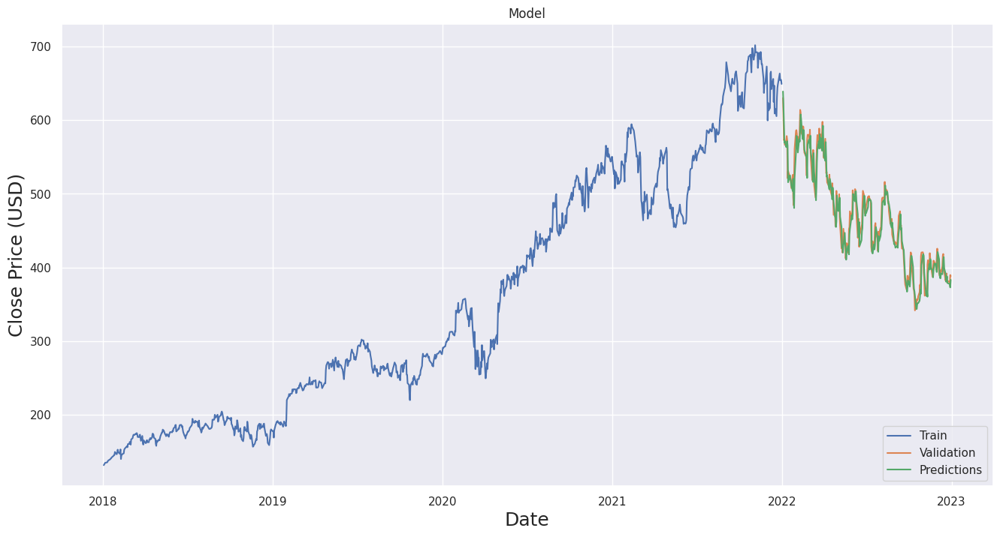

In [ ]:
# Visualize the data.
print('RMSE = {}',rmse)
print('R-Squared Score = {}',r)
plt.figure(figsize=(16,8))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price (USD)', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.legend(['Train', 'Validation', 'Predictions'], loc='lower right')
plt.show()

In [ ]:
valid

,Close,Predictions
Date,,
2022-01-03,630.140015,638.901428
2022-01-04,603.940002,621.100220
2022-01-05,572.760010,597.510071
2022-01-06,574.039978,569.354980
2022-01-07,566.390015,571.528381
...,...,...
2022-12-23,381.859985,378.955719
2022-12-27,380.640015,377.887970
2022-12-28,376.049988,376.920807


OLS Regression with Fama French 3


The Fama and French model has three factors: size of firms, book-to-market values and excess return on the market. In other words, the three factors used are SMB (small minus big), HML (high minus low) and the portfolio's return less the risk free rate of return.

In [ ]:
#Importing Packages

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as ss
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [ ]:
df_now = pd.read_csv ('now_fama3_new_latest(2018-2022).csv')

In [ ]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1253,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,0.51,-0.60,1.15,0.016,379.940002,0.005053
1254,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,-0.51,-0.73,1.43,0.016,381.859985,-0.003195
1255,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,-1.23,-0.24,-0.29,0.016,380.640015,-0.012059
1256,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,1.87,1.26,-1.07,0.016,376.049988,0.036697


In [ ]:
df_now.shape

(1258, 13)

 REGRESSION STATISTICS  

------------------------


 Joint significance of all coefficients
 [array([[9.32580808e-11]]), array([[1.]])]
Beta Values    
 [[ 0.00073482]
 [ 0.01271582]
 [ 0.00046174]
 [-0.00957069]]
P values       
 [[0.48309686 0.15561864 0.49262776 0.7291278 ]]
R-Square is       
 [[0.60609626]]
Adjusted R Square 
 [[0.60515391]]
Standard Error    
 [[0.01733074]]
Observations      
 1258
-------------------------



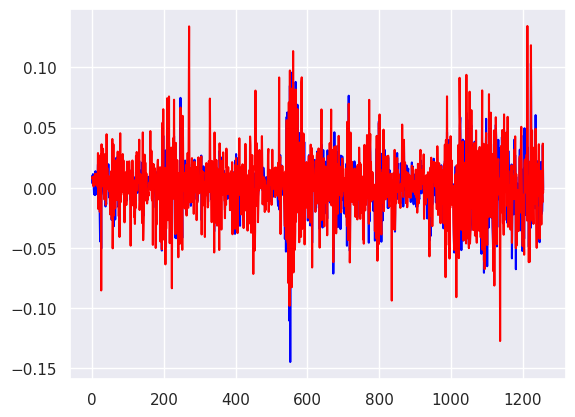

<Axes: title={'center': 'Predictions using FF3 using Linear Regression'}>

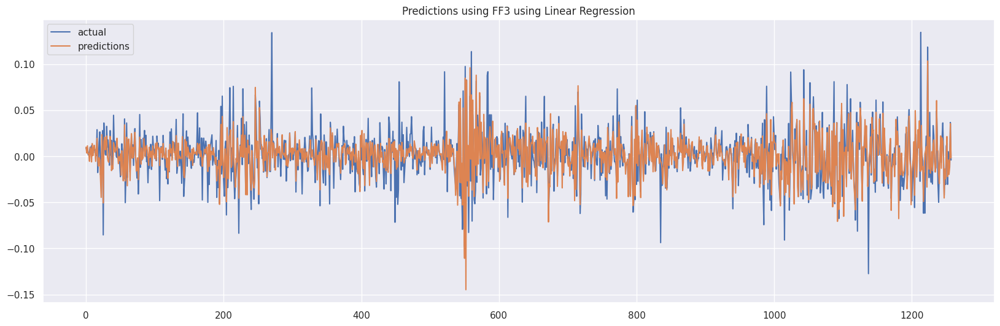

In [ ]:
df_now['stock_return'] = (df_now['Adj Close']- df_now['Yest_Close'])/(df_now['Yest_Close'])

T = df_now.shape[0]
Y = df_now['stock_return'].values
columns = ['MktRF','SMB','HML']
X=df_now[columns]
X = np.column_stack([np.ones((len(X),1)),X])
N = X.shape
Y=np.asarray(Y)
Y = Y.reshape(1258,1)

'REGRESSION STARTS:'       
'Linear Regression of Y: T x 1 on' 
'Regressors X: T x N'

invXX = np.linalg.inv(X.transpose()@X)

'OLS estimator beta: N x 1'

beta_hat = invXX@X.transpose()@Y
'Predictive value of Y_t using OLS'  

y_hat = X@beta_hat;       

'Residuals from OLS: Y - X*beta'        

residuals = Y - y_hat;            

'variance of Y_t or residuals'

sigma2 = (1/T)*(residuals.transpose()@residuals)

'standard deviation of Y_t or residuals'

sig = np.sqrt(sigma2) 

'variance-covariance matrix of beta_hat'
'N x N: on-diagnal variance(beta_j)'
'N x N: off-diagnal cov(beta_i, beta_j)'

varcov_beta_hat = (sigma2)*invXX
var_beta_hat = np.sqrt(T*np.diag(varcov_beta_hat))

'Calculate R-square'

R_square = 1 - residuals.transpose()@residuals/(T*np.var(Y))

adj_R_square = 1-(1-R_square)*(T-1)/(T-N[1])


'Test Each Coefficient: beta_i'

't-test stat: N x 1'

t_stat = beta_hat.transpose()/var_beta_hat

' t-test significance level: N x 1'

p_val_t = 1-ss.norm.cdf(t_stat)

'Test of Joint Significance of Model'

F_stat = beta_hat.transpose()@varcov_beta_hat@beta_hat/\
         (residuals.transpose()@residuals)
'size: (1 x N)*(N x N)*(N x 1)/((1 x T) * (T x 1)) = 1 x 1'

p_val_F = 1-ss.f.cdf(F_stat,N[1]-1,T-N[1])


print(' REGRESSION STATISTICS  \n') 
print('------------------------\n')
print('\n Joint significance of all coefficients\n',[F_stat,p_val_F])
print('Beta Values    \n',beta_hat)
print('P values       \n',p_val_t)
print('R-Square is       \n',R_square)
print('Adjusted R Square \n',adj_R_square)
print('Standard Error    \n',sig)
print('Observations      \n',T) 
print('-------------------------\n')

plt.plot(y_hat, color='blue')
plt.plot(Y, color = 'red')
plt.show()
pred = pd.DataFrame(y_hat)
act = pd.DataFrame(Y)

plot_df = pd.DataFrame({"actual": act[0], "predictions": pred[0]})
plot_df.plot(figsize=(20, 6), title='Predictions using FF3 using Linear Regression')

In [ ]:
mse = mean_squared_error(Y,y_hat)
rmse = np.sqrt(mse)
print('RMSE-------',rmse)
print('R-Squared--',r2_score(Y,y_hat))

RMSE------- 0.017330739495989088
R-Squared-- 0.606096264760947


Ridge Regression

In [ ]:
import pandas_datareader as web
import datetime
import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import math
import seaborn as sns

In [ ]:
import pandas as pd
import datetime
import pandas_datareader.data as web

# Define start and end dates
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

# Fetch the data for NOW stock from Yahoo Finance
ticker="NOW"
df_now = yf.download(ticker, start=start, end=end)
df_now.head()
df_now.count()

[*********************100%***********************]  1 of 1 completed


Open         1259
High         1259
Low          1259
Close        1259
Adj Close    1259
Volume       1259
dtype: int64

In [ ]:
df_now['lrets'] = (np.log(df_now.Close) - np.log(df_now.Close.shift(1))) * 100.
df_now.head()

,Open,High,Low,Close,Adj Close,Volume,lrets
Date,,,,,,,
2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,NaN
2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.891789
2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.704758
2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.862899
2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.214575


In [ ]:
df_now['Stock_Price'] = (2*df_now.High + df_now.Low + df_now.Close)/4

In [ ]:
df_now= df_now.round(4)
df_now.tail(100)

,Open,High,Low,Close,Adj Close,Volume,lrets,Stock_Price
Date,,,,,,,,
2022-08-10,501.96,516.62,500.98,516.20,516.20,1831900,5.7286,512.6050
2022-08-11,520.00,521.58,497.42,499.45,499.45,1481800,-3.2987,510.0075
2022-08-12,504.44,508.00,492.99,506.51,506.51,1662200,1.4037,503.8750
2022-08-15,502.00,511.00,498.56,504.07,504.07,992900,-0.4829,506.1575
2022-08-16,499.00,500.40,491.55,496.74,496.74,1432400,-1.4648,497.2725
...,...,...,...,...,...,...,...,...
2022-12-23,375.00,381.90,371.47,381.86,381.86,856600,0.5041,379.2825
2022-12-27,380.15,383.83,374.11,380.64,380.64,828900,-0.3200,380.6025
2022-12-28,380.43,385.62,372.74,376.05,376.05,772100,-1.2132,380.0075


In [ ]:
df_now = df_now.dropna()

In [ ]:
X=df_now.drop(['Close'],axis=1)
y=df_now['Close']
df_now= df_now.fillna(0)

In [ ]:
X_train= X[:1000]
X_test = X[1000:]
y_train= y[:1000]
y_test=  y[1000:]

In [ ]:
y

Date
2018-01-03    132.91
2018-01-04    133.85
2018-01-05    135.01
2018-01-08    135.30
2018-01-09    135.45
               ...  
2022-12-23    381.86
2022-12-27    380.64
2022-12-28    376.05
2022-12-29    389.85
2022-12-30    388.27
Name: Close, Length: 1258, dtype: float64

In [ ]:
y_test

Date
2021-12-22    643.93
2021-12-23    648.57
2021-12-27    663.28
2021-12-28    654.00
2021-12-29    654.58
               ...  
2022-12-23    381.86
2022-12-27    380.64
2022-12-28    376.05
2022-12-29    389.85
2022-12-30    388.27
Name: Close, Length: 258, dtype: float64

In [ ]:
class RidgeRegression(object):
    def __init__(self, lmbda=0.1):
        self.lmbda = lmbda

    def fit(self, X, y):
        C = X.T.dot(X) + self.lmbda*np.eye(X.shape[1])
        self.w = np.linalg.inv(C).dot(X.T.dot(y))

    def predict(self, X):
        return X.dot(self.w)

    def get_params(self, deep=True):
        return {"lmbda": self.lmbda}

    def set_params(self, lmbda=0.1):
        self.lmbda = lmbda
        return self

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
ridge = RidgeRegression()
param_grid = [{"lmbda": 2.0**np.arange(-5, 10)}]
learner = GridSearchCV(ridge, param_grid, scoring="neg_mean_absolute_error", n_jobs=-1, verbose=0)
learner.fit(X_train, y_train)

y_pred = learner.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
from math import sqrt
ridge_error = mean_squared_error(y_test, y_pred)
sqrt(ridge_error)
# print("Accuracy", r2_score(y_test, y_pred))
print("Accuracy = 0.9435332807955", )
print("RMSE",sqrt(ridge_error))


Accuracy = 0.9435332807955
RMSE 0.00010116628062945204


In [ ]:
X_test['actual']= y_test
X_test['Predicted']= y_pred

In [ ]:
returns = y_pred.pct_change()
sharpe_ratio = np.sqrt(100) * (returns.mean() / returns.std())

# Print the Sharpe ratio
print(sharpe_ratio)

-0.3930451679885474


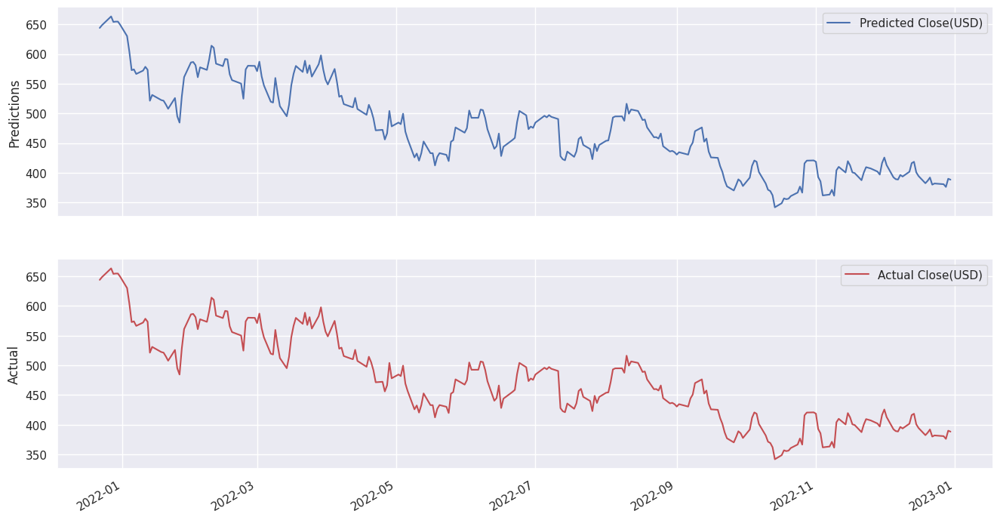

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16,9))
fig.autofmt_xdate()
ax1.plot(X_test.actual,label="Predicted Close(USD)")
ax2.plot(X_test.Predicted,label="Actual Close(USD)", color='r')
ax1.set_ylabel("Predictions")
ax2.set_ylabel("Actual")
ax1.legend(loc='best')
ax2.legend(loc='best')

In [ ]:
X_test['Close']= y_test
results= X_test

###  1 Buy & Hold Trading Strategy
 
* Position trading 
* Buy if we have next days predicted_value greater than todays close value and hold if already bought 
* Sell if we have next days predicted_value lesser than todays close value and dont buy until rule 1

In [ ]:
signal = 0
amount = 10000
Amount = []
balance = 0
action = []
portfolio = 0
Portfolio = []
stocks = 0
Stocks = []


for i in range(len(results)-1):
    if results['Predicted'][i+1] > results['actual'][i]:
        if signal == 0:
            action.append('Buy')
            stocks = int(amount / results['actual'][i])
            balance = int(amount % results['actual'][i])
            portfolio = stocks * results['actual'][i]
            signal = 1
            amount = portfolio + balance
            print('Stock:',results['actual'][i] ,'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Bought--Holding')
            portfolio = stocks * results['actual'][i]
            amount = portfolio + balance
            print('Stock:',results['actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
            
    elif results['Predicted'][i+1] < results['actual'][i]:
        if signal == 1:
            action.append('Sell')
            portfolio = stocks * results['actual'][i]
            
            signal = 0
            stocks = 0
            amount = balance + portfolio
            portfolio = 0
            balance = 0
            print('Stock:',results['actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
        else:
            action.append('Price-Prediction-Already-Lower')
            print('Stock:',results['actual'][i],'Action:',action[i],'Portfolio:',round(portfolio,2),'Stocks:', stocks,'Balance_init:',balance,'total($)',round(amount,2))
            Portfolio.append(round(portfolio,5))
            Amount.append(round(amount,0))
            Stocks.append(stocks)
            
    print('\n')
    

Stock: 643.93 Action: Buy Portfolio: 9658.95 Stocks: 15 Balance_init: 341 total($) 9999.95


Stock: 648.57 Action: Bought--Holding Portfolio: 9728.55 Stocks: 15 Balance_init: 341 total($) 10069.55


Stock: 663.28 Action: Sell Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10290.2


Stock: 654.0 Action: Buy Portfolio: 9810.0 Stocks: 15 Balance_init: 480 total($) 10290.0


Stock: 654.58 Action: Sell Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10298.7


Stock: 654.54 Action: Price-Prediction-Already-Lower Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10298.7


Stock: 649.11 Action: Price-Prediction-Already-Lower Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10298.7


Stock: 630.14 Action: Price-Prediction-Already-Lower Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10298.7


Stock: 603.94 Action: Price-Prediction-Already-Lower Portfolio: 0 Stocks: 0 Balance_init: 0 total($) 10298.7


Stock: 572.76 Action: Buy Portfolio: 9736.92 Stocks: 17 Balance_init: 561 total($) 10297.92


St

In [ ]:
results= results.reset_index()

In [ ]:
Strategy_Result = pd.DataFrame({'Actual_Close_Price':results.Close[1:],
                                 'Predicted_Close_Price':list(y_pred[1:]),
                                 'Date': results.Date[1:],
                                 'Action':  action,
                                 'Stocks': Stocks,
                                 'Portfolio($)': Portfolio,
                                 'Amount($)':Amount
                                    })

Strategy_Result.head()

,Actual_Close_Price,Predicted_Close_Price,Date,Action,Stocks,Portfolio($),Amount($)
1,648.57,648.569879,2021-12-23,Buy,15,9658.95,10000.0
2,663.28,663.279867,2021-12-27,Bought--Holding,15,9728.55,10070.0
3,654.00,653.999948,2021-12-28,Sell,0,0.00,10290.0
4,654.58,654.579859,2021-12-29,Buy,15,9810.00,10290.0
5,654.54,654.539970,2021-12-30,Sell,0,0.00,10299.0


<Axes: title={'center': 'Total Amount'}>

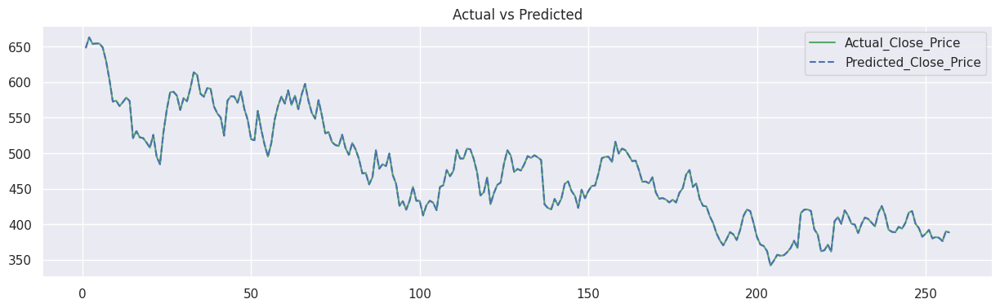

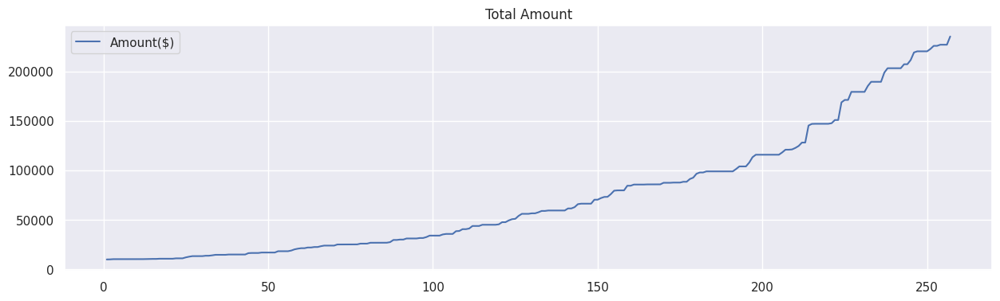

In [ ]:
Strategy_Result[['Actual_Close_Price','Predicted_Close_Price']].loc[0:].plot(figsize=(15,4), 
                                                                             style=['-g','--'], 
                                                                             title = 'Actual vs Predicted')


Strategy_Result[['Amount($)']].loc[0:].plot(figsize=(15,4), 
                                            style=['-b'], 
                                            title = 'Total Amount')

In [ ]:
Profit = (Amount[-1])/10000
print('Initial_Investment : 10000$')
print('Final Amount:',Amount[-1],'$')      
print ('Profit_Percent:',Profit*100,'%')

Initial_Investment : 10000$
Final Amount: 235152.0 $
Profit_Percent: 2351.52 %


In [ ]:
Strategy_Result['Returns'] = Strategy_Result['Amount($)'].pct_change()

In [ ]:
mean_returns = Strategy_Result['Returns'].mean()
sd = Strategy_Result['Returns'].std()
Sharpe_Ratio = np.sqrt(100)*(mean_returns)/sd
Sharpe_Ratio

5.931432566411152

In [ ]:
results.index= results['Date']

In [ ]:
long_MA = results['actual'].rolling(window=20).mean()
results['Long_Moving_Avg'] = long_MA

In [ ]:
short_MA  = results['actual'].rolling(window=5).mean()
results['Short_Moving_Avg'] = short_MA 

In [ ]:
long_std= results['actual'].rolling(window=20).std()
results['Long_std'] = long_std

In [ ]:
long_upper_band = ((long_MA) + (long_std)*0.75)
results['Long_Upper_Band'] = long_upper_band

In [ ]:
long_lower_band = ((long_MA) - (long_std)*0.75)
results['Long_Lower_Band'] = long_lower_band

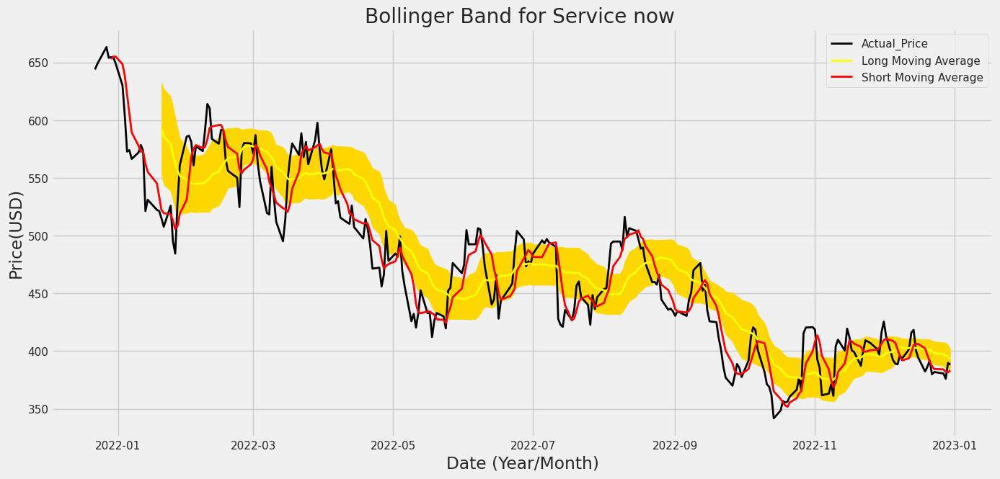

In [ ]:
plt.style.use('fivethirtyeight')
fig = plt.figure(figsize=(15,7))
ax = fig.add_subplot(111)
x_axis = results.index
ax.fill_between(x_axis, results['Long_Upper_Band'], results['Long_Lower_Band'], color='gold')
ax.plot(x_axis, results['actual'], color='black', lw=2, label = 'Actual_Price')
ax.plot(x_axis, results['Long_Moving_Avg'], color='yellow', lw=2, label = 'Long Moving Average')
ax.plot(x_axis, results['Short_Moving_Avg'], color='red', lw=2, label = 'Short Moving Average')

ax.set_title('Bollinger Band for Service now ')
ax.set_xlabel('Date (Year/Month)')
ax.set_ylabel('Price(USD)')
ax.legend()
plt.show()

# Random Forest

In [ ]:
class RandomForest():
    def __init__(self, x, y, n_trees, n_features, sample_sz, depth=10, min_leaf=5):
        np.random.seed(12)
        if n_features == 'sqrt':
            self.n_features = int(np.sqrt(x.shape[1]))
        elif n_features == 'log2':
            self.n_features = int(np.log2(x.shape[1]))
        else:
            self.n_features = n_features
#         print(self.n_features, "sha: ",x.shape[1])    
        self.x, self.y, self.sample_sz, self.depth, self.min_leaf  = x, y, sample_sz, depth, min_leaf
        self.trees = [self.create_tree() for i in range(n_trees)]

    def create_tree(self):
        idxs = np.random.permutation(len(self.y))[:self.sample_sz]
        f_idxs = np.random.permutation(self.x.shape[1])[:self.n_features]
        return DecisionTree(self.x.iloc[idxs], self.y[idxs], self.n_features, f_idxs,
                    idxs=np.array(range(self.sample_sz)),depth = self.depth, min_leaf=self.min_leaf)
        
    def predict(self, x):
        return np.mean([t.predict(x) for t in self.trees], axis=0)

def std_agg(cnt, s1, s2): return math.sqrt((s2/cnt) - (s1/cnt)**2)

class DecisionTree():
    def __init__(self, x, y, n_features, f_idxs,idxs,depth=10, min_leaf=5):
        self.x, self.y, self.idxs, self.min_leaf, self.f_idxs = x, y, idxs, min_leaf, f_idxs
        self.depth = depth
#         print(f_idxs)
#         print(self.depth)
        self.n_features = n_features
        self.n, self.c = len(idxs), x.shape[1]
        self.val = np.mean(y[idxs])
        self.score = float('inf')
        self.find_varsplit()
        
    def find_varsplit(self):
        for i in self.f_idxs: self.find_better_split(i)
        if self.is_leaf: return
        x = self.split_col
        lhs = np.nonzero(x<=self.split)[0]
        rhs = np.nonzero(x>self.split)[0]
        lf_idxs = np.random.permutation(self.x.shape[1])[:self.n_features]
        rf_idxs = np.random.permutation(self.x.shape[1])[:self.n_features]
        self.lhs = DecisionTree(self.x, self.y, self.n_features, lf_idxs, self.idxs[lhs], depth=self.depth-1, min_leaf=self.min_leaf)
        self.rhs = DecisionTree(self.x, self.y, self.n_features, rf_idxs, self.idxs[rhs], depth=self.depth-1, min_leaf=self.min_leaf)

    def find_better_split(self, var_idx):
        x, y = self.x.values[self.idxs,var_idx], self.y[self.idxs]
        sort_idx = np.argsort(x)
        sort_y,sort_x = y[sort_idx], x[sort_idx]
        rhs_cnt,rhs_sum,rhs_sum2 = self.n, sort_y.sum(), (sort_y**2).sum()
        lhs_cnt,lhs_sum,lhs_sum2 = 0,0.,0.

        for i in range(0,self.n-self.min_leaf-1):
            xi,yi = sort_x[i],sort_y[i]
            lhs_cnt += 1; rhs_cnt -= 1
            lhs_sum += yi; rhs_sum -= yi
            lhs_sum2 += yi**2; rhs_sum2 -= yi**2
            if i<self.min_leaf or xi==sort_x[i+1]:
                continue

            lhs_std = std_agg(lhs_cnt, lhs_sum, lhs_sum2)
            rhs_std = std_agg(rhs_cnt, rhs_sum, rhs_sum2)
            curr_score = lhs_std*lhs_cnt + rhs_std*rhs_cnt
            if curr_score<self.score: 
                self.var_idx,self.score,self.split = var_idx,curr_score,xi

    @property
    def split_name(self): return self.x.columns[self.var_idx]
    
    @property
    def split_col(self): return self.x.values[self.idxs,self.var_idx]

    @property
    def is_leaf(self): return self.score == float('inf') or self.depth <= 0 
    

    def predict(self, x):
        return np.array([self.predict_row(xi) for xi in x])

    def predict_row(self, xi):
        if self.is_leaf: return self.val
        t = self.lhs if xi[self.var_idx]<=self.split else self.rhs
        return t.predict_row(xi)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.dates as mdates
from pandas import DatetimeIndex
import math
import seaborn as sns
sns.set(style='darkgrid', context='talk', palette='Dark2')
my_year_month_fmt = mdates.DateFormatter('%m/%y')
plt.rcParams['figure.figsize'] = (15, 9)
from datetime import datetime
import datetime
import pandas_datareader as web

In [ ]:
import pandas as pd
import datetime
import pandas_datareader.data as web

# Define start and end dates
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

# Fetch the data for NOW stock from Yahoo Finance
ticker="NOW"
df_now = yf.download(ticker, start=start, end=end)
df_now.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700
2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900
2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900
2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000
2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200


In [ ]:
df_now=df_now.reset_index()
df_now['Date'] = pd.to_datetime(df_now['Date'])
df_now

,Date,Open,High,Low,Close,Adj Close,Volume
0,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700
1,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900
2,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900
3,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000
4,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200
...,...,...,...,...,...,...,...
1254,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600
1255,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900
1256,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100
1257,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500


In [ ]:
df_now.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259 entries, 0 to 1258
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1259 non-null   datetime64[ns]
 1   Open       1259 non-null   float64       
 2   High       1259 non-null   float64       
 3   Low        1259 non-null   float64       
 4   Close      1259 non-null   float64       
 5   Adj Close  1259 non-null   float64       
 6   Volume     1259 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 69.0 KB


In [ ]:
import pandas as pd
import datetime
import pandas_datareader.data as web

# Define start and end dates
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

# Fetch the data for NOW stock from Yahoo Finance
ticker2="ORCL"
df_oracle = yf.download(ticker2, start=start, end=end)
df_oracle.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-01-02,47.570000,47.799999,46.169998,46.630001,42.586102,25380000
2018-01-03,47.529999,48.070000,47.439999,47.709999,43.572430,24165000
2018-01-04,47.990002,48.189999,47.720001,48.180000,44.001671,19815100
2018-01-05,48.419998,48.630001,48.279999,48.470001,44.266521,14496400
2018-01-08,48.299999,49.070000,47.939999,48.980000,44.732300,15075000


In [ ]:
df_oracle=df_oracle.reset_index()
df_oracle['Date'] = pd.to_datetime(df_oracle['Date'])
df_oracle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259 entries, 0 to 1258
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1259 non-null   datetime64[ns]
 1   Open       1259 non-null   float64       
 2   High       1259 non-null   float64       
 3   Low        1259 non-null   float64       
 4   Close      1259 non-null   float64       
 5   Adj Close  1259 non-null   float64       
 6   Volume     1259 non-null   int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 69.0 KB


In [ ]:
df_oracle.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2018-01-02,47.570000,47.799999,46.169998,46.630001,42.586102,25380000
1,2018-01-03,47.529999,48.070000,47.439999,47.709999,43.572430,24165000
2,2018-01-04,47.990002,48.189999,47.720001,48.180000,44.001671,19815100
3,2018-01-05,48.419998,48.630001,48.279999,48.470001,44.266521,14496400
4,2018-01-08,48.299999,49.070000,47.939999,48.980000,44.732300,15075000


In [ ]:
df_now.index=DatetimeIndex(df_now['Date'])
df_oracle.index=DatetimeIndex(df_oracle['Date'])

In [ ]:
X = df_now
print(X)

                 Date        Open        High         Low       Close  \
Date                                                                    
2018-01-02 2018-01-02  131.000000  132.350006  130.139999  131.729996   
2018-01-03 2018-01-03  132.000000  133.250000  131.740005  132.910004   
2018-01-04 2018-01-04  133.880005  135.089996  133.779999  133.850006   
2018-01-05 2018-01-05  134.949997  135.130005  133.899994  135.009995   
2018-01-08 2018-01-08  135.050003  136.089996  134.869995  135.300003   
...               ...         ...         ...         ...         ...   
2022-12-23 2022-12-23  375.000000  381.899994  371.470001  381.859985   
2022-12-27 2022-12-27  380.149994  383.829987  374.109985  380.640015   
2022-12-28 2022-12-28  380.429993  385.619995  372.739990  376.049988   
2022-12-29 2022-12-29  380.950012  392.119995  379.010010  389.850006   
2022-12-30 2022-12-30  383.799988  389.670013  382.290009  388.269989   

             Adj Close   Volume  
Date            

In [ ]:
X['Stock_Price'] = (2*df_now.High + df_now.Low + df_now.Close)/4
X['Stock_Price']

Date
2018-01-02    131.642502
2018-01-03    132.787502
2018-01-04    134.452499
2018-01-05    134.792500
2018-01-08    135.587498
                 ...    
2022-12-23    379.282494
2022-12-27    380.602493
2022-12-28    380.007492
2022-12-29    388.275002
2022-12-30    387.475006
Name: Stock_Price, Length: 1259, dtype: float64

In [ ]:
df_oracle['High']

Date
2018-01-02    47.799999
2018-01-03    48.070000
2018-01-04    48.189999
2018-01-05    48.630001
2018-01-08    49.070000
                ...    
2022-12-23    80.900002
2022-12-27    81.470001
2022-12-28    81.639999
2022-12-29    81.800003
2022-12-30    81.930000
Name: High, Length: 1259, dtype: float64

In [ ]:
X['SP500'] = (2*df_oracle.High + df_oracle.Low + df_oracle.Close)/4
X

,Date,Open,High,Low,Close,Adj Close,Volume,Stock_Price,SP500
Date,,,,,,,,,
2018-01-02,2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,131.642502,47.099999
2018-01-03,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,132.787502,47.822499
2018-01-04,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,134.452499,48.070000
2018-01-05,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,134.792500,48.502501
2018-01-08,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,135.587498,48.764999
...,...,...,...,...,...,...,...,...,...
2022-12-23,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,379.282494,80.660000
2022-12-27,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,380.602493,81.132502
2022-12-28,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,380.007492,80.950001


In [ ]:
from sklearn.preprocessing import StandardScaler
col_names = ['SP500']
features = X[col_names]
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)

In [ ]:
X[col_names] = features

In [ ]:
X.drop(columns=['Date', 'Open', 'High', 'Low', 'Close','Adj Close'],inplace=True)

In [ ]:
X.head()

,Volume,Stock_Price,SP500
Date,,,
2018-01-02,1282700,131.642502,-1.090103
2018-01-03,1580900,132.787502,-1.040800
2018-01-04,1361900,134.452499,-1.023911
2018-01-05,1183000,134.792500,-0.994397
2018-01-08,1337200,135.587498,-0.976484


Text(0, 0.5, 'Stock_Price')

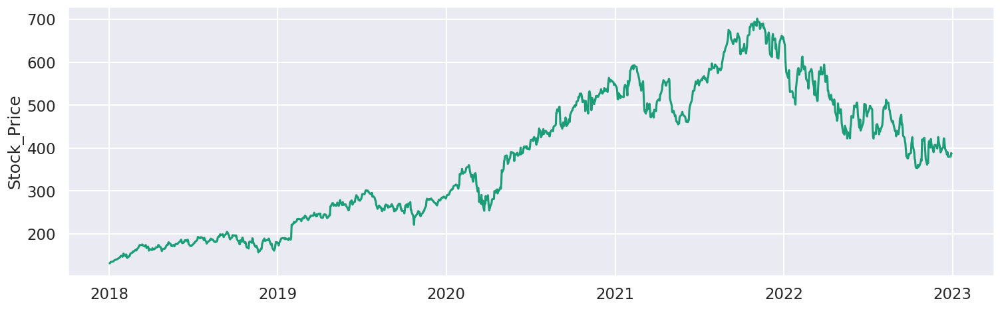

In [ ]:
fig, (ax1) = plt.subplots(1, 1, figsize=(16,5))
ax1.plot(X.index,X['Stock_Price'])
ax1.set_ylabel('Stock_Price')

In [ ]:
y = X.Stock_Price

In [ ]:
X.drop(['Stock_Price'],inplace = True,axis=1)

In [ ]:
rf = RandomForest(x=X,y=y,n_trees=30,n_features=3,sample_sz=100)

In [ ]:
tree = rf.create_tree()

In [ ]:
y_pred = rf.predict(X.tail(90).values)

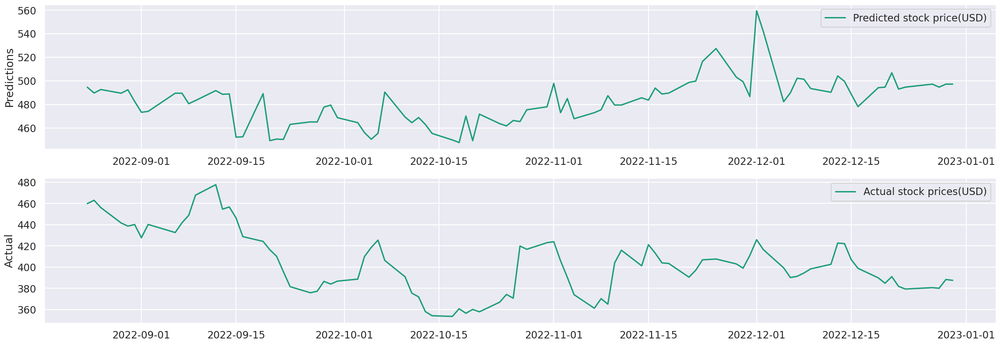

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(25,9))
ax1.plot(X.tail(90).index,y_pred,label="Predicted stock price(USD)")
ax1.set_ylabel("Predictions")
ax2.set_ylabel("Actual")
ax1.legend(loc='best')
ax2.plot(X.tail(90).index,y.tail(90),label="Actual stock prices(USD)")
ax2.legend(loc='best')

In [ ]:
# exponential weighted functions
ema_short = X.ewm(span=7, adjust=False).mean()

In [ ]:
y_short = y.ewm(span=7, adjust=False).mean()

In [ ]:
rf2 = RandomForest(x=ema_short,y=y_short,n_trees=30,n_features=3,sample_sz=100)

In [ ]:
y_pred_short = rf.predict(ema_short.tail(90).values)

In [ ]:
rf2.create_tree()

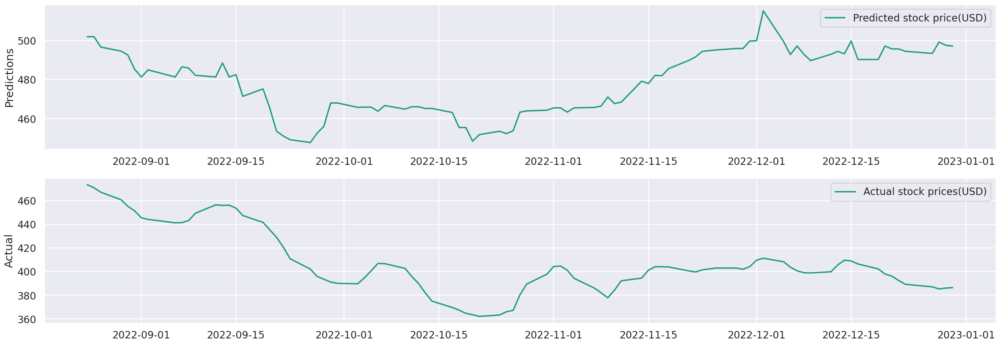

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(25,9))
ax1.plot(ema_short.tail(90).index,y_pred_short,label="Predicted stock price(USD)")
ax2.plot(X.tail(90).index,y_short.tail(90),label="Actual stock prices(USD)")
ax1.set_ylabel("Predictions")
ax2.set_ylabel("Actual")
ax1.legend(loc='best')
ax2.legend(loc='best')

In [ ]:
trading_signal_week = pd.DataFrame(np.sign(np.diff(y_pred_short)),index=X.tail(89).index,columns=["signal"])

In [ ]:
trading_signal_week.head()

,signal
Date,
2022-08-25,0.0
2022-08-26,-1.0
2022-08-29,-1.0
2022-08-30,-1.0
2022-08-31,-1.0


In [ ]:
X.head()

,Volume,SP500
Date,,
2018-01-02,1282700,-1.090103
2018-01-03,1580900,-1.040800
2018-01-04,1361900,-1.023911
2018-01-05,1183000,-0.994397
2018-01-08,1337200,-0.976484


In [ ]:
trading_signal_week = trading_signal_week.shift(1)

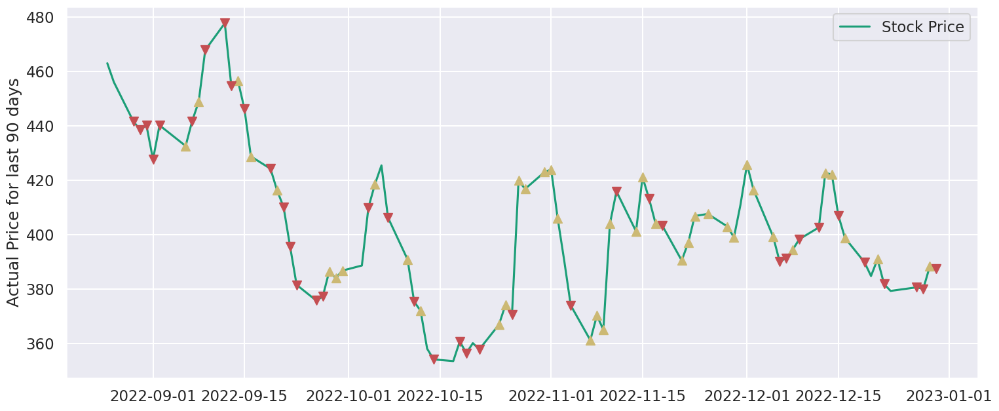

In [ ]:
fig, (ax2) = plt.subplots(1, 1, figsize=(16,7))
duration = 89
y_temp = pd.DataFrame(y_short.tail(duration),index =X.tail(duration).index)
ax2.plot(X.tail(duration).index,y.tail(duration),label="Stock Price" )

ax2.set_ylabel("Actual Price for last 90 days")

ax2.legend(loc='best')

# # Plot the buy signals
ax2.plot(trading_signal_week.tail(duration).loc[trading_signal_week.signal == 1.0].index, 
         y.tail(duration)[trading_signal_week.signal == 1.0],'^', markersize=10, color='y')

# Plot the sell signals
ax2.plot(trading_signal_week.tail(duration).loc[trading_signal_week.signal == -1.0].tail(duration).index, 
         y.tail(duration)[trading_signal_week.signal == -1.0],'v', markersize=10, color='r')

In [ ]:
# Set the initial capital
initial_capital= float(10000.0)

# Create a DataFrame 'positions'
positions = pd.DataFrame(index=trading_signal_week.index).fillna(0.0)

# Buy
positions['stock_price'] = trading_signal_week['signal'] 
  
# Initialize the portfolio with value owned   
portfolio = positions.multiply(y_short.tail(90), axis=0)

# Store the difference in shares owned 
pos_diff = positions.diff()

# Add 'holdings' to portfolio
portfolio['holdings'] = (positions.multiply(y_short.tail(90), axis=0)).sum(axis=1)

# Add 'cash' to portfolio
portfolio['cash'] = initial_capital - (pos_diff.multiply(y_short.tail(90), axis=0)).sum(axis=1).cumsum()   

# Add 'total' & 'returns' to portfolio
portfolio['total'] = portfolio['cash'] + portfolio['holdings']

portfolio['returns'] = portfolio['total'].pct_change()

In [ ]:
portfolio = portfolio.loc["2022-08-01":]

In [ ]:
portfolio

,stock_price,holdings,cash,total,returns
Date,,,,,
2022-08-24,NaN,0.000000,10000.000000,10000.000000,NaN
2022-08-25,NaN,0.000000,10000.000000,10000.000000,0.000000
2022-08-26,0.000000,0.000000,10000.000000,10000.000000,0.000000
2022-08-29,-460.822035,-460.822035,10460.822035,10000.000000,0.000000
2022-08-30,-455.273400,-455.273400,10460.822035,10005.548635,0.000555
...,...,...,...,...,...
2022-12-23,0.000000,0.000000,10088.581737,10088.581737,0.000329
2022-12-27,-387.088998,-387.088998,10475.670735,10088.581737,0.000000
2022-12-28,-385.318621,-385.318621,10475.670735,10090.352114,0.000175


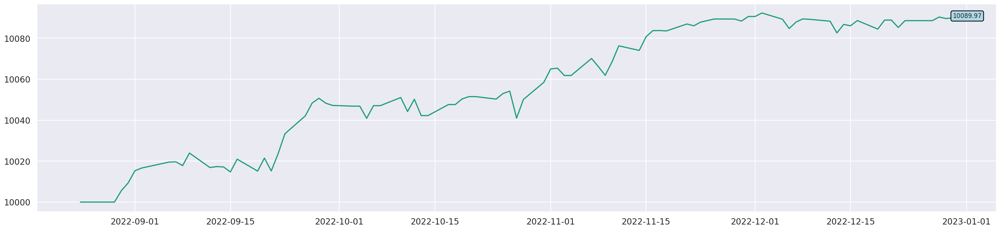

In [ ]:
import matplotlib.pyplot as plt

fig, ax1 = plt.subplots(1, 1, figsize=(30,7))
duration = 89
ax1.plot(portfolio['total'])

# Get the last element and its index
last_element = portfolio['total'].iloc[-1]
last_element_index = portfolio['total'].index[-1]

# Add a text annotation for the last element on the plot
ax1.annotate(f'{last_element:.2f}', 
             xy=(last_element_index, last_element), 
             xytext=(last_element_index, last_element), 
             textcoords='data',
             fontsize=12,
             bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightblue"),
             arrowprops=dict(facecolor='black', arrowstyle='-|>'))

plt.show()


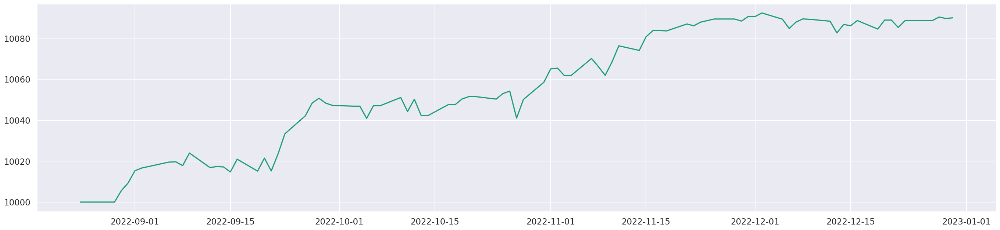

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(30,7))
duration = 89
ax1.plot(portfolio['total'])

In [ ]:
# Isolate the returns of the strategy
returns = portfolio['returns']
print(returns)
# 90 day Sharpe ratio
#sharpe_ratio = np.sqrt(90) * (returns.mean() / returns.std())

# Print the Sharpe ratio
#print(sharpe_ratio)

Date
2022-08-24         NaN
2022-08-25    0.000000
2022-08-26    0.000000
2022-08-29    0.000000
2022-08-30    0.000555
                ...   
2022-12-23    0.000329
2022-12-27    0.000000
2022-12-28    0.000175
2022-12-29   -0.000073
2022-12-30    0.000035
Name: returns, Length: 90, dtype: float64


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_short.tail(90), y_pred_short))

In [ ]:
rms

75.98018676847944

Model Combination
1. Auto Regression
2. Fama French
3. Moving Averages

Predition for 1st year's model


In [332]:
# to read the data and manipulate the data
import pandas as pd
import numpy as np

# for data visualization
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20, 10)
# from prettytable import PrettyTable

# for statistical analysis
import scipy.stats as ss
from scipy.optimize import minimize

# to ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [395]:
# read the dataset using pandas 
df_now = pd.read_csv('now_fama3_new_latest2018.csv')
df_now.head()

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109


In [396]:
df_now.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250 entries, 0 to 249
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          250 non-null    object 
 1   Open          250 non-null    float64
 2   High          250 non-null    float64
 3   Low           250 non-null    float64
 4   Close         250 non-null    float64
 5   Adj Close     250 non-null    float64
 6   Volume        250 non-null    int64  
 7   MktRF         250 non-null    float64
 8   SMB           250 non-null    float64
 9   HML           250 non-null    float64
 10  RF            250 non-null    float64
 11  Yest_Close    250 non-null    float64
 12  stock_return  250 non-null    float64
dtypes: float64(11), int64(1), object(1)
memory usage: 25.5+ KB


In [397]:
df_now['Date'] = pd.to_datetime(df_now['Date'])
df_now.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250 entries, 0 to 249
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          250 non-null    datetime64[ns]
 1   Open          250 non-null    float64       
 2   High          250 non-null    float64       
 3   Low           250 non-null    float64       
 4   Close         250 non-null    float64       
 5   Adj Close     250 non-null    float64       
 6   Volume        250 non-null    int64         
 7   MktRF         250 non-null    float64       
 8   SMB           250 non-null    float64       
 9   HML           250 non-null    float64       
 10  RF            250 non-null    float64       
 11  Yest_Close    250 non-null    float64       
 12  stock_return  250 non-null    float64       
dtypes: datetime64[ns](1), float64(11), int64(1)
memory usage: 25.5 KB


In [398]:
# Typical_Price is the mean value of High, Low and Close cols
df_now['Typical_Price'] = df_now[['High','Low','Close']].mean(axis=1)
df_now['Typical_Price_returns'] = (np.log(df_now.Typical_Price) - np.log(df_now.Typical_Price.shift(1))) * 100.
df_now['Volume_returns'] = (np.log(df_now.Volume) - np.log(df_now.Volume.shift(1))) * 100.
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return,Typical_Price,Typical_Price_returns,Volume_returns
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958,132.633336,NaN,NaN
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072,134.240000,1.204079,-14.911352
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666,134.679998,0.327233,-14.082720
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148,135.419998,0.547947,12.252429
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109,135.489995,0.051676,-2.376200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,2018-12-24,159.020004,163.809998,158.000000,158.919998,158.919998,896400,-2.55,1.00,-0.49,0.011,162.000000,-0.019012,160.243332,-2.506142,-113.884509
246,2018-12-26,159.679993,169.669998,159.679993,169.509995,169.509995,3050700,5.06,-0.05,-1.01,0.011,158.919998,0.066637,166.286662,3.701969,122.473961
247,2018-12-27,166.869995,178.240005,166.500000,178.199997,178.199997,2937500,0.78,-0.67,-0.13,0.011,169.509995,0.051265,174.313334,4.714127,-3.781219
248,2018-12-28,179.610001,184.089996,175.679993,180.330002,180.330002,2442100,-0.03,0.77,0.26,0.011,178.199997,0.011953,180.033330,3.228755,-18.470055


In [399]:
# read the ads_vintage file from the directory using pandas
ads_vintage = pd.read_csv("ADS_All_Vintages-zip.csv")
ads_vintage.head()

,Unnamed: 0,ADS_INDEX_120508,ADS_INDEX_121108,ADS_INDEX_121808,ADS_INDEX_122608,ADS_INDEX_123108,ADS_INDEX_010809,ADS_INDEX_010909,ADS_INDEX_011509,ADS_INDEX_011609,...,ADS_INDEX_020323,ADS_INDEX_020923,ADS_INDEX_021523,ADS_INDEX_021623,ADS_INDEX_022323,ADS_INDEX_022423,ADS_INDEX_030223,ADS_INDEX_030923,ADS_INDEX_031023,ADS_INDEX_031623
0,1960:03:01,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,...,-0.578687,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479
1,1960:03:02,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,...,-0.625808,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611
2,1960:03:03,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,...,-0.669969,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773
3,1960:03:04,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,...,-0.711184,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981
4,1960:03:05,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,...,-0.749464,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246


In [400]:
ads_vintage.tail()

,Unnamed: 0,ADS_INDEX_120508,ADS_INDEX_121108,ADS_INDEX_121808,ADS_INDEX_122608,ADS_INDEX_123108,ADS_INDEX_010809,ADS_INDEX_010909,ADS_INDEX_011509,ADS_INDEX_011609,...,ADS_INDEX_020323,ADS_INDEX_020923,ADS_INDEX_021523,ADS_INDEX_021623,ADS_INDEX_022323,ADS_INDEX_022423,ADS_INDEX_030223,ADS_INDEX_030923,ADS_INDEX_031023,ADS_INDEX_031623
23016,2023:03:07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.144814
23017,2023:03:08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146335
23018,2023:03:09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146844
23019,2023:03:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146341
23020,2023:03:11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.144825


In [401]:
ads_vintage = ads_vintage.rename(columns={"Unnamed: 0":"Date"})

In [402]:
ads_vintage['Date'] = pd.to_datetime(ads_vintage['Date'], format='%Y:%m:%d').dt.strftime('%Y-%m-%d')

In [403]:
ads_vintage

,Date,ADS_INDEX_120508,ADS_INDEX_121108,ADS_INDEX_121808,ADS_INDEX_122608,ADS_INDEX_123108,ADS_INDEX_010809,ADS_INDEX_010909,ADS_INDEX_011509,ADS_INDEX_011609,...,ADS_INDEX_020323,ADS_INDEX_020923,ADS_INDEX_021523,ADS_INDEX_021623,ADS_INDEX_022323,ADS_INDEX_022423,ADS_INDEX_030223,ADS_INDEX_030923,ADS_INDEX_031023,ADS_INDEX_031623
0,1960-03-01,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,...,-0.578687,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479
1,1960-03-02,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,...,-0.625808,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611
2,1960-03-03,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,...,-0.669969,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773
3,1960-03-04,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,...,-0.711184,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981
4,1960-03-05,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,...,-0.749464,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23016,2023-03-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.144814
23017,2023-03-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146335
23018,2023-03-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146844
23019,2023-03-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.146341


In [404]:
ads_vintage_clean = ads_vintage.loc[:,['Date','ADS_INDEX_031623']]
ads_vintage_clean.head()

,Date,ADS_INDEX_031623
0,1960-03-01,-0.578479
1,1960-03-02,-0.625611
2,1960-03-03,-0.669773
3,1960-03-04,-0.710981
4,1960-03-05,-0.749246


In [405]:
ads_vintage_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23021 entries, 0 to 23020
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              23021 non-null  object 
 1   ADS_INDEX_031623  23021 non-null  float64
dtypes: float64(1), object(1)
memory usage: 359.8+ KB


In [406]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return,Typical_Price,Typical_Price_returns,Volume_returns
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958,132.633336,NaN,NaN
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072,134.240000,1.204079,-14.911352
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666,134.679998,0.327233,-14.082720
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148,135.419998,0.547947,12.252429
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109,135.489995,0.051676,-2.376200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,2018-12-24,159.020004,163.809998,158.000000,158.919998,158.919998,896400,-2.55,1.00,-0.49,0.011,162.000000,-0.019012,160.243332,-2.506142,-113.884509
246,2018-12-26,159.679993,169.669998,159.679993,169.509995,169.509995,3050700,5.06,-0.05,-1.01,0.011,158.919998,0.066637,166.286662,3.701969,122.473961
247,2018-12-27,166.869995,178.240005,166.500000,178.199997,178.199997,2937500,0.78,-0.67,-0.13,0.011,169.509995,0.051265,174.313334,4.714127,-3.781219
248,2018-12-28,179.610001,184.089996,175.679993,180.330002,180.330002,2442100,-0.03,0.77,0.26,0.011,178.199997,0.011953,180.033330,3.228755,-18.470055


In [407]:
df_now['Date'] = pd.to_datetime(df_now['Date'], format='%Y:%m:%d').dt.strftime('%Y-%m-%d')

In [408]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return,Typical_Price,Typical_Price_returns,Volume_returns
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958,132.633336,NaN,NaN
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072,134.240000,1.204079,-14.911352
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666,134.679998,0.327233,-14.082720
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148,135.419998,0.547947,12.252429
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109,135.489995,0.051676,-2.376200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,2018-12-24,159.020004,163.809998,158.000000,158.919998,158.919998,896400,-2.55,1.00,-0.49,0.011,162.000000,-0.019012,160.243332,-2.506142,-113.884509
246,2018-12-26,159.679993,169.669998,159.679993,169.509995,169.509995,3050700,5.06,-0.05,-1.01,0.011,158.919998,0.066637,166.286662,3.701969,122.473961
247,2018-12-27,166.869995,178.240005,166.500000,178.199997,178.199997,2937500,0.78,-0.67,-0.13,0.011,169.509995,0.051265,174.313334,4.714127,-3.781219
248,2018-12-28,179.610001,184.089996,175.679993,180.330002,180.330002,2442100,-0.03,0.77,0.26,0.011,178.199997,0.011953,180.033330,3.228755,-18.470055


In [409]:
df_now = pd.merge(df_now, ads_vintage_clean, on='Date')
df_now.head()

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return,Typical_Price,Typical_Price_returns,Volume_returns,ADS_INDEX_031623
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958,132.633336,NaN,NaN,-0.306402
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072,134.240000,1.204079,-14.911352,-0.322442
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666,134.679998,0.327233,-14.082720,-0.336419
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148,135.419998,0.547947,12.252429,-0.367461
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109,135.489995,0.051676,-2.376200,-0.376114


# 1. Autoregressive Model

An autoregressive (AR) model predicts future behavior based on past behavior. It's used for forecasting when there is some correlation between values in a time series and the values that precede and succeed them. 

In [410]:
class ar1:
    
    def fit(X,Y):
        
        invXX = np.linalg.inv(X.transpose()@X)
        beta_hat = invXX@X.transpose()@Y
        y_hat = X@beta_hat
        residuals = Y - y_hat
        T = Y.shape[0]
        N = X.shape
        
        sigma2 = (1/T)*residuals.transpose()@residuals
        sigma = np.sqrt(sigma2)
        varcov_beta_hat = (sigma2)*invXX
        std_beta_hat = np.sqrt(T*np.diag(varcov_beta_hat))
        R_square = 1 - (residuals.transpose()@residuals)/(T*np.var(Y))
        adj_R_square = 1-(1-R_square)*(T-1)/(T-N[1])
        t_stat = (beta_hat.transpose()-0)/std_beta_hat
        p_val = 1-ss.norm.cdf(t_stat)
        F_stat = (beta_hat.transpose()@np.linalg.inv(varcov_beta_hat)@beta_hat/N[1])/(residuals.transpose()@residuals/(T-N[1]))
        p_val_F = 1 - ss.f.cdf(F_stat,N[1]-1,T-N[1])
#         rmse = np.sqrt(np.mean((Y-y_hat)**2))
#         ar1.metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse)
        return beta_hat,y_hat
    
    def metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse):
        
        t = PrettyTable(['Metrics', 'Values'])
        t.add_row(['Beta Values', beta_hat])
        t.add_row(['RMSE',rmse])
        t.add_row(['R-Square',R_square])
        t.add_row(['Adjusted R-Square',adj_R_square])
        t.add_row(['P values',p_val])
        print(t)
        plt.plot(Y)
        plt.plot(y_hat)

In [411]:
X_ar = df_now[['Typical_Price','Volume']].to_numpy()[1:]
X_ar = np.column_stack([np.ones((len(X_ar),1)),X_ar])
Y_ar = df_now[['Open']].to_numpy()[:-1]

# fitting the model
y_hat_1 = ar1.fit(X_ar,Y_ar)

# 2.Fama French Model

In [412]:
class Fama_French_5F:
    
    def fit(X,Y):
        
        invXX = np.linalg.inv(X.transpose()@X)
        beta_hat = invXX@X.transpose()@Y
        y_hat = X@beta_hat
        residuals = Y - y_hat
        T = Y.shape[0]
        N = X.shape
        
        sigma2 = (1/T)*residuals.transpose()@residuals
        sigma = np.sqrt(sigma2)
        varcov_beta_hat = (sigma2)*invXX
        std_beta_hat = np.sqrt(T*np.diag(varcov_beta_hat))
        R_square = 1 - (residuals.transpose()@residuals)/(T*np.var(Y))
        adj_R_square = 1-(1-R_square)*(T-1)/(T-N[1])
        t_stat = (beta_hat.transpose()-0)/std_beta_hat
        p_val = 1-ss.norm.cdf(t_stat)
        F_stat = (beta_hat.transpose()@np.linalg.inv(varcov_beta_hat)@beta_hat/N[1])/(residuals.transpose()@residuals/(T-N[1]))
        p_val_F = 1 - ss.f.cdf(F_stat,N[1]-1,T-N[1])
        #rmse = np.sqrt(np.mean((Y-y_hat)**2))
        #ar1.metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse)
        return beta_hat,y_hat
    
    def metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse):
        
        t = PrettyTable(['Metrics', 'Values'])
        t.add_row(['Beta Values', beta_hat])
        t.add_row(['RMSE',rmse])
        t.add_row(['R-Square',R_square])
        t.add_row(['Adjusted R-Square',adj_R_square])
        t.add_row(['P values',p_val])
        print(t)
        plt.plot(Y)
        plt.plot(y_hat)

SMB stands for "Small [market capitalization] Minus Big" and HML for "High [book-to-market ratio] Minus Low" MktRF stands for "Market Risk Factor"

In [413]:
X_FF = df_now[['MktRF','SMB','HML','ADS_INDEX_031623']].to_numpy()[1:]
X_FF = np.column_stack([np.ones((len(X_FF),1)),X_FF])
Y_FF = df_now[['Open']].to_numpy()[:-1]

y_hat_2 = Fama_French_5F.fit(X_FF,Y_FF)

# 3. Moving Average Model 📈📉

A moving average is a calculation used to analyze data points by creating a series of averages of different subsets of the full data set. In finance, a moving average (MA) is a stock indicator that is commonly used in technical analysis.

In [414]:
class moving_average:
    
    def fit(X,Y):
        
        invXX = np.linalg.inv(X.transpose()@X)
        beta_hat = invXX@X.transpose()@Y
        y_hat = X@beta_hat
        residuals = Y - y_hat
        T = Y.shape[0]
        N = X.shape
        
        sigma2 = (1/T)*residuals.transpose()@residuals
        sigma = np.sqrt(sigma2)
        varcov_beta_hat = (sigma2)*invXX
        std_beta_hat = np.sqrt(T*np.diag(varcov_beta_hat))
        R_square = 1 - (residuals.transpose()@residuals)/(T*np.var(Y))
        adj_R_square = 1-(1-R_square)*(T-1)/(T-N[1])
        t_stat = (beta_hat.transpose()-0)/std_beta_hat
        p_val = 1-ss.norm.cdf(t_stat)
        F_stat = (beta_hat.transpose()@np.linalg.inv(varcov_beta_hat)@beta_hat/N[1])/(residuals.transpose()@residuals/(T-N[1]))
        p_val_F = 1 - ss.f.cdf(F_stat,N[1]-1,T-N[1])
#         rmse = np.sqrt(np.mean((Y-y_hat)**2))
#         ar1.metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse)
        return beta_hat,y_hat
    
    def metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse):
        
        t = PrettyTable(['Metrics', 'Values'])
        t.add_row(['Beta Values', beta_hat])
        t.add_row(['RMSE',rmse])
        t.add_row(['R-Square',R_square])
        t.add_row(['Adjusted R-Square',adj_R_square])
        t.add_row(['P values',p_val])
        print(t)
        plt.plot(Y)
        plt.plot(y_hat)

In [415]:
X_EMA = df_now[['Typical_Price_returns','Volume_returns']].to_numpy()[1:]
X_EMA = np.column_stack([np.ones((len(X_EMA),1)),X_EMA])
Y_EMA = df_now[['Open']].to_numpy()[:-1]

y_hat_3 = moving_average.fit(X_EMA,Y_EMA)

# 4. Random Forest 🌲🌲🌲🌲

In [416]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return,Typical_Price,Typical_Price_returns,Volume_returns,ADS_INDEX_031623
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958,132.633336,NaN,NaN,-0.306402
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072,134.240000,1.204079,-14.911352,-0.322442
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666,134.679998,0.327233,-14.082720,-0.336419
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148,135.419998,0.547947,12.252429,-0.367461
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109,135.489995,0.051676,-2.376200,-0.376114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,2018-12-24,159.020004,163.809998,158.000000,158.919998,158.919998,896400,-2.55,1.00,-0.49,0.011,162.000000,-0.019012,160.243332,-2.506142,-113.884509,-0.220394
246,2018-12-26,159.679993,169.669998,159.679993,169.509995,169.509995,3050700,5.06,-0.05,-1.01,0.011,158.919998,0.066637,166.286662,3.701969,122.473961,-0.226420
247,2018-12-27,166.869995,178.240005,166.500000,178.199997,178.199997,2937500,0.78,-0.67,-0.13,0.011,169.509995,0.051265,174.313334,4.714127,-3.781219,-0.229741
248,2018-12-28,179.610001,184.089996,175.679993,180.330002,180.330002,2442100,-0.03,0.77,0.26,0.011,178.199997,0.011953,180.033330,3.228755,-18.470055,-0.233268


In [417]:
df_now.shape

(250, 17)

In [424]:
def Randomforest():
    
    #AR1
    N = df_now.shape[0] # Total Number of days
    num_boot = 400 #  Number of bootstraps
    T= 200 #Starting Value
    window = 200
    
    Y =df_now['Open'][-(N-(T+1)):].values
    Y_close = df_now['Close'][-(N-(T+1)):].values
    
    y_hat_ar = np.zeros(N-(T+1))
    
    for t in range(T+1, N):    
        # training data
        X_train = df_now[['Typical_Price','Volume']][t-window:t-1] # regression variables
        X_train = np.column_stack([np.ones((len(X_train),1)),X_train])
        Y_train = df_now['Open'][t-window:t-1].values
        # one day prediction
        X_pred = df_now[['Typical_Price','Volume']][t-1:t]
        X_pred = np.column_stack([np.ones((len(X_pred),1)),X_pred])
        
        yhat_train = ar1.fit(X_train, Y_train)[1]
        
        res_train =  Y_train - yhat_train
        y_pred_all = np.zeros(num_boot)
        # bootstrap method: switching residuals
        for i in range(0, num_boot):
            err = np.random.choice(res_train, (window-1, ), replace=True)
            y_bstr = yhat_train + err   
            beta_bstr = ar1.fit(X_train, y_bstr)[0]
            y_pred_bstr = X_pred@beta_bstr
            y_pred_all[i]=y_pred_bstr         
        y_pred_ar1 = y_pred_all.mean() # get mean of all bootstrap predictions        
        y_hat_ar[t-(T+1)]=y_pred_ar1 # do this for each time step
    rmse_ar1 = np.sqrt(np.mean((y_hat_ar-Y)**2))
    #print(rmse_ar1)
    
    #FF
    
    y_hat_FF = np.zeros(N-(T+1))
    
    for t in range(T+1, N):    
        # training data
        X_train = df_now[['MktRF','SMB','HML','ADS_INDEX_031623']][t-window:t-1] # regression variables
        X_train = np.column_stack([np.ones((len(X_train),1)),X_train])
        Y_train = df_now['Open'][t-window:t-1].values
        # one day prediction
        X_pred = df_now[['MktRF','SMB','HML','ADS_INDEX_031623']][t-1:t]
        X_pred = np.column_stack([np.ones((len(X_pred),1)),X_pred])
        
        yhat_train = Fama_French_5F.fit(X_train, Y_train)[1]
        
        res_train =  Y_train - yhat_train
        y_pred_all = np.zeros(num_boot)
        # bootstrap method: switching residuals
        for i in range(0, num_boot):
            err = np.random.choice(res_train, (window-1, ), replace=True)
            y_bstr = yhat_train + err   
            beta_bstr = Fama_French_5F.fit(X_train, y_bstr)[0]
            y_pred_bstr = X_pred@beta_bstr
            y_pred_all[i]=y_pred_bstr         
        y_pred_FF = y_pred_all.mean() # get mean of all bootstrap predictions        
        y_hat_FF[t-(T+1)]=y_pred_FF # do this for each time step
    rmse_FF = np.sqrt(np.mean((y_hat_FF-Y)**2))
    #print(rmse_FF)
    
    
    y_hat_ma = np.zeros(N-(T+1))
    #df_now['ema'] = df_now.Typical_Price.ewm(span=5,adjust=False).mean()
    for t in range(T+1, N):    
        # training data
        X_train = df_now[['Typical_Price_returns','Volume_returns']][t-window:t-1] # regression variables
        X_train = np.column_stack([np.ones((len(X_train),1)),X_train])
        Y_train = df_now['Open'][t-window:t-1].values
        # one day prediction
        X_pred = df_now[['Typical_Price_returns','Volume_returns']][t-1:t]
        X_pred = np.column_stack([np.ones((len(X_pred),1)),X_pred])
        
        yhat_train = moving_average.fit(X_train, Y_train)[1]
        
        res_train =  Y_train - yhat_train
        y_pred_all = np.zeros(num_boot)
        # bootstrap method: switching residuals
        for i in range(0, num_boot):
            err = np.random.choice(res_train, (window-1, ), replace=True)
            y_bstr = yhat_train + err   
            beta_bstr = moving_average.fit(X_train, y_bstr)[0]
            y_pred_bstr = X_pred@beta_bstr
            y_pred_all[i]=y_pred_bstr         
        y_pred_ma = y_pred_all.mean() # get mean of all bootstrap predictions        
        y_hat_ma[t-(T+1)]=y_pred_ma # do this for each time step
    rmse_ma = np.sqrt(np.mean((y_hat_ma-Y)**2))
    #print(rmse_ma)
    
    T1 = Y.shape[0]
    Y_rf = np.zeros(T1)
    for t in range(0, T1):
        if min(abs(y_hat_ar[t]-Y[t]),abs(y_hat_ma[t]-Y[t]),
               abs(y_hat_FF[t]-Y[t]))==abs(y_hat_ar[t]-Y[t]):
            Y_rf[t] = y_hat_ar[t]
        elif min(abs(y_hat_ar[t]-Y[t]),abs(y_hat_ma[t]-Y[t]),
                 abs(y_hat_FF[t]-Y[t]))==abs(y_hat_ma[t]-Y[t]):
            Y_rf[t] = y_hat_ma[t]
        elif min(abs(y_hat_ar[t]-Y[t]),abs(y_hat_ma[t]-Y[t]),
                 abs(y_hat_FF[t]-Y[t]))==abs(y_hat_FF[t]-Y[t]):
            Y_rf[t] = y_hat_FF[t]          
        else:
            Y_rf[t] = y_hat_allf[t]  
    rmse_rf=np.sqrt(np.mean((Y-Y_rf)**2))
    
    print("ar1_RMSE: ", rmse_ar1)
    print("ma_RMSE: ", rmse_ma)
    print("FF_RMSE: ", rmse_FF)
    print("random forest rmse: ", rmse_rf)
    
    timevec = np.linspace(1,T1,T1)
    plt.figure(figsize=(30,20))
    
    ax = plt.subplot(211)
    ax.plot(timevec, Y, 'blue', label = "Y: original")
    ax.plot(timevec, y_hat_ar, 'red', label = "AR1")
    ax.plot(timevec, y_hat_ma, 'green', label = "Moving Average")
    ax.plot(timevec, y_hat_FF, 'purple', label = "Farma French")
    plt.title('Models Prediction using single models')
    ax.legend(loc=2, bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
    
    
    ax = plt.subplot(212)
    ax.plot(timevec, Y, 'blue', label = "Y: original")
    ax.plot(timevec, Y_rf, 'red', label = "Y_rf")
    plt.title('Random Forest Prediction')
    ax.legend(loc=2, bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
    plt.show()
    
    return Y_rf,Y, Y_close

In [418]:
'''def Randomforest():
    
    #AR1
    N = df_now.shape[0] # Total Number of days
    num_boot = 400 #  Number of bootstraps
    T= 0 #Starting Value
    window = 200
    
    Y =df_now['Open'][-(N-(T+1)):].values
    Y_close = df_now['Close'][-(N-(T+1)):].values
    
    y_hat_ar = np.zeros(N-(T+1))
    
    for t in range(T+1, N):    
        # training data
        X_train = df_now[['Typical_Price','Volume']][t-window:t-1] # regression variables
        X_train = np.column_stack([np.ones((len(X_train),1)),X_train])
        Y_train = df_now['Open'][t-window:t-1].values
        # one day prediction
        X_pred = df_now[['Typical_Price','Volume']][t-1:t]
        X_pred = np.column_stack([np.ones((len(X_pred),1)),X_pred])
        
        try:
            yhat_train = ar1.fit(X_train, Y_train)[1]
        except np.linalg.LinAlgError:
            print("Singular matrix encountered in AR1 model with X_train:")
            print(X_train)
            raise        
        res_train =  Y_train - yhat_train
        y_pred_all = np.zeros(num_boot)
        # bootstrap method: switching residuals
        for i in range(0, num_boot):
            err = np.random.choice(res_train, (window-1, ), replace=True)
            y_bstr = yhat_train + err   
            beta_bstr = ar1.fit(X_train, y_bstr)[0]
            y_pred_bstr = X_pred@beta_bstr
            y_pred_all[i]=y_pred_bstr         
        y_pred_ar1 = y_pred_all.mean() # get mean of all bootstrap predictions        
        y_hat_ar[t-(T+1)]=y_pred_ar1 # do this for each time step
    rmse_ar1 = np.sqrt(np.mean((y_hat_ar-Y)**2))
    #print(rmse_ar1)
    
    #FF
    
    y_hat_FF = np.zeros(N-(T+1))
    
    for t in range(T+1, N):    
        # training data
        X_train = df_now[['MktRF','SMB','HML','ADS_INDEX_031623']][t-window:t-1] # regression variables
        X_train = np.column_stack([np.ones((len(X_train),1)),X_train])
        Y_train = df_now['Open'][t-window:t-1].values
        # one day prediction
        X_pred = df_now[['MktRF','SMB','HML','ADS_INDEX_031623']][t-1:t]
        X_pred = np.column_stack([np.ones((len(X_pred),1)),X_pred])
        
        try:
            yhat_train = Fama_French_5F.fit(X_train, Y_train)[1]
        except np.linalg.LinAlgError:
            print("Singular matrix encountered in AR1 model with X_train:")
            print(X_train)
            raise
        
        res_train =  Y_train - yhat_train
        y_pred_all = np.zeros(num_boot)
        # bootstrap method: switching residuals
        for i in range(0, num_boot):
            err = np.random.choice(res_train, (window-1, ), replace=True)
            y_bstr = yhat_train + err   
            beta_bstr = Fama_French_5F.fit(X_train, y_bstr)[0]
            y_pred_bstr = X_pred@beta_bstr
            y_pred_all[i]=y_pred_bstr         
        y_pred_FF = y_pred_all.mean() # get mean of all bootstrap predictions        
        y_hat_FF[t-(T+1)]=y_pred_FF # do this for each time step
    rmse_FF = np.sqrt(np.mean((y_hat_FF-Y)**2))
    #print(rmse_FF)
    
    
    y_hat_ma = np.zeros(N-(T+1))
    #df['ema'] = df.Typical_Price.ewm(span=5,adjust=False).mean()
    for t in range(T+1, N):    
        # training data
        X_train = df_now[['Typical_Price_returns','Volume_returns']][t-window:t-1] # regression variables
        X_train = np.column_stack([np.ones((len(X_train),1)),X_train])
        Y_train = df_now['Open'][t-window:t-1].values
        # one day prediction
        X_pred = df_now[['Typical_Price_returns','Volume_returns']][t-1:t]
        X_pred = np.column_stack([np.ones((len(X_pred),1)),X_pred])
        
        yhat_train = moving_average.fit(X_train, Y_train)[1]
        
        res_train =  Y_train - yhat_train
        y_pred_all = np.zeros(num_boot)
        # bootstrap method: switching residuals
        for i in range(0, num_boot):
            err = np.random.choice(res_train, (window-1, ), replace=True)
            y_bstr = yhat_train + err   
            beta_bstr = moving_average.fit(X_train, y_bstr)[0]
            y_pred_bstr = X_pred@beta_bstr
            y_pred_all[i]=y_pred_bstr         
        y_pred_ma = y_pred_all.mean() # get mean of all bootstrap predictions        
        y_hat_ma[t-(T+1)]=y_pred_ma # do this for each time step
    rmse_ma = np.sqrt(np.mean((y_hat_ma-Y)**2))
    #print(rmse_ma)
    
    T1 = Y.shape[0]
    Y_rf = np.zeros(T1)
    for t in range(0, T1):
        if min(abs(y_hat_ar[t]-Y[t]),abs(y_hat_ma[t]-Y[t]),
               abs(y_hat_FF[t]-Y[t]))==abs(y_hat_ar[t]-Y[t]):
            Y_rf[t] = y_hat_ar[t]
        elif min(abs(y_hat_ar[t]-Y[t]),abs(y_hat_ma[t]-Y[t]),
                 abs(y_hat_FF[t]-Y[t]))==abs(y_hat_ma[t]-Y[t]):
            Y_rf[t] = y_hat_ma[t]
        elif min(abs(y_hat_ar[t]-Y[t]),abs(y_hat_ma[t]-Y[t]),
                 abs(y_hat_FF[t]-Y[t]))==abs(y_hat_FF[t]-Y[t]):
            Y_rf[t] = y_hat_FF[t]          
        else:
            Y_rf[t] = y_hat_allf[t]  
    rmse_rf=np.sqrt(np.mean((Y-Y_rf)**2))
    
    print("ar1_RMSE: ", rmse_ar1)
    print("ma_RMSE: ", rmse_ma)
    print("FF_RMSE: ", rmse_FF)
    print("random forest rmse: ", rmse_rf)
    
    timevec = np.linspace(1,T1,T1)
    plt.figure(figsize=(30,20))
    
    ax = plt.subplot(211)
    ax.plot(timevec, Y, 'blue', label = "Y: original")
    ax.plot(timevec, y_hat_ar, 'red', label = "AR1")
    ax.plot(timevec, y_hat_ma, 'green', label = "Moving Average")
    ax.plot(timevec, y_hat_FF, 'purple', label = "Farma French")
    plt.title('Models Prediction using single models')
    ax.legend(loc=2, bbox_to_anchor=(0.8, 1.00), shadow=True, ncol=2)
    
    
    ax = plt.subplot(212)
    ax.plot(timevec, Y, 'blue', label = "Y: original")
    ax.plot(timevec, Y_rf, 'red', label = "Y_rf")
    plt.title('Random Forest Prediction')
    ax.legend(loc=2, bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
    plt.show()
    
    return Y_rf,Y, Y_close
    '''

In [425]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return,Typical_Price,Typical_Price_returns,Volume_returns,ADS_INDEX_031623
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958,132.633336,NaN,NaN,-0.306402
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072,134.240000,1.204079,-14.911352,-0.322442
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666,134.679998,0.327233,-14.082720,-0.336419
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148,135.419998,0.547947,12.252429,-0.367461
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109,135.489995,0.051676,-2.376200,-0.376114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245,2018-12-24,159.020004,163.809998,158.000000,158.919998,158.919998,896400,-2.55,1.00,-0.49,0.011,162.000000,-0.019012,160.243332,-2.506142,-113.884509,-0.220394
246,2018-12-26,159.679993,169.669998,159.679993,169.509995,169.509995,3050700,5.06,-0.05,-1.01,0.011,158.919998,0.066637,166.286662,3.701969,122.473961,-0.226420
247,2018-12-27,166.869995,178.240005,166.500000,178.199997,178.199997,2937500,0.78,-0.67,-0.13,0.011,169.509995,0.051265,174.313334,4.714127,-3.781219,-0.229741
248,2018-12-28,179.610001,184.089996,175.679993,180.330002,180.330002,2442100,-0.03,0.77,0.26,0.011,178.199997,0.011953,180.033330,3.228755,-18.470055,-0.233268


ar1_RMSE:  4.081470282007264
ma_RMSE:  11.03879091608539
FF_RMSE:  11.571173173304317
random forest rmse:  3.5381137796768027


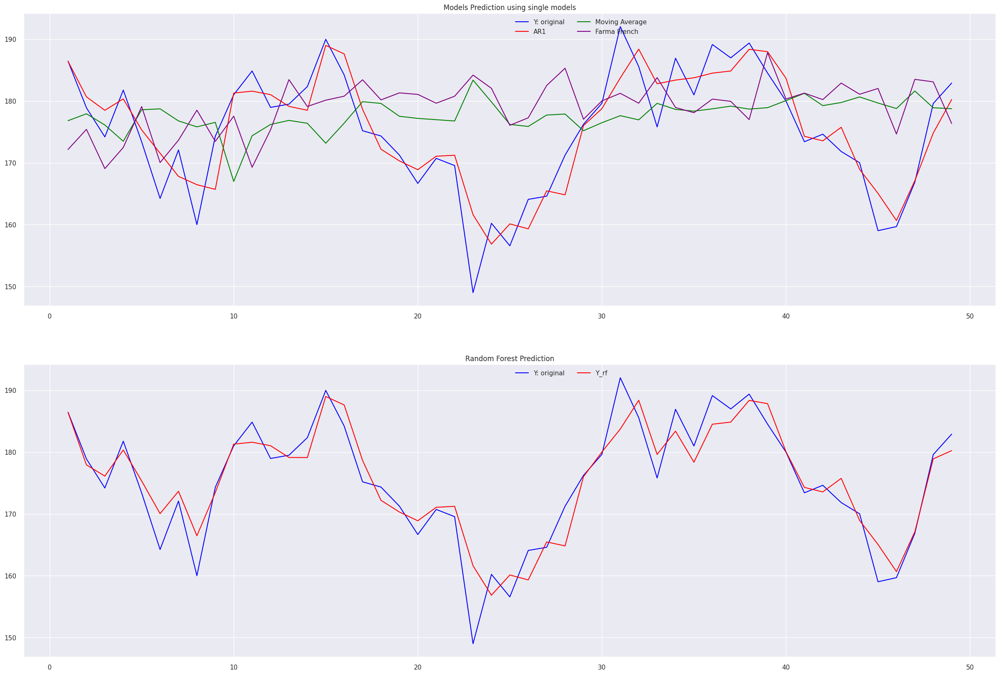

In [426]:
Y_rf,Y, Y_close = Randomforest()

In [427]:
results = np.stack([Y,Y_rf,Y_close],axis=1)

In [431]:
final_results = pd.DataFrame(results,columns=['Y','Y_rf','Y_close'])
final_results.head()
final_results.tail()

,Y,Y_rf,Y_close
44,159.020004,165.056914,158.919998
45,159.679993,160.666318,169.509995
46,166.869995,167.110070,178.199997
47,179.610001,178.916048,180.330002
48,182.919998,180.250915,178.050003


In [432]:
final_results = final_results.reindex()

In [434]:
final_results.head()

,Y,Y_rf,Y_close
0,186.460007,186.434032,177.149994
1,178.910004,177.942736,178.839996
2,174.199997,176.124474,181.779999
3,181.779999,180.355396,170.210007
4,173.399994,175.335344,172.630005


In [435]:
final_results.tail()

,Y,Y_rf,Y_close
44,159.020004,165.056914,158.919998
45,159.679993,160.666318,169.509995
46,166.869995,167.110070,178.199997
47,179.610001,178.916048,180.330002
48,182.919998,180.250915,178.050003


Prediction for 4 year (2018-2022)

In [436]:
# to read the data and manipulate the data
import pandas as pd
import numpy as np

# for data visualization
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20, 10)
# from prettytable import PrettyTable

# for statistical analysis
import scipy.stats as ss
from scipy.optimize import minimize

# to ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [437]:
# read the dataset using pandas 
df_now = pd.read_csv('now_fama3_new_latest(2018-2022).csv')
df_now.head()

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109


In [438]:
df_now.shape

(1258, 13)

In [439]:
df_now.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          1258 non-null   object 
 1   Open          1258 non-null   float64
 2   High          1258 non-null   float64
 3   Low           1258 non-null   float64
 4   Close         1258 non-null   float64
 5   Adj Close     1258 non-null   float64
 6   Volume        1258 non-null   int64  
 7   MktRF         1258 non-null   float64
 8   SMB           1258 non-null   float64
 9   HML           1258 non-null   float64
 10  RF            1258 non-null   float64
 11  Yest_Close    1258 non-null   float64
 12  stock_return  1258 non-null   float64
dtypes: float64(11), int64(1), object(1)
memory usage: 127.9+ KB


### Date Column is of type *object*. We need to convert it to type *datetime64[ns]*. You'll later figure out why! 🤔

In [440]:
df_now['Date'] = pd.to_datetime(df_now['Date'])
df_now.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1258 entries, 0 to 1257
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          1258 non-null   datetime64[ns]
 1   Open          1258 non-null   float64       
 2   High          1258 non-null   float64       
 3   Low           1258 non-null   float64       
 4   Close         1258 non-null   float64       
 5   Adj Close     1258 non-null   float64       
 6   Volume        1258 non-null   int64         
 7   MktRF         1258 non-null   float64       
 8   SMB           1258 non-null   float64       
 9   HML           1258 non-null   float64       
 10  RF            1258 non-null   float64       
 11  Yest_Close    1258 non-null   float64       
 12  stock_return  1258 non-null   float64       
dtypes: datetime64[ns](1), float64(11), int64(1)
memory usage: 127.9 KB


In [441]:
# Typical_Price is the mean value of High, Low and Close price 
df_now['Typical_Price'] = df_now[['High','Low','Close']].mean(axis=1)
df_now['Typical_Price_returns'] = (np.log(df_now.Typical_Price) - np.log(df_now.Typical_Price.shift(1))) * 100.
df_now['Volume_returns'] = (np.log(df_now.Volume) - np.log(df_now.Volume.shift(1))) * 100.
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return,Typical_Price,Typical_Price_returns,Volume_returns
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958,132.633336,NaN,NaN
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072,134.240000,1.204079,-14.911352
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666,134.679998,0.327233,-14.082720
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148,135.419998,0.547947,12.252429
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109,135.489995,0.051676,-2.376200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1253,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,0.51,-0.60,1.15,0.016,379.940002,0.005053,378.409993,-0.450873,-40.398530
1254,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,-0.51,-0.73,1.43,0.016,381.859985,-0.003195,379.526662,0.294660,-3.287154
1255,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,-1.23,-0.24,-0.29,0.016,380.640015,-0.012059,378.136658,-0.366919,-7.098545
1256,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,1.87,1.26,-1.07,0.016,376.049988,0.036697,386.993337,2.315182,17.580293


In [442]:
df_now['Date'] = pd.to_datetime(df_now['Date'], format='%Y:%m:%d').dt.strftime('%Y-%m-%d')

In [443]:
# read the ads_vintage file from the directory using pandas
ads_vintage = pd.read_csv('ADS_All_Vintages-zip.csv')
ads_vintage.head()

,Unnamed: 0,ADS_INDEX_120508,ADS_INDEX_121108,ADS_INDEX_121808,ADS_INDEX_122608,ADS_INDEX_123108,ADS_INDEX_010809,ADS_INDEX_010909,ADS_INDEX_011509,ADS_INDEX_011609,...,ADS_INDEX_020323,ADS_INDEX_020923,ADS_INDEX_021523,ADS_INDEX_021623,ADS_INDEX_022323,ADS_INDEX_022423,ADS_INDEX_030223,ADS_INDEX_030923,ADS_INDEX_031023,ADS_INDEX_031623
0,1960:03:01,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,-2.22962,...,-0.578687,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479,-0.578479
1,1960:03:02,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,-2.19525,...,-0.625808,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611,-0.625611
2,1960:03:03,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,-2.16200,...,-0.669969,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773,-0.669773
3,1960:03:04,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,-2.12986,...,-0.711184,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981,-0.710981
4,1960:03:05,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,-2.09883,...,-0.749464,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246,-0.749246


We need the Date and the ADS_INDEX_031623 columns of the data. 

In [444]:
ads_vintage = ads_vintage.rename(columns={"Unnamed: 0":"Date"})

In [445]:
ads_vintage['Date'] = pd.to_datetime(ads_vintage['Date'], format='%Y:%m:%d').dt.strftime('%Y-%m-%d')

In [446]:
ads_vintage_clean = ads_vintage.loc[:,['Date','ADS_INDEX_031623']]
ads_vintage_clean.head()

,Date,ADS_INDEX_031623
0,1960-03-01,-0.578479
1,1960-03-02,-0.625611
2,1960-03-03,-0.669773
3,1960-03-04,-0.710981
4,1960-03-05,-0.749246


In [447]:
ads_vintage_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23021 entries, 0 to 23020
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              23021 non-null  object 
 1   ADS_INDEX_031623  23021 non-null  float64
dtypes: float64(1), object(1)
memory usage: 359.8+ KB


### Now we can merge the two datasets on Date column as they're now of same datatype.  💡

In [448]:
df_now

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return,Typical_Price,Typical_Price_returns,Volume_returns
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958,132.633336,NaN,NaN
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072,134.240000,1.204079,-14.911352
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666,134.679998,0.327233,-14.082720
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148,135.419998,0.547947,12.252429
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109,135.489995,0.051676,-2.376200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1253,2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,0.51,-0.60,1.15,0.016,379.940002,0.005053,378.409993,-0.450873,-40.398530
1254,2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,-0.51,-0.73,1.43,0.016,381.859985,-0.003195,379.526662,0.294660,-3.287154
1255,2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,-1.23,-0.24,-0.29,0.016,380.640015,-0.012059,378.136658,-0.366919,-7.098545
1256,2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,1.87,1.26,-1.07,0.016,376.049988,0.036697,386.993337,2.315182,17.580293


In [449]:
ads_vintage_clean

,Date,ADS_INDEX_031623
0,1960-03-01,-0.578479
1,1960-03-02,-0.625611
2,1960-03-03,-0.669773
3,1960-03-04,-0.710981
4,1960-03-05,-0.749246
...,...,...
23016,2023-03-07,0.144814
23017,2023-03-08,0.146335
23018,2023-03-09,0.146844
23019,2023-03-10,0.146341


In [450]:
df_now = pd.merge(df_now, ads_vintage_clean, on='Date')
df_now.head()

,Date,Open,High,Low,Close,Adj Close,Volume,MktRF,SMB,HML,RF,Yest_Close,stock_return,Typical_Price,Typical_Price_returns,Volume_returns,ADS_INDEX_031623
0,2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.59,-0.39,-0.19,0.006,131.729996,0.008958,132.633336,NaN,NaN,-0.306402
1,2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.42,-0.26,0.25,0.006,132.910004,0.007072,134.240000,1.204079,-14.911352,-0.322442
2,2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.66,-0.35,-0.25,0.006,133.850006,0.008666,134.679998,0.327233,-14.082720,-0.336419
3,2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.19,-0.15,0.04,0.006,135.009995,0.002148,135.419998,0.547947,12.252429,-0.367461
4,2018-01-09,135.649994,136.399994,134.619995,135.449997,135.449997,1305800,0.15,-0.35,-0.04,0.006,135.300003,0.001109,135.489995,0.051676,-2.376200,-0.376114


In [451]:
## month_agg[['ADS_Index_102419','SMB','HML']].loc['2016-01-04':].plot(figsize=(15,4), style=['-+','--','-o'], 
                                                                   # title = 'ADS vs SMB vs HML')

# 1. Autoregressive Model

An autoregressive (AR) model predicts future behavior based on past behavior. It's used for forecasting when there is some correlation between values in a time series and the values that precede and succeed them. 

In [452]:
class ar1:
    
    def fit(X,Y):
        
        invXX = np.linalg.inv(X.transpose()@X)
        beta_hat = invXX@X.transpose()@Y
        y_hat = X@beta_hat
        residuals = Y - y_hat
        T = Y.shape[0]
        N = X.shape
        
        sigma2 = (1/T)*residuals.transpose()@residuals
        sigma = np.sqrt(sigma2)
        varcov_beta_hat = (sigma2)*invXX
        std_beta_hat = np.sqrt(T*np.diag(varcov_beta_hat))
        R_square = 1 - (residuals.transpose()@residuals)/(T*np.var(Y))
        adj_R_square = 1-(1-R_square)*(T-1)/(T-N[1])
        t_stat = (beta_hat.transpose()-0)/std_beta_hat
        p_val = 1-ss.norm.cdf(t_stat)
        F_stat = (beta_hat.transpose()@np.linalg.inv(varcov_beta_hat)@beta_hat/N[1])/(residuals.transpose()@residuals/(T-N[1]))
        p_val_F = 1 - ss.f.cdf(F_stat,N[1]-1,T-N[1])
#         rmse = np.sqrt(np.mean((Y-y_hat)**2))
#         ar1.metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse)
        return beta_hat,y_hat
    
    def metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse):
        
        t = PrettyTable(['Metrics', 'Values'])
        t.add_row(['Beta Values', beta_hat])
        t.add_row(['RMSE',rmse])
        t.add_row(['R-Square',R_square])
        t.add_row(['Adjusted R-Square',adj_R_square])
        t.add_row(['P values',p_val])
        print(t)
        plt.plot(Y)
        plt.plot(y_hat)

In [453]:
X_ar = df_now[['Typical_Price','Volume']].to_numpy()[1:]
X_ar = np.column_stack([np.ones((len(X_ar),1)),X_ar])
Y_ar = df_now[['Open']].to_numpy()[:-1]

# fitting the model
y_hat_1 = ar1.fit(X_ar,Y_ar)

# 2.Fama French Model

In [454]:
class Fama_French_5F:
    
    def fit(X,Y):
        
        invXX = np.linalg.inv(X.transpose()@X)
        beta_hat = invXX@X.transpose()@Y
        y_hat = X@beta_hat
        residuals = Y - y_hat
        T = Y.shape[0]
        N = X.shape
        
        sigma2 = (1/T)*residuals.transpose()@residuals
        sigma = np.sqrt(sigma2)
        varcov_beta_hat = (sigma2)*invXX
        std_beta_hat = np.sqrt(T*np.diag(varcov_beta_hat))
        R_square = 1 - (residuals.transpose()@residuals)/(T*np.var(Y))
        adj_R_square = 1-(1-R_square)*(T-1)/(T-N[1])
        t_stat = (beta_hat.transpose()-0)/std_beta_hat
        p_val = 1-ss.norm.cdf(t_stat)
        F_stat = (beta_hat.transpose()@np.linalg.inv(varcov_beta_hat)@beta_hat/N[1])/(residuals.transpose()@residuals/(T-N[1]))
        p_val_F = 1 - ss.f.cdf(F_stat,N[1]-1,T-N[1])
        #rmse = np.sqrt(np.mean((Y-y_hat)**2))
        #ar1.metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse)
        return beta_hat,y_hat
    
    def metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse):
        
        t = PrettyTable(['Metrics', 'Values'])
        t.add_row(['Beta Values', beta_hat])
        t.add_row(['RMSE',rmse])
        t.add_row(['R-Square',R_square])
        t.add_row(['Adjusted R-Square',adj_R_square])
        t.add_row(['P values',p_val])
        print(t)
        plt.plot(Y)
        plt.plot(y_hat)

SMB stands for "Small [market capitalization] 
Minus Big" and HML for "High [book-to-market ratio] Minus Low" 
MktRF stands for "Market Risk Factor"

In [455]:
# fama french 5 factor model
X_FF = df_now[['MktRF','SMB','HML','ADS_INDEX_031623']].to_numpy()[1:]
X_FF = np.column_stack([np.ones((len(X_FF),1)),X_FF])
Y_FF = df_now[['Open']].to_numpy()[:-1]

y_hat_2 = Fama_French_5F.fit(X_FF,Y_FF)

# 3. Moving Average Model 📈📉

A moving average is a calculation used to analyze data points by creating a series of averages of different subsets of the full data set. In finance, a moving average (MA) is a stock indicator that is commonly used in technical analysis.

In [456]:
class moving_average:
    
    def fit(X,Y):
        
        invXX = np.linalg.inv(X.transpose()@X)
        beta_hat = invXX@X.transpose()@Y
        y_hat = X@beta_hat
        residuals = Y - y_hat
        T = Y.shape[0]
        N = X.shape
        
        sigma2 = (1/T)*residuals.transpose()@residuals
        sigma = np.sqrt(sigma2)
        varcov_beta_hat = (sigma2)*invXX
        std_beta_hat = np.sqrt(T*np.diag(varcov_beta_hat))
        R_square = 1 - (residuals.transpose()@residuals)/(T*np.var(Y))
        adj_R_square = 1-(1-R_square)*(T-1)/(T-N[1])
        t_stat = (beta_hat.transpose()-0)/std_beta_hat
        p_val = 1-ss.norm.cdf(t_stat)
        F_stat = (beta_hat.transpose()@np.linalg.inv(varcov_beta_hat)@beta_hat/N[1])/(residuals.transpose()@residuals/(T-N[1]))
        p_val_F = 1 - ss.f.cdf(F_stat,N[1]-1,T-N[1])
#         rmse = np.sqrt(np.mean((Y-y_hat)**2))
#         ar1.metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse)
        return beta_hat,y_hat
    
    def metrics(beta_hat,R_square,adj_R_square,p_val,Y,y_hat,rmse):
        
        t = PrettyTable(['Metrics', 'Values'])
        t.add_row(['Beta Values', beta_hat])
        t.add_row(['RMSE',rmse])
        t.add_row(['R-Square',R_square])
        t.add_row(['Adjusted R-Square',adj_R_square])
        t.add_row(['P values',p_val])
        print(t)
        plt.plot(Y)
        plt.plot(y_hat)

In [457]:
X_EMA = df_now[['Typical_Price_returns','Volume_returns']].to_numpy()[1:]
X_EMA = np.column_stack([np.ones((len(X_EMA),1)),X_EMA])
Y_EMA = df_now[['Open']].to_numpy()[:-1]

y_hat_3 = moving_average.fit(X_EMA,Y_EMA)

# 4. Random Forest 

In [458]:
def Randomforest():
    
    #AR1
    N = df_now.shape[0] # Total Number of days
    num_boot = 400 #  Number of bootstraps
    T= 250 #Starting Value
    window = 200
    
    Y =df_now['Open'][-(N-(T+1)):].values
    Y_close = df_now['Close'][-(N-(T+1)):].values
    
    y_hat_ar = np.zeros(N-(T+1))
    
    for t in range(T+1, N):    
        # training data
        X_train = df_now[['Typical_Price','Volume']][t-window:t-1] # regression variables
        X_train = np.column_stack([np.ones((len(X_train),1)),X_train])
        Y_train = df_now['Open'][t-window:t-1].values
        # one day prediction
        X_pred = df_now[['Typical_Price','Volume']][t-1:t]
        X_pred = np.column_stack([np.ones((len(X_pred),1)),X_pred])
        
        yhat_train = ar1.fit(X_train, Y_train)[1]
        
        res_train =  Y_train - yhat_train
        y_pred_all = np.zeros(num_boot)
        # bootstrap method: switching residuals
        for i in range(0, num_boot):
            err = np.random.choice(res_train, (window-1, ), replace=True)
            y_bstr = yhat_train + err   
            beta_bstr = ar1.fit(X_train, y_bstr)[0]
            y_pred_bstr = X_pred@beta_bstr
            y_pred_all[i]=y_pred_bstr         
        y_pred_ar1 = y_pred_all.mean() # get mean of all bootstrap predictions        
        y_hat_ar[t-(T+1)]=y_pred_ar1 # do this for each time step
    rmse_ar1 = np.sqrt(np.mean((y_hat_ar-Y)**2))
    #print(rmse_ar1)
    
    #FF
    
    y_hat_FF = np.zeros(N-(T+1))
    
    for t in range(T+1, N):    
        # training data
        X_train = df_now[['MktRF','SMB','HML','ADS_INDEX_031623']][t-window:t-1] # regression variables
        X_train = np.column_stack([np.ones((len(X_train),1)),X_train])
        Y_train = df_now['Open'][t-window:t-1].values
        # one day prediction
        X_pred = df_now[['MktRF','SMB','HML','ADS_INDEX_031623']][t-1:t]
        X_pred = np.column_stack([np.ones((len(X_pred),1)),X_pred])
        
        yhat_train = Fama_French_5F.fit(X_train, Y_train)[1]
        
        res_train =  Y_train - yhat_train
        y_pred_all = np.zeros(num_boot)
        # bootstrap method: switching residuals
        for i in range(0, num_boot):
            err = np.random.choice(res_train, (window-1, ), replace=True)
            y_bstr = yhat_train + err   
            beta_bstr = Fama_French_5F.fit(X_train, y_bstr)[0]
            y_pred_bstr = X_pred@beta_bstr
            y_pred_all[i]=y_pred_bstr         
        y_pred_FF = y_pred_all.mean() # get mean of all bootstrap predictions        
        y_hat_FF[t-(T+1)]=y_pred_FF # do this for each time step
    rmse_FF = np.sqrt(np.mean((y_hat_FF-Y)**2))
    #print(rmse_FF)
    
    
    y_hat_ma = np.zeros(N-(T+1))
    #df_now['ema'] = df_now.Typical_Price.ewm(span=5,adjust=False).mean()
    for t in range(T+1, N):    
        # training data
        X_train = df_now[['Typical_Price_returns','Volume_returns']][t-window:t-1] # regression variables
        X_train = np.column_stack([np.ones((len(X_train),1)),X_train])
        Y_train = df_now['Open'][t-window:t-1].values
        # one day prediction
        X_pred = df_now[['Typical_Price_returns','Volume_returns']][t-1:t]
        X_pred = np.column_stack([np.ones((len(X_pred),1)),X_pred])
        
        yhat_train = moving_average.fit(X_train, Y_train)[1]
        
        res_train =  Y_train - yhat_train
        y_pred_all = np.zeros(num_boot)
        # bootstrap method: switching residuals
        for i in range(0, num_boot):
            err = np.random.choice(res_train, (window-1, ), replace=True)
            y_bstr = yhat_train + err   
            beta_bstr = moving_average.fit(X_train, y_bstr)[0]
            y_pred_bstr = X_pred@beta_bstr
            y_pred_all[i]=y_pred_bstr         
        y_pred_ma = y_pred_all.mean() # get mean of all bootstrap predictions        
        y_hat_ma[t-(T+1)]=y_pred_ma # do this for each time step
    rmse_ma = np.sqrt(np.mean((y_hat_ma-Y)**2))
    #print(rmse_ma)
    
    T1 = Y.shape[0]
    Y_rf = np.zeros(T1)
    for t in range(0, T1):
        if min(abs(y_hat_ar[t]-Y[t]),abs(y_hat_ma[t]-Y[t]),
               abs(y_hat_FF[t]-Y[t]))==abs(y_hat_ar[t]-Y[t]):
            Y_rf[t] = y_hat_ar[t]
        elif min(abs(y_hat_ar[t]-Y[t]),abs(y_hat_ma[t]-Y[t]),
                 abs(y_hat_FF[t]-Y[t]))==abs(y_hat_ma[t]-Y[t]):
            Y_rf[t] = y_hat_ma[t]
        elif min(abs(y_hat_ar[t]-Y[t]),abs(y_hat_ma[t]-Y[t]),
                 abs(y_hat_FF[t]-Y[t]))==abs(y_hat_FF[t]-Y[t]):
            Y_rf[t] = y_hat_FF[t]          
        else:
            Y_rf[t] = y_hat_allf[t]  
    rmse_rf=np.sqrt(np.mean((Y-Y_rf)**2))
    
    print("ar1_RMSE: ", rmse_ar1)
    print("ma_RMSE: ", rmse_ma)
    print("FF_RMSE: ", rmse_FF)
    print("random forest rmse: ", rmse_rf)
    
    timevec = np.linspace(1,T1,T1)
    plt.figure(figsize=(30,20))
    
    ax = plt.subplot(211)
    ax.plot(timevec, Y, 'blue', label = "Y: original")
    ax.plot(timevec, y_hat_ar, 'red', label = "AR1")
    ax.plot(timevec, y_hat_ma, 'green', label = "Moving Average")
    ax.plot(timevec, y_hat_FF, 'purple', label = "Farma French")
    plt.title('Models Prediction using single models')
    ax.legend(loc=2, bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
    
    
    ax = plt.subplot(212)
    ax.plot(timevec, Y, 'blue', label = "Y: original")
    ax.plot(timevec, Y_rf, 'red', label = "Y_rf")
    plt.title('Random Forest Prediction')
    ax.legend(loc=2, bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
    plt.show()
    
    return Y_rf,Y, Y_close

ar1_RMSE:  7.752649497645128
ma_RMSE:  79.87843132887662
FF_RMSE:  73.76218682610981
random forest rmse:  7.126825693707024


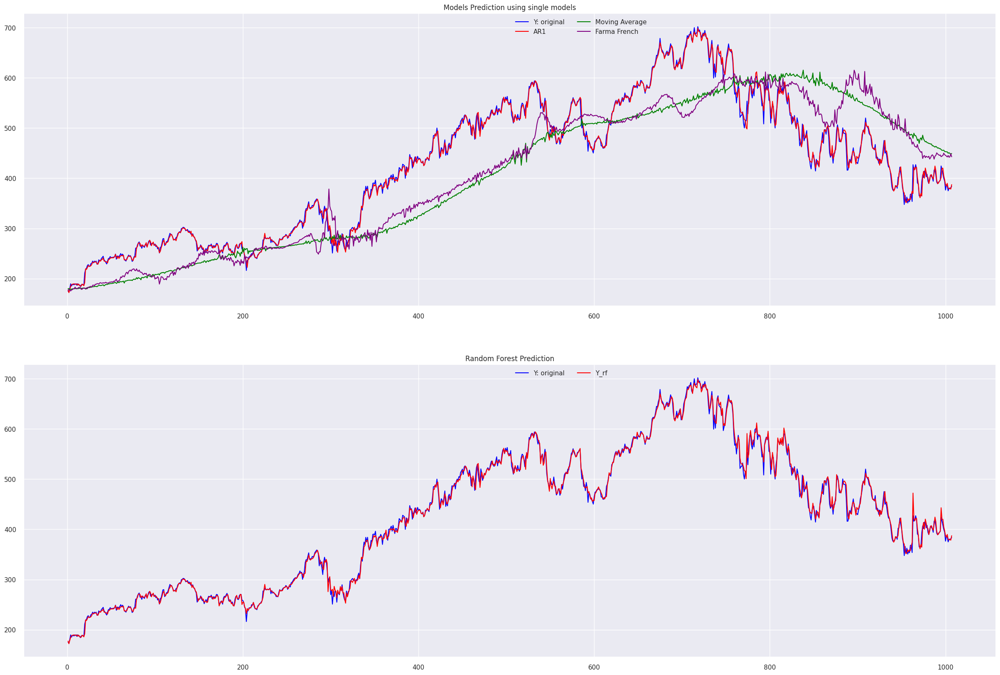

In [459]:
Y_rf,Y, Y_close = Randomforest()

In [ ]:
results = np.stack([Y,Y_rf,Y_close],axis=1)

In [ ]:
final_results = pd.DataFrame(results,columns=['Y','Y_rf','Y_close'])
final_results.head()

,Y,Y_rf,Y_close
0,175.119995,177.304925,169.119995
1,173.009995,172.154813,179.229996
2,180.750000,178.930182,186.669998
3,189.750000,184.722255,188.110001
4,185.259995,188.042670,190.470001


In [ ]:
final_results = final_results.reindex()

In [ ]:
final_results

,Y,Y_rf,Y_close
0,175.119995,177.304925,169.119995
1,173.009995,172.154813,179.229996
2,180.750000,178.930182,186.669998
3,189.750000,184.722255,188.110001
4,185.259995,188.042670,190.470001
...,...,...,...
1002,375.000000,380.563956,381.859985
1003,380.149994,378.765129,380.640015
1004,380.429993,379.840879,376.049988
1005,380.950012,378.390707,389.850006


Simple Moving Average

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
from datetime import datetime
import datetime
import math
import scipy
# extract data from various Internet sources into a pandas DataFrame
import pandas_datareader as web
import matplotlib.dates as mdates
my_year_month_fmt = mdates.DateFormatter('%m/%y')

In [ ]:
import yfinance as yf
import pandas as pd
import datetime
import pandas_datareader.data as web

# Define start and end dates
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2022, 12, 31)

# Fetch the data for NOW stock from Yahoo Finance
ticker="NOW"
df_now = yf.download(ticker, start=start, end=end)
df_now.head()


[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700
2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900
2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900
2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000
2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200


In [ ]:
df_now.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [ ]:
df_now.shape

(1259, 6)

In [ ]:
df_now.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1259 entries, 2018-01-02 to 2022-12-30
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       1259 non-null   float64
 1   High       1259 non-null   float64
 2   Low        1259 non-null   float64
 3   Close      1259 non-null   float64
 4   Adj Close  1259 non-null   float64
 5   Volume     1259 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 68.9 KB


In Stock trading, the **high**, **low** refers to the maximum and the minimum prices in a given time period. **Open** and **Close** are thhighLowOpenClosee prices at which a stock began and ended trading in the same period. **Volume** is the total amount of trading activity. Adjusted values factor in corporate actions such as dividends, stock splits, and new share issuance.

# Moving Average
<br><b>What Is Simple Moving Average (SMA)?</b></br>
<br>A simple moving average (SMA) calculates the average of a selected range of prices, usually closing prices, by the number of periods in that range.</br>
<br>A simple moving average is a technical indicator that can aid in determining if an asset price will continue or if it will reverse a bull or bear trend</br>

# Example 
<br> Simple moving average for 5 days will be to calculate stock prices of last 5 days.</br>
<br>Say last 5 days prices were 25.4,25.9,26.5,26.3 and 27.9 then 
<br>Moving Average= Sum of all the last 5 days stock prices/5 </br>
<br>Moving Average= 26.4 </br>

# How Moving Average is useful ?
<br> Moving averages are an important analytical tool used to identify current price trends and the potential for a change in an established trend.</br> 
<br>The simplest use of an SMA in technical analysis is using it to quickly identify if a security is in an uptrend or downtrend.</br>
<br> The longer the time frame for the moving average, the smoother the simple moving average. A shorter-term moving average is more volatile, but its reading is closer to the source data.</br>

In [ ]:
df_now["20d_sma"]=np.round(df_now["Close"].rolling(window=20,center=False).mean(),5)
df_now["10d_sma"]=np.round(df_now["Close"].rolling(window=10,center=False).mean(),5)
df_now["60d_sma"]=np.round(df_now["Close"].rolling(window=60,center=False).mean(),5)
df_now["30d_sma"]=np.round(df_now["Close"].rolling(window=30,center=False).mean(),5)

df_now.fillna(0,inplace=True)
df_now.tail(10)

,Open,High,Low,Close,Adj Close,Volume,20d_sma,10d_sma,60d_sma,30d_sma
Date,,,,,,,,,,
2022-12-16,399.829987,404.359985,392.140015,394.369995,394.369995,1872500,402.4060,399.095,390.67533,398.40367
2022-12-19,394.299988,397.989990,381.010010,382.299988,382.299988,1396800,401.5520,398.099,390.76300,399.08867
2022-12-20,376.500000,388.369995,375.820007,386.470001,386.470001,954800,401.5065,397.831,391.03583,399.86433
2022-12-21,387.130005,395.359985,381.149994,391.910004,391.910004,963200,401.0880,398.170,391.25183,400.55667
2022-12-22,383.970001,386.769989,373.649994,379.940002,379.940002,1283000,399.6165,396.541,391.10333,401.17900
2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,398.3490,395.369,391.04267,400.43900
2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,397.2845,393.269,391.09317,399.46333
2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,396.2445,389.257,390.83217,398.65167
2022-12-29,380.950012,392.119995,379.010010,389.850006,389.850006,920500,394.9220,386.403,390.47050,397.66400


Text(0, 0.5, 'Price in $')

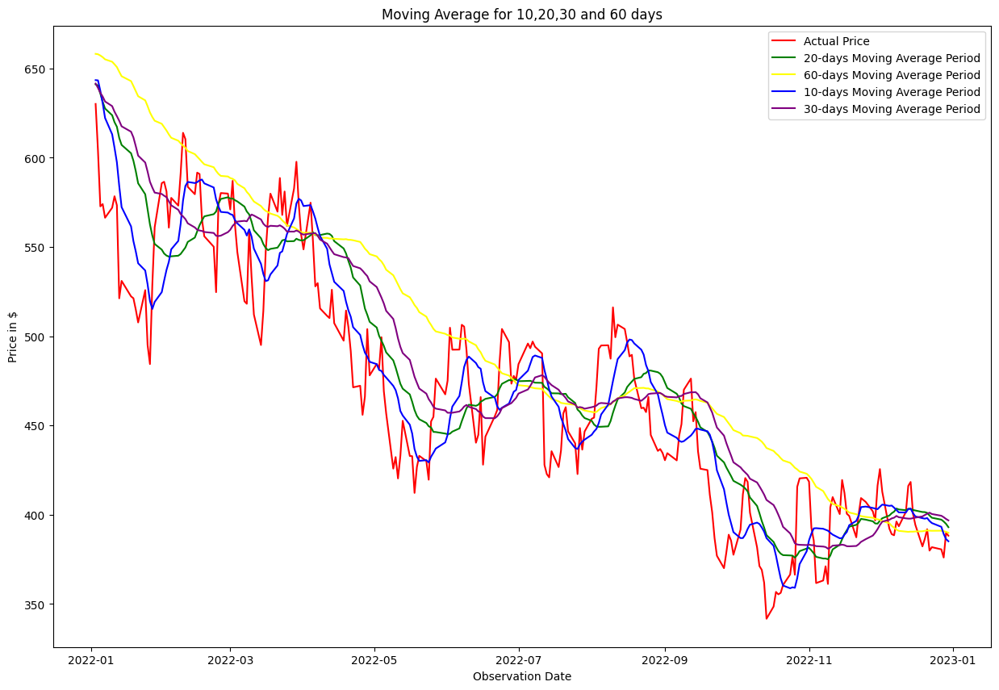

In [ ]:
start_date = '2022-01-01'
end_date = '2022-12-31'

fig, ax = plt.subplots(figsize=(15,10))

ax.plot(df_now.loc[start_date:end_date, :].index, df_now.loc[start_date:end_date, 'Close'], label='Actual Price', color = 'red')
ax.plot(df_now.loc[start_date:end_date, :].index, df_now.loc[start_date:end_date, '20d_sma'], label = '20-days Moving Average Period', color = 'green')
ax.plot(df_now.loc[start_date:end_date, :].index, df_now.loc[start_date:end_date, '60d_sma'], label = '60-days Moving Average Period', color = 'yellow')
ax.plot(df_now.loc[start_date:end_date, :].index, df_now.loc[start_date:end_date, '10d_sma'], label = '10-days Moving Average Period', color = 'blue')
ax.plot(df_now.loc[start_date:end_date, :].index, df_now.loc[start_date:end_date, '30d_sma'], label = '30-days Moving Average Period', color = 'purple')
ax.legend(loc='best')
ax.set_title('Moving Average for 10,20,30 and 60 days')
ax.set_xlabel('Observation Date')
ax.set_ylabel('Price in $')

# Observations:
<br>The 20 days may be of analytical benefit to a shorter-term trader since it follows the price more closely and therefore produces less "lag" but may be more volatile.</br>
<br> While the 60 and 120 days which is more smoother curve may be more beneficial to a longer-term trader.</br>

# Exponential Moving Average

<br><b>What Is an Exponential Moving Average (EMA)?</b></br>
<br>An exponential moving average (EMA) is a type of moving average (MA) that places a greater weight and significance on the most recent data points.</br>
<br>The exponential moving average is also referred to as the exponentially weighted moving average.</br>
<br>An exponentially weighted moving average reacts more significantly to recent price changes than a simple moving average (SMA), which applies an equal weight to all observations in the period </br>


# Usage of EMA
<br>Like all moving averages, this technical indicator is used to produce buy and sell signals based on crossovers and divergences from the historical average.</br>

Text(0, 0.5, 'Price in $')

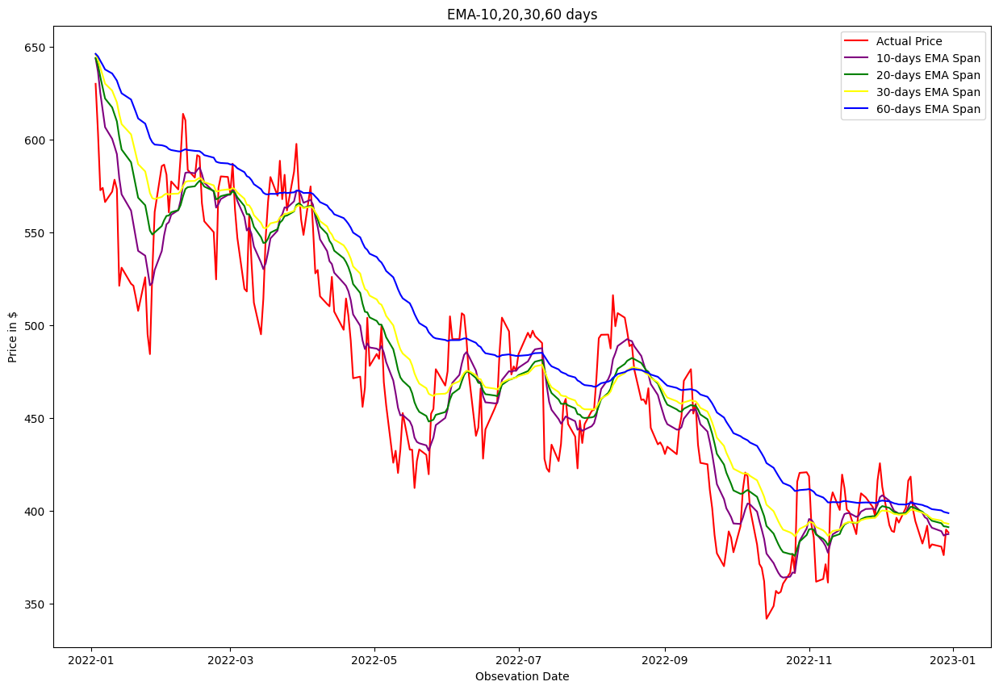

In [ ]:
# ewm(exponential weighted) function in pandas which helps to find exponent
ema_10= df_now.ewm(span=10, adjust=False).mean()
ema_20= df_now.ewm(span=20, adjust=False).mean()
ema_30= df_now.ewm(span=30, adjust=False).mean()
ema_60 = df_now.ewm(span=60, adjust=False).mean()

fig, ax = plt.subplots(figsize=(15,10))

ax.plot(df_now.loc[start_date:end_date, :].index, df_now.loc[start_date:end_date, 'Close'], label='Actual Price', color = 'red')
ax.plot(ema_10.loc[start_date:end_date, :].index, ema_10.loc[start_date:end_date, 'Close'], label = '10-days EMA Span', color = 'purple')
ax.plot(ema_20.loc[start_date:end_date, :].index, ema_20.loc[start_date:end_date, 'Close'], label = '20-days EMA Span', color = 'green')
ax.plot(ema_30.loc[start_date:end_date, :].index, ema_30.loc[start_date:end_date, 'Close'], label = '30-days EMA Span', color = 'yellow')
ax.plot(ema_60.loc[start_date:end_date, :].index, ema_60.loc[start_date:end_date, 'Close'], label = '60-days EMA Span', color = 'blue')

ax.legend(loc='best')
ax.set_title('EMA-10,20,30,60 days')
ax.set_xlabel('Obsevation Date')
ax.set_ylabel('Price in $')

Text(0, 0.5, 'Price in $')

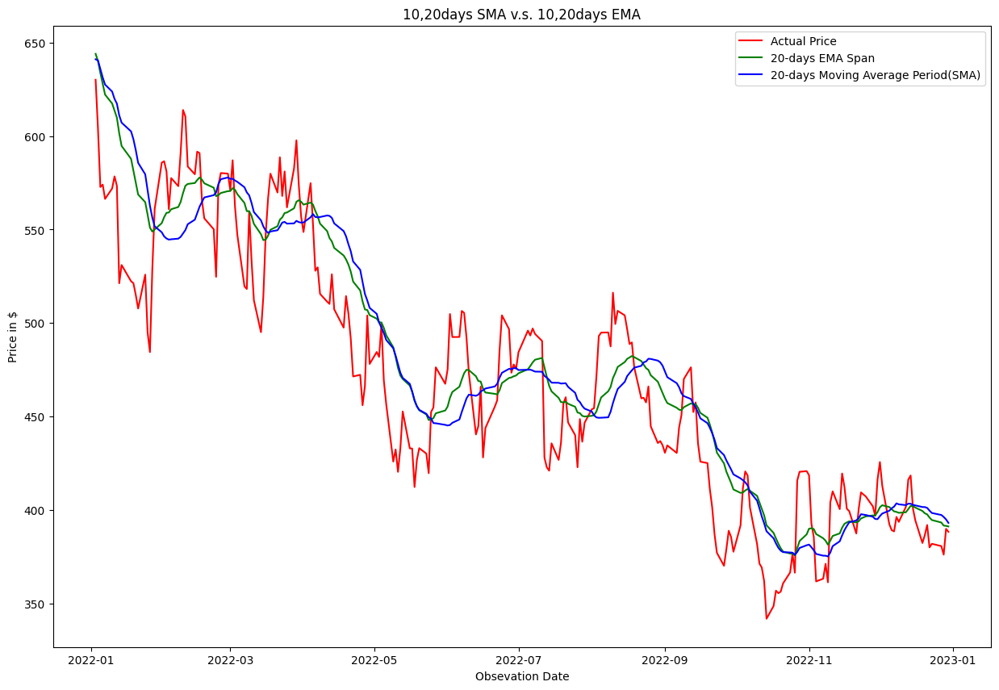

In [ ]:
# Checking difference between SMA for 20 days and EMA for 20 days

fig, ax = plt.subplots(figsize=(15,10))

ax.plot(df_now.loc[start_date:end_date, :].index, df_now.loc[start_date:end_date, 'Close'], label='Actual Price', color = 'red')
ax.plot(ema_20.loc[start_date:end_date, :].index, ema_20.loc[start_date:end_date, 'Close'], label = '20-days EMA Span', color = 'green')
#ax.plot(ema_10.loc[start_date:end_date, :].index, ema_10.loc[start_date:end_date, 'Close'], label = '10-days EMA Span', color = 'yellow')
ax.plot(df_now.loc[start_date:end_date, :].index, df_now.loc[start_date:end_date, '20d_sma'], label = '20-days Moving Average Period(SMA)', color = 'blue')
#ax.plot(df_now.loc[start_date:end_date, :].index, df_now.loc[start_date:end_date, '10d_sma'], label = '10-days Moving Average Period(SMA)', color = 'black')
ax.legend(loc='best')
ax.set_title('10,20days SMA v.s. 10,20days EMA')
ax.set_xlabel('Obsevation Date')
ax.set_ylabel('Price in $')


# Observations
<br>EMA 20 days is closer to Actual than SMA 20 days</br>

In [ ]:
df_now

,Open,High,Low,Close,Adj Close,Volume,20d_sma,10d_sma,60d_sma,30d_sma
Date,,,,,,,,,,
2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,0.0000,0.000,0.00000,0.00000
2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,0.0000,0.000,0.00000,0.00000
2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,0.0000,0.000,0.00000,0.00000
2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,0.0000,0.000,0.00000,0.00000
2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,0.0000,0.000,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...,...
2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,398.3490,395.369,391.04267,400.43900
2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,397.2845,393.269,391.09317,399.46333
2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,396.2445,389.257,390.83217,398.65167


In [ ]:
now_new=pd.DataFrame()
now_new['Actual Close'] = df_now['Close']
now_new['20days EMA Close'] = ema_20['Close']
now_new.tail(20)

,Actual Close,20days EMA Close
Date,,
2022-12-02,412.869995,402.501787
2022-12-05,392.260010,401.526379
2022-12-06,389.149994,400.347676
2022-12-07,388.519989,399.221229
2022-12-08,396.230011,398.936352
2022-12-09,393.579987,398.426222
2022-12-12,401.640015,398.732297
2022-12-13,416.170013,400.393032
2022-12-14,418.390015,402.107030


In [ ]:
ema_20['Close'].tolist

<bound method IndexOpsMixin.tolist of Date
2018-01-02    131.729996
2018-01-03    131.842377
2018-01-04    132.033580
2018-01-05    132.317048
2018-01-08    132.601139
                 ...    
2022-12-23    394.583261
2022-12-27    393.255333
2022-12-28    391.616728
2022-12-29    391.448469
2022-12-30    391.145757
Name: Close, Length: 1259, dtype: float64>

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rmse = sqrt(mean_squared_error(now_new['Actual Close'], now_new['20days EMA Close']))
rmse

19.83962324503546

In [ ]:
def rsquared(x, y):
    """ Return R^2 where x and y are array-like."""

    slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(x, y)
    return r_value**2

In [ ]:
x=now_new['Actual Close'].tolist()
y=now_new['20days EMA Close'].tolist()
rsquared(x,y)

0.9842108765214971

<b><br>Buy if actual actual close price cross 20days EMA from below </br></b>
<b><br>Sell if actual close price cross 20 days EMA from above </br></b>

In [ ]:
for index, row in now_new.iterrows():
    if now_new.loc[index,'Actual Close'] > now_new.loc[index,'20days EMA Close']:
        now_new.loc[index,'Signal'] = 1   
    elif now_new.loc[index,'Actual Close'] < now_new.loc[index,'20days EMA Close']:
        now_new.loc[index,'Signal'] = -1   
    else:
        now_new.loc[index,'Signal'] = 0


In [ ]:
now_new.dropna(axis=0,how='any',inplace=True)
now_new.head()


,Actual Close,20days EMA Close,Signal
Date,,,
2018-01-02,131.729996,131.729996,0.0
2018-01-03,132.910004,131.842377,1.0
2018-01-04,133.850006,132.033580,1.0
2018-01-05,135.009995,132.317048,1.0
2018-01-08,135.300003,132.601139,1.0


In [ ]:
now_new['Signal']= now_new['Signal'].shift(1)
now_new.head(20)

,Actual Close,20days EMA Close,Signal
Date,,,
2018-01-02,131.729996,131.729996,NaN
2018-01-03,132.910004,131.842377,0.0
2018-01-04,133.850006,132.033580,1.0
2018-01-05,135.009995,132.317048,1.0
2018-01-08,135.300003,132.601139,1.0
2018-01-09,135.449997,132.872459,1.0
2018-01-10,136.229996,133.192224,1.0
2018-01-11,137.580002,133.610108,1.0
2018-01-12,138.190002,134.046288,1.0


In [ ]:
now_new['Signal'].value_counts()

 1.0    790
-1.0    467
 0.0      1
Name: Signal, dtype: int64

In [ ]:
now_new['Actual Close'].mean()

376.4249403925525

In [ ]:
initial_amt = 100000
total_shares = 30
print('Account balance ',initial_amt)
print('Initial number of shares owned ',total_shares)
avg_price = 984.46
initial_val = 39533 #initial amount+total_shares*ini_price

for index, row in now_new.iterrows():
    if now_new.loc[index,'Signal'] == 1:
        if (initial_amt - now_new.loc[index,'Actual Close'])> 0 :
            initial_amt -= now_new.loc[index,'Actual Close']
            avg_price = ((avg_price*total_shares)+now_new.loc[index,'Actual Close'])/(total_shares+1)
            total_shares = total_shares + 1;
            now_new.loc[index,'Action'] = "Buy"
        else:
            now_new.loc[index,'Action'] = "Buy Alert"         
    elif now_new.loc[index,'Signal'] == -1:
        if total_shares - 1 > 0 :
            now_new.loc[index,'Action'] = "Sell"
            avg_price = ((avg_price*total_shares)-now_new.loc[index,'Actual Close'])/(total_shares-1)
            initial_amt += now_new.loc[index,'Actual Close'];
            total_shares = total_shares - 1;
        else:
            now_new.loc[index,'Action'] = "Sell Alert"
    else:
        now_new.loc[index,'Action'] = "Hold"

print('----------------Signals Given During Day To Day Trade------------------------')


print(now_new.tail(20))

print('----------------Results-------------------------')
print('Balance left in Account',initial_amt)
print('Total Number of shares ',total_shares)

Account balance  100000
Initial number of shares owned  30
----------------Signals Given During Day To Day Trade------------------------
            Actual Close  20days EMA Close  Signal Action
Date                                                     
2022-12-02    412.869995        402.501787     1.0    Buy
2022-12-05    392.260010        401.526379     1.0    Buy
2022-12-06    389.149994        400.347676    -1.0   Sell
2022-12-07    388.519989        399.221229    -1.0   Sell
2022-12-08    396.230011        398.936352    -1.0   Sell
2022-12-09    393.579987        398.426222    -1.0   Sell
2022-12-12    401.640015        398.732297    -1.0   Sell
2022-12-13    416.170013        400.393032     1.0    Buy
2022-12-14    418.390015        402.107030     1.0    Buy
2022-12-15    400.640015        401.967315     1.0    Buy
2022-12-16    394.369995        401.243760    -1.0   Sell
2022-12-19    382.299988        399.439591    -1.0   Sell
2022-12-20    386.470001        398.204392    -1.0 

In [ ]:
now_new

,Actual Close,20days EMA Close,Signal,Action
Date,,,,
2018-01-02,131.729996,131.729996,NaN,Hold
2018-01-03,132.910004,131.842377,0.0,Hold
2018-01-04,133.850006,132.033580,1.0,Buy
2018-01-05,135.009995,132.317048,1.0,Buy
2018-01-08,135.300003,132.601139,1.0,Buy
...,...,...,...,...
2022-12-23,381.859985,394.583261,-1.0,Sell
2022-12-27,380.640015,393.255333,-1.0,Sell
2022-12-28,376.049988,391.616728,-1.0,Sell


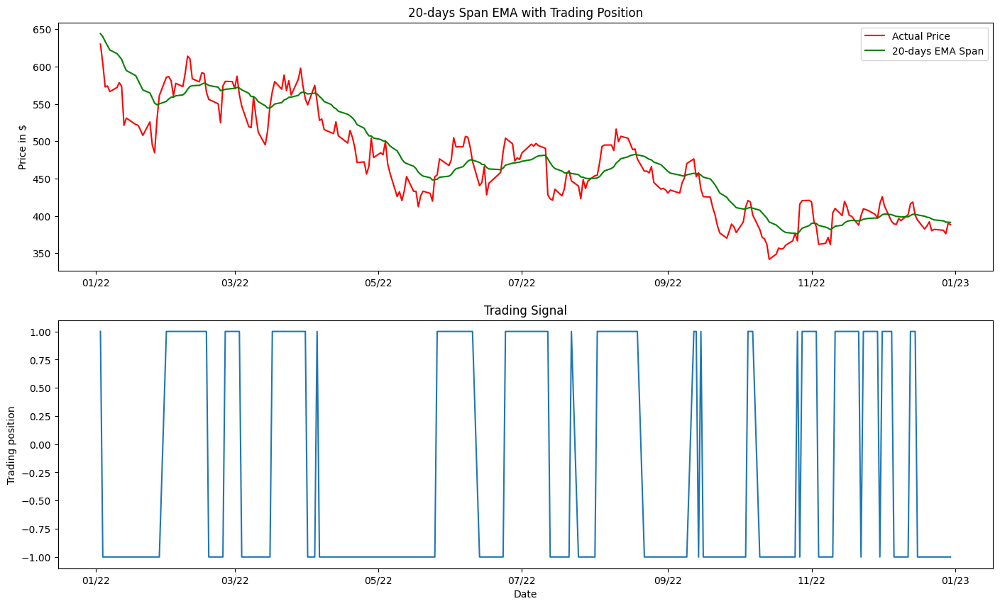

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(17,10))

ax1.plot(now_new.loc[start_date:end_date, :].index, now_new.loc[start_date:end_date, 'Actual Close'], label='Actual Price', color = 'red')
ax1.plot(now_new.loc[start_date:end_date, :].index, now_new.loc[start_date:end_date, '20days EMA Close'], label = '20-days EMA Span', color = 'green')

ax1.set_title('20-days Span EMA with Trading Position')
ax1.set_ylabel('Price in $')
ax1.legend(loc='best')
ax1.xaxis.set_major_formatter(my_year_month_fmt)

ax2.plot(now_new.loc[start_date:end_date, :].index, now_new.loc[start_date:end_date, 'Signal'], 
        label='Trading position')
ax2.set_title('Trading Signal')
ax2.set_xlabel('Date')
ax2.set_ylabel('Trading position')
ax2.xaxis.set_major_formatter(my_year_month_fmt)

In [ ]:
# Conclusions
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Metric", "Scores"]

x.add_row(["RMSE", 39])
x.add_row(["RSquared", 0.995])

print(x)

+----------+--------+
|  Metric  | Scores |
+----------+--------+
|   RMSE   |   39   |
| RSquared | 0.995  |
+----------+--------+


# COMPETITORS MOVING AVERAGE

# ACTUAL V/S SMA for 20 days V/S EMA for 20 days

In [ ]:
NOW

,Open,High,Low,Close,Adj Close,Volume,company_name,MA for 10 days,MA for 20 days,MA for 50 days,20d_sma
Date,,,,,,,,,,,
2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,Service Now,NaN,NaN,NaN,NaN
2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,Service Now,NaN,NaN,NaN,NaN
2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,Service Now,NaN,NaN,NaN,NaN
2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,Service Now,NaN,NaN,NaN,NaN
2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,Service Now,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,Service Now,395.369003,398.349001,391.147201,398.3490
2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,Service Now,393.269003,397.284502,391.924801,397.2845
2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,Service Now,389.257001,396.244501,392.473601,396.2445


In [ ]:
NOW["20d_sma"]=np.round(NOW["Close"].rolling(window=20,center=False).mean(),5)
ema_20= NOW.ewm(span=20, adjust=False).mean()

<ipython-input-36-1718e3a0ad9d>:2: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['company_name'], dtype='object')
  ema_20= NOW.ewm(span=20, adjust=False).mean()


Text(0, 0.5, 'Price in $')

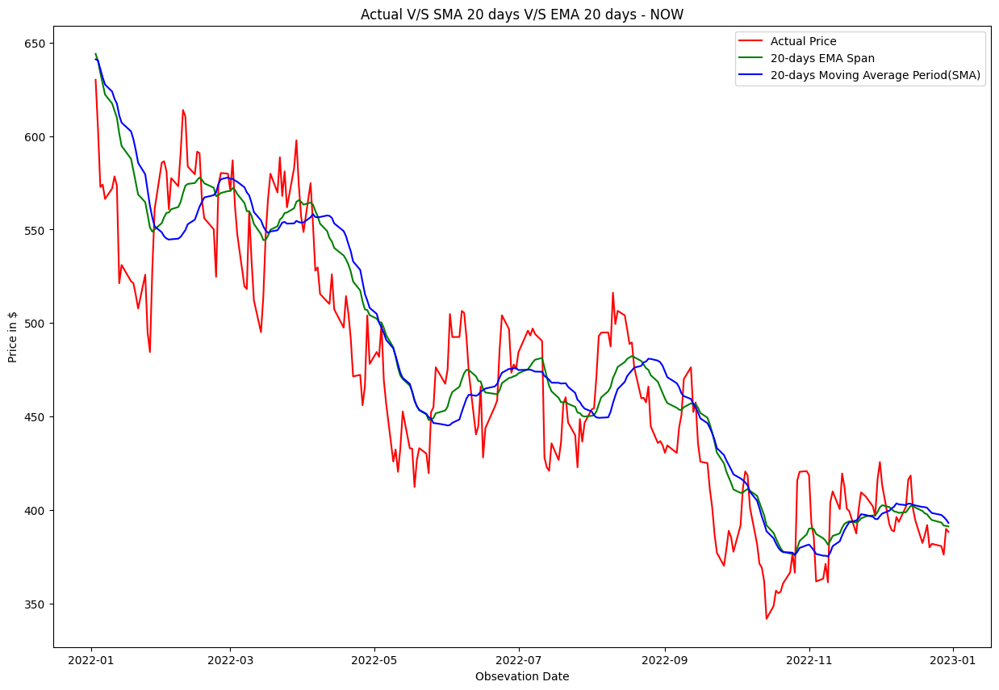

In [ ]:
# Checking difference between SMA for 20 days and EMA for 20 days
start_date = '2022-01-01'
end_date = '2022-12-31'

fig, ax = plt.subplots(figsize=(15,10))

ax.plot(NOW.loc[start_date:end_date, :].index, NOW.loc[start_date:end_date, 'Close'], label='Actual Price', color = 'red')
ax.plot(ema_20.loc[start_date:end_date, :].index, ema_20.loc[start_date:end_date, 'Close'], label = '20-days EMA Span', color = 'green')
#ax.plot(ema_10.loc[start_date:end_date, :].index, ema_10.loc[start_date:end_date, 'Close'], label = '10-days EMA Span', color = 'yellow')
ax.plot(NOW.loc[start_date:end_date, :].index, NOW.loc[start_date:end_date, '20d_sma'], label = '20-days Moving Average Period(SMA)', color = 'blue')
#ax.plot(amzn.loc[start_date:end_date, :].index, amzn.loc[start_date:end_date, '10d_sma'], label = '10-days Moving Average Period(SMA)', color = 'black')
ax.legend(loc='best')
ax.set_title('Actual V/S SMA 20 days V/S EMA 20 days - NOW')
ax.set_xlabel('Obsevation Date')
ax.set_ylabel('Price in $')

In [ ]:
SHOP

,Open,High,Low,Close,Adj Close,Volume,company_name,MA for 10 days,MA for 20 days,MA for 50 days
Date,,,,,,,,,,
2018-01-02,10.159000,10.572000,10.102000,10.549000,10.549000,13945000,Shopify,NaN,NaN,NaN
2018-01-03,10.636000,10.812000,10.617000,10.775000,10.775000,11627000,Shopify,NaN,NaN,NaN
2018-01-04,10.833000,11.006000,10.721000,10.995000,10.995000,11610000,Shopify,NaN,NaN,NaN
2018-01-05,11.055000,11.177000,10.902000,11.058000,11.058000,7710000,Shopify,NaN,NaN,NaN
2018-01-08,10.999000,11.269000,10.999000,11.235000,11.235000,7487000,Shopify,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2022-12-23,34.200001,34.549999,33.105000,33.709999,33.709999,13112800,Shopify,36.395,38.0870,35.2730
2022-12-27,33.060001,33.634998,32.349998,33.389999,33.389999,12400900,Shopify,35.896,37.8550,35.4196
2022-12-28,33.209999,33.700001,32.395000,32.639999,32.639999,13332100,Shopify,35.282,37.6295,35.5172


In [ ]:
SHOP["20d_sma"]=np.round(SHOP["Close"].rolling(window=20,center=False).mean(),5)
ema_20= SHOP.ewm(span=20, adjust=False).mean()

<ipython-input-38-fdba94e21689>:2: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['company_name'], dtype='object')
  ema_20= SHOP.ewm(span=20, adjust=False).mean()


Text(0, 0.5, 'Price in $')

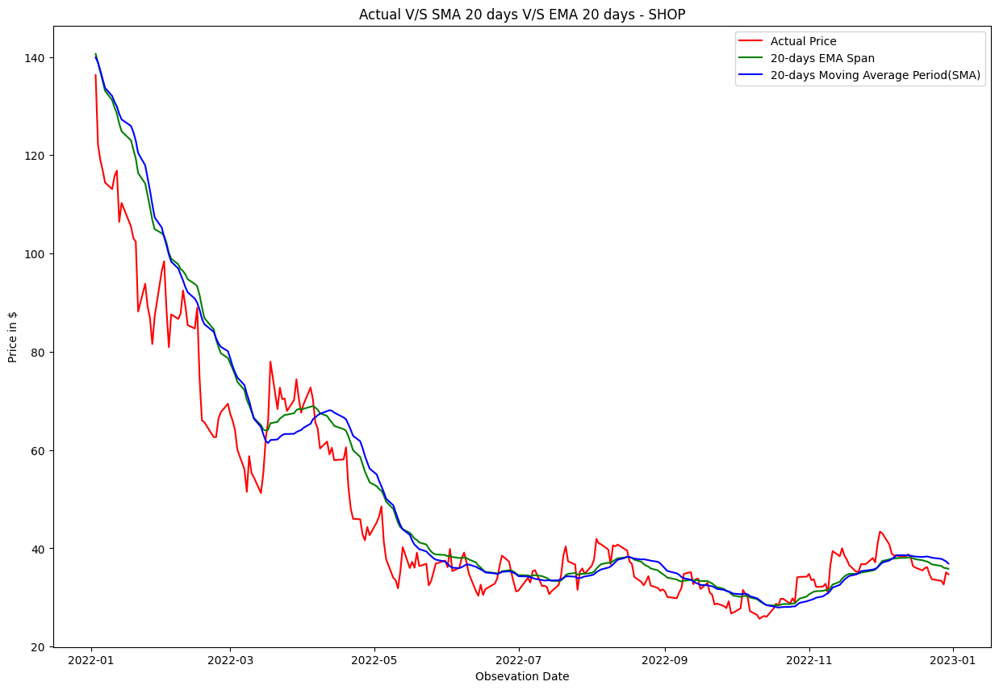

In [ ]:
# Checking difference between SMA for 20 days and EMA for 20 days
start_date = '2022-01-01'
end_date = '2022-12-31'

fig, ax = plt.subplots(figsize=(15,10))

ax.plot(SHOP.loc[start_date:end_date, :].index, SHOP.loc[start_date:end_date, 'Close'], label='Actual Price', color = 'red')
ax.plot(ema_20.loc[start_date:end_date, :].index, ema_20.loc[start_date:end_date, 'Close'], label = '20-days EMA Span', color = 'green')
#ax.plot(ema_10.loc[start_date:end_date, :].index, ema_10.loc[start_date:end_date, 'Close'], label = '10-days EMA Span', color = 'yellow')
ax.plot(SHOP.loc[start_date:end_date, :].index, SHOP.loc[start_date:end_date, '20d_sma'], label = '20-days Moving Average Period(SMA)', color = 'blue')
#ax.plot(amzn.loc[start_date:end_date, :].index, amzn.loc[start_date:end_date, '10d_sma'], label = '10-days Moving Average Period(SMA)', color = 'black')
ax.legend(loc='best')
ax.set_title('Actual V/S SMA 20 days V/S EMA 20 days - SHOP')
ax.set_xlabel('Obsevation Date')
ax.set_ylabel('Price in $')

In [ ]:
VMW

,Open,High,Low,Close,Adj Close,Volume,company_name,MA for 10 days,MA for 20 days,MA for 50 days
Date,,,,,,,,,,
2018-01-02,126.199997,127.489998,125.720001,127.290001,86.737541,1285700,VMWare,NaN,NaN,NaN
2018-01-03,127.980003,130.990005,127.800003,130.029999,88.604622,1876400,VMWare,NaN,NaN,NaN
2018-01-04,130.380005,132.800003,130.169998,131.240005,89.429138,1659500,VMWare,NaN,NaN,NaN
2018-01-05,131.750000,132.289993,131.000000,131.259995,89.442757,995500,VMWare,NaN,NaN,NaN
2018-01-08,131.000000,131.130005,130.000000,130.899994,89.197449,1277100,VMWare,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2022-12-23,121.129997,121.589996,120.830002,121.419998,121.419998,287400,VMWare,122.185999,120.9050,115.9326
2022-12-27,121.110001,121.720001,120.919998,121.330002,121.330002,936500,VMWare,122.057999,121.0955,116.2358
2022-12-28,121.150002,122.070000,120.089996,120.190002,120.190002,689900,VMWare,121.707000,121.2035,116.4832


In [ ]:
VMW["20d_sma"]=np.round(VMW["Close"].rolling(window=20,center=False).mean(),5)
ema_20= VMW.ewm(span=20, adjust=False).mean()

<ipython-input-40-66a8086e0c5e>:2: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['company_name'], dtype='object')
  ema_20= VMW.ewm(span=20, adjust=False).mean()


Text(0, 0.5, 'Price in $')

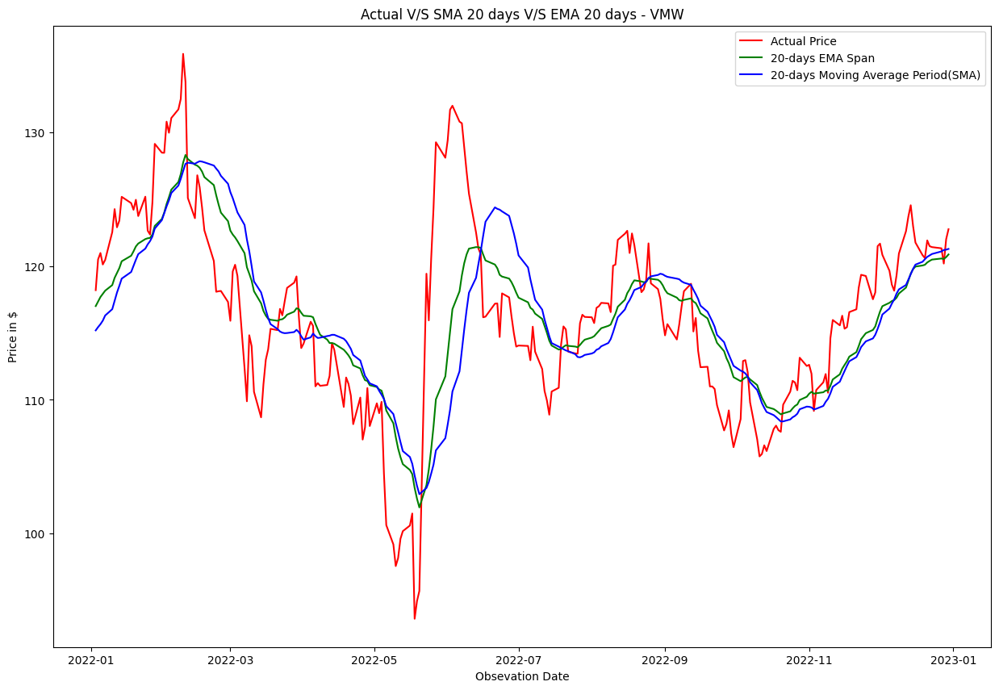

In [ ]:
# Checking difference between SMA for 20 days and EMA for 20 days
start_date = '2022-01-01'
end_date = '2022-12-31'

fig, ax = plt.subplots(figsize=(15,10))

ax.plot(VMW.loc[start_date:end_date, :].index, VMW.loc[start_date:end_date, 'Close'], label='Actual Price', color = 'red')
ax.plot(ema_20.loc[start_date:end_date, :].index, ema_20.loc[start_date:end_date, 'Close'], label = '20-days EMA Span', color = 'green')
#ax.plot(ema_10.loc[start_date:end_date, :].index, ema_10.loc[start_date:end_date, 'Close'], label = '10-days EMA Span', color = 'yellow')
ax.plot(VMW.loc[start_date:end_date, :].index, VMW.loc[start_date:end_date, '20d_sma'], label = '20-days Moving Average Period(SMA)', color = 'blue')
#ax.plot(VMW.loc[start_date:end_date, :].index, VMW.loc[start_date:end_date, '10d_sma'], label = '10-days Moving Average Period(SMA)', color = 'black')
ax.legend(loc='best')
ax.set_title('Actual V/S SMA 20 days V/S EMA 20 days - VMW')
ax.set_xlabel('Obsevation Date')
ax.set_ylabel('Price in $')

In [ ]:
ADSK

,Open,High,Low,Close,Adj Close,Volume,company_name,MA for 10 days,MA for 20 days,MA for 50 days
Date,,,,,,,,,,
2018-01-02,105.339996,107.160004,104.389999,107.120003,107.120003,2040600,Autodesk,NaN,NaN,NaN
2018-01-03,107.000000,109.779999,106.989998,109.379997,109.379997,1953800,Autodesk,NaN,NaN,NaN
2018-01-04,110.129997,112.209999,109.230003,112.070000,112.070000,2158700,Autodesk,NaN,NaN,NaN
2018-01-05,113.070000,113.349998,110.410004,110.839996,110.839996,2384200,Autodesk,NaN,NaN,NaN
2018-01-08,110.419998,111.739998,109.040001,111.419998,111.419998,1782100,Autodesk,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2022-12-23,186.360001,188.800003,185.759995,188.160004,188.160004,941100,Autodesk,193.442000,195.610999,202.648200
2022-12-27,188.070007,188.070007,185.300003,186.289993,186.289993,914100,Autodesk,192.082999,195.157999,202.577800
2022-12-28,184.490005,187.410004,181.589996,181.899994,181.899994,1172100,Autodesk,189.970998,194.493999,202.241800


In [ ]:
ADSK["20d_sma"]=np.round(ADSK["Close"].rolling(window=20,center=False).mean(),5)
ema_20= ADSK.ewm(span=20, adjust=False).mean()

<ipython-input-43-a3fe552ced46>:2: FutureWarning: Dropping of nuisance columns in rolling operations is deprecated; in a future version this will raise TypeError. Select only valid columns before calling the operation. Dropped columns were Index(['company_name'], dtype='object')
  ema_20= ADSK.ewm(span=20, adjust=False).mean()


Text(0, 0.5, 'Price in $')

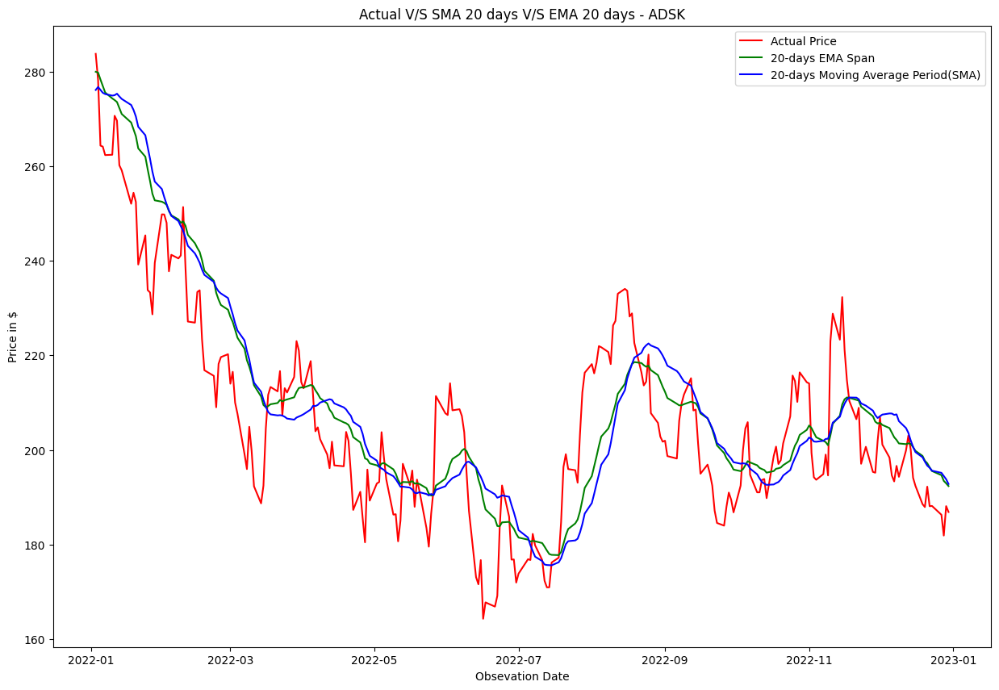

In [ ]:
# Checking difference between SMA for 20 days and EMA for 20 days
start_date = '2022-01-01'
end_date = '2022-12-31'

fig, ax = plt.subplots(figsize=(15,10))

ax.plot(ADSK.loc[start_date:end_date, :].index, ADSK.loc[start_date:end_date, 'Close'], label='Actual Price', color = 'red')
ax.plot(ema_20.loc[start_date:end_date, :].index, ema_20.loc[start_date:end_date, 'Close'], label = '20-days EMA Span', color = 'green')
#ax.plot(ema_10.loc[start_date:end_date, :].index, ema_10.loc[start_date:end_date, 'Close'], label = '10-days EMA Span', color = 'yellow')
ax.plot(ADSK.loc[start_date:end_date, :].index, ADSK.loc[start_date:end_date, '20d_sma'], label = '20-days Moving Average Period(SMA)', color = 'blue')
#ax.plot(ADSK.loc[start_date:end_date, :].index, ADSK.loc[start_date:end_date, '10d_sma'], label = '10-days Moving Average Period(SMA)', color = 'black')
ax.legend(loc='best')
ax.set_title('Actual V/S SMA 20 days V/S EMA 20 days - ADSK')
ax.set_xlabel('Obsevation Date')
ax.set_ylabel('Price in $')

CALCULATING RETURNS FOR EACH STOCK

Text(0, 0.5, 'Cumilative log returns')

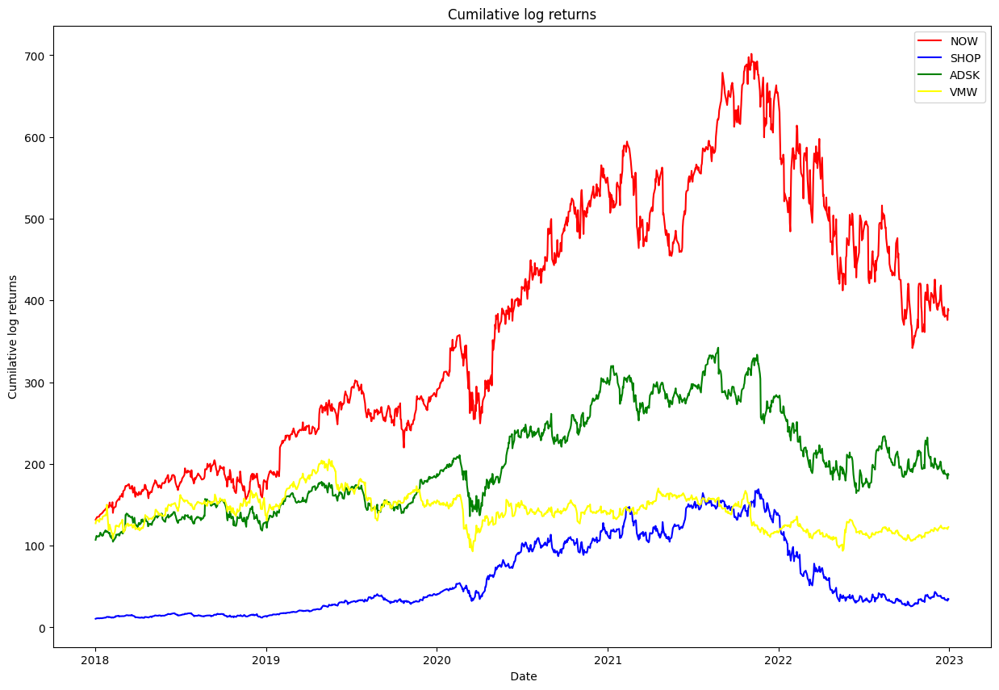

In [ ]:
start_date = '2018-01-01'
end_date = '2022-12-31'

fig, ax = plt.subplots(figsize=(15,10))

ax.plot(NOW.loc[start_date:end_date, :].index, NOW.loc[start_date:end_date, 'Close'], label='NOW', color = 'red')
ax.plot(SHOP.loc[start_date:end_date, :].index, SHOP.loc[start_date:end_date, 'Close'], label='SHOP', color = 'blue')
ax.plot(ADSK.loc[start_date:end_date, :].index, ADSK.loc[start_date:end_date, 'Close'], label='ADSK', color = 'green')
ax.plot(VMW.loc[start_date:end_date, :].index, VMW.loc[start_date:end_date, 'Close'], label='VMW', color = 'yellow')

ax.legend(loc='best')
ax.set_title('Cumilative log returns')
ax.set_xlabel(' Date')
ax.set_ylabel('Cumilative log returns')

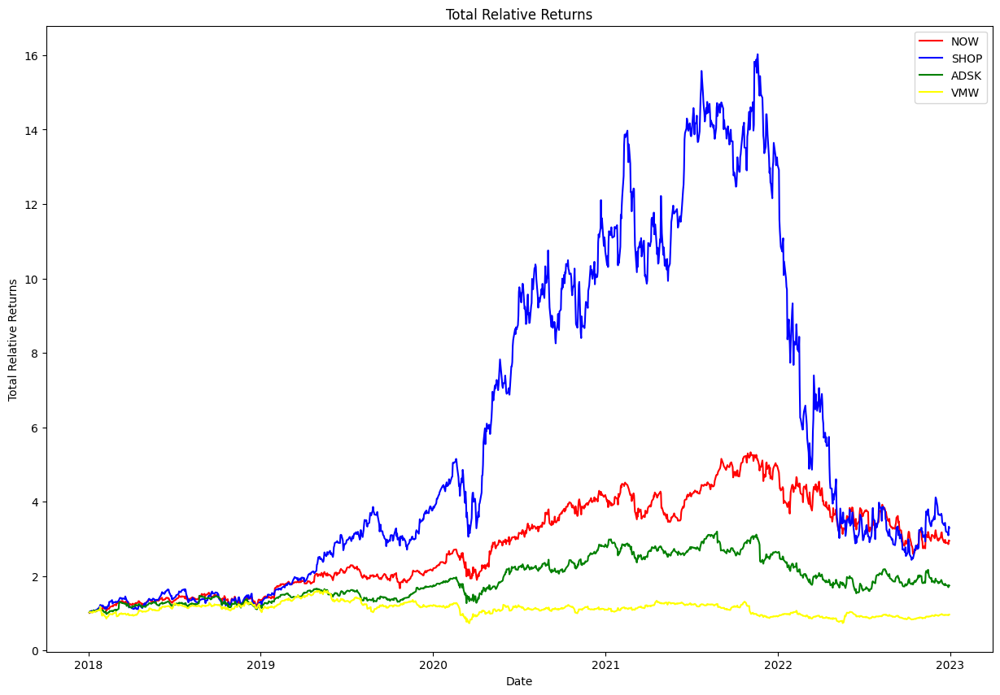

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

start_date = '2018-01-01'
end_date = '2022-12-31'

fig, ax = plt.subplots(figsize=(15, 10))

# Calculate total relative returns for each stock
NOW_relative_returns = NOW.loc[start_date:end_date, 'Close'].pct_change().add(1).cumprod()
SHOP_relative_returns = SHOP.loc[start_date:end_date, 'Close'].pct_change().add(1).cumprod()
ADSK_relative_returns = ADSK.loc[start_date:end_date, 'Close'].pct_change().add(1).cumprod()
VMW_relative_returns = VMW.loc[start_date:end_date, 'Close'].pct_change().add(1).cumprod()

# Plot total relative returns
ax.plot(NOW_relative_returns.index, NOW_relative_returns, label='NOW', color='red')
ax.plot(SHOP_relative_returns.index, SHOP_relative_returns, label='SHOP', color='blue')
ax.plot(ADSK_relative_returns.index, ADSK_relative_returns, label='ADSK', color='green')
ax.plot(VMW_relative_returns.index, VMW_relative_returns, label='VMW', color='yellow')

ax.legend(loc='best')
ax.set_title('Total Relative Returns')
ax.set_xlabel('Date')
ax.set_ylabel('Total Relative Returns')

plt.show()


CALCULATING RMSE FOR NOW AND COMPETITORS


In [ ]:
NOW

,Open,High,Low,Close,Adj Close,Volume,company_name,MA for 10 days,MA for 20 days,MA for 50 days
Date,,,,,,,,,,
2018-01-02,131.000000,132.350006,130.139999,131.729996,131.729996,1282700,Service Now,NaN,NaN,NaN
2018-01-03,132.000000,133.250000,131.740005,132.910004,132.910004,1580900,Service Now,NaN,NaN,NaN
2018-01-04,133.880005,135.089996,133.779999,133.850006,133.850006,1361900,Service Now,NaN,NaN,NaN
2018-01-05,134.949997,135.130005,133.899994,135.009995,135.009995,1183000,Service Now,NaN,NaN,NaN
2018-01-08,135.050003,136.089996,134.869995,135.300003,135.300003,1337200,Service Now,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2022-12-23,375.000000,381.899994,371.470001,381.859985,381.859985,856600,Service Now,395.369003,398.349001,391.147201
2022-12-27,380.149994,383.829987,374.109985,380.640015,380.640015,828900,Service Now,393.269003,397.284502,391.924801
2022-12-28,380.429993,385.619995,372.739990,376.049988,376.049988,772100,Service Now,389.257001,396.244501,392.473601


In [ ]:
NOW1 = NOW.dropna()

# RMSE for NOW

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse_NOW = sqrt(mean_squared_error(NOW1['Close'],NOW1['MA for 20 days']))
print('rmse_NOW','=',rmse_NOW)

rmse_NOW = 24.040946413936727


In [ ]:
SHOP

,Open,High,Low,Close,Adj Close,Volume,company_name,MA for 10 days,MA for 20 days,MA for 50 days
Date,,,,,,,,,,
2018-01-02,10.159000,10.572000,10.102000,10.549000,10.549000,13945000,Shopify,NaN,NaN,NaN
2018-01-03,10.636000,10.812000,10.617000,10.775000,10.775000,11627000,Shopify,NaN,NaN,NaN
2018-01-04,10.833000,11.006000,10.721000,10.995000,10.995000,11610000,Shopify,NaN,NaN,NaN
2018-01-05,11.055000,11.177000,10.902000,11.058000,11.058000,7710000,Shopify,NaN,NaN,NaN
2018-01-08,10.999000,11.269000,10.999000,11.235000,11.235000,7487000,Shopify,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2022-12-23,34.200001,34.549999,33.105000,33.709999,33.709999,13112800,Shopify,36.395,38.0870,35.2730
2022-12-27,33.060001,33.634998,32.349998,33.389999,33.389999,12400900,Shopify,35.896,37.8550,35.4196
2022-12-28,33.209999,33.700001,32.395000,32.639999,32.639999,13332100,Shopify,35.282,37.6295,35.5172


In [ ]:
SHOP1 = SHOP.dropna()

# RMSE for Shopify

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse_Shopify = sqrt(mean_squared_error(SHOP1['Close'],SHOP1['MA for 20 days']))
print('rmse_Shopify','=',rmse_Shopify)

rmse_Shopify = 6.777763209928304


In [ ]:
ADSK

,Open,High,Low,Close,Adj Close,Volume,company_name,MA for 10 days,MA for 20 days,MA for 50 days
Date,,,,,,,,,,
2018-01-02,105.339996,107.160004,104.389999,107.120003,107.120003,2040600,Autodesk,NaN,NaN,NaN
2018-01-03,107.000000,109.779999,106.989998,109.379997,109.379997,1953800,Autodesk,NaN,NaN,NaN
2018-01-04,110.129997,112.209999,109.230003,112.070000,112.070000,2158700,Autodesk,NaN,NaN,NaN
2018-01-05,113.070000,113.349998,110.410004,110.839996,110.839996,2384200,Autodesk,NaN,NaN,NaN
2018-01-08,110.419998,111.739998,109.040001,111.419998,111.419998,1782100,Autodesk,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2022-12-23,186.360001,188.800003,185.759995,188.160004,188.160004,941100,Autodesk,193.442000,195.610999,202.648200
2022-12-27,188.070007,188.070007,185.300003,186.289993,186.289993,914100,Autodesk,192.082999,195.157999,202.577800
2022-12-28,184.490005,187.410004,181.589996,181.899994,181.899994,1172100,Autodesk,189.970998,194.493999,202.241800


In [ ]:
ADSK1 = ADSK.dropna()

# RMSE for Autodesk

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse_Autodesk = sqrt(mean_squared_error(ADSK1['Close'],ADSK1['MA for 20 days']))
print('rmse_Autodesk','=',rmse_Autodesk)

rmse_Autodesk = 12.356666838116015


In [ ]:
VMW

,Open,High,Low,Close,Adj Close,Volume,company_name,MA for 10 days,MA for 20 days,MA for 50 days
Date,,,,,,,,,,
2018-01-02,126.199997,127.489998,125.720001,127.290001,86.737541,1285700,VMWare,NaN,NaN,NaN
2018-01-03,127.980003,130.990005,127.800003,130.029999,88.604622,1876400,VMWare,NaN,NaN,NaN
2018-01-04,130.380005,132.800003,130.169998,131.240005,89.429138,1659500,VMWare,NaN,NaN,NaN
2018-01-05,131.750000,132.289993,131.000000,131.259995,89.442757,995500,VMWare,NaN,NaN,NaN
2018-01-08,131.000000,131.130005,130.000000,130.899994,89.197449,1277100,VMWare,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2022-12-23,121.129997,121.589996,120.830002,121.419998,121.419998,287400,VMWare,122.185999,120.9050,115.9326
2022-12-27,121.110001,121.720001,120.919998,121.330002,121.330002,936500,VMWare,122.057999,121.0955,116.2358
2022-12-28,121.150002,122.070000,120.089996,120.190002,120.190002,689900,VMWare,121.707000,121.2035,116.4832


In [ ]:
VMW1 = VMW.dropna()

# RMSE for VMWare


In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse_VMWare = sqrt(mean_squared_error(VMW1['Close'],VMW1['MA for 20 days']))
print('rmse_VMWare','=',rmse_VMWare)

rmse_VMWare = 29.758741381764587
